In [48]:
import yt
import unyt
# import yt_idv
import caesar
# %matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
# from matplotlib.patches import Rectangle

import sklearn
import pprint

import os
import copy
import gc

In [49]:
gc.isenabled()

True

In [50]:
def euclidean_distance(a, b):
    assert np.shape(a) == np.shape(b), f'Shapes of a and b are different'
    return(np.sqrt(np.sum((a-b)**2, axis=np.ndim(a)-1, keepdims=True)))

# Redshift 0 snapshot

## Load particle information from redshift 0 snapshot with yt

In [4]:
res_level = '1'
halo_id = '3224'
snap_num0 = 151

In [5]:
# snap_file0 = f'/home/b/babul/wcui/data/HYENAS/Level{res_level}/halo_{halo_id}/snap_halo_{halo_id}_{snap_num0:03}.hdf5'
snap_file0 = f'/scratch/b/babul/aspadawe/snapshots/HyenasC/L{res_level}/halo_{halo_id}_v3/snapshot_{snap_num0:03}.hdf5'
# snap_file0 = f'/scratch/b/babul/aspadawe/snapshots/Hyenasc_L{res_level}_zooms/halo_{halo_id}/snap_halo_{halo_id}_{snap_num0:03}.hdf5'
snap0 = yt.load(snap_file0)

yt : [INFO     ] 2025-07-07 18:09:42,743 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:09:42,757 Calculating time from 1.000e+00 to be 4.375e+17 seconds
yt : [INFO     ] 2025-07-07 18:09:42,758 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:09:42,856 Parameters: current_time              = 4.3748565942961094e+17 s
yt : [INFO     ] 2025-07-07 18:09:42,857 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:09:42,858 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:09:42,858 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:09:42,859 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:09:42,859 Parameters: current_redshift          = 4.440892098500626e-16
yt : [INFO     ] 2025-07-07 18:09:42,859 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:09:42,860 

## Information for redshift 0 snapshot

In [6]:
age0 = snap0.current_time.in_units('Gyr')

In [7]:
age0

unyt_quantity(13.86308399, 'Gyr')

In [8]:
redshift0 = snap0.current_redshift

In [9]:
redshift0

np.float64(4.440892098500626e-16)

In [10]:
snap0.field_list

yt : [INFO     ] 2025-07-07 18:09:43,249 Allocating for 4.317e+07 particles
Loading particle index: 100%|██████████| 78/78 [00:00<00:00, 3607.57it/s]


[('PartType0', 'AGS-Softening'),
 ('PartType0', 'AccKey'),
 ('PartType0', 'Coordinates'),
 ('PartType0', 'DelayTime'),
 ('PartType0', 'Density'),
 ('PartType0', 'Dust_Masses'),
 ('PartType0', 'Dust_Metallicity'),
 ('PartType0', 'ElectronAbundance'),
 ('PartType0', 'FractionH2'),
 ('PartType0', 'GrackleHI'),
 ('PartType0', 'GrackleHII'),
 ('PartType0', 'GrackleHM'),
 ('PartType0', 'GrackleHeI'),
 ('PartType0', 'GrackleHeII'),
 ('PartType0', 'GrackleHeIII'),
 ('PartType0', 'HaloID'),
 ('PartType0', 'ID_Generations'),
 ('PartType0', 'InternalEnergy'),
 ('PartType0', 'Masses'),
 ('PartType0', 'Metallicity_00'),
 ('PartType0', 'Metallicity_01'),
 ('PartType0', 'Metallicity_02'),
 ('PartType0', 'Metallicity_03'),
 ('PartType0', 'Metallicity_04'),
 ('PartType0', 'Metallicity_05'),
 ('PartType0', 'Metallicity_06'),
 ('PartType0', 'Metallicity_07'),
 ('PartType0', 'Metallicity_08'),
 ('PartType0', 'Metallicity_09'),
 ('PartType0', 'Metallicity_10'),
 ('PartType0', 'Metallicity_11'),
 ('PartType

In [11]:
snap0.derived_field_list

[('PartType0', 'AGS-Softening'),
 ('PartType0', 'AccKey'),
 ('PartType0', 'C_metallicity'),
 ('PartType0', 'C_nuclei_density'),
 ('PartType0', 'C_nuclei_mass_density'),
 ('PartType0', 'Ca_metallicity'),
 ('PartType0', 'Ca_nuclei_density'),
 ('PartType0', 'Ca_nuclei_mass_density'),
 ('PartType0', 'Coordinates'),
 ('PartType0', 'DelayTime'),
 ('PartType0', 'Density'),
 ('PartType0', 'Dust_Masses'),
 ('PartType0', 'Dust_Metallicity'),
 ('PartType0', 'El_number_density'),
 ('PartType0', 'ElectronAbundance'),
 ('PartType0', 'Fe_metallicity'),
 ('PartType0', 'Fe_nuclei_density'),
 ('PartType0', 'Fe_nuclei_mass_density'),
 ('PartType0', 'FractionH2'),
 ('PartType0', 'GrackleHI'),
 ('PartType0', 'GrackleHII'),
 ('PartType0', 'GrackleHM'),
 ('PartType0', 'GrackleHeI'),
 ('PartType0', 'GrackleHeII'),
 ('PartType0', 'GrackleHeIII'),
 ('PartType0', 'H_nuclei_density'),
 ('PartType0', 'H_p0_density'),
 ('PartType0', 'H_p0_fraction'),
 ('PartType0', 'H_p0_mass'),
 ('PartType0', 'H_p0_number_density'

In [12]:
snap0.domain_width.in_units('Mpc/h')

unyt_array([200., 200., 200.], 'Mpc/h')

In [13]:
snap0.particle_types

('PartType4',
 'PartType5',
 'PartType0',
 'PartType2',
 'PartType1',
 'all',
 'nbody')

In [14]:
snap0.particle_types_raw

('PartType4', 'PartType5', 'PartType0', 'PartType2', 'PartType1')

In [15]:
snap0.particle_type_counts

{'PartType0': np.int64(18134661),
 'PartType1': np.int64(20206760),
 'PartType2': np.int64(3336796),
 'PartType3': np.int64(0),
 'PartType4': np.int64(1493743),
 'PartType5': np.int64(1500)}

## Load caesar file of redshift 0 snapshot

In [16]:
# caesar_file0 = f'/home/b/babul/wcui/data/HYENAS/Level{res_level}/halo_{halo_id}/Groups/Caesar_halo_{halo_id}_{snap_num0:03}.hdf5'
caesar_file0 = f'/scratch/b/babul/aspadawe/snapshots/HyenasC/L{res_level}/halo_{halo_id}_v3/caesar_fof/caesar_{snap_num0:03}_haloid-fof_lowres-[2].hdf5'
# caesar_file0 = f'/scratch/b/babul/aspadawe/snapshots/Hyenasc_L{res_level}_zooms/halo_{halo_id}/groups_fof/caesar_halo_{halo_id}_{snap_num0:03}.hdf5'
obj0 = caesar.load(caesar_file0)

yt : [INFO     ] 2025-07-07 18:09:44,824 Opening /scratch/b/babul/aspadawe/snapshots/HyenasC/L1/halo_3224_v3/caesar_fof/caesar_151_haloid-fof_lowres-[2].hdf5
yt : [INFO     ] 2025-07-07 18:09:44,968 Found 17826 halos
yt : [INFO     ] 2025-07-07 18:09:44,973 Found 1343 galaxies


## Find desired halo in redshift 0 snapshot

In [17]:
target_m500c = unyt.unyt_array(1e13, 'Msun')

In [18]:
target_m500c

unyt_array(1.e+13, 'Msun')

In [19]:
halo_minpotpos_z0 = unyt.unyt_array([halo.minpotpos.in_units('Mpc') for halo in obj0.halos])

In [20]:
halo_minpotpos_z0

unyt_array([[151.5378 , 142.02698, 143.50592],
       [154.3627 , 135.25156, 153.67426],
       [154.63628, 131.84274, 157.89807],
       ...,
       [153.60385, 142.53827, 140.07906],
       [154.58983, 133.1542 , 155.59209],
       [152.70085, 140.28896, 146.25719]], shape=(17826, 3), dtype=float32, units='Mpc')

In [21]:
len(halo_minpotpos_z0)

17826

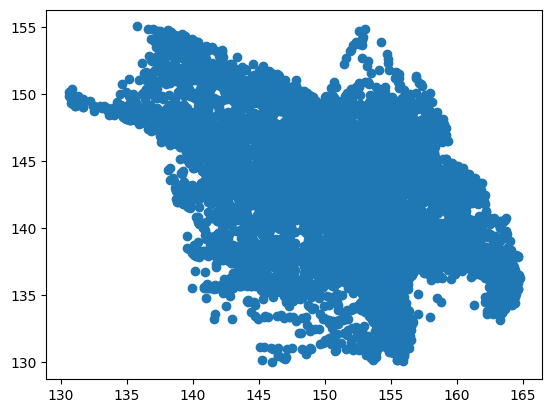

In [22]:
plt.scatter(halo_minpotpos_z0[:,0], halo_minpotpos_z0[:,1])

In [23]:
halo_m500c_z0 = unyt.unyt_array([halo.virial_quantities['m500c'] for halo in obj0.halos])

In [24]:
halo_m500c_z0

unyt_array([8.47041633e+12, 6.26862116e+12, 4.88252165e+12, ...,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00], shape=(17826,), units='Msun')

In [25]:
halo_contamination_z0 = unyt.unyt_array([halo.contamination for halo in obj0.halos])

In [26]:
halo_contamination_z0

unyt_array([0.        , 0.00345884, 0.11162941, ..., 0.        , 0.        ,
       0.        ], shape=(17826,), units='(dimensionless)')

In [27]:
halo_nonzero_contamination_index_z0 = np.nonzero(np.array(halo_contamination_z0)!=0)[0]

In [28]:
halo_nonzero_contamination_index_z0

array([    1,     2,     6,     7,     8,     9,    10,    12,    13,
          16,    17,    18,    20,    22,    26,    27,    30,    31,
          33,    34,    35,    42,    48,    52,    53,    54,    55,
          57,    58,    59,    60,    63,    68,    70,    72,    74,
          77,    80,    83,    88,    91,    93,    94,    96,    97,
          98,   102,   104,   106,   112,   113,   115,   119,   120,
         122,   125,   132,   133,   134,   139,   141,   144,   146,
         147,   152,   153,   155,   158,   159,   176,   177,   179,
         184,   185,   188,   190,   193,   194,   196,   202,   203,
         209,   210,   213,   220,   223,   225,   229,   231,   238,
         240,   242,   251,   253,   261,   266,   267,   268,   271,
         277,   278,   280,   287,   288,   289,   290,   291,   292,
         295,   298,   299,   308,   310,   314,   316,   319,   324,
         326,   329,   330,   337,   342,   345,   352,   357,   360,
         364,   365,

In [29]:
halo_contamination0_index_z0 = np.nonzero(np.array(halo_contamination_z0)==0)[0]
# halo_contamination0_index = np.array(halo_contamination)==0

In [30]:
halo_contamination0_index_z0

array([    0,     3,     4, ..., 17823, 17824, 17825], shape=(17112,))

In [31]:
value_of_contamination0_z0 = min(np.log10(halo_contamination_z0)[np.array(halo_contamination_z0)>0])-1

/project/b/babul/aspadawe/pyenvs/visualize_with_yt_ondemand/lib/python3.13/site-packages/unyt/array.py:1832: RuntimeWarning: divide by zero encountered in log10
  out_arr = func(np.asarray(inp), out=out_func, **kwargs)


/tmp/ipykernel_4170908/2924375891.py:2: RuntimeWarning: divide by zero encountered in log10
  plt.scatter(np.log10(np.array(halo_m500c_z0)[halo_contamination0_index_z0]),


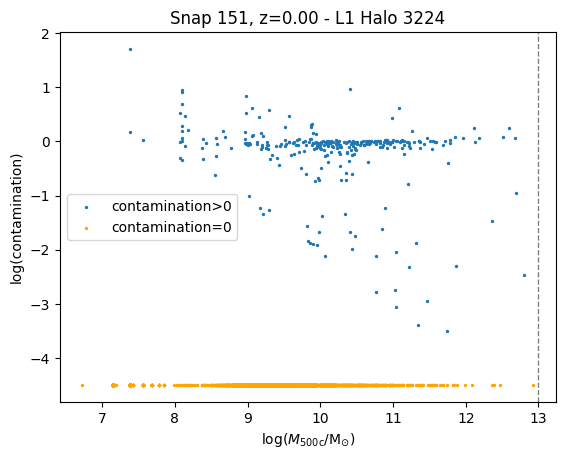

In [32]:
plt.scatter(np.log10(halo_m500c_z0), np.log10(halo_contamination_z0), s=2, label='contamination>0')
plt.scatter(np.log10(np.array(halo_m500c_z0)[halo_contamination0_index_z0]),
            np.full(len(halo_contamination0_index_z0), value_of_contamination0_z0),
            s=2, color='orange', label='contamination=0')
plt.axvline(np.log10(target_m500c), ls='--', lw=1, color='grey')
plt.title(f'Snap {snap_num0}, z={redshift0:.2f} - L{res_level} Halo {halo_id}')
plt.xlabel(r'$\log(M_{500\mathrm{c}}/\mathrm{M_{\odot}})$')
plt.ylabel('log(contamination)')
plt.legend()

In [33]:
halo_m500c_nonzero_contamination_z0 = np.array(halo_m500c_z0)[halo_nonzero_contamination_index_z0]

In [34]:
halo_m500c_contamination0_z0 = np.array(halo_m500c_z0)[halo_contamination0_index_z0]

In [35]:
m500c_check_list = [1e6, 1e7, 1e8, 1e9, 1e10, 1e11, 1e12, 1e13, 1e14]

In [36]:
print(f'Number of contaminated halos: {len(halo_nonzero_contamination_index_z0)}')

Number of contaminated halos: 714


In [37]:
for ii in range(len(m500c_check_list)):
    m500c_to_check = m500c_check_list[ii]
    
    idx_m500c_contaminated = np.where(halo_m500c_nonzero_contamination_z0>=m500c_to_check)[0]
    # print(idx_m500c_contaminated)
    m500c_contaminated = halo_m500c_nonzero_contamination_z0[idx_m500c_contaminated]
    # print(m500c_contaminated)
    # print(rf'Number of contaminated halos with M500>={m500c_to_check:.0e}Msun: {len(m500c_contaminated)}')

    idx_m500c_uncontaminated = np.where(halo_m500c_contamination0_z0>=m500c_to_check)[0]
    # print(idx_m500c_uncontaminated)
    m500c_uncontaminated = halo_m500c_contamination0_z0[idx_m500c_uncontaminated]
    # print(m500c_uncontaminated)
    # print(rf'Number of uncontaminated halos with M500>={m500c_to_check:.0e}Msun: {len(m500c_uncontaminated)}')

    # print()

    try:
        next_m500c = m500c_check_list[ii+1]
    except:
        print('No next m500c')
        continue

    idx_m500c_contaminated = np.where(np.logical_and(halo_m500c_nonzero_contamination_z0>=m500c_to_check, halo_m500c_nonzero_contamination_z0<next_m500c))[0]
    # print(idx_m500c_contaminated)
    m500c_contaminated = halo_m500c_nonzero_contamination_z0[idx_m500c_contaminated]
    # print(m500c_contaminated)
    print(rf'Number of contaminated halos with M500>={m500c_to_check:.0e}Msun and M500<{next_m500c:.0e}Msun: {len(m500c_contaminated)}')

    idx_m500c_uncontaminated = np.where(np.logical_and(halo_m500c_contamination0_z0>=m500c_to_check, halo_m500c_contamination0_z0<next_m500c))[0]
    # print(idx_m500c_contaminated)
    m500c_uncontaminated = halo_m500c_contamination0_z0[idx_m500c_uncontaminated]
    # print(m500c_contaminated)
    print(rf'Number of uncontaminated halos with M500>={m500c_to_check:.0e}Msun and M500<{next_m500c:.0e}Msun: {len(m500c_uncontaminated)}')

    # print()
    print()

Number of contaminated halos with M500>=1e+06Msun and M500<1e+07Msun: 0
Number of uncontaminated halos with M500>=1e+06Msun and M500<1e+07Msun: 1

Number of contaminated halos with M500>=1e+07Msun and M500<1e+08Msun: 3
Number of uncontaminated halos with M500>=1e+07Msun and M500<1e+08Msun: 616

Number of contaminated halos with M500>=1e+08Msun and M500<1e+09Msun: 34
Number of uncontaminated halos with M500>=1e+08Msun and M500<1e+09Msun: 427

Number of contaminated halos with M500>=1e+09Msun and M500<1e+10Msun: 84
Number of uncontaminated halos with M500>=1e+09Msun and M500<1e+10Msun: 1830

Number of contaminated halos with M500>=1e+10Msun and M500<1e+11Msun: 121
Number of uncontaminated halos with M500>=1e+10Msun and M500<1e+11Msun: 414

Number of contaminated halos with M500>=1e+11Msun and M500<1e+12Msun: 49
Number of uncontaminated halos with M500>=1e+11Msun and M500<1e+12Msun: 53

Number of contaminated halos with M500>=1e+12Msun and M500<1e+13Msun: 9
Number of uncontaminated halos 

In [38]:
print(f'Number of uncontaminated halos: {len(halo_contamination0_index_z0)}')

Number of uncontaminated halos: 17112


In [39]:
unyt.unyt_array(halo_m500c_z0)

unyt_array([8.47041633e+12, 6.26862116e+12, 4.88252165e+12, ...,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00], shape=(17826,), units='Msun')

In [40]:
## Using only halos with 0 contamination, choose halo with mass closest to target mass
halo_m500c_contamination0_z0 = unyt.unyt_array(halo_m500c_z0)[halo_contamination0_index_z0]
# index_of_halo_with_contamination0_and_target_m500c = 
specific_halo_index_z0 = halo_contamination0_index_z0[np.argmin(np.abs(halo_m500c_contamination0_z0 - target_m500c))]

In [41]:
specific_halo_index_z0

np.int64(0)

In [42]:
specific_halo_z0 = obj0.halos[specific_halo_index_z0]

## Get central galaxy of target halo

In [43]:
specific_central_z0 = specific_halo_z0.central_galaxy

In [44]:
specific_central_index_z0 = specific_central_z0.GroupID

In [45]:
specific_central_index_z0

np.int64(0)

## Get halo properties of target halo at redshift 0

In [46]:
specific_halo_minpotpos_z0 = obj0.halos[specific_halo_index_z0].minpotpos.in_units('Mpc')

In [47]:
specific_halo_minpotpos_z0

unyt_array([151.5378 , 142.02698, 143.50592], dtype=float32, units='Mpc')

In [48]:
obj0.halos[specific_halo_index_z0].pos.in_units('Mpc')

unyt_array([151.49478, 142.04094, 143.48488], dtype=float32, units='Mpc')

In [49]:
obj0.halos[specific_halo_index_z0].virial_quantities['m200c']

unyt_quantity(1.31998438e+13, 'Msun')

In [50]:
np.log10(obj0.halos[specific_halo_index_z0].virial_quantities['m200c'])

array(13.12056879)

In [51]:
specific_halo_m500c_z0 = obj0.halos[specific_halo_index_z0].virial_quantities['m500c']

In [52]:
specific_halo_m500c_z0

unyt_quantity(8.47041633e+12, 'Msun')

In [53]:
np.log10(specific_halo_m500c_z0)

array(12.92790476)

In [54]:
specific_halo_contamination_z0 = obj0.halos[specific_halo_index_z0].contamination

In [55]:
specific_halo_contamination_z0

np.float64(0.0)

In [56]:
specific_halo_r500c_z0 = obj0.halos[specific_halo_index_z0].virial_quantities['r500c'].in_units('Mpc')

In [57]:
specific_halo_r500c_z0

unyt_quantity(0.31586105, 'Mpc')

In [58]:
specific_halo_r200c_z0 = obj0.halos[specific_halo_index_z0].virial_quantities['r200c'].in_units('Mpc')

In [59]:
specific_halo_r200c_z0

unyt_quantity(0.49700937, 'Mpc')

/tmp/ipykernel_4170908/1779934424.py:2: RuntimeWarning: divide by zero encountered in log10
  plt.scatter(np.log10(np.array(halo_m500c_z0)[halo_contamination0_index_z0]),


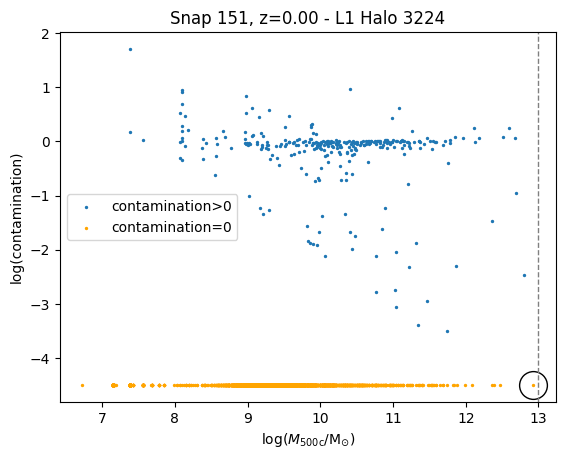

In [60]:
plt.scatter(np.log10(halo_m500c_z0), np.log10(halo_contamination_z0), s=2, label='contamination>0')
plt.scatter(np.log10(np.array(halo_m500c_z0)[halo_contamination0_index_z0]),
            np.full(len(halo_contamination0_index_z0), value_of_contamination0_z0),
            s=2, color='orange', label='contamination=0')
plt.plot(np.log10(specific_halo_m500c_z0),
         specific_halo_contamination_z0 if specific_halo_contamination_z0>0 else value_of_contamination0_z0,
         'o', ms=20, mec='black', mfc='none', mew=1)
plt.axvline(np.log10(target_m500c), ls='--', lw=1, color='grey')
plt.title(f'Snap {snap_num0}, z={redshift0:.2f} - L{res_level} Halo {halo_id}')
plt.xlabel(r'$\log(M_{500\mathrm{c}}/\mathrm{M_{\odot}})$')
plt.ylabel('log(contamination)')
plt.legend()

# All other snapshots

## Iterate through all snapshots, saving target halo properties

In [61]:
snap_num_list = range(0,snap_num0+1)
# snap_num_list = range(149,152)
# snap_num_list = [151]

In [59]:
## Sphere for checking mass ratios of halos with target halo
sphere_radius_type = 'r500c'
sphere_radius_factor = 10

mass_ratio_type = 'm500c'
major_merger_mass_ratio = 5

In [60]:
prop_names = ['snap_num',
              'age_halo', 'age_central', 'age_central_tracked',
              'z_halo', 'z_central', 'z_central_tracked',
              'index_halo', 'index_central', 'index_central_tracked',
              'contamination_halo',
              'minpotpos_halo', 'minpotpos_central', 'minpotpos_central_tracked',
              'num_major_mergers_halo',
              'bh_mdot_central', 'bh_mdot_central_tracked',
              'bh_fedd_central', 'bh_fedd_central_tracked',
              'bh_mdot_edd_central', 'bh_mdot_edd_central_tracked',]

central_types = ['', '_tracked']

delta_values = ['2500', '500', '200']
for delta_value in delta_values:
    prop_names.append(f'm{delta_value}c_halo')
    prop_names.append(f'r{delta_value}c_halo')

virial_quantities = ['circular_velocity', 'spin_param', 'temperature']
for quant in virial_quantities:
    prop_names.append(f'{quant}_halo')

sfr_types = ['', '_100']
for sfr_type in sfr_types:
    prop_names.append(f'sfr{sfr_type}_halo')
    prop_names.append(f'ssfr{sfr_type}_halo')
    for central_type in central_types:
        prop_names.append(f'sfr{sfr_type}_central{central_type}')
        prop_names.append(f'ssfr{sfr_type}_central{central_type}')

halo_mass_types = ['gas', 'stellar', 'dm', 'dust', 'H2']
for halo_mass_type in halo_mass_types:
    prop_names.append(f'{halo_mass_type}_mass_halo')

halo_radii_types = ['gas', 'stellar', 'dm', 'baryon', 'total']
halo_radii_XX = ['half_mass', 'r20', 'r80']
for halo_radii_type in halo_radii_types:
    for XX in halo_radii_XX:
        prop_names.append(f'{halo_radii_type}_{XX}_radius_halo')

halo_metallicity_types = ['mass_weighted', 'sfr_weighted', 'stellar', 'mass_weighted_cgm', 'temp_weighted_cgm']
for halo_metal_type in halo_metallicity_types:
    prop_names.append(f'{halo_metal_type}_metallicity_halo')

halo_velocity_dispersion_types = ['gas', 'stellar', 'dm', 'baryon', 'total']
for halo_vel_disp_type in halo_velocity_dispersion_types:
    prop_names.append(f'{halo_vel_disp_type}_velocity_dispersion_halo')

# halo_rotation_types = ['gas', 'stellar', 'dm', 'baryon', 'total']
# halo_rotation_XX = ['L', 'ALPHA', 'BETA', 'BoverT', 'kappa_rot']
# for rot_type in halo_rotation_types:
#     for rot_XX in halo_rotation_XX:
#         prop_names.append(f'{rot_type}_{rot_XX}_rotation_halo')

halo_age_types = ['mass_weighted', 'metal_weighted']
for age_type in halo_age_types:
    prop_names.append(f'{age_type}_stellar_age_halo')

halo_temperature_types = ['mass_weighted', 'mass_weighted_cgm']#, 'temp_weighted_cgm']
for temp_type in halo_temperature_types:
    prop_names.append(f'{temp_type}_temperature_halo')

halo_local_density_types = ['300', '1000', '3000']
for dens_type in halo_local_density_types:
    prop_names.append(f'local_mass_density_{dens_type}kpccm_halo')
    prop_names.append(f'local_number_density_{dens_type}kpccm_halo')



central_mass_types = ['gas', 'stellar', 'bh', 'dust', 'HI', 'H2']#'dm',
central_mass_apertures = ['', '_30kpc']

central_radii_types = ['gas', 'stellar', 'baryon', 'total']#'dm',
central_radii_XX = ['half_mass', 'r20', 'r80']

central_metallicity_types = ['mass_weighted', 'sfr_weighted', 'stellar']

central_velocity_dispersion_types = ['gas', 'stellar', 'baryon', 'total']#'dm',

central_age_types = ['mass_weighted', 'metal_weighted']

central_temperature_types = ['mass_weighted', 'mass_weighted_cgm']#, 'temp_weighted_cgm']

for central_type in central_types:

    for central_mass_type in central_mass_types:
        for aperture in central_mass_apertures:
            if central_mass_type in ['stellar', 'dust'] and aperture=='_30kpc': continue
            prop_names.append(f'{central_mass_type}{aperture}_mass_central{central_type}')
    
    for central_radii_type in central_radii_types:
        for XX in central_radii_XX:
            prop_names.append(f'{central_radii_type}_{XX}_radius_central{central_type}')
    
    for central_metal_type in central_metallicity_types:
        prop_names.append(f'{central_metal_type}_metallicity_central{central_type}')
    
    for central_vel_disp_type in central_velocity_dispersion_types:
        prop_names.append(f'{central_vel_disp_type}_velocity_dispersion_central{central_type}')
    
    # central_rotation_types = ['gas', 'stellar', 'dm', 'baryon', 'total']
    # central_rotation_XX = ['L', 'ALPHA', 'BETA', 'BoverT', 'kappa_rot']
    # for rot_type in central_rotation_types:
    #     for rot_XX in central_rotation_XX:
    #         prop_names.append(f'{rot_type}_{rot_XX}_rotation_central{central_type}')
    
    for age_type in central_age_types:
        prop_names.append(f'{age_type}_stellar_age_central{central_type}')
    
    for temp_type in central_temperature_types:
        prop_names.append(f'{temp_type}_temperature_central{central_type}')

In [64]:
prop_dict = {}
for prop_name in prop_names:
    prop_dict[prop_name] = []

In [65]:
for snap_num in snap_num_list:
    print(f'Snapshot {snap_num}')

    snap_dir = f'/scratch/b/babul/aspadawe/snapshots/HyenasC/L{res_level}/halo_{halo_id}_v3'

    ## Load particle information in snapshot with yt
    # snap_file = f'/scratch/b/babul/aspadawe/snapshots/Hyenasc_L{res_level}_zooms/halo_{halo_id}/snap_halo_{halo_id}_{snap_num}.hdf5'
    # snap_file = '/scratch/b/babul/aspadawe/snapshots/HyenasC/L0/halo_3224_v3/snapshot_085.hdf5'
    # snap_file = '/scratch/b/babul/fjenning/xray_bubbles/PAPER_2_SIMBA_C_RECAL/Chyenas_dmsplit_Level1_zoom_252/snaps/Chyenas_snapshot_736.hdf5'
    # snap_file = f'/home/b/babul/wcui/data/HYENAS/Level{res_level}/halo_{halo_id}/snap_halo_{halo_id}_{snap_num:03}.hdf5'
    # snap_file = f'/scratch/b/babul/aspadawe/snapshots/HyenasC/L{res_level}/halo_{halo_id}_v3/snapshot_{snap_num:03}.hdf5'
    snap_file = os.path.join(snap_dir, f'snapshot_{snap_num:03}.hdf5')
    try:
        snap = yt.load(snap_file)
    except Exception as e:
        print(e)
        print('No snapshot\n')
        continue

    ## Load caesar file
    # caesar_file = f'/scratch/b/babul/aspadawe/snapshots/Hyenasc_L{res_level}_zooms/halo_{halo_id}/Groups/Caesar_halo_{halo_id}_{snap_num}.hdf5'
    # caesar_file = f'/home/b/babul/wcui/data/HYENAS/Level{res_level}/halo_{halo_id}/Groups/Caesar_halo_{halo_id}_{snap_num:03}.hdf5'
    # caesar_file = f'/scratch/b/babul/aspadawe/snapshots/HyenasC/L{res_level}/halo_{halo_id}_v3/groups_fof/caesar_{snap_num:03}.hdf5'
    # caesar_file = f'/home/b/babul/aspadawe/scripts/caesar_files/test.hdf5'
    # caesar_file = os.path.join(snap_dir, 'groups_fof', f'caesar_{snap_num:03}.hdf5')
    caesar_file = os.path.join(snap_dir, 'caesar_fof', f'caesar_{snap_num:03}_haloid-fof_lowres-[2].hdf5')
    try:
        obj = caesar.load(caesar_file)
    except Exception as e:
        print(e)
        print()
        continue

    ## Link halos in snapshots with caesar progen
    caesar.progen.check_if_progen_is_present(caesar_file, 'progen_halo_dm')
    progens = caesar.progen.progen_finder(obj_current=obj0, obj_target=obj, caesar_file=caesar_file,
                                          snap_dir=snap_dir,#f'/home/b/babul/wcui/data/HYENAS/Level{res_level}/halo_{halo_id}',
                                          data_type='halo', part_type='dm', recompute=True,
                                          save=False, n_most=1, min_in_common=0.1, nproc=1,
                                          match_frac=True, reverse_match=False)

    specific_halo_index = progens[0][specific_halo_index_z0][0]
    specific_halo = obj.halos[specific_halo_index]
    try:
        specific_central = specific_halo.central_galaxy
    except:
        specific_central = None
    print(f'Target halo index: {specific_halo_index}')
    print(f'Target halo central galaxy: {specific_central}')
    if specific_central is not None:
        specific_central_index = specific_central.GroupID
        print(f'Target halo central galaxy index: {specific_central_index}')
    # print()

    ## Link galaxies in snapshots with caesar progen
    caesar.progen.check_if_progen_is_present(caesar_file, 'progen_galaxy_star')
    try:
        gal_progens = caesar.progen.progen_finder(obj_current=obj0, obj_target=obj, caesar_file=caesar_file,
                                                  snap_dir=snap_dir,#f'/home/b/babul/wcui/data/HYENAS/Level{res_level}/halo_{halo_id}',
                                                  data_type='galaxy', part_type='star', recompute=True,
                                                  save=False, n_most=1, min_in_common=0.1, nproc=1,
                                                  match_frac=True, reverse_match=False)
    
        specific_central_index_tracked = gal_progens[0][specific_central_index_z0][0]
        specific_central_tracked = obj.galaxies[specific_central_index_tracked]
    except:
        specific_central_index_tracked = -1
        specific_central_tracked = None
    print(f'Target halo tracked central galaxy index: {specific_central_index_tracked}')
    print(f'Target halo tracked central galaxy: {specific_central_tracked}')

    
    ## Information for snapshot
    prop_dict['snap_num'].append(snap_num)
    prop_dict['age_halo'].append(snap.current_time.in_units('Gyr'))
    prop_dict['z_halo'].append(snap.current_redshift)

    ## Get properties of target halo
    prop_dict['index_halo'].append(specific_halo_index)
    prop_dict['contamination_halo'].append(specific_halo.contamination)
    prop_dict['minpotpos_halo'].append(specific_halo.minpotpos.in_units('Mpccm'))

    for delta_value in delta_values:
        prop_dict[f'm{delta_value}c_halo'].append(specific_halo.virial_quantities[f'm{delta_value}c'])
        prop_dict[f'r{delta_value}c_halo'].append(specific_halo.virial_quantities[f'r{delta_value}c'].in_units('kpccm'))

    for quant in virial_quantities:
        prop_dict[f'{quant}_halo'].append(specific_halo.virial_quantities[quant])

    try:
        prop_dict['sfr_halo'].append(specific_halo.sfr)
    except:
        print('Bad sfr_halo ')
        prop_dict['sfr_halo'].append(unyt.unyt_array(0, 'Msun/yr'))

    try:
        prop_dict['sfr_100_halo'].append(specific_halo.sfr_100)
    except:
        print('Bad sfr_100_halo')
        prop_dict['sfr_100_halo'].append(unyt.unyt_array(0, 'Msun/yr'))

    for mass_type in halo_mass_types:
        try:
            prop_dict[f'{mass_type}_mass_halo'].append(specific_halo.masses[mass_type])
        except:
            print(f'Bad {mass_type}_mass_halo')
            prop_dict[f'{mass_type}_mass_halo'].append(unyt.unyt_array(0, 'Msun'))
    
    for radii_type in halo_radii_types:
        for XX in halo_radii_XX:
            try:
                prop_dict[f'{radii_type}_{XX}_radius_halo'].append(specific_halo.radii[f'{radii_type}_{XX}'])
            except:
                print(f'Bad {radii_type}_{XX}_radius_halo')
                prop_dict[f'{radii_type}_{XX}_radius_halo'].append(np.nan)

    for metal_type in halo_metallicity_types:
        try:
            prop_dict[f'{metal_type}_metallicity_halo'].append(specific_halo.metallicities[metal_type])
        except:
            print(f'Bad {metal_type}_metallicity_halo')
            prop_dict[f'{metal_type}_metallicity_halo'].append(unyt.unyt_array(np.nan, ''))

    for vel_disp_type in halo_velocity_dispersion_types:
        try:
            prop_dict[f'{vel_disp_type}_velocity_dispersion_halo'].append(specific_halo.velocity_dispersions[vel_disp_type])
        except:
            print(f'Bad {vel_disp_type}_velocity_dispersion_halo')
            prop_dict[f'{vel_disp_type}_velocity_dispersion_halo'].append(np.nan)

    # for rot_type in halo_rotation_types:
    #     for rot_XX in halo_rotation_XX:
    #         try:
    #             prop_dict[f'{rot_type}_{rot_XX}_rotation_halo'].append(specific_halo.rotation[f'{rot_type}_{rot_XX}'])
    #         except:
    #             print(f'Bad {rot_type}_{rot_XX}_rotation_halo')
    #             prop_dict[f'{rot_type}_{rot_XX}_rotation_halo'].append(np.nan)

    for age_type in halo_age_types:
        try:
            prop_dict[f'{age_type}_stellar_age_halo'].append(specific_halo.ages[age_type])
        except:
            print(f'Bad {age_type}_stellar_age_halo')
            prop_dict[f'{age_type}_stellar_age_halo'].append(np.nan)

    for temp_type in halo_temperature_types:
        try:
            prop_dict[f'{temp_type}_temperature_halo'].append(specific_halo.temperatures[temp_type])
        except:
            print(f'Bad {temp_type}_temperature_halo')
            prop_dict[f'{temp_type}_temperature_halo'].append(np.nan)

    for dens_type in halo_local_density_types:
        try:
            prop_dict[f'local_mass_density_{dens_type}kpccm_halo'].append(specific_halo.local_mass_density[dens_type])
        except:
            print(f'Bad local_mass_density_{dens_type}kpccm_halo')
            prop_dict[f'local_mass_density_{dens_type}kpccm_halo'].append(np.nan)
        try:
            prop_dict[f'local_number_density_{dens_type}kpccm_halo'].append(specific_halo.local_number_density[dens_type])
        except:
            print(f'Bad local_number_density_{dens_type}kpccm_halo')
            prop_dict[f'local_number_density_{dens_type}kpccm_halo'].append(np.nan)

    
    ## Central galaxy properties
    if specific_central is not None:
        prop_dict['z_central'].append(snap.current_redshift)
        prop_dict['age_central'].append(snap.current_time.in_units('Gyr'))

        prop_dict['index_central'].append(specific_central_index)

        prop_dict['minpotpos_central'].append(specific_central.minpotpos.in_units('Mpccm'))
        
        prop_dict['sfr_central'].append(specific_central.sfr)
        prop_dict['sfr_100_central'].append(specific_central.sfr_100)

        try:
            prop_dict['bh_mdot_central'].append(specific_central.bhmdot)
        except:
            print('Bad bh_mdot_central')
            prop_dict['bh_mdot_central'].append(np.nan)

        try:
            prop_dict['bh_fedd_central'].append(specific_central.bh_fedd)
        except:
            print('Bad bh_fedd_central')
            prop_dict['bh_fedd_central'].append(np.nan)

        for mass_type in central_mass_types:
            for aperture in central_mass_apertures:
                if mass_type in ['stellar', 'dust'] and aperture=='_30kpc': continue
                try:
                    prop_dict[f'{mass_type}{aperture}_mass_central'].append(specific_central.masses[f'{mass_type}{aperture}'])
                except:
                    print(f'Bad {mass_type}{aperture}_mass_central')
                    prop_dict[f'{mass_type}{aperture}_mass_central'].append(unyt.unyt_array(0, 'Msun'))

        for radii_type in central_radii_types:
            for XX in central_radii_XX:
                try:
                    prop_dict[f'{radii_type}_{XX}_radius_central'].append(specific_central.radii[f'{radii_type}_{XX}'])
                except:
                    print(f'Bad {radii_type}_{XX}_radius_central')
                    prop_dict[f'{radii_type}_{XX}_radius_central'].append(np.nan)
    
        for metal_type in central_metallicity_types:
            prop_dict[f'{metal_type}_metallicity_central'].append(specific_central.metallicities[metal_type])
    
        for vel_disp_type in central_velocity_dispersion_types:
            prop_dict[f'{vel_disp_type}_velocity_dispersion_central'].append(specific_central.velocity_dispersions[vel_disp_type])
    
        # for rot_type in central_rotation_types:
        #     for rot_XX in central_rotation_XX:
        #         prop_dict[f'{rot_type}_{rot_XX}_rotation_central'].append(specific_central.rotation[f'{rot_type}_{rot_XX}'])
    
        for age_type in central_age_types:
            prop_dict[f'{age_type}_stellar_age_central'].append(specific_central.ages[age_type])
    
        for temp_type in central_temperature_types:
            prop_dict[f'{temp_type}_temperature_central'].append(specific_central.temperatures[temp_type])

        del specific_central
    else:
        print('No central galaxy')

    ## z=0 tracked central galaxy properties
    if specific_central_tracked is not None:
        prop_dict['z_central_tracked'].append(snap.current_redshift)
        prop_dict['age_central_tracked'].append(snap.current_time.in_units('Gyr'))
        
        prop_dict['index_central_tracked'].append(specific_central_index_tracked)
        
        prop_dict['minpotpos_central_tracked'].append(specific_central_tracked.minpotpos.in_units('Mpccm'))

        prop_dict['sfr_central_tracked'].append(specific_central_tracked.sfr)
        prop_dict['sfr_100_central_tracked'].append(specific_central_tracked.sfr_100)

        try:
            prop_dict['bh_mdot_central_tracked'].append(specific_central_tracked.bhmdot)
        except:
            print('Bad bh_mdot_central_tracked')
            prop_dict['bh_mdot_central_tracked'].append(np.nan)

        try:
            prop_dict['bh_fedd_central_tracked'].append(specific_central_tracked.bh_fedd)
        except:
            print('Bad bh_fedd_central_tracked')
            prop_dict['bh_fedd_central_tracked'].append(np.nan)
        # prop_dict['bh_mdot_central_tracked'].append(specific_central_tracked.bhmdot)
        # prop_dict['bh_fedd_central_tracked'].append(specific_central_tracked.bh_fedd)

        for mass_type in central_mass_types:
            for aperture in central_mass_apertures:
                if mass_type in ['stellar', 'dust'] and aperture=='_30kpc': continue
                # prop_dict[f'{mass_type}{aperture}_mass_central_tracked'].append(specific_central_tracked.masses[f'{mass_type}{aperture}'])
                try:
                    prop_dict[f'{mass_type}{aperture}_mass_central_tracked'].append(specific_central_tracked.masses[f'{mass_type}{aperture}'])
                except:
                    print(f'Bad {mass_type}{aperture}_mass_central_tracked')
                    prop_dict[f'{mass_type}{aperture}_mass_central_tracked'].append(unyt.unyt_array(0, 'Msun'))

        for radii_type in central_radii_types:
            for XX in central_radii_XX:
                # prop_dict[f'{radii_type}_{XX}_radius_central_tracked'].append(specific_central_tracked.radii[f'{radii_type}_{XX}'])
                try:
                    prop_dict[f'{radii_type}_{XX}_radius_central_tracked'].append(specific_central_tracked.radii[f'{radii_type}_{XX}'])
                except:
                    print(f'Bad {radii_type}_{XX}_radius_central_tracked')
                    prop_dict[f'{radii_type}_{XX}_radius_central_tracked'].append(np.nan)
    
        for metal_type in central_metallicity_types:
            prop_dict[f'{metal_type}_metallicity_central_tracked'].append(specific_central_tracked.metallicities[metal_type])
    
        for vel_disp_type in central_velocity_dispersion_types:
            prop_dict[f'{vel_disp_type}_velocity_dispersion_central_tracked'].append(specific_central_tracked.velocity_dispersions[vel_disp_type])
    
        # for rot_type in central_rotation_types:
        #     for rot_XX in central_rotation_XX:
        #         prop_dict[f'{rot_type}_{rot_XX}_rotation_central_tracked'].append(specific_central_tracked.rotation[f'{rot_type}_{rot_XX}'])
    
        for age_type in central_age_types:
            prop_dict[f'{age_type}_stellar_age_central_tracked'].append(specific_central_tracked.ages[age_type])
    
        for temp_type in central_temperature_types:
            prop_dict[f'{temp_type}_temperature_central_tracked'].append(specific_central_tracked.temperatures[temp_type])

        del gal_progens, specific_central_tracked
    else:
        print('No tracked central galaxy')
    # try:
    #     prop_dict['sfr_central'].append(specific_central.sfr)
    #     prop_dict['sfr_100_central'].append(specific_central.sfr_100)
        
    #     prop_dict['bh_mdot_central'].append(specific_central.bhmdot)
    #     prop_dict['bh_fedd_central'].append(specific_central.bh_fedd)
    # except Exception as e:
    #     print(Exception)
    #     print('No central galaxy')

    
    ############# Check for nearby halos that qualify as major mergers ###########################
    ## Make sphere around target halo
    sphere_radius = sphere_radius_factor*specific_halo.virial_quantities[sphere_radius_type]
    sphere = snap.sphere(specific_halo.minpotpos, sphere_radius)

    ## Find all halos whose centres are within sphere
    halo_minpotpos = unyt.unyt_array([_halo.minpotpos.in_units('Mpc') for _halo in obj.halos])
    distance_from_target_halo = unyt.unyt_array(np.zeros(len(halo_minpotpos)), halo_minpotpos.units)
    for ii in range(len(halo_minpotpos)):
        _minpotpos = halo_minpotpos[ii]
        distance_from_target_halo[ii] = euclidean_distance(_minpotpos, specific_halo.minpotpos.in_units('Mpc'))
    halo_within_sphere_index = np.nonzero(distance_from_target_halo <= sphere_radius)[0]
    halo_within_sphere_index = np.setdiff1d(halo_within_sphere_index, specific_halo_index) # Remove id of target halo

    ## Check for major merger mass ratio
    specific_halo_m500c = specific_halo.virial_quantities[mass_ratio_type]
    halo_m500c = unyt.unyt_array([halo.virial_quantities[mass_ratio_type] for halo in obj.halos])
    halos_within_sphere_m500c = halo_m500c[halo_within_sphere_index]
    halo_m500c_ratio = []
    for halo_within_sphere_m500c in halos_within_sphere_m500c:
        if specific_halo_m500c >= halo_within_sphere_m500c:
            halo_m500c_ratio.append(specific_halo_m500c/halo_within_sphere_m500c)
        else:
            halo_m500c_ratio.append(halo_within_sphere_m500c/specific_halo_m500c)
    halo_m500c_ratio = np.array(halo_m500c_ratio)
    major_merger_indexes = np.where(halo_m500c_ratio <= major_merger_mass_ratio)[0]
    num_major_mergers = unyt.unyt_array(len(major_merger_indexes), '')

    prop_dict['num_major_mergers_halo'].append(num_major_mergers)

    print()

    ## dynamically deallocate variables to free up memory
    del snap, obj, progens, specific_halo, sphere, halo_m500c, halos_within_sphere_m500c, halo_m500c_ratio, major_merger_indexes
    gc.collect()

yt : [INFO     ] 2025-07-07 18:10:10,624 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:10:10,633 Calculating time from 1.000e-02 to be 5.523e+14 seconds
yt : [INFO     ] 2025-07-07 18:10:10,634 Assuming length units are in kpc/h (comoving)


Snapshot 0


yt : [INFO     ] 2025-07-07 18:10:10,721 Parameters: current_time              = 552318270036239.0 s
yt : [INFO     ] 2025-07-07 18:10:10,721 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:10:10,722 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:10:10,722 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:10:10,723 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:10:10,723 Parameters: current_redshift          = 99.00000023293738
yt : [INFO     ] 2025-07-07 18:10:10,723 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:10:10,724 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:10:10,724 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:10:10,724 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:10:10,735 Opening /scratch/b/babul/aspadawe/snapshots/

"Unable to synchronously open object (object 'halo_data' doesn't exist)"

Snapshot 1


yt : [INFO     ] 2025-07-07 18:10:11,018 Parameters: current_time              = 5843332823158994.0 s
yt : [INFO     ] 2025-07-07 18:10:11,018 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:10:11,019 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:10:11,019 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:10:11,020 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:10:11,020 Parameters: current_redshift          = 19.749471077908044
yt : [INFO     ] 2025-07-07 18:10:11,020 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:10:11,021 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:10:11,021 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:10:11,021 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:10:11,046 Opening /scratch/b/babul/aspadawe/snapshot

Target halo index: -1
Target halo central galaxy: None
no STAR  particles present!
Target halo tracked central galaxy index: -1
Target halo tracked central galaxy: None
Bad sfr_100_halo
Bad stellar_mass_halo
Bad stellar_half_mass_radius_halo
Bad stellar_r20_radius_halo
Bad stellar_r80_radius_halo
Bad stellar_metallicity_halo
Bad stellar_velocity_dispersion_halo
Bad mass_weighted_stellar_age_halo
Bad metal_weighted_stellar_age_halo
No central galaxy
No tracked central galaxy


yt : [INFO     ] 2025-07-07 18:10:18,639 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3518.67it/s]
/project/b/babul/aspadawe/pyenvs/visualize_with_yt_ondemand/lib/python3.13/site-packages/unyt/array.py:1972: RuntimeWarning: invalid value encountered in divide
  out_arr = func(
yt : [INFO     ] 2025-07-07 18:10:20,123 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:10:20,131 Calculating time from 5.023e-02 to be 6.217e+15 seconds
yt : [INFO     ] 2025-07-07 18:10:20,132 Assuming length units are in kpc/h (comoving)



Snapshot 2


yt : [INFO     ] 2025-07-07 18:10:20,217 Parameters: current_time              = 6216909357021337.0 s
yt : [INFO     ] 2025-07-07 18:10:20,218 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:10:20,218 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:10:20,219 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:10:20,219 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:10:20,219 Parameters: current_redshift          = 18.909610477251775
yt : [INFO     ] 2025-07-07 18:10:20,220 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:10:20,220 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:10:20,220 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:10:20,221 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:10:20,245 Opening /scratch/b/babul/aspadawe/snapshot

Target halo index: 1
Target halo central galaxy: None
no STAR  particles present!
Target halo tracked central galaxy index: -1
Target halo tracked central galaxy: None
Bad sfr_100_halo
Bad stellar_mass_halo
Bad stellar_half_mass_radius_halo
Bad stellar_r20_radius_halo
Bad stellar_r80_radius_halo
Bad stellar_metallicity_halo
Bad stellar_velocity_dispersion_halo
Bad mass_weighted_stellar_age_halo
Bad metal_weighted_stellar_age_halo
No central galaxy
No tracked central galaxy


yt : [INFO     ] 2025-07-07 18:10:22,737 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3491.77it/s]
yt : [INFO     ] 2025-07-07 18:10:24,019 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:10:24,027 Calculating time from 5.230e-02 to be 6.606e+15 seconds
yt : [INFO     ] 2025-07-07 18:10:24,028 Assuming length units are in kpc/h (comoving)



Snapshot 3


yt : [INFO     ] 2025-07-07 18:10:24,113 Parameters: current_time              = 6605883446916031.0 s
yt : [INFO     ] 2025-07-07 18:10:24,114 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:10:24,114 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:10:24,115 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:10:24,115 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:10:24,116 Parameters: current_redshift          = 18.120093490662676
yt : [INFO     ] 2025-07-07 18:10:24,116 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:10:24,116 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:10:24,117 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:10:24,117 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:10:24,141 Opening /scratch/b/babul/aspadawe/snapshot

Target halo index: -1
Target halo central galaxy: None
no STAR  particles present!
Target halo tracked central galaxy index: -1
Target halo tracked central galaxy: None
Bad sfr_100_halo
Bad stellar_mass_halo
Bad stellar_half_mass_radius_halo
Bad stellar_r20_radius_halo
Bad stellar_r80_radius_halo
Bad stellar_metallicity_halo
Bad stellar_velocity_dispersion_halo
Bad mass_weighted_stellar_age_halo
Bad metal_weighted_stellar_age_halo
No central galaxy
No tracked central galaxy


yt : [INFO     ] 2025-07-07 18:10:26,709 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3500.20it/s]



Snapshot 4


yt : [INFO     ] 2025-07-07 18:10:28,076 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:10:28,084 Calculating time from 5.442e-02 to be 7.011e+15 seconds
yt : [INFO     ] 2025-07-07 18:10:28,085 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:10:28,171 Parameters: current_time              = 7010947874183372.0 s
yt : [INFO     ] 2025-07-07 18:10:28,171 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:10:28,172 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:10:28,172 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:10:28,173 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:10:28,173 Parameters: current_redshift          = 17.37627259944165
yt : [INFO     ] 2025-07-07 18:10:28,173 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:10:28,174 Paramete

Target halo index: 5
Target halo central galaxy: None
no STAR  particles present!
Target halo tracked central galaxy index: -1
Target halo tracked central galaxy: None
Bad sfr_100_halo
Bad stellar_mass_halo
Bad stellar_half_mass_radius_halo
Bad stellar_r20_radius_halo
Bad stellar_r80_radius_halo
Bad stellar_metallicity_halo
Bad stellar_velocity_dispersion_halo
Bad mass_weighted_stellar_age_halo
Bad metal_weighted_stellar_age_halo
No central galaxy
No tracked central galaxy


yt : [INFO     ] 2025-07-07 18:10:30,954 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3487.95it/s]



Snapshot 5


yt : [INFO     ] 2025-07-07 18:10:32,270 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:10:32,279 Calculating time from 5.658e-02 to be 7.432e+15 seconds
yt : [INFO     ] 2025-07-07 18:10:32,280 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:10:32,365 Parameters: current_time              = 7432037082871881.0 s
yt : [INFO     ] 2025-07-07 18:10:32,365 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:10:32,366 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:10:32,367 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:10:32,367 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:10:32,368 Parameters: current_redshift          = 16.675339457457085
yt : [INFO     ] 2025-07-07 18:10:32,368 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:10:32,368 Paramet

Target halo index: 1
Target halo central galaxy: None
no STAR  particles present!
Target halo tracked central galaxy index: -1
Target halo tracked central galaxy: None
Bad sfr_100_halo
Bad stellar_mass_halo
Bad stellar_half_mass_radius_halo
Bad stellar_r20_radius_halo
Bad stellar_r80_radius_halo
Bad stellar_metallicity_halo
Bad stellar_velocity_dispersion_halo
Bad mass_weighted_stellar_age_halo
Bad metal_weighted_stellar_age_halo
No central galaxy
No tracked central galaxy


yt : [INFO     ] 2025-07-07 18:10:35,218 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3462.83it/s]



Snapshot 6


yt : [INFO     ] 2025-07-07 18:10:36,612 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:10:36,621 Calculating time from 5.878e-02 to be 7.870e+15 seconds
yt : [INFO     ] 2025-07-07 18:10:36,622 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:10:36,707 Parameters: current_time              = 7869657748427234.0 s
yt : [INFO     ] 2025-07-07 18:10:36,708 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:10:36,708 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:10:36,709 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:10:36,709 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:10:36,710 Parameters: current_redshift          = 16.01374723643373
yt : [INFO     ] 2025-07-07 18:10:36,710 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:10:36,711 Paramete

Target halo index: 5
Target halo central galaxy: None
Target halo tracked central galaxy index: -1
Target halo tracked central galaxy: None
No central galaxy
No tracked central galaxy


yt : [INFO     ] 2025-07-07 18:10:39,858 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3453.04it/s]



Snapshot 7


yt : [INFO     ] 2025-07-07 18:10:41,294 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:10:41,303 Calculating time from 6.102e-02 to be 8.324e+15 seconds
yt : [INFO     ] 2025-07-07 18:10:41,304 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:10:41,389 Parameters: current_time              = 8324126902340825.0 s
yt : [INFO     ] 2025-07-07 18:10:41,390 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:10:41,390 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:10:41,391 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:10:41,391 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:10:41,392 Parameters: current_redshift          = 15.388606645618658
yt : [INFO     ] 2025-07-07 18:10:41,392 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:10:41,393 Paramet

Target halo index: 30
Target halo central galaxy: None
Target halo tracked central galaxy index: -1
Target halo tracked central galaxy: None
No central galaxy
No tracked central galaxy


yt : [INFO     ] 2025-07-07 18:10:44,647 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3440.59it/s]



Snapshot 8


yt : [INFO     ] 2025-07-07 18:10:46,108 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:10:46,117 Calculating time from 6.330e-02 to be 8.796e+15 seconds
yt : [INFO     ] 2025-07-07 18:10:46,118 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:10:46,203 Parameters: current_time              = 8795552589592508.0 s
yt : [INFO     ] 2025-07-07 18:10:46,203 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:10:46,204 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:10:46,204 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:10:46,205 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:10:46,205 Parameters: current_redshift          = 14.797538802663889
yt : [INFO     ] 2025-07-07 18:10:46,206 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:10:46,206 Paramet

Target halo index: 2
Target halo central galaxy: None
Target halo tracked central galaxy index: -1
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149663b2f0e0>


yt : [INFO     ] 2025-07-07 18:10:49,637 Allocating for 4.337e+07 particles


No central galaxy
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3443.00it/s]
/project/b/babul/aspadawe/pyenvs/visualize_with_yt_ondemand/lib/python3.13/site-packages/unyt/array.py:1972: RuntimeWarning: divide by zero encountered in divide
  out_arr = func(



Snapshot 9


yt : [INFO     ] 2025-07-07 18:10:51,097 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:10:51,106 Calculating time from 6.563e-02 to be 9.285e+15 seconds
yt : [INFO     ] 2025-07-07 18:10:51,107 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:10:51,192 Parameters: current_time              = 9284664303949876.0 s
yt : [INFO     ] 2025-07-07 18:10:51,192 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:10:51,193 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:10:51,194 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:10:51,194 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:10:51,194 Parameters: current_redshift          = 14.237630987071062
yt : [INFO     ] 2025-07-07 18:10:51,195 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:10:51,195 Paramet

Target halo index: 5
Target halo central galaxy: None
Target halo tracked central galaxy index: -1
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149663b2f230>
No central galaxy
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


yt : [INFO     ] 2025-07-07 18:10:54,788 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3403.23it/s]



Snapshot 10


yt : [INFO     ] 2025-07-07 18:10:56,310 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:10:56,319 Calculating time from 6.799e-02 to be 9.791e+15 seconds
yt : [INFO     ] 2025-07-07 18:10:56,320 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:10:56,404 Parameters: current_time              = 9791357839165172.0 s
yt : [INFO     ] 2025-07-07 18:10:56,405 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:10:56,405 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:10:56,406 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:10:56,406 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:10:56,407 Parameters: current_redshift          = 13.707180051845798
yt : [INFO     ] 2025-07-07 18:10:56,407 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:10:56,407 Paramet

Target halo index: 8
Target halo central galaxy: None
Target halo tracked central galaxy index: -1
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149662e88050>


yt : [INFO     ] 2025-07-07 18:11:00,010 Allocating for 4.337e+07 particles


No central galaxy
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3436.77it/s]



Snapshot 11


yt : [INFO     ] 2025-07-07 18:11:01,621 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:11:01,630 Calculating time from 7.040e-02 to be 1.032e+16 seconds
yt : [INFO     ] 2025-07-07 18:11:01,631 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:11:01,716 Parameters: current_time              = 1.0316157080745224e+16 s
yt : [INFO     ] 2025-07-07 18:11:01,716 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:11:01,717 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:11:01,717 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:11:01,718 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:11:01,718 Parameters: current_redshift          = 13.203940183070895
yt : [INFO     ] 2025-07-07 18:11:01,719 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:11:01,720 Par

Target halo index: 6
Target halo central galaxy: None
Target halo tracked central galaxy index: -1
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149662e88130>


yt : [INFO     ] 2025-07-07 18:11:05,493 Allocating for 4.337e+07 particles


No central galaxy
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3299.42it/s]



Snapshot 12


yt : [INFO     ] 2025-07-07 18:11:07,167 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:11:07,176 Calculating time from 7.285e-02 to be 1.086e+16 seconds
yt : [INFO     ] 2025-07-07 18:11:07,177 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:11:07,262 Parameters: current_time              = 1.0859377630906222e+16 s
yt : [INFO     ] 2025-07-07 18:11:07,262 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:11:07,263 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:11:07,263 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:11:07,264 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:11:07,264 Parameters: current_redshift          = 12.72608230357968
yt : [INFO     ] 2025-07-07 18:11:07,265 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:11:07,265 Para

Target halo index: 7
Target halo central galaxy: None
Target halo tracked central galaxy index: 5
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149662e887c0>
No central galaxy
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


yt : [INFO     ] 2025-07-07 18:11:11,238 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3379.81it/s]



Snapshot 13


yt : [INFO     ] 2025-07-07 18:11:13,012 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:11:13,021 Calculating time from 7.535e-02 to be 1.142e+16 seconds
yt : [INFO     ] 2025-07-07 18:11:13,022 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:11:13,110 Parameters: current_time              = 1.1421334511090116e+16 s
yt : [INFO     ] 2025-07-07 18:11:13,110 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:11:13,111 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:11:13,111 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:11:13,112 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:11:13,113 Parameters: current_redshift          = 12.271928585280284
yt : [INFO     ] 2025-07-07 18:11:13,113 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:11:13,113 Par

Target halo index: 9
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149663b2e5f0>
Target halo central galaxy index: 8
Target halo tracked central galaxy index: 6
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149662e89e80>
Bad bh_mdot_central
Bad bh_fedd_central
Bad bh_mass_central
Bad bh_30kpc_mass_central
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


yt : [INFO     ] 2025-07-07 18:11:17,215 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3347.59it/s]



Snapshot 14


yt : [INFO     ] 2025-07-07 18:11:19,062 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:11:19,070 Calculating time from 7.788e-02 to be 1.200e+16 seconds
yt : [INFO     ] 2025-07-07 18:11:19,071 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:11:19,157 Parameters: current_time              = 1.2002342486778024e+16 s
yt : [INFO     ] 2025-07-07 18:11:19,157 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:11:19,157 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:11:19,158 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:11:19,158 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:11:19,159 Parameters: current_redshift          = 11.839937401272726
yt : [INFO     ] 2025-07-07 18:11:19,159 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:11:19,159 Par

Target halo index: 10
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149662e8a190>
Target halo central galaxy index: 9
Target halo tracked central galaxy index: 8
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149662e8a820>


yt : [INFO     ] 2025-07-07 18:11:23,242 Allocating for 4.337e+07 particles


Bad bh_mdot_central
Bad bh_fedd_central
Bad bh_mass_central
Bad bh_30kpc_mass_central
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3391.75it/s]
yt : [INFO     ] 2025-07-07 18:11:25,165 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:11:25,174 Calculating time from 8.046e-02 to be 1.260e+16 seconds
yt : [INFO     ] 2025-07-07 18:11:25,175 Assuming length units are in kpc/h (comoving)



Snapshot 15


yt : [INFO     ] 2025-07-07 18:11:25,260 Parameters: current_time              = 1.2602715837434478e+16 s
yt : [INFO     ] 2025-07-07 18:11:25,261 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:11:25,261 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:11:25,261 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:11:25,262 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:11:25,262 Parameters: current_redshift          = 11.428690426983227
yt : [INFO     ] 2025-07-07 18:11:25,263 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:11:25,263 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:11:25,263 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:11:25,264 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:11:25,296 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 12
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149663b2fe00>
Target halo central galaxy index: 8
Target halo tracked central galaxy index: 9
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149662e8a270>
Bad bh_mdot_central
Bad bh_fedd_central
Bad bh_mass_central
Bad bh_30kpc_mass_central
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


yt : [INFO     ] 2025-07-07 18:11:29,630 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3378.95it/s]
yt : [INFO     ] 2025-07-07 18:11:31,655 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:11:31,664 Calculating time from 8.308e-02 to be 1.322e+16 seconds
yt : [INFO     ] 2025-07-07 18:11:31,665 Assuming length units are in kpc/h (comoving)



Snapshot 16


yt : [INFO     ] 2025-07-07 18:11:31,750 Parameters: current_time              = 1.3222529605725718e+16 s
yt : [INFO     ] 2025-07-07 18:11:31,750 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:11:31,751 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:11:31,751 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:11:31,751 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:11:31,752 Parameters: current_redshift          = 11.037025926460794
yt : [INFO     ] 2025-07-07 18:11:31,752 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:11:31,752 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:11:31,753 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:11:31,753 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:11:31,795 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 11
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1496928f37e0>
Target halo central galaxy index: 10
Target halo tracked central galaxy index: 9
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149662e896a0>
Bad bh_mdot_central
Bad bh_fedd_central
Bad bh_mass_central
Bad bh_30kpc_mass_central
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


yt : [INFO     ] 2025-07-07 18:11:36,296 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3391.32it/s]
yt : [INFO     ] 2025-07-07 18:11:38,476 ComovingIntegrationOn does not exist, falling back to OmegaLambda



Snapshot 17


yt : [INFO     ] 2025-07-07 18:11:38,484 Calculating time from 8.574e-02 to be 1.386e+16 seconds
yt : [INFO     ] 2025-07-07 18:11:38,485 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:11:38,570 Parameters: current_time              = 1.3862570465104512e+16 s
yt : [INFO     ] 2025-07-07 18:11:38,570 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:11:38,571 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:11:38,572 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:11:38,572 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:11:38,572 Parameters: current_redshift          = 10.663439860191094
yt : [INFO     ] 2025-07-07 18:11:38,573 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:11:38,573 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:11:38,573 Parameters: omega_radiati

Target halo index: 9
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149663b2e890>
Target halo central galaxy index: 12


yt : [INFO     ] 2025-07-07 18:11:42,960 Progen doing 1343 groups (nproc=1), RAM=0.6257 GB


Target halo tracked central galaxy index: 12
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149663b2e890>
Bad bh_mdot_central
Bad bh_fedd_central
Bad bh_mass_central
Bad bh_30kpc_mass_central
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


yt : [INFO     ] 2025-07-07 18:11:43,397 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3355.76it/s]
yt : [INFO     ] 2025-07-07 18:11:45,696 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:11:45,704 Calculating time from 8.844e-02 to be 1.452e+16 seconds
yt : [INFO     ] 2025-07-07 18:11:45,705 Assuming length units are in kpc/h (comoving)



Snapshot 18


yt : [INFO     ] 2025-07-07 18:11:45,790 Parameters: current_time              = 1.4522670153464322e+16 s
yt : [INFO     ] 2025-07-07 18:11:45,790 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:11:45,791 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:11:45,791 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:11:45,792 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:11:45,792 Parameters: current_redshift          = 10.307100963531022
yt : [INFO     ] 2025-07-07 18:11:45,792 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:11:45,793 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:11:45,793 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:11:45,793 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:11:45,818 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 11
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149663b2eb30>
Target halo central galaxy index: 12
Target halo tracked central galaxy index: 12
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149663b2eb30>
Bad bh_mdot_central
Bad bh_fedd_central
Bad bh_mass_central
Bad bh_30kpc_mass_central
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


yt : [INFO     ] 2025-07-07 18:11:50,557 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3314.24it/s]
yt : [INFO     ] 2025-07-07 18:11:53,024 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:11:53,033 Calculating time from 9.118e-02 to be 1.520e+16 seconds
yt : [INFO     ] 2025-07-07 18:11:53,034 Assuming length units are in kpc/h (comoving)



Snapshot 19


yt : [INFO     ] 2025-07-07 18:11:53,120 Parameters: current_time              = 1.5203629335143074e+16 s
yt : [INFO     ] 2025-07-07 18:11:53,120 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:11:53,121 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:11:53,121 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:11:53,121 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:11:53,122 Parameters: current_redshift          = 9.966716126735145
yt : [INFO     ] 2025-07-07 18:11:53,122 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:11:53,122 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:11:53,123 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:11:53,123 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:11:53,154 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 12
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149662e88fa0>
Target halo central galaxy index: 6
Target halo tracked central galaxy index: 12
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149660f488a0>
Bad bh_mdot_central
Bad bh_fedd_central
Bad bh_mass_central
Bad bh_30kpc_mass_central
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


yt : [INFO     ] 2025-07-07 18:11:58,160 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3319.07it/s]
yt : [INFO     ] 2025-07-07 18:12:00,766 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:12:00,775 Calculating time from 9.397e-02 to be 1.591e+16 seconds
yt : [INFO     ] 2025-07-07 18:12:00,776 Assuming length units are in kpc/h (comoving)



Snapshot 20


yt : [INFO     ] 2025-07-07 18:12:00,861 Parameters: current_time              = 1.590526350110506e+16 s
yt : [INFO     ] 2025-07-07 18:12:00,861 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:12:00,862 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:12:00,862 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:12:00,863 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:12:00,863 Parameters: current_redshift          = 9.641580913634277
yt : [INFO     ] 2025-07-07 18:12:00,863 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:12:00,864 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:12:00,864 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:12:00,864 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:12:00,906 Opening /scratch/b/babul/aspadawe/snapsh

Target halo index: 5
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149660f492b0>
Target halo central galaxy index: 8
Target halo tracked central galaxy index: 11
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149660f49a90>
Bad bh_mdot_central
Bad bh_fedd_central
Bad bh_mass_central
Bad bh_30kpc_mass_central
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


yt : [INFO     ] 2025-07-07 18:12:06,100 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3377.74it/s]
yt : [INFO     ] 2025-07-07 18:12:08,852 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:12:08,861 Calculating time from 9.680e-02 to be 1.663e+16 seconds
yt : [INFO     ] 2025-07-07 18:12:08,862 Assuming length units are in kpc/h (comoving)



Snapshot 21


yt : [INFO     ] 2025-07-07 18:12:08,947 Parameters: current_time              = 1.6628386485130034e+16 s
yt : [INFO     ] 2025-07-07 18:12:08,948 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:12:08,948 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:12:08,949 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:12:08,949 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:12:08,950 Parameters: current_redshift          = 9.330578533125887
yt : [INFO     ] 2025-07-07 18:12:08,950 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:12:08,950 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:12:08,951 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:12:08,951 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:12:08,992 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 10
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149660f4a580>
Target halo central galaxy index: 8
Target halo tracked central galaxy index: 15
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149660f4a0b0>
Bad bh_mdot_central
Bad bh_fedd_central
Bad bh_mass_central
Bad bh_30kpc_mass_central
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


yt : [INFO     ] 2025-07-07 18:12:14,299 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3390.53it/s]
yt : [INFO     ] 2025-07-07 18:12:17,166 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:12:17,174 Calculating time from 9.967e-02 to be 1.737e+16 seconds
yt : [INFO     ] 2025-07-07 18:12:17,175 Assuming length units are in kpc/h (comoving)



Snapshot 22


yt : [INFO     ] 2025-07-07 18:12:17,260 Parameters: current_time              = 1.7372797243590968e+16 s
yt : [INFO     ] 2025-07-07 18:12:17,260 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:12:17,261 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:12:17,261 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:12:17,262 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:12:17,262 Parameters: current_redshift          = 9.033109311534076
yt : [INFO     ] 2025-07-07 18:12:17,262 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:12:17,263 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:12:17,263 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:12:17,263 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:12:17,299 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1496902a8130>
Target halo central galaxy index: 9
Target halo tracked central galaxy index: 19
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14965c548210>
Bad bh_mdot_central
Bad bh_fedd_central
Bad bh_mass_central
Bad bh_30kpc_mass_central
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


yt : [INFO     ] 2025-07-07 18:12:22,573 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3387.39it/s]
yt : [INFO     ] 2025-07-07 18:12:25,561 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:12:25,569 Calculating time from 1.026e-01 to be 1.814e+16 seconds
yt : [INFO     ] 2025-07-07 18:12:25,570 Assuming length units are in kpc/h (comoving)



Snapshot 23


yt : [INFO     ] 2025-07-07 18:12:25,655 Parameters: current_time              = 1.8139323850765876e+16 s
yt : [INFO     ] 2025-07-07 18:12:25,656 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:12:25,656 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:12:25,657 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:12:25,657 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:12:25,657 Parameters: current_redshift          = 8.748203898386265
yt : [INFO     ] 2025-07-07 18:12:25,658 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:12:25,658 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:12:25,658 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:12:25,659 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:12:25,693 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 9
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149662e8bbd0>
Target halo central galaxy index: 4
Target halo tracked central galaxy index: 25
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14965c54aa50>
Bad bh_mdot_central
Bad bh_fedd_central
Bad bh_mass_central
Bad bh_30kpc_mass_central
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


yt : [INFO     ] 2025-07-07 18:12:31,216 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3394.35it/s]



Snapshot 24


yt : [INFO     ] 2025-07-07 18:12:34,449 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:12:34,458 Calculating time from 1.055e-01 to be 1.893e+16 seconds
yt : [INFO     ] 2025-07-07 18:12:34,458 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:12:34,543 Parameters: current_time              = 1.892801660389732e+16 s
yt : [INFO     ] 2025-07-07 18:12:34,544 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:12:34,544 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:12:34,545 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:12:34,545 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:12:34,546 Parameters: current_redshift          = 8.47526013425001
yt : [INFO     ] 2025-07-07 18:12:34,546 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:12:34,546 Parame

Target halo index: 4
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14965c54bcb0>
Target halo central galaxy index: 18
Target halo tracked central galaxy index: 25
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149656684910>
Bad bh_mdot_central
Bad bh_fedd_central
Bad bh_mass_central
Bad bh_30kpc_mass_central
Bad bh_mdot_central_tracked
Bad bh_fedd_central_tracked
Bad bh_mass_central_tracked
Bad bh_30kpc_mass_central_tracked


yt : [INFO     ] 2025-07-07 18:12:40,127 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3586.21it/s]



Snapshot 25


yt : [INFO     ] 2025-07-07 18:12:43,442 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:12:43,451 Calculating time from 1.085e-01 to be 1.974e+16 seconds
yt : [INFO     ] 2025-07-07 18:12:43,452 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:12:43,536 Parameters: current_time              = 1.9739183190998844e+16 s
yt : [INFO     ] 2025-07-07 18:12:43,537 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:12:43,537 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:12:43,538 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:12:43,538 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:12:43,539 Parameters: current_redshift          = 8.213617727292156
yt : [INFO     ] 2025-07-07 18:12:43,539 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:12:43,539 Para

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149656686820>
Target halo central galaxy index: 51
Target halo tracked central galaxy index: 25
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149656687c40>


yt : [INFO     ] 2025-07-07 18:12:49,154 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3629.28it/s]



Snapshot 26


yt : [INFO     ] 2025-07-07 18:12:52,573 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:12:52,582 Calculating time from 1.116e-01 to be 2.057e+16 seconds
yt : [INFO     ] 2025-07-07 18:12:52,583 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:12:52,668 Parameters: current_time              = 2.0573129361782136e+16 s
yt : [INFO     ] 2025-07-07 18:12:52,668 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:12:52,669 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:12:52,669 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:12:52,670 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:12:52,670 Parameters: current_redshift          = 7.962661596710548
yt : [INFO     ] 2025-07-07 18:12:52,671 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:12:52,671 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149652e220b0>
Target halo central galaxy index: 66
Target halo tracked central galaxy index: 32
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149652e233f0>


yt : [INFO     ] 2025-07-07 18:12:58,401 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3524.04it/s]



Snapshot 27


yt : [INFO     ] 2025-07-07 18:13:01,899 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:13:01,908 Calculating time from 1.147e-01 to be 2.143e+16 seconds
yt : [INFO     ] 2025-07-07 18:13:01,908 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:13:01,993 Parameters: current_time              = 2.1430440825189464e+16 s
yt : [INFO     ] 2025-07-07 18:13:01,993 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:13:01,994 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:13:01,994 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:13:01,995 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:13:01,995 Parameters: current_redshift          = 7.721741567935869
yt : [INFO     ] 2025-07-07 18:13:01,995 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:13:01,996 Para

Target halo index: 3
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149650e35ef0>
Target halo central galaxy index: 92
Target halo tracked central galaxy index: 48
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149650e37c40>


yt : [INFO     ] 2025-07-07 18:13:07,892 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3567.34it/s]



Snapshot 28


yt : [INFO     ] 2025-07-07 18:13:11,500 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:13:11,509 Calculating time from 1.178e-01 to be 2.231e+16 seconds
yt : [INFO     ] 2025-07-07 18:13:11,510 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:13:11,594 Parameters: current_time              = 2.2311148643494492e+16 s
yt : [INFO     ] 2025-07-07 18:13:11,595 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:13:11,595 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:13:11,596 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:13:11,596 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:13:11,596 Parameters: current_redshift          = 7.490405845230528
yt : [INFO     ] 2025-07-07 18:13:11,597 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:13:11,597 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1496510729e0>
Target halo central galaxy index: 78
Target halo tracked central galaxy index: 29
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1496510734d0>


yt : [INFO     ] 2025-07-07 18:13:17,497 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3566.86it/s]



Snapshot 29


yt : [INFO     ] 2025-07-07 18:13:21,168 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:13:21,177 Calculating time from 1.209e-01 to be 2.322e+16 seconds
yt : [INFO     ] 2025-07-07 18:13:21,177 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:13:21,263 Parameters: current_time              = 2.3215555528379252e+16 s
yt : [INFO     ] 2025-07-07 18:13:21,263 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:13:21,264 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:13:21,264 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:13:21,264 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:13:21,265 Parameters: current_redshift          = 7.268152746123462
yt : [INFO     ] 2025-07-07 18:13:21,265 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:13:21,265 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14965a138440>
Target halo central galaxy index: 120
Target halo tracked central galaxy index: 46
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14965a13a270>


yt : [INFO     ] 2025-07-07 18:13:27,302 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3535.49it/s]



Snapshot 30


yt : [INFO     ] 2025-07-07 18:13:31,093 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:13:31,101 Calculating time from 1.242e-01 to be 2.414e+16 seconds
yt : [INFO     ] 2025-07-07 18:13:31,102 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:13:31,188 Parameters: current_time              = 2.4144254078848e+16 s
yt : [INFO     ] 2025-07-07 18:13:31,188 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:13:31,188 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:13:31,189 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:13:31,189 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:13:31,190 Parameters: current_redshift          = 7.054448121870065
yt : [INFO     ] 2025-07-07 18:13:31,190 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:13:31,190 Paramet

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14964beb6ba0>
Target halo central galaxy index: 146
Target halo tracked central galaxy index: 46
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14964bdb4210>


yt : [INFO     ] 2025-07-07 18:13:37,178 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3648.97it/s]



Snapshot 31


yt : [INFO     ] 2025-07-07 18:13:40,978 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:13:40,986 Calculating time from 1.274e-01 to be 2.510e+16 seconds
yt : [INFO     ] 2025-07-07 18:13:40,987 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:13:41,072 Parameters: current_time              = 2.5097260941874052e+16 s
yt : [INFO     ] 2025-07-07 18:13:41,073 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:13:41,073 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:13:41,073 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:13:41,074 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:13:41,074 Parameters: current_redshift          = 6.8489239131059865
yt : [INFO     ] 2025-07-07 18:13:41,075 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:13:41,075 Par

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1496731d1010>
Target halo central galaxy index: 8
Target halo tracked central galaxy index: 52
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14964bdde7b0>


yt : [INFO     ] 2025-07-07 18:13:47,304 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3601.89it/s]



Snapshot 32


yt : [INFO     ] 2025-07-07 18:13:51,130 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:13:51,139 Calculating time from 1.307e-01 to be 2.608e+16 seconds
yt : [INFO     ] 2025-07-07 18:13:51,140 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:13:51,224 Parameters: current_time              = 2.6075172237749228e+16 s
yt : [INFO     ] 2025-07-07 18:13:51,225 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:13:51,225 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:13:51,226 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:13:51,226 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:13:51,227 Parameters: current_redshift          = 6.651109485146017
yt : [INFO     ] 2025-07-07 18:13:51,227 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:13:51,227 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1496731d1630>
Target halo central galaxy index: 8
Target halo tracked central galaxy index: 60
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149645704440>


yt : [INFO     ] 2025-07-07 18:13:57,425 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3614.47it/s]



Snapshot 33


yt : [INFO     ] 2025-07-07 18:14:01,328 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:14:01,337 Calculating time from 1.340e-01 to be 2.708e+16 seconds
yt : [INFO     ] 2025-07-07 18:14:01,338 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:14:01,422 Parameters: current_time              = 2.7077994670220268e+16 s
yt : [INFO     ] 2025-07-07 18:14:01,423 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:14:01,423 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:14:01,424 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:14:01,424 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:14:01,424 Parameters: current_redshift          = 6.4606822325180735
yt : [INFO     ] 2025-07-07 18:14:01,425 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:14:01,425 Par

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14964570bd90>
Target halo central galaxy index: 10
Target halo tracked central galaxy index: 164
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149645988ad0>


yt : [INFO     ] 2025-07-07 18:14:07,855 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3588.26it/s]



Snapshot 34


yt : [INFO     ] 2025-07-07 18:14:11,801 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:14:11,809 Calculating time from 1.374e-01 to be 2.811e+16 seconds
yt : [INFO     ] 2025-07-07 18:14:11,810 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:14:11,895 Parameters: current_time              = 2.8106328531044944e+16 s
yt : [INFO     ] 2025-07-07 18:14:11,895 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:14:11,896 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:14:11,896 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:14:11,897 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:14:11,897 Parameters: current_redshift          = 6.277225963534808
yt : [INFO     ] 2025-07-07 18:14:11,898 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:14:11,898 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14964591ef20>
Target halo central galaxy index: 12
Target halo tracked central galaxy index: 110
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14963e8ae270>


yt : [INFO     ] 2025-07-07 18:14:18,219 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3597.01it/s]



Snapshot 35


yt : [INFO     ] 2025-07-07 18:14:22,329 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:14:22,338 Calculating time from 1.408e-01 to be 2.916e+16 seconds
yt : [INFO     ] 2025-07-07 18:14:22,339 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:14:22,423 Parameters: current_time              = 2.9160168725613596e+16 s
yt : [INFO     ] 2025-07-07 18:14:22,424 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:14:22,424 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:14:22,425 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:14:22,426 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:14:22,426 Parameters: current_redshift          = 6.1004573002973075
yt : [INFO     ] 2025-07-07 18:14:22,427 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:14:22,428 Par

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14963e862eb0>
Target halo central galaxy index: 15
Target halo tracked central galaxy index: 17
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14963e863310>


yt : [INFO     ] 2025-07-07 18:14:28,683 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3678.36it/s]



Snapshot 36


yt : [INFO     ] 2025-07-07 18:14:32,807 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:14:32,816 Calculating time from 1.443e-01 to be 3.024e+16 seconds
yt : [INFO     ] 2025-07-07 18:14:32,817 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:14:32,901 Parameters: current_time              = 3.0240433311189256e+16 s
yt : [INFO     ] 2025-07-07 18:14:32,902 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:14:32,902 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:14:32,903 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:14:32,904 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:14:32,904 Parameters: current_redshift          = 5.929958964935739
yt : [INFO     ] 2025-07-07 18:14:32,905 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:14:32,905 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14963c54b930>
Target halo central galaxy index: 11
Target halo tracked central galaxy index: 73
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14963c9f5e10>


yt : [INFO     ] 2025-07-07 18:14:39,324 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3731.63it/s]



Snapshot 37


yt : [INFO     ] 2025-07-07 18:14:43,452 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:14:43,461 Calculating time from 1.478e-01 to be 3.135e+16 seconds
yt : [INFO     ] 2025-07-07 18:14:43,462 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:14:43,546 Parameters: current_time              = 3.134679977974547e+16 s
yt : [INFO     ] 2025-07-07 18:14:43,547 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:14:43,547 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:14:43,548 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:14:43,549 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:14:43,549 Parameters: current_redshift          = 5.76553367856664
yt : [INFO     ] 2025-07-07 18:14:43,550 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:14:43,550 Parame

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14964591eac0>
Target halo central galaxy index: 9
Target halo tracked central galaxy index: 72
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1496380a8050>


yt : [INFO     ] 2025-07-07 18:14:50,031 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3727.83it/s]
yt : [INFO     ] 2025-07-07 18:14:54,224 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:14:54,232 Calculating time from 1.514e-01 to be 3.248e+16 seconds
yt : [INFO     ] 2025-07-07 18:14:54,233 Assuming length units are in kpc/h (comoving)



Snapshot 38


yt : [INFO     ] 2025-07-07 18:14:54,318 Parameters: current_time              = 3.2480196066148244e+16 s
yt : [INFO     ] 2025-07-07 18:14:54,319 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:14:54,319 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:14:54,320 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:14:54,320 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:14:54,321 Parameters: current_redshift          = 5.606809021481197
yt : [INFO     ] 2025-07-07 18:14:54,321 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:14:54,321 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:14:54,322 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:14:54,322 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:14:54,390 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14963a23dc50>
Target halo central galaxy index: 9
Target halo tracked central galaxy index: 13
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1496380ae350>


yt : [INFO     ] 2025-07-07 18:15:00,997 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3663.19it/s]
yt : [INFO     ] 2025-07-07 18:15:05,229 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:15:05,238 Calculating time from 1.550e-01 to be 3.364e+16 seconds
yt : [INFO     ] 2025-07-07 18:15:05,239 Assuming length units are in kpc/h (comoving)



Snapshot 39


yt : [INFO     ] 2025-07-07 18:15:05,324 Parameters: current_time              = 3.3640280497878324e+16 s
yt : [INFO     ] 2025-07-07 18:15:05,325 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:15:05,325 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:15:05,326 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:15:05,326 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:15:05,327 Parameters: current_redshift          = 5.453611450549308
yt : [INFO     ] 2025-07-07 18:15:05,327 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:15:05,327 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:15:05,328 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:15:05,328 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:15:05,365 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149635a8c2f0>
Target halo central galaxy index: 19
Target halo tracked central galaxy index: 95
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149635a8f770>


yt : [INFO     ] 2025-07-07 18:15:11,874 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3675.65it/s]



Snapshot 40


yt : [INFO     ] 2025-07-07 18:15:16,244 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:15:16,253 Calculating time from 1.586e-01 to be 3.483e+16 seconds
yt : [INFO     ] 2025-07-07 18:15:16,254 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:15:16,339 Parameters: current_time              = 3.4827991089255524e+16 s
yt : [INFO     ] 2025-07-07 18:15:16,339 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:15:16,340 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:15:16,340 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:15:16,341 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:15:16,341 Parameters: current_redshift          = 5.305607602342714
yt : [INFO     ] 2025-07-07 18:15:16,341 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:15:16,342 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14963e862d60>
Target halo central galaxy index: 5
Target halo tracked central galaxy index: 74
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149644fefbd0>


yt : [INFO     ] 2025-07-07 18:15:23,063 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3662.77it/s]



Snapshot 41


yt : [INFO     ] 2025-07-07 18:15:27,575 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:15:27,584 Calculating time from 1.623e-01 to be 3.604e+16 seconds
yt : [INFO     ] 2025-07-07 18:15:27,585 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:15:27,670 Parameters: current_time              = 3.604296594678276e+16 s
yt : [INFO     ] 2025-07-07 18:15:27,671 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:15:27,672 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:15:27,672 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:15:27,673 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:15:27,674 Parameters: current_redshift          = 5.1626445146541595
yt : [INFO     ] 2025-07-07 18:15:27,674 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:15:27,676 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14962e72ecf0>
Target halo central galaxy index: 9
Target halo tracked central galaxy index: 110
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14962c092350>


yt : [INFO     ] 2025-07-07 18:15:34,415 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3703.71it/s]



Snapshot 42


yt : [INFO     ] 2025-07-07 18:15:38,927 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:15:38,936 Calculating time from 1.660e-01 to be 3.729e+16 seconds
yt : [INFO     ] 2025-07-07 18:15:38,937 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:15:39,022 Parameters: current_time              = 3.728648813340649e+16 s
yt : [INFO     ] 2025-07-07 18:15:39,023 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:15:39,023 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:15:39,024 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:15:39,024 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:15:39,024 Parameters: current_redshift          = 5.0243867515502965
yt : [INFO     ] 2025-07-07 18:15:39,025 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:15:39,025 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149635cfbe70>
Target halo central galaxy index: 3
Target halo tracked central galaxy index: 69
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14962c0ddfd0>


yt : [INFO     ] 2025-07-07 18:15:45,810 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3743.42it/s]



Snapshot 43


yt : [INFO     ] 2025-07-07 18:15:50,448 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:15:50,457 Calculating time from 1.698e-01 to be 3.856e+16 seconds
yt : [INFO     ] 2025-07-07 18:15:50,458 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:15:50,543 Parameters: current_time              = 3.855784682418584e+16 s
yt : [INFO     ] 2025-07-07 18:15:50,543 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:15:50,544 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:15:50,545 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:15:50,545 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:15:50,546 Parameters: current_redshift          = 4.890738624996892
yt : [INFO     ] 2025-07-07 18:15:50,546 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:15:50,547 Param

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149644fecd70>
Target halo central galaxy index: 2
Target halo tracked central galaxy index: 141
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149629c1a9e0>


yt : [INFO     ] 2025-07-07 18:15:57,320 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3692.25it/s]
yt : [INFO     ] 2025-07-07 18:16:01,964 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:16:01,973 Calculating time from 1.736e-01 to be 3.986e+16 seconds
yt : [INFO     ] 2025-07-07 18:16:01,974 Assuming length units are in kpc/h (comoving)



Snapshot 44


yt : [INFO     ] 2025-07-07 18:16:02,059 Parameters: current_time              = 3.9858341761438936e+16 s
yt : [INFO     ] 2025-07-07 18:16:02,059 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:16:02,060 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:16:02,060 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:16:02,061 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:16:02,061 Parameters: current_redshift          = 4.761397524829645
yt : [INFO     ] 2025-07-07 18:16:02,061 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:16:02,062 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:16:02,062 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:16:02,062 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:16:02,126 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149629ab1cc0>
Target halo central galaxy index: 2


yt : [INFO     ] 2025-07-07 18:16:08,448 Progen doing 1343 groups (nproc=1), RAM=2.139 GB


Target halo tracked central galaxy index: 2
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149629ab1cc0>


yt : [INFO     ] 2025-07-07 18:16:08,993 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3717.53it/s]



Snapshot 45


yt : [INFO     ] 2025-07-07 18:16:13,745 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:16:13,754 Calculating time from 1.774e-01 to be 4.119e+16 seconds
yt : [INFO     ] 2025-07-07 18:16:13,755 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:16:13,840 Parameters: current_time              = 4.118757950250362e+16 s
yt : [INFO     ] 2025-07-07 18:16:13,840 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:16:13,841 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:16:13,842 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:16:13,842 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:16:13,843 Parameters: current_redshift          = 4.63624787644692
yt : [INFO     ] 2025-07-07 18:16:13,843 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:16:13,844 Parame

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14962c0dd780>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 90
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149624723ee0>


yt : [INFO     ] 2025-07-07 18:16:21,022 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3744.91it/s]
yt : [INFO     ] 2025-07-07 18:16:25,815 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:16:25,824 Calculating time from 1.813e-01 to be 4.255e+16 seconds
yt : [INFO     ] 2025-07-07 18:16:25,825 Assuming length units are in kpc/h (comoving)



Snapshot 46


yt : [INFO     ] 2025-07-07 18:16:25,911 Parameters: current_time              = 4.254618551300811e+16 s
yt : [INFO     ] 2025-07-07 18:16:25,911 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:16:25,912 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:16:25,913 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:16:25,914 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:16:25,914 Parameters: current_redshift          = 4.515080997869515
yt : [INFO     ] 2025-07-07 18:16:25,915 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:16:25,915 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:16:25,916 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:16:25,916 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:16:25,954 Opening /scratch/b/babul/aspadawe/snapsh

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149624723700>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 57
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149622159470>


yt : [INFO     ] 2025-07-07 18:16:32,891 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3670.83it/s]



Snapshot 47


yt : [INFO     ] 2025-07-07 18:16:37,837 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:16:37,845 Calculating time from 1.853e-01 to be 4.393e+16 seconds
yt : [INFO     ] 2025-07-07 18:16:37,846 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:16:37,931 Parameters: current_time              = 4.393444115423187e+16 s
yt : [INFO     ] 2025-07-07 18:16:37,931 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:16:37,932 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:16:37,932 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:16:37,933 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:16:37,933 Parameters: current_redshift          = 4.397731875354307
yt : [INFO     ] 2025-07-07 18:16:37,933 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:16:37,934 Param

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14962e72ec10>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 171
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149619d514e0>


yt : [INFO     ] 2025-07-07 18:16:44,996 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3724.00it/s]



Snapshot 48


yt : [INFO     ] 2025-07-07 18:16:49,994 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:16:50,003 Calculating time from 1.892e-01 to be 4.535e+16 seconds
yt : [INFO     ] 2025-07-07 18:16:50,003 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:16:50,088 Parameters: current_time              = 4.535262398750615e+16 s
yt : [INFO     ] 2025-07-07 18:16:50,089 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:16:50,089 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:16:50,089 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:16:50,090 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:16:50,090 Parameters: current_redshift          = 4.284043825816761
yt : [INFO     ] 2025-07-07 18:16:50,091 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:16:50,091 Param

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1496221590f0>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 195
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1496174d5320>


yt : [INFO     ] 2025-07-07 18:16:57,330 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3741.79it/s]



Snapshot 49


yt : [INFO     ] 2025-07-07 18:17:02,429 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:17:02,437 Calculating time from 1.933e-01 to be 4.680e+16 seconds
yt : [INFO     ] 2025-07-07 18:17:02,438 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:17:02,523 Parameters: current_time              = 4.6801370597419496e+16 s
yt : [INFO     ] 2025-07-07 18:17:02,524 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:17:02,524 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:17:02,524 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:17:02,525 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:17:02,525 Parameters: current_redshift          = 4.173841101831268
yt : [INFO     ] 2025-07-07 18:17:02,526 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:17:02,526 Para

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149629c3a6d0>
Target halo central galaxy index: 1


yt : [INFO     ] 2025-07-07 18:17:09,149 Progen doing 1343 groups (nproc=1), RAM=2.536 GB


Target halo tracked central galaxy index: 3
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14961747e7b0>


yt : [INFO     ] 2025-07-07 18:17:09,725 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3687.21it/s]
yt : [INFO     ] 2025-07-07 18:17:14,804 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:17:14,812 Calculating time from 1.974e-01 to be 4.828e+16 seconds
yt : [INFO     ] 2025-07-07 18:17:14,813 Assuming length units are in kpc/h (comoving)



Snapshot 50


yt : [INFO     ] 2025-07-07 18:17:14,899 Parameters: current_time              = 4.828059552860518e+16 s
yt : [INFO     ] 2025-07-07 18:17:14,899 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:17:14,900 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:17:14,900 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:17:14,900 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:17:14,901 Parameters: current_redshift          = 4.0670112742696745
yt : [INFO     ] 2025-07-07 18:17:14,901 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:17:14,901 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:17:14,902 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:17:14,902 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:17:14,941 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14961747ea50>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 3
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149612d06e40>


yt : [INFO     ] 2025-07-07 18:17:22,124 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3708.49it/s]



Snapshot 51


yt : [INFO     ] 2025-07-07 18:17:27,397 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:17:27,405 Calculating time from 2.015e-01 to be 4.979e+16 seconds
yt : [INFO     ] 2025-07-07 18:17:27,406 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:17:27,491 Parameters: current_time              = 4.979093303113057e+16 s
yt : [INFO     ] 2025-07-07 18:17:27,491 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:17:27,492 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:17:27,492 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:17:27,493 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:17:27,493 Parameters: current_redshift          = 3.9633949781158417
yt : [INFO     ] 2025-07-07 18:17:27,493 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:17:27,493 Para

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149619feeb30>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 64
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14960e603bd0>


yt : [INFO     ] 2025-07-07 18:17:34,759 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3701.09it/s]



Snapshot 52


yt : [INFO     ] 2025-07-07 18:17:40,103 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:17:40,112 Calculating time from 2.056e-01 to be 5.133e+16 seconds
yt : [INFO     ] 2025-07-07 18:17:40,112 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:17:40,197 Parameters: current_time              = 5.1332652399365944e+16 s
yt : [INFO     ] 2025-07-07 18:17:40,198 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:17:40,198 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:17:40,198 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:17:40,199 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:17:40,199 Parameters: current_redshift          = 3.862867192859354
yt : [INFO     ] 2025-07-07 18:17:40,200 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:17:40,200 Para

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14961de8b690>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 63
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149609b20de0>


yt : [INFO     ] 2025-07-07 18:17:47,575 Allocating for 4.337e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3735.13it/s]



Snapshot 53


yt : [INFO     ] 2025-07-07 18:17:53,025 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:17:53,034 Calculating time from 2.098e-01 to be 5.291e+16 seconds
yt : [INFO     ] 2025-07-07 18:17:53,035 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:17:53,119 Parameters: current_time              = 5.290602139880935e+16 s
yt : [INFO     ] 2025-07-07 18:17:53,120 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:17:53,120 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:17:53,121 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:17:53,121 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:17:53,122 Parameters: current_redshift          = 3.7653085683574075
yt : [INFO     ] 2025-07-07 18:17:53,122 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:17:53,122 Para

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149612d06dd0>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 53
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1496042cd2b0>


yt : [INFO     ] 2025-07-07 18:18:00,585 Allocating for 4.336e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3736.92it/s]
yt : [INFO     ] 2025-07-07 18:18:05,969 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:18:05,978 Calculating time from 2.141e-01 to be 5.451e+16 seconds
yt : [INFO     ] 2025-07-07 18:18:05,979 Assuming length units are in kpc/h (comoving)



Snapshot 54


yt : [INFO     ] 2025-07-07 18:18:06,064 Parameters: current_time              = 5.451129886334167e+16 s
yt : [INFO     ] 2025-07-07 18:18:06,065 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:18:06,065 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:18:06,066 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:18:06,066 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:18:06,067 Parameters: current_redshift          = 3.6706055679015366
yt : [INFO     ] 2025-07-07 18:18:06,067 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:18:06,067 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:18:06,068 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:18:06,068 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:18:06,149 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149604493c40>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 1
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149604493c40>


yt : [INFO     ] 2025-07-07 18:18:13,509 Allocating for 4.336e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3681.34it/s]



Snapshot 55


yt : [INFO     ] 2025-07-07 18:18:19,032 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:18:19,040 Calculating time from 2.184e-01 to be 5.615e+16 seconds
yt : [INFO     ] 2025-07-07 18:18:19,041 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:18:19,126 Parameters: current_time              = 5.614912295105537e+16 s
yt : [INFO     ] 2025-07-07 18:18:19,127 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:18:19,127 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:18:19,128 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:18:19,128 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:18:19,128 Parameters: current_redshift          = 3.578628821423006
yt : [INFO     ] 2025-07-07 18:18:19,129 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:18:19,129 Param

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149609b20b40>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 3
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495fd66a820>


yt : [INFO     ] 2025-07-07 18:18:26,554 Allocating for 4.336e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3737.67it/s]
yt : [INFO     ] 2025-07-07 18:18:32,165 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:18:32,173 Calculating time from 2.228e-01 to be 5.782e+16 seconds
yt : [INFO     ] 2025-07-07 18:18:32,174 Assuming length units are in kpc/h (comoving)



Snapshot 56


yt : [INFO     ] 2025-07-07 18:18:32,259 Parameters: current_time              = 5.7819753320170424e+16 s
yt : [INFO     ] 2025-07-07 18:18:32,260 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:18:32,260 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:18:32,261 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:18:32,261 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:18:32,262 Parameters: current_redshift          = 3.489277386788431
yt : [INFO     ] 2025-07-07 18:18:32,262 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:18:32,262 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:18:32,263 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:18:32,263 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:18:32,312 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495fd66a740>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 2
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495fa7792b0>


yt : [INFO     ] 2025-07-07 18:18:40,224 Allocating for 4.336e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3714.63it/s]
yt : [INFO     ] 2025-07-07 18:18:45,807 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:18:45,815 Calculating time from 2.271e-01 to be 5.952e+16 seconds



Snapshot 57


yt : [INFO     ] 2025-07-07 18:18:45,816 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:18:45,901 Parameters: current_time              = 5.952305323629529e+16 s
yt : [INFO     ] 2025-07-07 18:18:45,902 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:18:45,902 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:18:45,903 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:18:45,903 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:18:45,903 Parameters: current_redshift          = 3.4024742309496725
yt : [INFO     ] 2025-07-07 18:18:45,904 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:18:45,904 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:18:45,904 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:18:45,905 Parameters: hubble_constant           

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14960e6035b0>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 52
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495f775f700>


yt : [INFO     ] 2025-07-07 18:18:53,542 Allocating for 4.336e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3651.40it/s]
yt : [INFO     ] 2025-07-07 18:18:59,187 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:18:59,196 Calculating time from 2.316e-01 to be 6.126e+16 seconds
yt : [INFO     ] 2025-07-07 18:18:59,197 Assuming length units are in kpc/h (comoving)



Snapshot 58


yt : [INFO     ] 2025-07-07 18:18:59,282 Parameters: current_time              = 6.126004621743833e+16 s
yt : [INFO     ] 2025-07-07 18:18:59,283 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:18:59,284 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:18:59,284 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:18:59,285 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:18:59,285 Parameters: current_redshift          = 3.318087627204706
yt : [INFO     ] 2025-07-07 18:18:59,286 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:18:59,286 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:18:59,286 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:18:59,287 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:18:59,330 Opening /scratch/b/babul/aspadawe/snapsh

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495f775c520>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 50
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1496308fe900>


yt : [INFO     ] 2025-07-07 18:19:06,999 Allocating for 4.336e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3683.51it/s]



Snapshot 59


yt : [INFO     ] 2025-07-07 18:19:12,757 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:19:12,766 Calculating time from 2.361e-01 to be 6.303e+16 seconds
yt : [INFO     ] 2025-07-07 18:19:12,767 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:19:12,853 Parameters: current_time              = 6.303098191932434e+16 s
yt : [INFO     ] 2025-07-07 18:19:12,854 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:19:12,854 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:19:12,855 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:19:12,856 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:19:12,856 Parameters: current_redshift          = 3.2360316972445267
yt : [INFO     ] 2025-07-07 18:19:12,856 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:19:12,857 Para

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14960e603850>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 49
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495f40adcc0>


yt : [INFO     ] 2025-07-07 18:19:20,590 Allocating for 4.336e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3727.53it/s]



Snapshot 60


yt : [INFO     ] 2025-07-07 18:19:26,443 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:19:26,452 Calculating time from 2.406e-01 to be 6.484e+16 seconds
yt : [INFO     ] 2025-07-07 18:19:26,453 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:19:26,538 Parameters: current_time              = 6.483570341364946e+16 s
yt : [INFO     ] 2025-07-07 18:19:26,538 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:19:26,539 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:19:26,539 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:19:26,539 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:19:26,540 Parameters: current_redshift          = 3.1562414489147272
yt : [INFO     ] 2025-07-07 18:19:26,540 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:19:26,540 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495fa779400>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 46
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495e2691be0>


yt : [INFO     ] 2025-07-07 18:19:34,465 Allocating for 4.336e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3712.38it/s]
yt : [INFO     ] 2025-07-07 18:19:40,318 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:19:40,326 Calculating time from 2.452e-01 to be 6.667e+16 seconds
yt : [INFO     ] 2025-07-07 18:19:40,327 Assuming length units are in kpc/h (comoving)



Snapshot 61


yt : [INFO     ] 2025-07-07 18:19:40,412 Parameters: current_time              = 6.6674840411096104e+16 s
yt : [INFO     ] 2025-07-07 18:19:40,413 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:19:40,413 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:19:40,414 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:19:40,415 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:19:40,415 Parameters: current_redshift          = 3.078619481882667
yt : [INFO     ] 2025-07-07 18:19:40,415 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:19:40,416 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:19:40,416 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:19:40,416 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:19:40,459 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495f403e270>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 41
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495dcfe1c50>


yt : [INFO     ] 2025-07-07 18:19:48,257 Allocating for 4.336e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3700.31it/s]
yt : [INFO     ] 2025-07-07 18:19:54,166 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:19:54,174 Calculating time from 2.498e-01 to be 6.855e+16 seconds
yt : [INFO     ] 2025-07-07 18:19:54,175 Assuming length units are in kpc/h (comoving)



Snapshot 62


yt : [INFO     ] 2025-07-07 18:19:54,260 Parameters: current_time              = 6.85490265439127e+16 s
yt : [INFO     ] 2025-07-07 18:19:54,261 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:19:54,261 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:19:54,262 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:19:54,262 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:19:54,263 Parameters: current_redshift          = 3.003074395272611
yt : [INFO     ] 2025-07-07 18:19:54,263 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:19:54,263 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:19:54,264 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:19:54,264 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:19:54,324 Opening /scratch/b/babul/aspadawe/snapsho

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495e2985940>
Target halo central galaxy index: 1


yt : [INFO     ] 2025-07-07 18:20:01,681 Progen doing 1343 groups (nproc=1), RAM=3.777 GB


Target halo tracked central galaxy index: 44
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495d7a69080>


yt : [INFO     ] 2025-07-07 18:20:02,283 Allocating for 4.336e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3688.11it/s]



Snapshot 63


yt : [INFO     ] 2025-07-07 18:20:08,363 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:20:08,372 Calculating time from 2.545e-01 to be 7.046e+16 seconds
yt : [INFO     ] 2025-07-07 18:20:08,373 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:20:08,458 Parameters: current_time              = 7.045849380027991e+16 s
yt : [INFO     ] 2025-07-07 18:20:08,458 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:20:08,459 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:20:08,459 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:20:08,460 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:20:08,460 Parameters: current_redshift          = 2.929535574106451
yt : [INFO     ] 2025-07-07 18:20:08,461 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:20:08,461 Param

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495f775c830>
Target halo central galaxy index: 1
Target halo tracked central galaxy index: 48
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495d21b4c20>


yt : [INFO     ] 2025-07-07 18:20:16,484 Allocating for 4.336e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3702.93it/s]



Snapshot 64


yt : [INFO     ] 2025-07-07 18:20:22,599 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:20:22,608 Calculating time from 2.592e-01 to be 7.240e+16 seconds
yt : [INFO     ] 2025-07-07 18:20:22,609 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:20:22,694 Parameters: current_time              = 7.240346153489138e+16 s
yt : [INFO     ] 2025-07-07 18:20:22,694 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:20:22,695 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:20:22,695 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:20:22,696 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:20:22,696 Parameters: current_redshift          = 2.8579353951297617
yt : [INFO     ] 2025-07-07 18:20:22,697 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:20:22,697 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149633807540>
Target halo central galaxy index: 0
Target halo tracked central galaxy index: 46
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495ccd6f540>


yt : [INFO     ] 2025-07-07 18:20:30,779 Allocating for 4.335e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3670.49it/s]
yt : [INFO     ] 2025-07-07 18:20:36,901 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:20:36,910 Calculating time from 2.640e-01 to be 7.438e+16 seconds
yt : [INFO     ] 2025-07-07 18:20:36,911 Assuming length units are in kpc/h (comoving)



Snapshot 65


yt : [INFO     ] 2025-07-07 18:20:36,996 Parameters: current_time              = 7.438414236279142e+16 s
yt : [INFO     ] 2025-07-07 18:20:36,997 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:20:36,997 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:20:36,998 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:20:36,998 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:20:36,998 Parameters: current_redshift          = 2.7882088508774516
yt : [INFO     ] 2025-07-07 18:20:36,999 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:20:37,000 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:20:37,000 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:20:37,000 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:20:37,051 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149630a666d0>
Target halo central galaxy index: 0
Target halo tracked central galaxy index: 46
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495c7189da0>


yt : [INFO     ] 2025-07-07 18:20:44,971 Allocating for 4.335e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3667.99it/s]



Snapshot 66


yt : [INFO     ] 2025-07-07 18:20:51,199 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:20:51,208 Calculating time from 2.688e-01 to be 7.640e+16 seconds
yt : [INFO     ] 2025-07-07 18:20:51,209 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:20:51,294 Parameters: current_time              = 7.640116138057715e+16 s
yt : [INFO     ] 2025-07-07 18:20:51,295 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:20:51,295 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:20:51,295 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:20:51,296 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:20:51,296 Parameters: current_redshift          = 2.7202796236155753
yt : [INFO     ] 2025-07-07 18:20:51,297 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:20:51,297 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495d212fbd0>
Target halo central galaxy index: 0
Target halo tracked central galaxy index: 46
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495c17704b0>


yt : [INFO     ] 2025-07-07 18:20:59,413 Allocating for 4.335e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3687.13it/s]



Snapshot 67


yt : [INFO     ] 2025-07-07 18:21:05,751 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:21:05,760 Calculating time from 2.737e-01 to be 7.846e+16 seconds
yt : [INFO     ] 2025-07-07 18:21:05,761 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:21:05,846 Parameters: current_time              = 7.845514244232426e+16 s
yt : [INFO     ] 2025-07-07 18:21:05,846 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:21:05,846 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:21:05,847 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:21:05,847 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:21:05,848 Parameters: current_redshift          = 2.6540759749231855
yt : [INFO     ] 2025-07-07 18:21:05,848 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:21:05,848 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149630a66ac0>
Target halo central galaxy index: 0
Target halo tracked central galaxy index: 2
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495c19c2dd0>


yt : [INFO     ] 2025-07-07 18:21:14,072 Allocating for 4.335e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3624.00it/s]



Snapshot 68


yt : [INFO     ] 2025-07-07 18:21:20,370 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:21:20,378 Calculating time from 2.786e-01 to be 8.055e+16 seconds
yt : [INFO     ] 2025-07-07 18:21:20,379 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:21:20,465 Parameters: current_time              = 8.054586510348798e+16 s
yt : [INFO     ] 2025-07-07 18:21:20,465 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:21:20,466 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:21:20,466 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:21:20,466 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:21:20,467 Parameters: current_redshift          = 2.589555836058499
yt : [INFO     ] 2025-07-07 18:21:20,467 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:21:20,467 Param

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495ccb5a660>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:21:28,154 Progen doing 1343 groups (nproc=1), RAM=4.391 GB


Target halo tracked central galaxy index: 2
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495bbc50d70>


yt : [INFO     ] 2025-07-07 18:21:28,902 Allocating for 4.335e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3678.87it/s]



Snapshot 69


yt : [INFO     ] 2025-07-07 18:21:35,252 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:21:35,261 Calculating time from 2.836e-01 to be 8.267e+16 seconds
yt : [INFO     ] 2025-07-07 18:21:35,262 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:21:35,347 Parameters: current_time              = 8.267436906618418e+16 s
yt : [INFO     ] 2025-07-07 18:21:35,347 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:21:35,348 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:21:35,348 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:21:35,349 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:21:35,349 Parameters: current_redshift          = 2.5266402423632908
yt : [INFO     ] 2025-07-07 18:21:35,349 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:21:35,350 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495d79d0ad0>
Target halo central galaxy index: 2
Target halo tracked central galaxy index: 68
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495b60cb1c0>


yt : [INFO     ] 2025-07-07 18:21:43,612 Allocating for 4.335e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3637.77it/s]



Snapshot 70


yt : [INFO     ] 2025-07-07 18:21:50,073 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:21:50,082 Calculating time from 2.886e-01 to be 8.484e+16 seconds
yt : [INFO     ] 2025-07-07 18:21:50,083 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:21:50,168 Parameters: current_time              = 8.48404114656577e+16 s
yt : [INFO     ] 2025-07-07 18:21:50,169 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:21:50,169 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:21:50,170 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:21:50,170 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:21:50,171 Parameters: current_redshift          = 2.4652916677596406
yt : [INFO     ] 2025-07-07 18:21:50,171 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:21:50,171 Param

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495c19c2e40>
Target halo central galaxy index: 2
Target halo tracked central galaxy index: 2
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495c19c2e40>


yt : [INFO     ] 2025-07-07 18:21:58,314 Allocating for 4.335e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3651.90it/s]



Snapshot 71


yt : [INFO     ] 2025-07-07 18:22:04,846 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:22:04,855 Calculating time from 2.936e-01 to be 8.704e+16 seconds
yt : [INFO     ] 2025-07-07 18:22:04,856 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:22:04,941 Parameters: current_time              = 8.704460011436094e+16 s
yt : [INFO     ] 2025-07-07 18:22:04,941 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:22:04,942 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:22:04,942 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:22:04,943 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:22:04,943 Parameters: current_redshift          = 2.405449428375538
yt : [INFO     ] 2025-07-07 18:22:04,944 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:22:04,944 Param

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495bbc51080>
Target halo central galaxy index: 2
Target halo tracked central galaxy index: 2
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495bbc51080>


yt : [INFO     ] 2025-07-07 18:22:13,166 Allocating for 4.334e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3688.45it/s]



Snapshot 72


yt : [INFO     ] 2025-07-07 18:22:19,669 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:22:19,677 Calculating time from 2.988e-01 to be 8.929e+16 seconds
yt : [INFO     ] 2025-07-07 18:22:19,678 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:22:19,763 Parameters: current_time              = 8.92871010578206e+16 s
yt : [INFO     ] 2025-07-07 18:22:19,763 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:22:19,764 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:22:19,764 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:22:19,765 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:22:19,765 Parameters: current_redshift          = 2.3470674933580957
yt : [INFO     ] 2025-07-07 18:22:19,765 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:22:19,766 Param

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495b60cac80>
Target halo central galaxy index: 2


yt : [INFO     ] 2025-07-07 18:22:27,513 Progen doing 1343 groups (nproc=1), RAM=4.812 GB


Target halo tracked central galaxy index: 74
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495a47cfaf0>


yt : [INFO     ] 2025-07-07 18:22:28,038 Allocating for 4.334e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3677.81it/s]



Snapshot 73


yt : [INFO     ] 2025-07-07 18:22:34,702 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:22:34,710 Calculating time from 3.039e-01 to be 9.157e+16 seconds
yt : [INFO     ] 2025-07-07 18:22:34,711 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:22:34,796 Parameters: current_time              = 9.15689539063033e+16 s
yt : [INFO     ] 2025-07-07 18:22:34,796 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:22:34,797 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:22:34,797 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:22:34,798 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:22:34,798 Parameters: current_redshift          = 2.290079769986765
yt : [INFO     ] 2025-07-07 18:22:34,799 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:22:34,799 Parame

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495b0328360>
Target halo central galaxy index: 2
Target halo tracked central galaxy index: 77
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495985ac6e0>


yt : [INFO     ] 2025-07-07 18:22:43,132 Allocating for 4.334e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3663.11it/s]



Snapshot 74


yt : [INFO     ] 2025-07-07 18:22:49,806 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:22:49,814 Calculating time from 3.092e-01 to be 9.389e+16 seconds
yt : [INFO     ] 2025-07-07 18:22:49,815 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:22:49,900 Parameters: current_time              = 9.389031744634454e+16 s
yt : [INFO     ] 2025-07-07 18:22:49,901 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:22:49,901 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:22:49,902 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:22:49,902 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:22:49,903 Parameters: current_redshift          = 2.234445582484371
yt : [INFO     ] 2025-07-07 18:22:49,903 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:22:49,903 Param

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495aa6e1320>
Target halo central galaxy index: 2
Target halo tracked central galaxy index: 2
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495aa6e1320>


yt : [INFO     ] 2025-07-07 18:22:58,242 Allocating for 4.334e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3634.54it/s]
yt : [INFO     ] 2025-07-07 18:23:04,899 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:23:04,907 Calculating time from 3.145e-01 to be 9.625e+16 seconds
yt : [INFO     ] 2025-07-07 18:23:04,908 Assuming length units are in kpc/h (comoving)



Snapshot 75


yt : [INFO     ] 2025-07-07 18:23:04,994 Parameters: current_time              = 9.62508916680895e+16 s
yt : [INFO     ] 2025-07-07 18:23:04,994 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:23:04,995 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:23:04,995 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:23:04,996 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:23:04,996 Parameters: current_redshift          = 2.180135607936541
yt : [INFO     ] 2025-07-07 18:23:04,996 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:23:04,997 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:23:04,997 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:23:04,997 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:23:05,037 Opening /scratch/b/babul/aspadawe/snapsho

Target halo index: 10
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149598741780>
Target halo central galaxy index: 24
Target halo tracked central galaxy index: 2
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14959298dfd0>


yt : [INFO     ] 2025-07-07 18:23:13,451 Allocating for 4.334e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3669.64it/s]
yt : [INFO     ] 2025-07-07 18:23:20,157 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:23:20,166 Calculating time from 3.198e-01 to be 9.865e+16 seconds
yt : [INFO     ] 2025-07-07 18:23:20,166 Assuming length units are in kpc/h (comoving)



Snapshot 76


yt : [INFO     ] 2025-07-07 18:23:20,251 Parameters: current_time              = 9.86521519077975e+16 s
yt : [INFO     ] 2025-07-07 18:23:20,252 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:23:20,252 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:23:20,253 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:23:20,253 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:23:20,254 Parameters: current_redshift          = 2.1270814647628615
yt : [INFO     ] 2025-07-07 18:23:20,254 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:23:20,254 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:23:20,255 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:23:20,255 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:23:20,300 Opening /scratch/b/babul/aspadawe/snapsh

Target halo index: 10
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14959298dcc0>
Target halo central galaxy index: 19


yt : [INFO     ] 2025-07-07 18:23:28,147 Progen doing 1343 groups (nproc=1), RAM=5.248 GB


Target halo tracked central galaxy index: 2
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14958c862d60>


yt : [INFO     ] 2025-07-07 18:23:28,751 Allocating for 4.334e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3691.44it/s]



Snapshot 77


yt : [INFO     ] 2025-07-07 18:23:35,562 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:23:35,571 Calculating time from 3.252e-01 to be 1.011e+17 seconds
yt : [INFO     ] 2025-07-07 18:23:35,572 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:23:35,657 Parameters: current_time              = 1.0109377900500253e+17 s
yt : [INFO     ] 2025-07-07 18:23:35,658 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:23:35,659 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:23:35,659 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:23:35,659 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:23:35,660 Parameters: current_redshift          = 2.0752577131518755
yt : [INFO     ] 2025-07-07 18:23:35,660 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:23:35,660 Par

Target halo index: 9
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495a47ced60>
Target halo central galaxy index: 21


yt : [INFO     ] 2025-07-07 18:23:43,583 Progen doing 1343 groups (nproc=1), RAM=5.36 GB


Target halo tracked central galaxy index: 20
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14958655d5c0>


yt : [INFO     ] 2025-07-07 18:23:44,150 Allocating for 4.334e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3643.34it/s]



Snapshot 78


yt : [INFO     ] 2025-07-07 18:23:51,033 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:23:51,042 Calculating time from 3.306e-01 to be 1.036e+17 seconds
yt : [INFO     ] 2025-07-07 18:23:51,043 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:23:51,128 Parameters: current_time              = 1.0357634221669797e+17 s
yt : [INFO     ] 2025-07-07 18:23:51,128 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:23:51,129 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:23:51,129 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:23:51,130 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:23:51,130 Parameters: current_redshift          = 2.0246204127063745
yt : [INFO     ] 2025-07-07 18:23:51,130 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:23:51,131 Par

Target halo index: 9
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14959e91fa80>
Target halo central galaxy index: 21


yt : [INFO     ] 2025-07-07 18:23:59,038 Progen doing 1343 groups (nproc=1), RAM=5.468 GB


Target halo tracked central galaxy index: 20
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495800ee9e0>


yt : [INFO     ] 2025-07-07 18:23:59,641 Allocating for 4.333e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3628.13it/s]



Snapshot 79


yt : [INFO     ] 2025-07-07 18:24:06,582 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:24:06,590 Calculating time from 3.361e-01 to be 1.061e+17 seconds
yt : [INFO     ] 2025-07-07 18:24:06,591 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:24:06,676 Parameters: current_time              = 1.0610040414555789e+17 s
yt : [INFO     ] 2025-07-07 18:24:06,677 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:24:06,677 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:24:06,678 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:24:06,678 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:24:06,678 Parameters: current_redshift          = 1.9751279484805568
yt : [INFO     ] 2025-07-07 18:24:06,679 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:24:06,679 Par

Target halo index: 9
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14958c862b30>
Target halo central galaxy index: 18
Target halo tracked central galaxy index: 19
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14957a007c40>


yt : [INFO     ] 2025-07-07 18:24:15,313 Allocating for 4.333e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3638.94it/s]
yt : [INFO     ] 2025-07-07 18:24:22,236 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:24:22,245 Calculating time from 3.417e-01 to be 1.087e+17 seconds
yt : [INFO     ] 2025-07-07 18:24:22,246 Assuming length units are in kpc/h (comoving)



Snapshot 80


yt : [INFO     ] 2025-07-07 18:24:22,331 Parameters: current_time              = 1.0866606231062189e+17 s
yt : [INFO     ] 2025-07-07 18:24:22,331 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:24:22,332 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:24:22,332 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:24:22,333 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:24:22,333 Parameters: current_redshift          = 1.9267493356954457
yt : [INFO     ] 2025-07-07 18:24:22,334 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:24:22,334 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:24:22,334 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:24:22,335 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:24:22,379 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 8
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14957a006ba0>
Target halo central galaxy index: 18


yt : [INFO     ] 2025-07-07 18:24:30,419 Progen doing 1343 groups (nproc=1), RAM=5.69 GB


Target halo tracked central galaxy index: 52
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495771a47c0>


yt : [INFO     ] 2025-07-07 18:24:31,046 Allocating for 4.333e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3635.74it/s]



Snapshot 81


yt : [INFO     ] 2025-07-07 18:24:38,107 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:24:38,116 Calculating time from 3.473e-01 to be 1.113e+17 seconds
yt : [INFO     ] 2025-07-07 18:24:38,117 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:24:38,202 Parameters: current_time              = 1.1127432626636245e+17 s
yt : [INFO     ] 2025-07-07 18:24:38,202 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:24:38,203 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:24:38,203 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:24:38,204 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:24:38,204 Parameters: current_redshift          = 1.8794379544598794
yt : [INFO     ] 2025-07-07 18:24:38,205 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:24:38,205 Par

Target halo index: 7
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495800ed780>
Target halo central galaxy index: 18
Target halo tracked central galaxy index: 53
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14957404a350>


yt : [INFO     ] 2025-07-07 18:24:47,017 Allocating for 4.333e+07 particles
Loading particle index: 100%|██████████| 76/76 [00:00<00:00, 3652.99it/s]



Snapshot 82


yt : [INFO     ] 2025-07-07 18:24:54,116 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:24:54,124 Calculating time from 3.530e-01 to be 1.139e+17 seconds
yt : [INFO     ] 2025-07-07 18:24:54,125 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:24:54,210 Parameters: current_time              = 1.1392527460133213e+17 s
yt : [INFO     ] 2025-07-07 18:24:54,211 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:24:54,211 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:24:54,212 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:24:54,212 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:24:54,213 Parameters: current_redshift          = 1.8331661834657118
yt : [INFO     ] 2025-07-07 18:24:54,213 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:24:54,213 Par

Target halo index: 9
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14958655c440>
Target halo central galaxy index: 17


yt : [INFO     ] 2025-07-07 18:25:02,247 Progen doing 1343 groups (nproc=1), RAM=5.92 GB


Target halo tracked central galaxy index: 60
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495677d0d00>


yt : [INFO     ] 2025-07-07 18:25:02,818 Allocating for 4.333e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3682.23it/s]



Snapshot 83


yt : [INFO     ] 2025-07-07 18:25:09,925 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:25:09,934 Calculating time from 3.587e-01 to be 1.166e+17 seconds
yt : [INFO     ] 2025-07-07 18:25:09,935 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:25:10,020 Parameters: current_time              = 1.1661896449200805e+17 s
yt : [INFO     ] 2025-07-07 18:25:10,021 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:25:10,021 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:25:10,022 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:25:10,022 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:25:10,022 Parameters: current_redshift          = 1.787907178194553
yt : [INFO     ] 2025-07-07 18:25:10,023 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:25:10,023 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149577143d20>
Target halo central galaxy index: 0
Target halo tracked central galaxy index: 58
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149567ae89f0>


yt : [INFO     ] 2025-07-07 18:25:18,654 Allocating for 4.333e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3632.45it/s]
yt : [INFO     ] 2025-07-07 18:25:25,719 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:25:25,728 Calculating time from 3.645e-01 to be 1.194e+17 seconds
yt : [INFO     ] 2025-07-07 18:25:25,729 Assuming length units are in kpc/h (comoving)



Snapshot 84


yt : [INFO     ] 2025-07-07 18:25:25,814 Parameters: current_time              = 1.1935638386921146e+17 s
yt : [INFO     ] 2025-07-07 18:25:25,815 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:25:25,815 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:25:25,816 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:25:25,816 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:25:25,816 Parameters: current_redshift          = 1.7436197230562778
yt : [INFO     ] 2025-07-07 18:25:25,817 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:25:25,817 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:25:25,818 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:25:25,818 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:25:25,862 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 8
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149567ae88a0>
Target halo central galaxy index: 15


yt : [INFO     ] 2025-07-07 18:25:33,933 Progen doing 1343 groups (nproc=1), RAM=6.142 GB


Target halo tracked central galaxy index: 63
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495649ae740>


yt : [INFO     ] 2025-07-07 18:25:34,492 Allocating for 4.332e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3680.39it/s]



Snapshot 85


yt : [INFO     ] 2025-07-07 18:25:41,673 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:25:41,682 Calculating time from 3.703e-01 to be 1.221e+17 seconds
yt : [INFO     ] 2025-07-07 18:25:41,683 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:25:41,768 Parameters: current_time              = 1.2213804527798934e+17 s
yt : [INFO     ] 2025-07-07 18:25:41,768 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:25:41,768 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:25:41,769 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:25:41,769 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:25:41,770 Parameters: current_redshift          = 1.7002724807281129
yt : [INFO     ] 2025-07-07 18:25:41,770 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:25:41,770 Par

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14956a9ff0e0>
Target halo central galaxy index: 0
Target halo tracked central galaxy index: 81
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14955e8a2ba0>


yt : [INFO     ] 2025-07-07 18:25:50,478 Allocating for 4.332e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3645.41it/s]



Snapshot 86


yt : [INFO     ] 2025-07-07 18:25:57,766 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:25:57,775 Calculating time from 3.762e-01 to be 1.250e+17 seconds
yt : [INFO     ] 2025-07-07 18:25:57,775 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:25:57,860 Parameters: current_time              = 1.2496445338100248e+17 s
yt : [INFO     ] 2025-07-07 18:25:57,861 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:25:57,861 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:25:57,862 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:25:57,862 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:25:57,863 Parameters: current_redshift          = 1.6578355673299665
yt : [INFO     ] 2025-07-07 18:25:57,863 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:25:57,863 Par

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149574049c50>
Target halo central galaxy index: 6
Target halo tracked central galaxy index: 74
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495582efa80>


yt : [INFO     ] 2025-07-07 18:26:06,654 Allocating for 4.332e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3705.13it/s]



Snapshot 87


yt : [INFO     ] 2025-07-07 18:26:14,117 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:26:14,126 Calculating time from 3.822e-01 to be 1.278e+17 seconds
yt : [INFO     ] 2025-07-07 18:26:14,127 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:26:14,214 Parameters: current_time              = 1.2783513147353832e+17 s
yt : [INFO     ] 2025-07-07 18:26:14,214 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:26:14,215 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:26:14,215 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:26:14,216 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:26:14,216 Parameters: current_redshift          = 1.6162942858913811
yt : [INFO     ] 2025-07-07 18:26:14,217 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:26:14,217 Par

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495649ada20>
Target halo central galaxy index: 6
Target halo tracked central galaxy index: 81
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14955557c3d0>


yt : [INFO     ] 2025-07-07 18:26:23,043 Allocating for 4.332e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3634.95it/s]



Snapshot 88


yt : [INFO     ] 2025-07-07 18:26:30,464 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:26:30,473 Calculating time from 3.883e-01 to be 1.308e+17 seconds
yt : [INFO     ] 2025-07-07 18:26:30,474 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:26:30,559 Parameters: current_time              = 1.3075199603798213e+17 s
yt : [INFO     ] 2025-07-07 18:26:30,560 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:26:30,560 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:26:30,561 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:26:30,561 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:26:30,562 Parameters: current_redshift          = 1.5756003332080692
yt : [INFO     ] 2025-07-07 18:26:30,562 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:26:30,563 Par

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14955e8a2970>
Target halo central galaxy index: 6


yt : [INFO     ] 2025-07-07 18:26:38,827 Progen doing 1343 groups (nproc=1), RAM=6.608 GB


Target halo tracked central galaxy index: 52
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149547f49780>


yt : [INFO     ] 2025-07-07 18:26:39,370 Allocating for 4.332e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3654.82it/s]



Snapshot 89


yt : [INFO     ] 2025-07-07 18:26:46,993 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:26:47,002 Calculating time from 3.944e-01 to be 1.337e+17 seconds
yt : [INFO     ] 2025-07-07 18:26:47,003 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:26:47,088 Parameters: current_time              = 1.3371406252976402e+17 s
yt : [INFO     ] 2025-07-07 18:26:47,089 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:26:47,089 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:26:47,090 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:26:47,091 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:26:47,091 Parameters: current_redshift          = 1.5357477243572224
yt : [INFO     ] 2025-07-07 18:26:47,091 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:26:47,092 Par

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495582efb60>
Target halo central galaxy index: 5


yt : [INFO     ] 2025-07-07 18:26:55,341 Progen doing 1343 groups (nproc=1), RAM=6.884 GB


Target halo tracked central galaxy index: 47
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14954512e040>


yt : [INFO     ] 2025-07-07 18:26:55,874 Allocating for 4.331e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3636.09it/s]



Snapshot 90


yt : [INFO     ] 2025-07-07 18:27:03,398 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:27:03,407 Calculating time from 4.005e-01 to be 1.367e+17 seconds
yt : [INFO     ] 2025-07-07 18:27:03,408 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:27:03,493 Parameters: current_time              = 1.3672323220435099e+17 s
yt : [INFO     ] 2025-07-07 18:27:03,493 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:27:03,494 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:27:03,494 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:27:03,495 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:27:03,495 Parameters: current_redshift          = 1.4966919055836132
yt : [INFO     ] 2025-07-07 18:27:03,496 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:27:03,496 Par

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14955557c4b0>
Target halo central galaxy index: 6


yt : [INFO     ] 2025-07-07 18:27:12,073 Progen doing 1343 groups (nproc=1), RAM=6.998 GB


Target halo tracked central galaxy index: 20
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495373438c0>


yt : [INFO     ] 2025-07-07 18:27:12,638 Allocating for 4.331e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3638.47it/s]
yt : [INFO     ] 2025-07-07 18:27:20,101 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:27:20,110 Calculating time from 4.068e-01 to be 1.398e+17 seconds
yt : [INFO     ] 2025-07-07 18:27:20,111 Assuming length units are in kpc/h (comoving)



Snapshot 91


yt : [INFO     ] 2025-07-07 18:27:20,196 Parameters: current_time              = 1.3977896711058416e+17 s
yt : [INFO     ] 2025-07-07 18:27:20,197 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:27:20,198 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:27:20,198 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:27:20,199 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:27:20,199 Parameters: current_redshift          = 1.4584219393397784
yt : [INFO     ] 2025-07-07 18:27:20,200 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:27:20,200 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:27:20,200 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:27:20,201 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:27:20,260 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149537343460>
Target halo central galaxy index: 7


yt : [INFO     ] 2025-07-07 18:27:28,525 Progen doing 1343 groups (nproc=1), RAM=7.115 GB


Target halo tracked central galaxy index: 20
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495ed524d00>


yt : [INFO     ] 2025-07-07 18:27:29,210 Allocating for 4.331e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3657.92it/s]
yt : [INFO     ] 2025-07-07 18:27:36,762 ComovingIntegrationOn does not exist, falling back to OmegaLambda



Snapshot 92


yt : [INFO     ] 2025-07-07 18:27:36,771 Calculating time from 4.131e-01 to be 1.429e+17 seconds
yt : [INFO     ] 2025-07-07 18:27:36,772 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:27:36,858 Parameters: current_time              = 1.4288216710838494e+17 s
yt : [INFO     ] 2025-07-07 18:27:36,858 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:27:36,859 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:27:36,859 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:27:36,860 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:27:36,860 Parameters: current_redshift          = 1.4209089308345537
yt : [INFO     ] 2025-07-07 18:27:36,861 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:27:36,861 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:27:36,862 Parameters: omega_radiati

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495ed524c90>
Target halo central galaxy index: 8


yt : [INFO     ] 2025-07-07 18:27:45,331 Progen doing 1343 groups (nproc=1), RAM=7.239 GB


Target halo tracked central galaxy index: 20
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495e7b5a190>


yt : [INFO     ] 2025-07-07 18:27:45,925 Allocating for 4.331e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3683.75it/s]
yt : [INFO     ] 2025-07-07 18:27:53,484 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:27:53,493 Calculating time from 4.194e-01 to be 1.460e+17 seconds
yt : [INFO     ] 2025-07-07 18:27:53,494 Assuming length units are in kpc/h (comoving)



Snapshot 93


yt : [INFO     ] 2025-07-07 18:27:53,578 Parameters: current_time              = 1.4603324033121312e+17 s
yt : [INFO     ] 2025-07-07 18:27:53,579 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:27:53,579 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:27:53,580 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:27:53,580 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:27:53,581 Parameters: current_redshift          = 1.3841312355308073
yt : [INFO     ] 2025-07-07 18:27:53,581 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:27:53,581 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:27:53,582 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:27:53,582 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:27:53,626 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 9
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495e7b5a0b0>
Target halo central galaxy index: 15


yt : [INFO     ] 2025-07-07 18:28:01,981 Progen doing 1343 groups (nproc=1), RAM=7.355 GB


Target halo tracked central galaxy index: 21
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495e4c1c440>


yt : [INFO     ] 2025-07-07 18:28:02,594 Allocating for 4.331e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3694.58it/s]
yt : [INFO     ] 2025-07-07 18:28:10,204 ComovingIntegrationOn does not exist, falling back to OmegaLambda



Snapshot 94


yt : [INFO     ] 2025-07-07 18:28:10,213 Calculating time from 4.259e-01 to be 1.492e+17 seconds
yt : [INFO     ] 2025-07-07 18:28:10,214 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:28:10,299 Parameters: current_time              = 1.492330630255977e+17 s
yt : [INFO     ] 2025-07-07 18:28:10,299 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:28:10,300 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:28:10,300 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:28:10,301 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:28:10,301 Parameters: current_redshift          = 1.34806274543205
yt : [INFO     ] 2025-07-07 18:28:10,302 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:28:10,302 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:28:10,302 Parameters: omega_radiation 

Target halo index: 10
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149547f49470>
Target halo central galaxy index: 15


yt : [INFO     ] 2025-07-07 18:28:18,725 Progen doing 1343 groups (nproc=1), RAM=7.474 GB


Target halo tracked central galaxy index: 20
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495e4cf1d30>


yt : [INFO     ] 2025-07-07 18:28:19,335 Allocating for 4.33e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3690.86it/s]



Snapshot 95


yt : [INFO     ] 2025-07-07 18:28:27,063 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:28:27,071 Calculating time from 4.324e-01 to be 1.525e+17 seconds
yt : [INFO     ] 2025-07-07 18:28:27,072 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:28:27,157 Parameters: current_time              = 1.5248150707254022e+17 s
yt : [INFO     ] 2025-07-07 18:28:27,157 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:28:27,158 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:28:27,158 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:28:27,159 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:28:27,159 Parameters: current_redshift          = 1.3126894983593127
yt : [INFO     ] 2025-07-07 18:28:27,160 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:28:27,160 Par

Target halo index: 9
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495e782f700>
Target halo central galaxy index: 16


yt : [INFO     ] 2025-07-07 18:28:35,569 Progen doing 1343 groups (nproc=1), RAM=7.602 GB


Target halo tracked central galaxy index: 24
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14952b8bef90>


yt : [INFO     ] 2025-07-07 18:28:36,207 Allocating for 4.33e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3631.76it/s]
yt : [INFO     ] 2025-07-07 18:28:43,904 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:28:43,913 Calculating time from 4.390e-01 to be 1.558e+17 seconds
yt : [INFO     ] 2025-07-07 18:28:43,914 Assuming length units are in kpc/h (comoving)



Snapshot 96


yt : [INFO     ] 2025-07-07 18:28:44,000 Parameters: current_time              = 1.5577991566126003e+17 s
yt : [INFO     ] 2025-07-07 18:28:44,000 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:28:44,001 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:28:44,001 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:28:44,002 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:28:44,002 Parameters: current_redshift          = 1.2779821645252123
yt : [INFO     ] 2025-07-07 18:28:44,003 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:28:44,003 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:28:44,004 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:28:44,004 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:28:44,052 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 8
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14952b8bdb00>
Target halo central galaxy index: 16


yt : [INFO     ] 2025-07-07 18:28:52,605 Progen doing 1343 groups (nproc=1), RAM=7.729 GB


Target halo tracked central galaxy index: 25
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14950a2fc600>


yt : [INFO     ] 2025-07-07 18:28:53,225 Allocating for 4.33e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3670.35it/s]



Snapshot 97


yt : [INFO     ] 2025-07-07 18:29:01,043 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:29:01,051 Calculating time from 4.456e-01 to be 1.591e+17 seconds
yt : [INFO     ] 2025-07-07 18:29:01,052 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:29:01,137 Parameters: current_time              = 1.5912861969726643e+17 s
yt : [INFO     ] 2025-07-07 18:29:01,138 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:29:01,138 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:29:01,139 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:29:01,139 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:29:01,139 Parameters: current_redshift          = 1.243923473176514
yt : [INFO     ] 2025-07-07 18:29:01,140 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:29:01,140 Para

Target halo index: 8
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495e4cf0980>
Target halo central galaxy index: 15


yt : [INFO     ] 2025-07-07 18:29:09,932 Progen doing 1343 groups (nproc=1), RAM=7.841 GB


Target halo tracked central galaxy index: 25
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14950a2e5780>


yt : [INFO     ] 2025-07-07 18:29:10,509 Allocating for 4.33e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3612.46it/s]



Snapshot 98


yt : [INFO     ] 2025-07-07 18:29:18,374 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:29:18,383 Calculating time from 4.524e-01 to be 1.625e+17 seconds
yt : [INFO     ] 2025-07-07 18:29:18,384 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:29:18,469 Parameters: current_time              = 1.6252742504073286e+17 s
yt : [INFO     ] 2025-07-07 18:29:18,470 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:29:18,471 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:29:18,471 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:29:18,472 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:29:18,472 Parameters: current_redshift          = 1.2105016721923811
yt : [INFO     ] 2025-07-07 18:29:18,473 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:29:18,473 Par

Target halo index: 10
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149547f49710>
Target halo central galaxy index: 15


yt : [INFO     ] 2025-07-07 18:29:27,197 Progen doing 1343 groups (nproc=1), RAM=7.966 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494ffb55860>


yt : [INFO     ] 2025-07-07 18:29:27,788 Allocating for 4.33e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3634.95it/s]



Snapshot 99


yt : [INFO     ] 2025-07-07 18:29:35,686 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:29:35,695 Calculating time from 4.592e-01 to be 1.660e+17 seconds
yt : [INFO     ] 2025-07-07 18:29:35,696 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:29:35,781 Parameters: current_time              = 1.6597813127766528e+17 s
yt : [INFO     ] 2025-07-07 18:29:35,782 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:29:35,782 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:29:35,783 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:29:35,783 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:29:35,784 Parameters: current_redshift          = 1.177686130861932
yt : [INFO     ] 2025-07-07 18:29:35,784 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:29:35,785 Para

Target halo index: 9
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494ffb555c0>
Target halo central galaxy index: 15
Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494f8eb4ad0>


yt : [INFO     ] 2025-07-07 18:29:44,785 Allocating for 4.329e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3631.84it/s]
yt : [INFO     ] 2025-07-07 18:29:52,661 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:29:52,670 Calculating time from 4.661e-01 to be 1.695e+17 seconds
yt : [INFO     ] 2025-07-07 18:29:52,671 Assuming length units are in kpc/h (comoving)



Snapshot 100


yt : [INFO     ] 2025-07-07 18:29:52,757 Parameters: current_time              = 1.694799870056887e+17 s
yt : [INFO     ] 2025-07-07 18:29:52,757 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:29:52,758 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:29:52,759 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:29:52,759 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:29:52,760 Parameters: current_redshift          = 1.145471554829339
yt : [INFO     ] 2025-07-07 18:29:52,760 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:29:52,760 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:29:52,761 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:29:52,761 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:29:52,840 Opening /scratch/b/babul/aspadawe/snapsh

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494f8eb4830>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:30:01,650 Progen doing 1343 groups (nproc=1), RAM=8.21 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494f8eb4830>


yt : [INFO     ] 2025-07-07 18:30:02,311 Allocating for 4.329e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3621.78it/s]



Snapshot 101


yt : [INFO     ] 2025-07-07 18:30:10,331 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:30:10,340 Calculating time from 4.731e-01 to be 1.730e+17 seconds
yt : [INFO     ] 2025-07-07 18:30:10,341 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:30:10,426 Parameters: current_time              = 1.7303475156914166e+17 s
yt : [INFO     ] 2025-07-07 18:30:10,427 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:30:10,427 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:30:10,428 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:30:10,429 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:30:10,429 Parameters: current_redshift          = 1.1138297478353474
yt : [INFO     ] 2025-07-07 18:30:10,429 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:30:10,430 Par

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1495e782f460>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:30:19,051 Progen doing 1343 groups (nproc=1), RAM=8.334 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1495e782f460>


yt : [INFO     ] 2025-07-07 18:30:19,638 Allocating for 4.329e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3641.30it/s]



Snapshot 102


yt : [INFO     ] 2025-07-07 18:30:27,869 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:30:27,878 Calculating time from 4.801e-01 to be 1.766e+17 seconds
yt : [INFO     ] 2025-07-07 18:30:27,879 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:30:27,964 Parameters: current_time              = 1.7664264768245283e+17 s
yt : [INFO     ] 2025-07-07 18:30:27,965 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:30:27,965 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:30:27,966 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:30:27,966 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:30:27,966 Parameters: current_redshift          = 1.082747561002427
yt : [INFO     ] 2025-07-07 18:30:27,967 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:30:27,967 Para

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14950a2e40c0>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:30:36,621 Progen doing 1343 groups (nproc=1), RAM=8.456 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14950a2e40c0>


yt : [INFO     ] 2025-07-07 18:30:37,334 Allocating for 4.329e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3598.18it/s]
yt : [INFO     ] 2025-07-07 18:30:45,429 ComovingIntegrationOn does not exist, falling back to OmegaLambda



Snapshot 103


yt : [INFO     ] 2025-07-07 18:30:45,438 Calculating time from 4.873e-01 to be 1.803e+17 seconds
yt : [INFO     ] 2025-07-07 18:30:45,440 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:30:45,525 Parameters: current_time              = 1.8030436830965837e+17 s
yt : [INFO     ] 2025-07-07 18:30:45,525 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:30:45,526 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:30:45,527 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:30:45,528 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:30:45,528 Parameters: current_redshift          = 1.0522081859440409
yt : [INFO     ] 2025-07-07 18:30:45,529 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:30:45,529 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:30:45,530 Parameters: omega_radiati

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494e46def90>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:30:54,174 Progen doing 1343 groups (nproc=1), RAM=8.581 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494e46def90>


yt : [INFO     ] 2025-07-07 18:30:54,775 Allocating for 4.328e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3614.81it/s]
yt : [INFO     ] 2025-07-07 18:31:02,957 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:31:02,967 Calculating time from 4.945e-01 to be 1.840e+17 seconds
yt : [INFO     ] 2025-07-07 18:31:02,968 Assuming length units are in kpc/h (comoving)



Snapshot 104


yt : [INFO     ] 2025-07-07 18:31:03,053 Parameters: current_time              = 1.840200773738191e+17 s
yt : [INFO     ] 2025-07-07 18:31:03,053 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:31:03,054 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:31:03,054 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:31:03,055 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:31:03,055 Parameters: current_redshift          = 1.0221997149755864
yt : [INFO     ] 2025-07-07 18:31:03,055 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:31:03,056 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:31:03,056 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:31:03,056 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:31:03,100 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494d92aa270>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:31:11,729 Progen doing 1343 groups (nproc=1), RAM=8.704 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494d92aa270>


yt : [INFO     ] 2025-07-07 18:31:12,421 Allocating for 4.328e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 2456.32it/s]



Snapshot 105


yt : [INFO     ] 2025-07-07 18:31:20,906 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:31:20,915 Calculating time from 5.018e-01 to be 1.878e+17 seconds
yt : [INFO     ] 2025-07-07 18:31:20,916 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:31:21,001 Parameters: current_time              = 1.8779144697846768e+17 s
yt : [INFO     ] 2025-07-07 18:31:21,002 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:31:21,002 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:31:21,003 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:31:21,003 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:31:21,003 Parameters: current_redshift          = 0.9926987587503426
yt : [INFO     ] 2025-07-07 18:31:21,004 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:31:21,004 Par

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494f61c1e80>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:31:29,797 Progen doing 1343 groups (nproc=1), RAM=8.83 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494f61c1e80>


yt : [INFO     ] 2025-07-07 18:31:30,386 Allocating for 4.328e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3593.21it/s]



Snapshot 106


yt : [INFO     ] 2025-07-07 18:31:38,798 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:31:38,807 Calculating time from 5.092e-01 to be 1.916e+17 seconds
yt : [INFO     ] 2025-07-07 18:31:38,808 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:31:38,893 Parameters: current_time              = 1.916180648301231e+17 s
yt : [INFO     ] 2025-07-07 18:31:38,894 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:31:38,894 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:31:38,895 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:31:38,895 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:31:38,896 Parameters: current_redshift          = 0.9636990642730099
yt : [INFO     ] 2025-07-07 18:31:38,896 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:31:38,896 Para

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494eb384830>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:31:47,943 Progen doing 1343 groups (nproc=1), RAM=8.953 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494eb384830>


yt : [INFO     ] 2025-07-07 18:31:48,562 Allocating for 4.328e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3601.06it/s]



Snapshot 107


yt : [INFO     ] 2025-07-07 18:31:57,046 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:31:57,054 Calculating time from 5.167e-01 to be 1.955e+17 seconds
yt : [INFO     ] 2025-07-07 18:31:57,055 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:31:57,141 Parameters: current_time              = 1.9550154972416368e+17 s
yt : [INFO     ] 2025-07-07 18:31:57,141 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:31:57,142 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:31:57,142 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:31:57,143 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:31:57,143 Parameters: current_redshift          = 0.9351792371069156
yt : [INFO     ] 2025-07-07 18:31:57,144 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:31:57,144 Par

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494d2711010>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:32:06,236 Progen doing 1343 groups (nproc=1), RAM=9.078 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494d2711010>


yt : [INFO     ] 2025-07-07 18:32:06,841 Allocating for 4.327e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3622.35it/s]



Snapshot 108


yt : [INFO     ] 2025-07-07 18:32:15,346 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:32:15,355 Calculating time from 5.243e-01 to be 1.994e+17 seconds
yt : [INFO     ] 2025-07-07 18:32:15,355 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:32:15,441 Parameters: current_time              = 1.9944141765567142e+17 s
yt : [INFO     ] 2025-07-07 18:32:15,441 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:32:15,442 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:32:15,442 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:32:15,442 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:32:15,443 Parameters: current_redshift          = 0.9071340283349829
yt : [INFO     ] 2025-07-07 18:32:15,443 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:32:15,444 Par

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494cfb3c6e0>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:32:24,389 Progen doing 1343 groups (nproc=1), RAM=9.206 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494cfb3c6e0>


yt : [INFO     ] 2025-07-07 18:32:24,960 Allocating for 4.327e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3561.79it/s]
yt : [INFO     ] 2025-07-07 18:32:33,451 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:32:33,460 Calculating time from 5.320e-01 to be 2.034e+17 seconds
yt : [INFO     ] 2025-07-07 18:32:33,460 Assuming length units are in kpc/h (comoving)



Snapshot 109


yt : [INFO     ] 2025-07-07 18:32:33,546 Parameters: current_time              = 2.034397476860179e+17 s
yt : [INFO     ] 2025-07-07 18:32:33,547 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:32:33,547 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:32:33,547 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:32:33,548 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:32:33,548 Parameters: current_redshift          = 0.8795402787336928
yt : [INFO     ] 2025-07-07 18:32:33,549 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:32:33,549 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:32:33,549 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:32:33,550 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:32:33,595 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494bd813af0>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:32:42,673 Progen doing 1343 groups (nproc=1), RAM=9.332 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494bd813af0>


yt : [INFO     ] 2025-07-07 18:32:43,275 Allocating for 4.327e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3560.06it/s]
yt : [INFO     ] 2025-07-07 18:32:51,832 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:32:51,841 Calculating time from 5.398e-01 to be 2.075e+17 seconds
yt : [INFO     ] 2025-07-07 18:32:51,842 Assuming length units are in kpc/h (comoving)



Snapshot 110


yt : [INFO     ] 2025-07-07 18:32:51,927 Parameters: current_time              = 2.074965061956108e+17 s
yt : [INFO     ] 2025-07-07 18:32:51,927 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:32:51,928 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:32:51,928 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:32:51,929 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:32:51,929 Parameters: current_redshift          = 0.8523904297003797
yt : [INFO     ] 2025-07-07 18:32:51,929 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:32:51,930 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:32:51,930 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:32:51,930 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:32:51,973 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494aa19fe00>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:33:00,925 Progen doing 1343 groups (nproc=1), RAM=9.46 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494aa19fe00>


yt : [INFO     ] 2025-07-07 18:33:01,528 Allocating for 4.327e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3615.62it/s]
yt : [INFO     ] 2025-07-07 18:33:10,137 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:33:10,145 Calculating time from 5.477e-01 to be 2.116e+17 seconds
yt : [INFO     ] 2025-07-07 18:33:10,146 Assuming length units are in kpc/h (comoving)



Snapshot 111


yt : [INFO     ] 2025-07-07 18:33:10,232 Parameters: current_time              = 2.1161265945844307e+17 s
yt : [INFO     ] 2025-07-07 18:33:10,233 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:33:10,233 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:33:10,234 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:33:10,234 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:33:10,235 Parameters: current_redshift          = 0.8256704044321022
yt : [INFO     ] 2025-07-07 18:33:10,235 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:33:10,235 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:33:10,236 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:33:10,236 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:33:10,280 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494aa19ff50>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:33:19,320 Progen doing 1343 groups (nproc=1), RAM=9.586 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494aa19ff50>


yt : [INFO     ] 2025-07-07 18:33:19,952 Allocating for 4.326e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3593.49it/s]



Snapshot 112


yt : [INFO     ] 2025-07-07 18:33:28,654 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:33:28,662 Calculating time from 5.558e-01 to be 2.158e+17 seconds
yt : [INFO     ] 2025-07-07 18:33:28,663 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:33:28,748 Parameters: current_time              = 2.157891422626373e+17 s
yt : [INFO     ] 2025-07-07 18:33:28,748 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:33:28,749 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:33:28,750 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:33:28,751 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:33:28,751 Parameters: current_redshift          = 0.7993669870512239
yt : [INFO     ] 2025-07-07 18:33:28,752 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:33:28,752 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494c8c937e0>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:33:37,521 Progen doing 1343 groups (nproc=1), RAM=9.714 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494c8c937e0>


yt : [INFO     ] 2025-07-07 18:33:38,133 Allocating for 4.326e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3650.77it/s]



Snapshot 113


yt : [INFO     ] 2025-07-07 18:33:46,829 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:33:46,838 Calculating time from 5.639e-01 to be 2.200e+17 seconds
yt : [INFO     ] 2025-07-07 18:33:46,839 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:33:46,924 Parameters: current_time              = 2.2002683808115114e+17 s
yt : [INFO     ] 2025-07-07 18:33:46,924 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:33:46,925 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:33:46,925 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:33:46,926 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:33:46,926 Parameters: current_redshift          = 0.7734678713447483
yt : [INFO     ] 2025-07-07 18:33:46,927 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:33:46,927 Par

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494bd90b9a0>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:33:55,784 Progen doing 1343 groups (nproc=1), RAM=9.842 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494bd90b9a0>


yt : [INFO     ] 2025-07-07 18:33:56,375 Allocating for 4.326e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3598.94it/s]
yt : [INFO     ] 2025-07-07 18:34:05,053 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:34:05,062 Calculating time from 5.721e-01 to be 2.243e+17 seconds
yt : [INFO     ] 2025-07-07 18:34:05,063 Assuming length units are in kpc/h (comoving)



Snapshot 114


yt : [INFO     ] 2025-07-07 18:34:05,149 Parameters: current_time              = 2.2432607794587568e+17 s
yt : [INFO     ] 2025-07-07 18:34:05,149 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:34:05,149 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:34:05,150 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:34:05,150 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:34:05,151 Parameters: current_redshift          = 0.7479645079387789
yt : [INFO     ] 2025-07-07 18:34:05,151 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:34:05,152 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:34:05,153 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:34:05,153 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:34:05,211 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14949eab4210>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:34:13,999 Progen doing 1343 groups (nproc=1), RAM=9.969 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14949eab4210>


yt : [INFO     ] 2025-07-07 18:34:14,607 Allocating for 4.326e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3666.35it/s]
yt : [INFO     ] 2025-07-07 18:34:23,290 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:34:23,299 Calculating time from 5.804e-01 to be 2.287e+17 seconds
yt : [INFO     ] 2025-07-07 18:34:23,300 Assuming length units are in kpc/h (comoving)



Snapshot 115


yt : [INFO     ] 2025-07-07 18:34:23,386 Parameters: current_time              = 2.2868766169847744e+17 s
yt : [INFO     ] 2025-07-07 18:34:23,386 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:34:23,387 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:34:23,387 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:34:23,388 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:34:23,388 Parameters: current_redshift          = 0.72284580923341
yt : [INFO     ] 2025-07-07 18:34:23,389 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:34:23,389 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:34:23,389 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:34:23,390 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:34:23,430 Opening /scratch/b/babul/aspadawe/snapsh

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494893c6430>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:34:32,250 Progen doing 1343 groups (nproc=1), RAM=10.1 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494893c6430>


yt : [INFO     ] 2025-07-07 18:34:32,815 Allocating for 4.326e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3593.21it/s]



Snapshot 116


yt : [INFO     ] 2025-07-07 18:34:41,636 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:34:41,645 Calculating time from 5.889e-01 to be 2.331e+17 seconds
yt : [INFO     ] 2025-07-07 18:34:41,646 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:34:41,731 Parameters: current_time              = 2.3311339127641046e+17 s
yt : [INFO     ] 2025-07-07 18:34:41,731 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:34:41,732 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:34:41,732 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:34:41,733 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:34:41,733 Parameters: current_redshift          = 0.6980955996881277
yt : [INFO     ] 2025-07-07 18:34:41,734 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:34:41,734 Par

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14949e812200>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:34:50,615 Progen doing 1343 groups (nproc=1), RAM=10.23 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14949e812200>


yt : [INFO     ] 2025-07-07 18:34:51,272 Allocating for 4.325e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3593.53it/s]
yt : [INFO     ] 2025-07-07 18:35:00,078 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:35:00,087 Calculating time from 5.975e-01 to be 2.376e+17 seconds
yt : [INFO     ] 2025-07-07 18:35:00,088 Assuming length units are in kpc/h (comoving)



Snapshot 117


yt : [INFO     ] 2025-07-07 18:35:00,173 Parameters: current_time              = 2.3760345182061894e+17 s
yt : [INFO     ] 2025-07-07 18:35:00,174 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:35:00,174 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:35:00,175 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:35:00,175 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:35:00,176 Parameters: current_redshift          = 0.6737074038435555
yt : [INFO     ] 2025-07-07 18:35:00,176 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:35:00,177 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:35:00,177 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:35:00,177 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:35:00,242 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494a9c9ca60>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:35:09,058 Progen doing 1343 groups (nproc=1), RAM=10.35 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494a9c9ca60>


yt : [INFO     ] 2025-07-07 18:35:09,633 Allocating for 4.325e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3637.77it/s]



Snapshot 118


yt : [INFO     ] 2025-07-07 18:35:18,538 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:35:18,547 Calculating time from 6.062e-01 to be 2.422e+17 seconds
yt : [INFO     ] 2025-07-07 18:35:18,548 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:35:18,634 Parameters: current_time              = 2.4215849424267293e+17 s
yt : [INFO     ] 2025-07-07 18:35:18,634 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:35:18,635 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:35:18,635 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:35:18,636 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:35:18,636 Parameters: current_redshift          = 0.6496723067115553
yt : [INFO     ] 2025-07-07 18:35:18,636 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:35:18,637 Par

Target halo index: 2
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494890b67b0>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:35:27,486 Progen doing 1343 groups (nproc=1), RAM=10.48 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494890b67b0>


yt : [INFO     ] 2025-07-07 18:35:28,087 Allocating for 4.325e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3577.73it/s]



Snapshot 119


yt : [INFO     ] 2025-07-07 18:35:37,016 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:35:37,025 Calculating time from 6.150e-01 to be 2.468e+17 seconds
yt : [INFO     ] 2025-07-07 18:35:37,026 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:35:37,111 Parameters: current_time              = 2.4678016964356842e+17 s
yt : [INFO     ] 2025-07-07 18:35:37,111 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:35:37,112 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:35:37,112 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:35:37,113 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:35:37,113 Parameters: current_redshift          = 0.6259766105218598
yt : [INFO     ] 2025-07-07 18:35:37,113 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:35:37,114 Par

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1494a9c9cad0>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:35:45,997 Progen doing 1343 groups (nproc=1), RAM=10.61 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1494a9c9cad0>


yt : [INFO     ] 2025-07-07 18:35:46,652 Allocating for 4.325e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3631.06it/s]



Snapshot 120


yt : [INFO     ] 2025-07-07 18:35:55,642 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:35:55,651 Calculating time from 6.240e-01 to be 2.515e+17 seconds
yt : [INFO     ] 2025-07-07 18:35:55,652 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:35:55,737 Parameters: current_time              = 2.5146901841929e+17 s
yt : [INFO     ] 2025-07-07 18:35:55,737 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:35:55,738 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:35:55,739 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:35:55,739 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:35:55,740 Parameters: current_redshift          = 0.6026129035521897
yt : [INFO     ] 2025-07-07 18:35:55,740 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:35:55,742 Parame

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149482161470>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:36:04,729 Progen doing 1343 groups (nproc=1), RAM=10.74 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149482161470>


yt : [INFO     ] 2025-07-07 18:36:05,358 Allocating for 4.325e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3605.04it/s]
yt : [INFO     ] 2025-07-07 18:36:14,327 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:36:14,336 Calculating time from 6.331e-01 to be 2.562e+17 seconds
yt : [INFO     ] 2025-07-07 18:36:14,336 Assuming length units are in kpc/h (comoving)



Snapshot 121


yt : [INFO     ] 2025-07-07 18:36:14,422 Parameters: current_time              = 2.5622656589246067e+17 s
yt : [INFO     ] 2025-07-07 18:36:14,422 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:36:14,423 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:36:14,423 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:36:14,424 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:36:14,424 Parameters: current_redshift          = 0.5795692337788922
yt : [INFO     ] 2025-07-07 18:36:14,425 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:36:14,425 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:36:14,425 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:36:14,426 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:36:14,484 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14945c657d20>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:36:23,539 Progen doing 1343 groups (nproc=1), RAM=10.87 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14945c657d20>


yt : [INFO     ] 2025-07-07 18:36:24,152 Allocating for 4.324e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3612.22it/s]



Snapshot 122


yt : [INFO     ] 2025-07-07 18:36:33,300 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:36:33,309 Calculating time from 6.423e-01 to be 2.611e+17 seconds
yt : [INFO     ] 2025-07-07 18:36:33,310 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:36:33,395 Parameters: current_time              = 2.61053238149574e+17 s
yt : [INFO     ] 2025-07-07 18:36:33,396 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:36:33,396 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:36:33,397 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:36:33,397 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:36:33,397 Parameters: current_redshift          = 0.5568394361219393
yt : [INFO     ] 2025-07-07 18:36:33,398 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:36:33,398 Param

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14945c891630>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:36:42,458 Progen doing 1343 groups (nproc=1), RAM=11 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14945c891630>


yt : [INFO     ] 2025-07-07 18:36:43,123 Allocating for 4.324e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3594.01it/s]



Snapshot 123


yt : [INFO     ] 2025-07-07 18:36:52,294 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:36:52,302 Calculating time from 6.517e-01 to be 2.660e+17 seconds
yt : [INFO     ] 2025-07-07 18:36:52,303 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:36:52,388 Parameters: current_time              = 2.65950426528247e+17 s
yt : [INFO     ] 2025-07-07 18:36:52,389 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:36:52,389 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:36:52,390 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:36:52,390 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:36:52,390 Parameters: current_redshift          = 0.5344130618633627
yt : [INFO     ] 2025-07-07 18:36:52,391 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:36:52,391 Param

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14946f1cbc40>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:37:01,425 Progen doing 1343 groups (nproc=1), RAM=11.13 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14946f1cbc40>


yt : [INFO     ] 2025-07-07 18:37:02,006 Allocating for 4.324e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3607.34it/s]



Snapshot 124


yt : [INFO     ] 2025-07-07 18:37:11,220 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:37:11,229 Calculating time from 6.613e-01 to be 2.709e+17 seconds
yt : [INFO     ] 2025-07-07 18:37:11,230 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:37:11,315 Parameters: current_time              = 2.7091946169311997e+17 s
yt : [INFO     ] 2025-07-07 18:37:11,316 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:37:11,316 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:37:11,317 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:37:11,317 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:37:11,318 Parameters: current_redshift          = 0.5122804853667127
yt : [INFO     ] 2025-07-07 18:37:11,318 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:37:11,318 Par

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149459899e10>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:37:20,441 Progen doing 1343 groups (nproc=1), RAM=11.26 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149459899e10>


yt : [INFO     ] 2025-07-07 18:37:21,119 Allocating for 4.324e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3594.69it/s]



Snapshot 125


yt : [INFO     ] 2025-07-07 18:37:30,382 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:37:30,391 Calculating time from 6.709e-01 to be 2.760e+17 seconds
yt : [INFO     ] 2025-07-07 18:37:30,392 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:37:30,476 Parameters: current_time              = 2.759610723355083e+17 s
yt : [INFO     ] 2025-07-07 18:37:30,477 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:37:30,477 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:37:30,478 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:37:30,478 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:37:30,479 Parameters: current_redshift          = 0.4904351460029006
yt : [INFO     ] 2025-07-07 18:37:30,479 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:37:30,479 Para

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149456fe3e00>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:37:39,441 Progen doing 1343 groups (nproc=1), RAM=11.39 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149456fe3e00>


yt : [INFO     ] 2025-07-07 18:37:40,086 Allocating for 4.323e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3605.97it/s]



Snapshot 126


yt : [INFO     ] 2025-07-07 18:37:49,355 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:37:49,364 Calculating time from 6.808e-01 to be 2.811e+17 seconds
yt : [INFO     ] 2025-07-07 18:37:49,365 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:37:49,450 Parameters: current_time              = 2.810764373951112e+17 s
yt : [INFO     ] 2025-07-07 18:37:49,451 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:37:49,451 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:37:49,452 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:37:49,452 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:37:49,453 Parameters: current_redshift          = 0.4688687954662514
yt : [INFO     ] 2025-07-07 18:37:49,453 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:37:49,453 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14944faba7b0>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:37:58,451 Progen doing 1343 groups (nproc=1), RAM=11.52 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14944faba7b0>


yt : [INFO     ] 2025-07-07 18:37:59,119 Allocating for 4.323e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3579.79it/s]
yt : [INFO     ] 2025-07-07 18:38:08,429 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:38:08,437 Calculating time from 6.908e-01 to be 2.863e+17 seconds



Snapshot 127


yt : [INFO     ] 2025-07-07 18:38:08,438 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:38:08,523 Parameters: current_time              = 2.86267158959824e+17 s
yt : [INFO     ] 2025-07-07 18:38:08,524 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:38:08,524 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:38:08,525 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:38:08,526 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:38:08,526 Parameters: current_redshift          = 0.4475718529020922
yt : [INFO     ] 2025-07-07 18:38:08,526 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:38:08,527 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:38:08,527 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:38:08,527 Parameters: hubble_constant           =

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149439cf73f0>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:38:17,655 Progen doing 1343 groups (nproc=1), RAM=11.65 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149439cf73f0>


yt : [INFO     ] 2025-07-07 18:38:18,269 Allocating for 4.323e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3591.89it/s]



Snapshot 128


yt : [INFO     ] 2025-07-07 18:38:27,634 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:38:27,643 Calculating time from 7.010e-01 to be 2.915e+17 seconds
yt : [INFO     ] 2025-07-07 18:38:27,643 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:38:27,729 Parameters: current_time              = 2.915342514209981e+17 s
yt : [INFO     ] 2025-07-07 18:38:27,729 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:38:27,730 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:38:27,730 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:38:27,731 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:38:27,731 Parameters: current_redshift          = 0.4265375941729961
yt : [INFO     ] 2025-07-07 18:38:27,731 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:38:27,732 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149445c9cec0>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:38:36,824 Progen doing 1343 groups (nproc=1), RAM=11.79 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149445c9cec0>


yt : [INFO     ] 2025-07-07 18:38:37,417 Allocating for 4.323e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3633.80it/s]
yt : [INFO     ] 2025-07-07 18:38:46,777 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:38:46,786 Calculating time from 7.114e-01 to be 2.969e+17 seconds
yt : [INFO     ] 2025-07-07 18:38:46,787 Assuming length units are in kpc/h (comoving)



Snapshot 129


yt : [INFO     ] 2025-07-07 18:38:46,873 Parameters: current_time              = 2.968791388457765e+17 s
yt : [INFO     ] 2025-07-07 18:38:46,874 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:38:46,874 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:38:46,875 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:38:46,875 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:38:46,876 Parameters: current_redshift          = 0.4057579856290421
yt : [INFO     ] 2025-07-07 18:38:46,876 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:38:46,876 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:38:46,877 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:38:46,877 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:38:46,921 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149430184670>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:38:56,021 Progen doing 1343 groups (nproc=1), RAM=11.92 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149430184670>


yt : [INFO     ] 2025-07-07 18:38:56,614 Allocating for 4.322e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3493.93it/s]



Snapshot 130


yt : [INFO     ] 2025-07-07 18:39:06,253 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:39:06,262 Calculating time from 7.219e-01 to be 3.023e+17 seconds
yt : [INFO     ] 2025-07-07 18:39:06,263 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:39:06,349 Parameters: current_time              = 3.023031558852208e+17 s
yt : [INFO     ] 2025-07-07 18:39:06,349 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:39:06,350 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:39:06,350 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:39:06,351 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:39:06,351 Parameters: current_redshift          = 0.38522574268715637
yt : [INFO     ] 2025-07-07 18:39:06,351 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:39:06,352 Par

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14944876a430>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:39:15,458 Progen doing 1343 groups (nproc=1), RAM=12.05 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14944876a430>


yt : [INFO     ] 2025-07-07 18:39:16,131 Allocating for 4.322e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3348.87it/s]



Snapshot 131


yt : [INFO     ] 2025-07-07 18:39:25,826 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:39:25,835 Calculating time from 7.326e-01 to be 3.078e+17 seconds
yt : [INFO     ] 2025-07-07 18:39:25,836 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:39:25,921 Parameters: current_time              = 3.078075362193085e+17 s
yt : [INFO     ] 2025-07-07 18:39:25,921 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:39:25,922 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:39:25,922 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:39:25,923 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:39:25,923 Parameters: current_redshift          = 0.36493430396725124
yt : [INFO     ] 2025-07-07 18:39:25,923 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:39:25,924 Par

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149423f87230>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:39:35,163 Progen doing 1343 groups (nproc=1), RAM=12.18 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149423f87230>


yt : [INFO     ] 2025-07-07 18:39:35,806 Allocating for 4.322e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3585.39it/s]



Snapshot 132


yt : [INFO     ] 2025-07-07 18:39:45,710 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:39:45,719 Calculating time from 7.436e-01 to be 3.134e+17 seconds
yt : [INFO     ] 2025-07-07 18:39:45,720 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:39:45,805 Parameters: current_time              = 3.133939199100318e+17 s
yt : [INFO     ] 2025-07-07 18:39:45,805 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:39:45,806 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:39:45,806 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:39:45,807 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:39:45,807 Parameters: current_redshift          = 0.3448759660295668
yt : [INFO     ] 2025-07-07 18:39:45,808 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:39:45,808 Para

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149445d36970>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:39:55,117 Progen doing 1343 groups (nproc=1), RAM=12.31 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149445d36970>


yt : [INFO     ] 2025-07-07 18:39:55,651 Allocating for 4.322e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3570.25it/s]



Snapshot 133


yt : [INFO     ] 2025-07-07 18:40:05,826 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:40:05,835 Calculating time from 7.547e-01 to be 3.191e+17 seconds
yt : [INFO     ] 2025-07-07 18:40:05,836 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:40:05,922 Parameters: current_time              = 3.190638301027465e+17 s
yt : [INFO     ] 2025-07-07 18:40:05,923 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:40:05,923 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:40:05,924 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:40:05,924 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:40:05,924 Parameters: current_redshift          = 0.325043860417187
yt : [INFO     ] 2025-07-07 18:40:05,925 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:40:05,925 Param

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14941c6ce430>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:40:15,435 Progen doing 1343 groups (nproc=1), RAM=12.44 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14941c6ce430>


yt : [INFO     ] 2025-07-07 18:40:16,024 Allocating for 4.321e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3209.24it/s]



Snapshot 134


yt : [INFO     ] 2025-07-07 18:40:25,996 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:40:26,005 Calculating time from 7.660e-01 to be 3.248e+17 seconds
yt : [INFO     ] 2025-07-07 18:40:26,006 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:40:26,091 Parameters: current_time              = 3.248186636754935e+17 s
yt : [INFO     ] 2025-07-07 18:40:26,091 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:40:26,092 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:40:26,093 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:40:26,093 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:40:26,094 Parameters: current_redshift          = 0.30543190772844064
yt : [INFO     ] 2025-07-07 18:40:26,094 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:40:26,095 Par

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149419efa740>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:40:35,506 Progen doing 1343 groups (nproc=1), RAM=12.57 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149419efa740>


yt : [INFO     ] 2025-07-07 18:40:36,168 Allocating for 4.321e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3549.96it/s]
yt : [INFO     ] 2025-07-07 18:40:46,569 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:40:46,578 Calculating time from 7.776e-01 to be 3.307e+17 seconds
yt : [INFO     ] 2025-07-07 18:40:46,579 Assuming length units are in kpc/h (comoving)



Snapshot 135


yt : [INFO     ] 2025-07-07 18:40:46,665 Parameters: current_time              = 3.306602105375535e+17 s
yt : [INFO     ] 2025-07-07 18:40:46,665 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:40:46,666 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:40:46,666 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:40:46,667 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:40:46,667 Parameters: current_redshift          = 0.2860330406058891
yt : [INFO     ] 2025-07-07 18:40:46,667 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:40:46,668 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:40:46,668 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:40:46,668 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:40:46,715 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149403a14830>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:40:55,784 Progen doing 1343 groups (nproc=1), RAM=12.71 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149403a14830>


yt : [INFO     ] 2025-07-07 18:40:56,410 Allocating for 4.321e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3277.30it/s]
yt : [INFO     ] 2025-07-07 18:41:06,431 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:41:06,439 Calculating time from 7.894e-01 to be 3.366e+17 seconds
yt : [INFO     ] 2025-07-07 18:41:06,440 Assuming length units are in kpc/h (comoving)



Snapshot 136


yt : [INFO     ] 2025-07-07 18:41:06,526 Parameters: current_time              = 3.365896126526096e+17 s
yt : [INFO     ] 2025-07-07 18:41:06,526 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:41:06,527 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:41:06,527 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:41:06,528 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:41:06,528 Parameters: current_redshift          = 0.266842677597781
yt : [INFO     ] 2025-07-07 18:41:06,528 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:41:06,529 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:41:06,529 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:41:06,530 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:41:06,567 Opening /scratch/b/babul/aspadawe/snapsh

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1493f0022e40>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:41:15,824 Progen doing 1343 groups (nproc=1), RAM=12.84 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1493f0022e40>


yt : [INFO     ] 2025-07-07 18:41:16,601 Allocating for 4.321e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3574.80it/s]
yt : [INFO     ] 2025-07-07 18:41:27,134 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:41:27,143 Calculating time from 8.014e-01 to be 3.426e+17 seconds
yt : [INFO     ] 2025-07-07 18:41:27,144 Assuming length units are in kpc/h (comoving)



Snapshot 137


yt : [INFO     ] 2025-07-07 18:41:27,229 Parameters: current_time              = 3.42609387263104e+17 s
yt : [INFO     ] 2025-07-07 18:41:27,230 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:41:27,230 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:41:27,230 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:41:27,231 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:41:27,231 Parameters: current_redshift          = 0.2478521361246715
yt : [INFO     ] 2025-07-07 18:41:27,232 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:41:27,232 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:41:27,232 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:41:27,233 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:41:27,277 Opening /scratch/b/babul/aspadawe/snapsh

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1493f0035fd0>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:41:36,404 Progen doing 1343 groups (nproc=1), RAM=12.97 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1493f0035fd0>


yt : [INFO     ] 2025-07-07 18:41:37,064 Allocating for 4.321e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3273.68it/s]
yt : [INFO     ] 2025-07-07 18:41:47,106 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:41:47,115 Calculating time from 8.136e-01 to be 3.487e+17 seconds
yt : [INFO     ] 2025-07-07 18:41:47,116 Assuming length units are in kpc/h (comoving)



Snapshot 138


yt : [INFO     ] 2025-07-07 18:41:47,202 Parameters: current_time              = 3.487208867769282e+17 s
yt : [INFO     ] 2025-07-07 18:41:47,202 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:41:47,203 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:41:47,203 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:41:47,203 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:41:47,204 Parameters: current_redshift          = 0.22905687621821502
yt : [INFO     ] 2025-07-07 18:41:47,204 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:41:47,205 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:41:47,205 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:41:47,205 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:41:47,246 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149423e501a0>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:41:56,433 Progen doing 1343 groups (nproc=1), RAM=13.11 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149423e501a0>


yt : [INFO     ] 2025-07-07 18:41:57,094 Allocating for 4.32e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3529.17it/s]
yt : [INFO     ] 2025-07-07 18:42:07,789 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:42:07,798 Calculating time from 8.261e-01 to be 3.549e+17 seconds
yt : [INFO     ] 2025-07-07 18:42:07,799 Assuming length units are in kpc/h (comoving)



Snapshot 139


yt : [INFO     ] 2025-07-07 18:42:07,884 Parameters: current_time              = 3.549258160500651e+17 s
yt : [INFO     ] 2025-07-07 18:42:07,885 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:42:07,885 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:42:07,886 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:42:07,886 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:42:07,886 Parameters: current_redshift          = 0.2104515284671069
yt : [INFO     ] 2025-07-07 18:42:07,887 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:42:07,887 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:42:07,887 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:42:07,888 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:42:07,927 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1493e104e900>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:42:17,135 Progen doing 1343 groups (nproc=1), RAM=13.24 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1493e104e900>


yt : [INFO     ] 2025-07-07 18:42:17,789 Allocating for 4.32e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3205.86it/s]
yt : [INFO     ] 2025-07-07 18:42:27,963 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:42:27,972 Calculating time from 8.389e-01 to be 3.612e+17 seconds
yt : [INFO     ] 2025-07-07 18:42:27,972 Assuming length units are in kpc/h (comoving)



Snapshot 140


yt : [INFO     ] 2025-07-07 18:42:28,058 Parameters: current_time              = 3.612266986093983e+17 s
yt : [INFO     ] 2025-07-07 18:42:28,058 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:42:28,058 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:42:28,059 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:42:28,059 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:42:28,060 Parameters: current_redshift          = 0.19202866820626086
yt : [INFO     ] 2025-07-07 18:42:28,060 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:42:28,061 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:42:28,061 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:42:28,061 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:42:28,104 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1493d6cf9a90>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:42:37,280 Progen doing 1343 groups (nproc=1), RAM=13.37 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1493d6cf9a90>


yt : [INFO     ] 2025-07-07 18:42:37,978 Allocating for 4.32e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3497.71it/s]



Snapshot 141


yt : [INFO     ] 2025-07-07 18:42:48,785 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:42:48,794 Calculating time from 8.519e-01 to be 3.676e+17 seconds
yt : [INFO     ] 2025-07-07 18:42:48,795 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:42:48,881 Parameters: current_time              = 3.6762488627708096e+17 s
yt : [INFO     ] 2025-07-07 18:42:48,881 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:42:48,882 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:42:48,882 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:42:48,883 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:42:48,883 Parameters: current_redshift          = 0.17378469644285754
yt : [INFO     ] 2025-07-07 18:42:48,884 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:42:48,884 Pa

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1493e12a5630>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:42:58,195 Progen doing 1343 groups (nproc=1), RAM=13.51 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1493e12a5630>


yt : [INFO     ] 2025-07-07 18:42:58,824 Allocating for 4.32e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3254.90it/s]



Snapshot 142


yt : [INFO     ] 2025-07-07 18:43:09,135 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:43:09,144 Calculating time from 8.653e-01 to be 3.741e+17 seconds
yt : [INFO     ] 2025-07-07 18:43:09,145 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:43:09,230 Parameters: current_time              = 3.7412302218479136e+17 s
yt : [INFO     ] 2025-07-07 18:43:09,231 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:43:09,231 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:43:09,232 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:43:09,233 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:43:09,233 Parameters: current_redshift          = 0.15571263689308368
yt : [INFO     ] 2025-07-07 18:43:09,234 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:43:09,235 Pa

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149423e50670>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:43:18,485 Progen doing 1343 groups (nproc=1), RAM=13.64 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149423e50670>


yt : [INFO     ] 2025-07-07 18:43:19,157 Allocating for 4.319e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3517.98it/s]



Snapshot 143


yt : [INFO     ] 2025-07-07 18:43:30,051 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:43:30,060 Calculating time from 8.789e-01 to be 3.807e+17 seconds
yt : [INFO     ] 2025-07-07 18:43:30,061 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:43:30,146 Parameters: current_time              = 3.80723055660548e+17 s
yt : [INFO     ] 2025-07-07 18:43:30,147 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:43:30,148 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:43:30,148 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:43:30,149 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:43:30,150 Parameters: current_redshift          = 0.1378078834409786
yt : [INFO     ] 2025-07-07 18:43:30,150 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:43:30,151 Param

Target halo index: 1
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1493e12a5240>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:43:39,380 Progen doing 1343 groups (nproc=1), RAM=13.78 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1493e12a5240>


yt : [INFO     ] 2025-07-07 18:43:40,045 Allocating for 4.319e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3152.04it/s]



Snapshot 144


yt : [INFO     ] 2025-07-07 18:43:50,493 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:43:50,502 Calculating time from 8.928e-01 to be 3.874e+17 seconds
yt : [INFO     ] 2025-07-07 18:43:50,503 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:43:50,589 Parameters: current_time              = 3.874276870537024e+17 s
yt : [INFO     ] 2025-07-07 18:43:50,590 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:43:50,590 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:43:50,591 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:43:50,592 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:43:50,592 Parameters: current_redshift          = 0.12006416622643767
yt : [INFO     ] 2025-07-07 18:43:50,593 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:43:50,593 Par

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1493ca79f000>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:43:59,939 Progen doing 1343 groups (nproc=1), RAM=13.91 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1493ca79f000>


yt : [INFO     ] 2025-07-07 18:44:00,602 Allocating for 4.319e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3485.78it/s]



Snapshot 145


yt : [INFO     ] 2025-07-07 18:44:11,599 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:44:11,608 Calculating time from 9.070e-01 to be 3.942e+17 seconds
yt : [INFO     ] 2025-07-07 18:44:11,609 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:44:11,694 Parameters: current_time              = 3.942384335975035e+17 s
yt : [INFO     ] 2025-07-07 18:44:11,695 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:44:11,695 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:44:11,696 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:44:11,697 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:44:11,697 Parameters: current_redshift          = 0.10247870810667736
yt : [INFO     ] 2025-07-07 18:44:11,698 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:44:11,699 Par

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1493c08f1400>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:44:21,004 Progen doing 1343 groups (nproc=1), RAM=14.05 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1493c08f1400>


yt : [INFO     ] 2025-07-07 18:44:21,666 Allocating for 4.319e+07 particles
Loading particle index: 100%|██████████| 77/77 [00:00<00:00, 3128.99it/s]



Snapshot 146


yt : [INFO     ] 2025-07-07 18:44:32,279 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:44:32,288 Calculating time from 9.216e-01 to be 4.012e+17 seconds
yt : [INFO     ] 2025-07-07 18:44:32,289 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:44:32,374 Parameters: current_time              = 4.0115801338865043e+17 s
yt : [INFO     ] 2025-07-07 18:44:32,374 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:44:32,375 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:44:32,375 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:44:32,376 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:44:32,377 Parameters: current_redshift          = 0.08504589889716829
yt : [INFO     ] 2025-07-07 18:44:32,377 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:44:32,378 Pa

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1493c06be120>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:44:41,826 Progen doing 1343 groups (nproc=1), RAM=14.18 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1493c06be120>


yt : [INFO     ] 2025-07-07 18:44:42,388 Allocating for 4.319e+07 particles
Loading particle index: 100%|██████████| 78/78 [00:00<00:00, 3570.75it/s]
yt : [INFO     ] 2025-07-07 18:44:53,261 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:44:53,270 Calculating time from 9.365e-01 to be 4.082e+17 seconds
yt : [INFO     ] 2025-07-07 18:44:53,271 Assuming length units are in kpc/h (comoving)



Snapshot 147


yt : [INFO     ] 2025-07-07 18:44:53,357 Parameters: current_time              = 4.081893551495042e+17 s
yt : [INFO     ] 2025-07-07 18:44:53,358 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:44:53,358 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:44:53,359 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:44:53,360 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:44:53,360 Parameters: current_redshift          = 0.06776005601760904
yt : [INFO     ] 2025-07-07 18:44:53,361 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:44:53,362 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:44:53,363 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:44:53,363 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:44:53,444 Opening /scratch/b/babul/aspadawe/snap

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1493ac64aac0>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:45:02,670 Progen doing 1343 groups (nproc=1), RAM=14.33 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1493ac64aac0>


yt : [INFO     ] 2025-07-07 18:45:03,386 Allocating for 4.318e+07 particles
Loading particle index: 100%|██████████| 78/78 [00:00<00:00, 3122.85it/s]



Snapshot 148


yt : [INFO     ] 2025-07-07 18:45:14,065 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:45:14,073 Calculating time from 9.518e-01 to be 4.153e+17 seconds
yt : [INFO     ] 2025-07-07 18:45:14,074 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:45:14,160 Parameters: current_time              = 4.153346455286068e+17 s
yt : [INFO     ] 2025-07-07 18:45:14,161 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:45:14,161 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:45:14,162 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:45:14,162 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:45:14,163 Parameters: current_redshift          = 0.050617719795168936
yt : [INFO     ] 2025-07-07 18:45:14,163 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:45:14,163 Pa

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149395d31780>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:45:23,568 Progen doing 1343 groups (nproc=1), RAM=14.46 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149395d31780>


yt : [INFO     ] 2025-07-07 18:45:24,196 Allocating for 4.318e+07 particles
Loading particle index: 100%|██████████| 78/78 [00:00<00:00, 3485.65it/s]



Snapshot 149


yt : [INFO     ] 2025-07-07 18:45:35,308 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:45:35,317 Calculating time from 9.675e-01 to be 4.226e+17 seconds
yt : [INFO     ] 2025-07-07 18:45:35,318 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:45:35,403 Parameters: current_time              = 4.2259765710587424e+17 s
yt : [INFO     ] 2025-07-07 18:45:35,403 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:45:35,404 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:45:35,405 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:45:35,405 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:45:35,406 Parameters: current_redshift          = 0.033612031534076214
yt : [INFO     ] 2025-07-07 18:45:35,406 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:45:35,407 P

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x1493b3cee120>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:45:44,761 Progen doing 1343 groups (nproc=1), RAM=14.6 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x1493b3cee120>


yt : [INFO     ] 2025-07-07 18:45:45,454 Allocating for 4.318e+07 particles
Loading particle index: 100%|██████████| 78/78 [00:00<00:00, 3163.03it/s]
yt : [INFO     ] 2025-07-07 18:45:56,243 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:45:56,251 Calculating time from 9.835e-01 to be 4.300e+17 seconds
yt : [INFO     ] 2025-07-07 18:45:56,252 Assuming length units are in kpc/h (comoving)



Snapshot 150


yt : [INFO     ] 2025-07-07 18:45:56,341 Parameters: current_time              = 4.29979978026016e+17 s
yt : [INFO     ] 2025-07-07 18:45:56,341 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:45:56,342 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:45:56,342 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:45:56,343 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:45:56,343 Parameters: current_redshift          = 0.01674167288897066
yt : [INFO     ] 2025-07-07 18:45:56,344 Parameters: omega_lambda              = 0.7
yt : [INFO     ] 2025-07-07 18:45:56,344 Parameters: omega_matter              = 0.3
yt : [INFO     ] 2025-07-07 18:45:56,344 Parameters: omega_radiation           = 0.0
yt : [INFO     ] 2025-07-07 18:45:56,345 Parameters: hubble_constant           = 0.68
yt : [INFO     ] 2025-07-07 18:45:56,386 Opening /scratch/b/babul/aspadawe/snaps

Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x149393271940>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:46:05,727 Progen doing 1343 groups (nproc=1), RAM=14.74 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x149393271940>


yt : [INFO     ] 2025-07-07 18:46:06,414 Allocating for 4.318e+07 particles
Loading particle index: 100%|██████████| 78/78 [00:00<00:00, 3496.93it/s]
yt : [INFO     ] 2025-07-07 18:46:17,387 ComovingIntegrationOn does not exist, falling back to OmegaLambda
yt : [INFO     ] 2025-07-07 18:46:17,396 Calculating time from 1.000e+00 to be 4.375e+17 seconds
yt : [INFO     ] 2025-07-07 18:46:17,397 Assuming length units are in kpc/h (comoving)
yt : [INFO     ] 2025-07-07 18:46:17,482 Parameters: current_time              = 4.3748565942961094e+17 s
yt : [INFO     ] 2025-07-07 18:46:17,483 Parameters: domain_dimensions         = [1 1 1]
yt : [INFO     ] 2025-07-07 18:46:17,484 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-07-07 18:46:17,484 Parameters: domain_right_edge         = [200000. 200000. 200000.]
yt : [INFO     ] 2025-07-07 18:46:17,485 Parameters: cosmological_simulation   = True
yt : [INFO     ] 2025-07-07 18:46:17,486 Parameters: current_redshift          


Snapshot 151


yt : [INFO     ] 2025-07-07 18:46:17,567 Opening /scratch/b/babul/aspadawe/snapshots/HyenasC/L1/halo_3224_v3/caesar_fof/caesar_151_haloid-fof_lowres-[2].hdf5
yt : [INFO     ] 2025-07-07 18:46:17,671 Found 17826 halos
yt : [INFO     ] 2025-07-07 18:46:17,675 Found 1343 galaxies
yt : [INFO     ] 2025-07-07 18:46:20,865 Progen doing 17826 groups (nproc=1), RAM=15.3 GB


Target halo index: 0
Target halo central galaxy: <caesar.loader.Galaxy object at 0x14938695da20>
Target halo central galaxy index: 0


yt : [INFO     ] 2025-07-07 18:46:26,652 Progen doing 1343 groups (nproc=1), RAM=14.87 GB


Target halo tracked central galaxy index: 0
Target halo tracked central galaxy: <caesar.loader.Galaxy object at 0x14938695da20>


yt : [INFO     ] 2025-07-07 18:46:27,212 Allocating for 4.317e+07 particles
Loading particle index: 100%|██████████| 78/78 [00:00<00:00, 3235.80it/s]


In [72]:
unyt.unyt_array(prop_dict['sfr_halo'])

unyt_array([0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 3.60540439e-03, 0.00000000e+00, 6.32949715e-03,
       2.41112955e-02, 2.23898101e-01, 2.46119041e-01, 3.59538501e-01,
       6.46080802e-01, 6.71576448e-01, 6.64785817e-01, 7.65548722e-01,
       5.54330035e-01, 6.44731126e-01, 5.11862008e-01, 2.80395415e+00,
       2.28588109e+00, 1.09106618e+00, 2.62582068e+00, 1.69902489e+00,
       3.12188557e+00, 3.10186626e+00, 4.18698875e+00, 3.93509433e+00,
       4.61124882e+00, 4.56106861e+00, 1.23328783e+01, 9.83570254e+00,
       1.10911138e+01, 9.63902287e+00, 1.01546798e+01, 1.18130374e+01,
       1.57631756e+01, 2.55769098e+01, 2.23733337e+01, 3.47188664e+01,
       2.15365520e+01, 1.06950511e+02, 5.53985720e+01, 8.28213286e+01,
       1.60728321e+02, 1.76112361e+02, 3.11509025e+02, 2.79034407e+02,
       3.01957441e+02, 2.35872947e+02, 2.01880733e+02, 2.00922884e+02,
       2.43928142e+02, 2.28573114e+02, 2.26593777e+02, 2.48339598e+02,
 

In [73]:
prop_dict['ssfr_halo'] = unyt.unyt_array(prop_dict['sfr_halo'])/unyt.unyt_array(prop_dict['stellar_mass_halo'])
prop_dict['ssfr_central'] = unyt.unyt_array(prop_dict['sfr_central'])/unyt.unyt_array(prop_dict['stellar_mass_central'])
prop_dict['ssfr_central_tracked'] = unyt.unyt_array(prop_dict['sfr_central_tracked'])/unyt.unyt_array(prop_dict['stellar_mass_central_tracked'])

prop_dict['ssfr_100_halo'] = unyt.unyt_array(prop_dict['sfr_100_halo'])/unyt.unyt_array(prop_dict['stellar_mass_halo'])
prop_dict['ssfr_100_central'] = unyt.unyt_array(prop_dict['sfr_100_central'])/unyt.unyt_array(prop_dict['stellar_mass_central'])
prop_dict['ssfr_100_central_tracked'] = unyt.unyt_array(prop_dict['sfr_100_central_tracked'])/unyt.unyt_array(prop_dict['stellar_mass_central_tracked'])

prop_dict['bh_mdot_edd_central'] = unyt.unyt_array(prop_dict['bh_mdot_central'])/unyt.unyt_array(prop_dict['bh_fedd_central'])
prop_dict['bh_mdot_edd_central_tracked'] = unyt.unyt_array(prop_dict['bh_mdot_central_tracked'])/unyt.unyt_array(prop_dict['bh_fedd_central_tracked'])

In [74]:
prop_dict.keys()

dict_keys(['snap_num', 'age_halo', 'age_central', 'age_central_tracked', 'z_halo', 'z_central', 'z_central_tracked', 'index_halo', 'index_central', 'index_central_tracked', 'contamination_halo', 'minpotpos_halo', 'minpotpos_central', 'minpotpos_central_tracked', 'num_major_mergers_halo', 'bh_mdot_central', 'bh_mdot_central_tracked', 'bh_fedd_central', 'bh_fedd_central_tracked', 'bh_mdot_edd_central', 'bh_mdot_edd_central_tracked', 'm2500c_halo', 'r2500c_halo', 'm500c_halo', 'r500c_halo', 'm200c_halo', 'r200c_halo', 'circular_velocity_halo', 'spin_param_halo', 'temperature_halo', 'sfr_halo', 'ssfr_halo', 'sfr_central', 'ssfr_central', 'sfr_central_tracked', 'ssfr_central_tracked', 'sfr_100_halo', 'ssfr_100_halo', 'sfr_100_central', 'ssfr_100_central', 'sfr_100_central_tracked', 'ssfr_100_central_tracked', 'gas_mass_halo', 'stellar_mass_halo', 'dm_mass_halo', 'dust_mass_halo', 'H2_mass_halo', 'gas_half_mass_radius_halo', 'gas_r20_radius_halo', 'gas_r80_radius_halo', 'stellar_half_mass_ra

In [75]:
pprint.pprint(prop_dict)

{'H2_30kpc_mass_central': [unyt_quantity(73508395.90234375, 'Msun'),
                           unyt_quantity(67944383.09375, 'Msun'),
                           unyt_quantity(75509682.94335938, 'Msun'),
                           unyt_quantity(82176310.79101562, 'Msun'),
                           unyt_quantity(52132008.296875, 'Msun'),
                           unyt_quantity(57645104.390625, 'Msun'),
                           unyt_quantity(44126201.328125, 'Msun'),
                           unyt_quantity(1.39291684e+08, 'Msun'),
                           unyt_quantity(1.27989599e+08, 'Msun'),
                           unyt_quantity(24540775.67382812, 'Msun'),
                           unyt_quantity(68172368.0625, 'Msun'),
                           unyt_quantity(24355039.7734375, 'Msun'),
                           unyt_quantity(84098032.34375, 'Msun'),
                           unyt_quantity(60742584.5546875, 'Msun'),
                           unyt_quantity(94585105.91992188

In [76]:
prop_dict['gas_mass_central']

[unyt_quantity(1.11471992e+08, 'Msun'),
 unyt_quantity(1.36176125e+08, 'Msun'),
 unyt_quantity(1.40014307e+08, 'Msun'),
 unyt_quantity(1.42844326e+08, 'Msun'),
 unyt_quantity(91762159.75, 'Msun'),
 unyt_quantity(1.21770298e+08, 'Msun'),
 unyt_quantity(75622393.25, 'Msun'),
 unyt_quantity(2.57802773e+08, 'Msun'),
 unyt_quantity(2.32717382e+08, 'Msun'),
 unyt_quantity(47843335.25, 'Msun'),
 unyt_quantity(97123293., 'Msun'),
 unyt_quantity(41298379.75, 'Msun'),
 unyt_quantity(1.30154765e+08, 'Msun'),
 unyt_quantity(1.19150991e+08, 'Msun'),
 unyt_quantity(1.91956027e+08, 'Msun'),
 unyt_quantity(1.21772352e+08, 'Msun'),
 unyt_quantity(1.70162445e+08, 'Msun'),
 unyt_quantity(2.55771708e+08, 'Msun'),
 unyt_quantity(3.819003e+08, 'Msun'),
 unyt_quantity(4.69454097e+08, 'Msun'),
 unyt_quantity(4.35884399e+08, 'Msun'),
 unyt_quantity(5.29305514e+08, 'Msun'),
 unyt_quantity(5.90841088e+08, 'Msun'),
 unyt_quantity(6.5812951e+08, 'Msun'),
 unyt_quantity(7.76438762e+08, 'Msun'),
 unyt_quantity(9.392

In [77]:
prop_dict['mass_weighted_temperature_halo']

[unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quantity(nan, 'K'),
 unyt_quanti

## Plot halo properties over time

In [78]:
len(prop_dict['m500c_halo'])

151

In [79]:
np.array(prop_dict['z_halo'])==10.663439860191094

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

In [80]:
log_props = ['m2500c_halo', 'm500c_halo', 'm200c_halo',
             'r2500c_halo', 'r500c_halo', 'r200c_halo',
             'bh_mdot_central', 'bh_fedd_central', 'bh_mdot_edd_central',
             'bh_mdot_central_tracked', 'bh_fedd_central_tracked', 'bh_mdot_edd_central_tracked',
             'sfr_halo', 'sfr_central', 'sfr_100_halo', 'sfr_100_central', 'sfr_central_tracked', 'sfr_100_central_tracked',
             'ssfr_halo', 'ssfr_central', 'ssfr_100_halo', 'ssfr_100_central', 'ssfr_central_tracked', 'ssfr_100_central_tracked',
             'temperature_halo', 'mass_weighted_temperature_halo', 'mass_weighted_cgm_temperature_halo',
             'mass_weighted_temperature_central', 'mass_weighted_cgm_temperature_central',
             'mass_weighted_temperature_central_tracked', 'mass_weighted_cgm_temperature_central_tracked',
             'gas_mass_halo', 'stellar_mass_halo', 'dm_mass_halo', 'dust_mass_halo', 'H2_mass_halo',
             'gas_mass_central', 'stellar_mass_central', 'dm_mass_central', 'bh_mass_central', 'dust_mass_central', 'HI_mass_central', 'H2_mass_central',
             'gas_30kpc_mass_central', 'stellar_30kpc_mass_central', 'dm_30kpc_mass_central', 'bh_30kpc_mass_central', 'dust_30kpc_mass_central', 'HI_30kpc_mass_central', 'H2_30kpc_mass_central',
             'gas_mass_central_tracked', 'stellar_mass_central_tracked', 'dm_mass_central_tracked', 'bh_mass_central_tracked', 'dust_mass_central_tracked', 'HI_mass_central_tracked', 'H2_mass_central_tracked',
             'gas_30kpc_mass_central_tracked', 'stellar_30kpc_mass_central_tracked', 'dm_30kpc_mass_central_tracked', 'bh_30kpc_mass_central_tracked', 'dust_30kpc_mass_central_tracked', 'HI_30kpc_mass_central_tracked', 'H2_30kpc_mass_central_tracked',
             'gas_half_mass_radius_halo', 'stellar_half_mass_radius_halo', 'dm_half_mass_radius_halo', 'bh_half_mass_radius_halo', 'baryon_half_mass_radius_halo', 'total_half_mass_radius_halo', 
             'gas_half_mass_radius_central', 'stellar_half_mass_radius_central', 'dm_half_mass_radius_central', 'bh_half_mass_radius_central', 'baryon_half_mass_radius_central', 'total_half_mass_radius_central',
             'gas_half_mass_radius_central_tracked', 'stellar_half_mass_radius_central_tracked', 'dm_half_mass_radius_central_tracked', 'bh_half_mass_radius_central_tracked', 'baryon_half_mass_radius_central_tracked', 'total_half_mass_radius_central_tracked',
             'gas_r20_radius_halo', 'stellar_r20_radius_halo', 'dm_r20_radius_halo', 'bh_r20_radius_halo', 'baryon_r20_radius_halo', 'total_r20_radius_halo', 
             'gas_r20_radius_central', 'stellar_r20_radius_central', 'dm_r20_radius_central', 'bh_r20_radius_central', 'baryon_r20_radius_central', 'total_r20_radius_central',
             'gas_r20_radius_central_tracked', 'stellar_r20_radius_central_tracked', 'dm_r20_radius_central_tracked', 'bh_r20_radius_central_tracked', 'baryon_r20_radius_central_tracked', 'total_r20_radius_central_tracked', 
             'gas_r80_radius_halo', 'stellar_r80_radius_halo', 'dm_r80_radius_halo', 'bh_r80_radius_halo', 'baryon_r80_radius_halo', 'total_r80_radius_halo', 
             'gas_r80_radius_central', 'stellar_r80_radius_central', 'dm_r80_radius_central', 'bh_r80_radius_central', 'baryon_r80_radius_central', 'total_r80_radius_central',
             'gas_r80_radius_central_tracked', 'stellar_r80_radius_central_tracked', 'dm_r80_radius_central_tracked', 'bh_r80_radius_central_tracked', 'baryon_r80_radius_central_tracked', 'total_r80_radius_central_tracked', 
             'temp_weighted_cgm_metallicity_halo', 
             'mass_weighted_stellar_age_halo', 'metal_weighted_stellar_age_halo',
             'mass_weighted_stellar_age_central', 'metal_weighted_stellar_age_central',
             'mass_weighted_stellar_age_central_tracked', 'metal_weighted_stellar_age_central_tracked',
             'local_mass_density_300kpccm_halo', 'local_mass_density_1000kpccm_halo', 'local_mass_density_3000kpccm_halo', 
             'local_number_density_300kpccm_halo', 'local_number_density_1000kpccm_halo', 'local_number_density_3000kpccm_halo', 
             'baryon_L_rotation_halo', 'gas_L_rotation_halo', 'stellar_L_rotation_halo', 'dm_L_rotation_halo', 'total_L_rotation_halo',
             'baryon_L_rotation_central', 'gas_L_rotation_central', 'stellar_L_rotation_central', 'dm_L_rotation_central', 'total_L_rotation_central',
             'baryon_L_rotation_central_tracked', 'gas_L_rotation_central_tracked', 'stellar_L_rotation_central_tracked', 'dm_L_rotation_central_tracked', 'total_L_rotation_central_tracked',]

In [164]:
# def z_to_age(z):
#     return prop_dict['age'][np.where(np.array(prop_dict['z'])==z)]

# def age_to_z(age):
#     return prop_dict['z'][np.where(np.array(prop_dict['age'])==age)]

In [165]:
## GET WORKING!!

def forward(x):
    sort_indexes = np.argsort(prop_dict['z'])
    # print(sort_indexes)
    result = np.interp(x, np.array(prop_dict['z'])[sort_indexes], np.array(prop_dict['age'])[sort_indexes])
    # print(result)
    # print()
    return result

def inverse(x):
    sort_indexes = np.argsort(prop_dict['age'])
    result = np.interp(x, np.array(prop_dict['age'])[sort_indexes], np.array(prop_dict['z'])[sort_indexes])
    # print(result)
    # print()
    return result

snap_num
age_halo
age_central
age_central_tracked
z_halo
z_central
z_central_tracked
index_halo


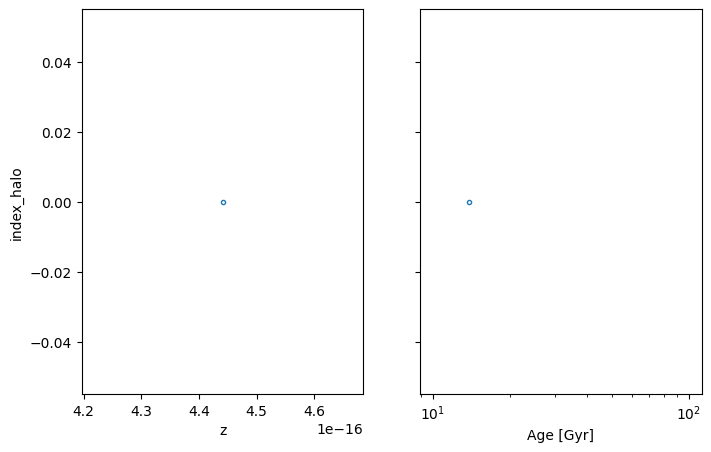

index_central


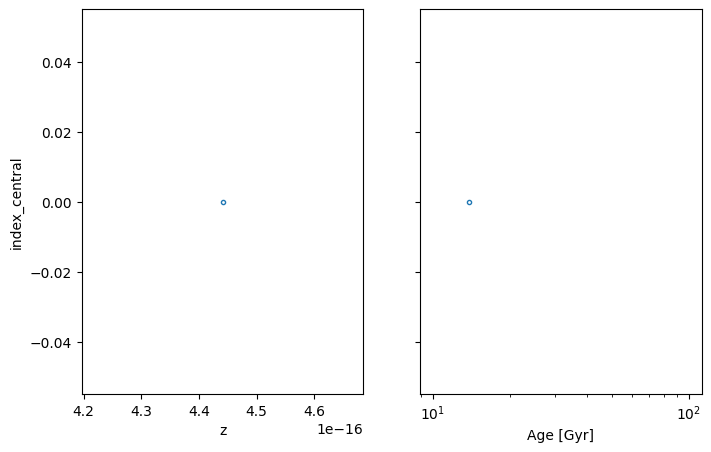

index_central_tracked


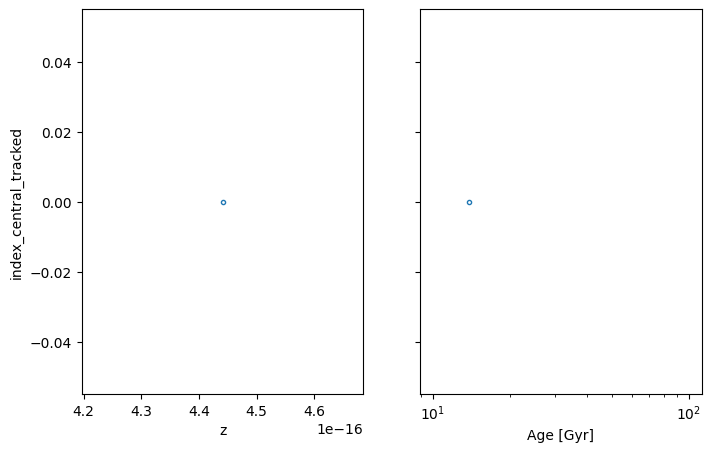

contamination_halo


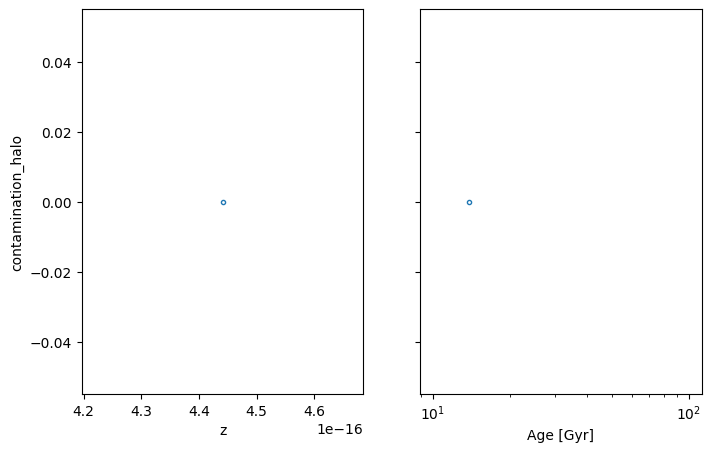

minpotpos_halo


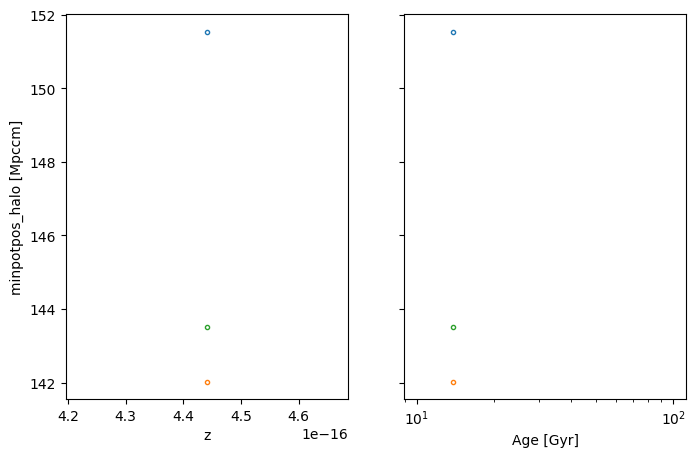

minpotpos_central


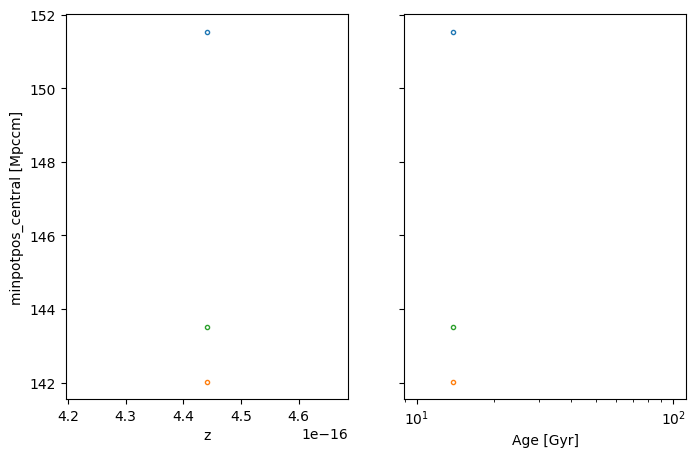

minpotpos_central_tracked


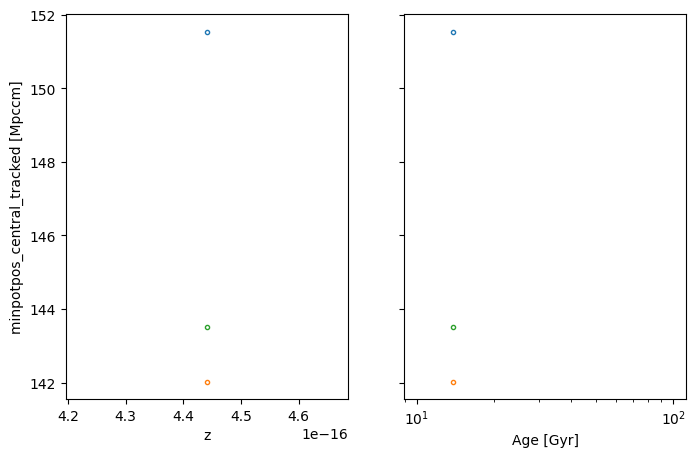

num_major_mergers_halo


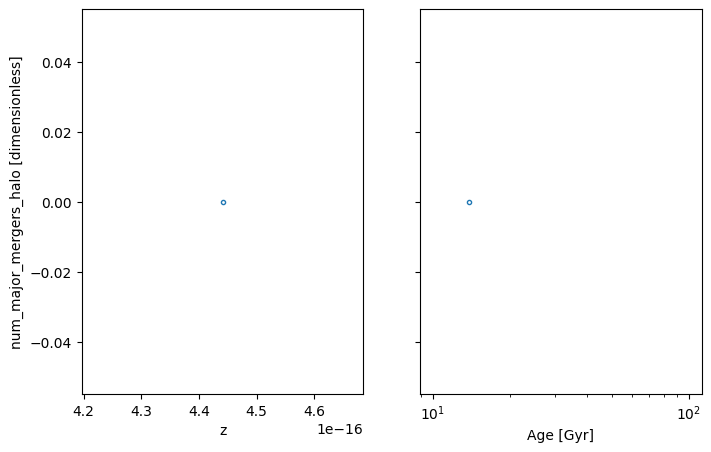

bh_mdot_central
[]
-2.3531555796008172
[]


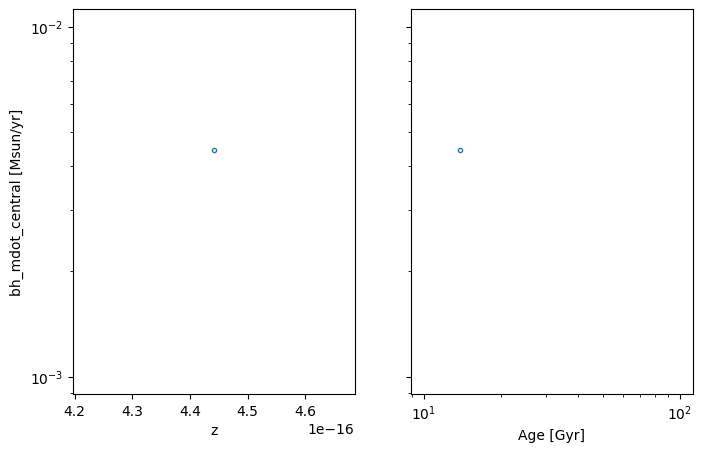

bh_mdot_central_tracked
[]
-2.3531555796008172
[]


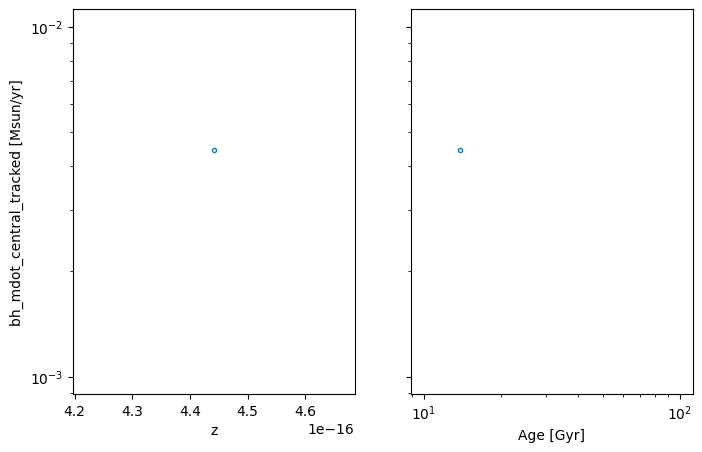

bh_fedd_central
[]
6.712327074582456
[]


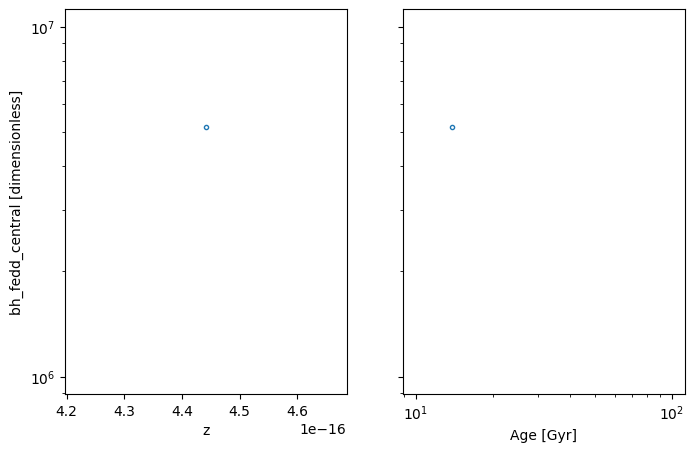

bh_fedd_central_tracked
[]
6.712327074582456
[]


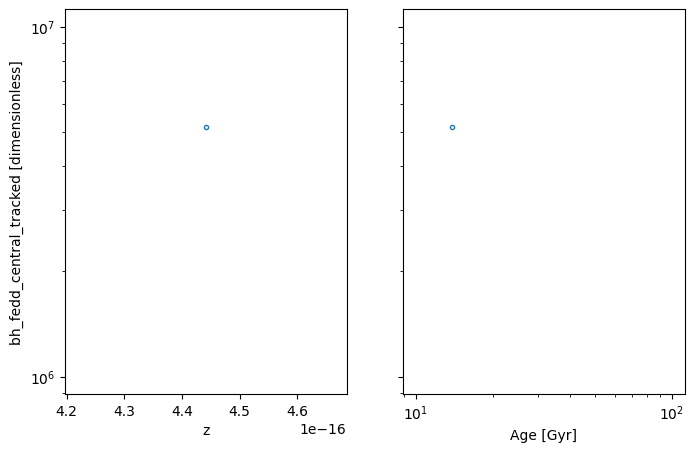

bh_mdot_edd_central
[]
-9.065482654183274
[]


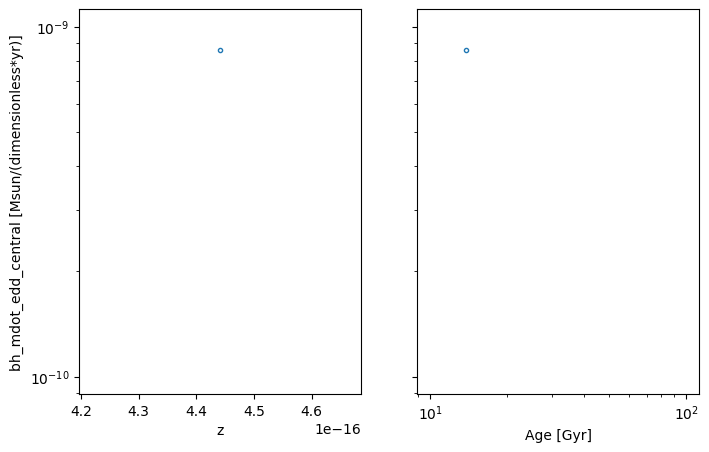

bh_mdot_edd_central_tracked
[]
-9.065482654183274
[]


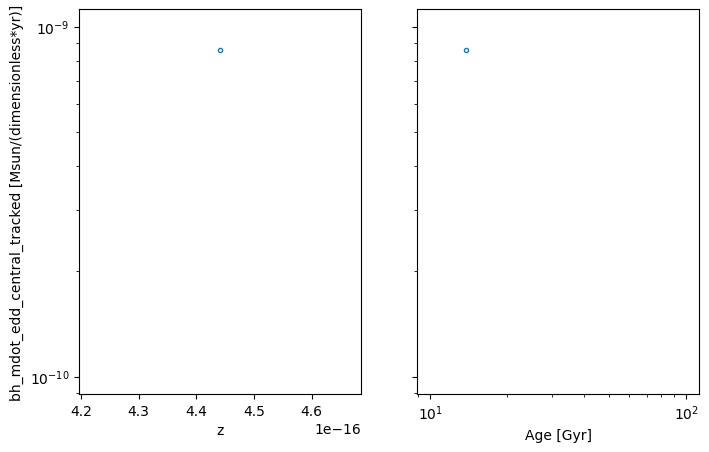

m2500c_halo
[]
12.567022358018196
[]


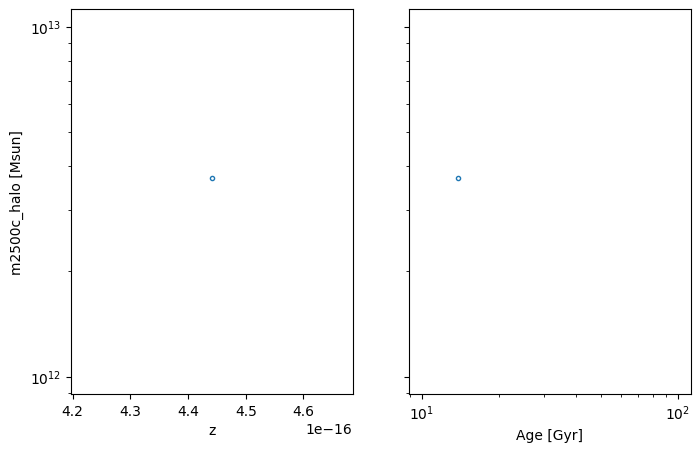

r2500c_halo
[]
2.1462109102034144
[]


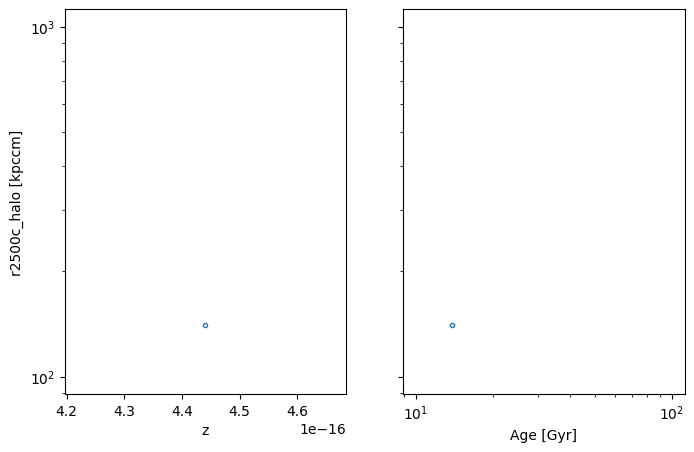

m500c_halo
[]
12.927878035935747
[]


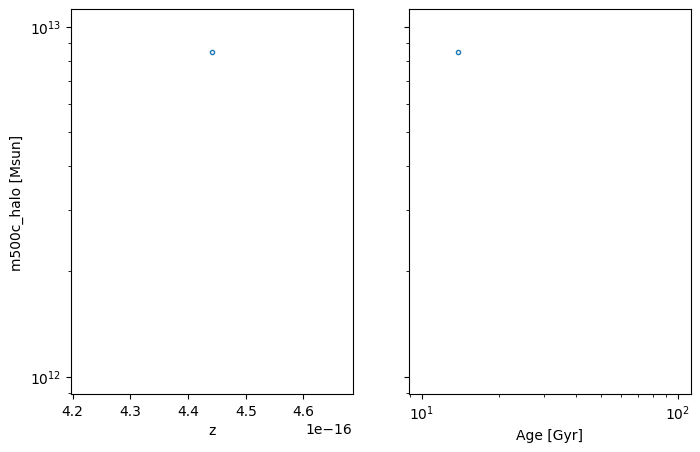

r500c_halo
[]
2.4994873936437054
[]


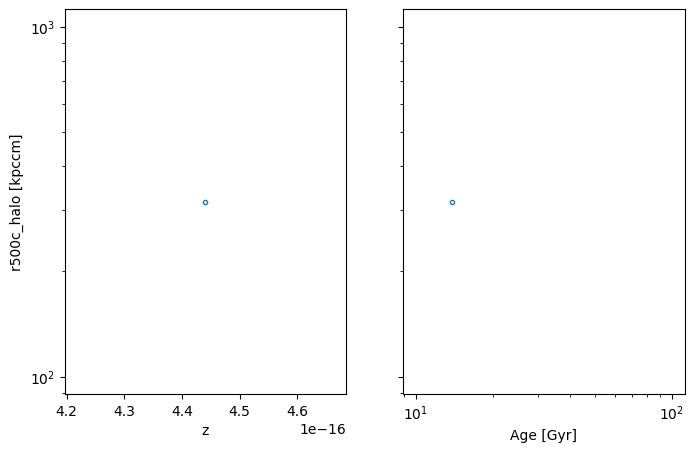

m200c_halo
[]
13.120543571568586
[]


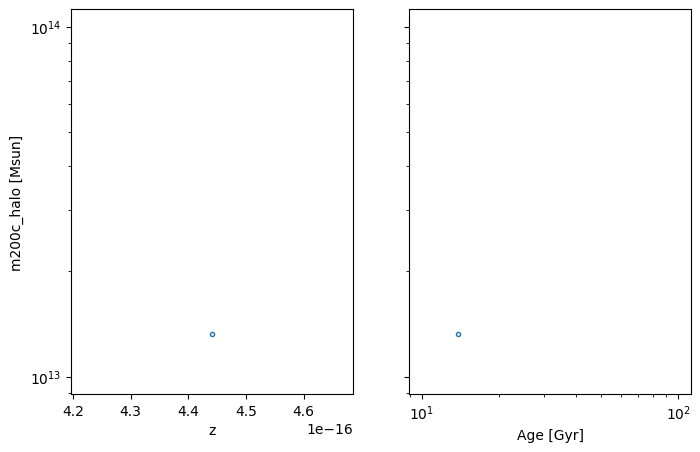

r200c_halo
[]
2.6963557220519463
[]


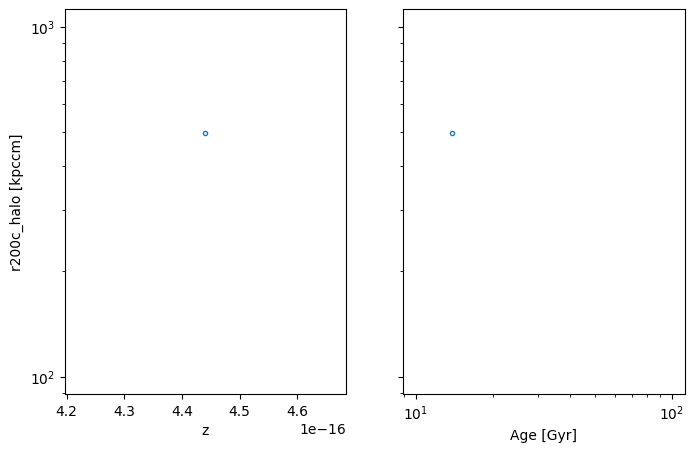

circular_velocity_halo


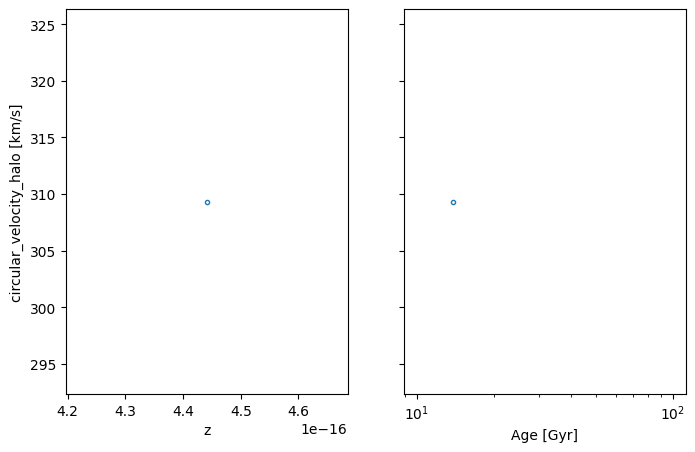

spin_param_halo


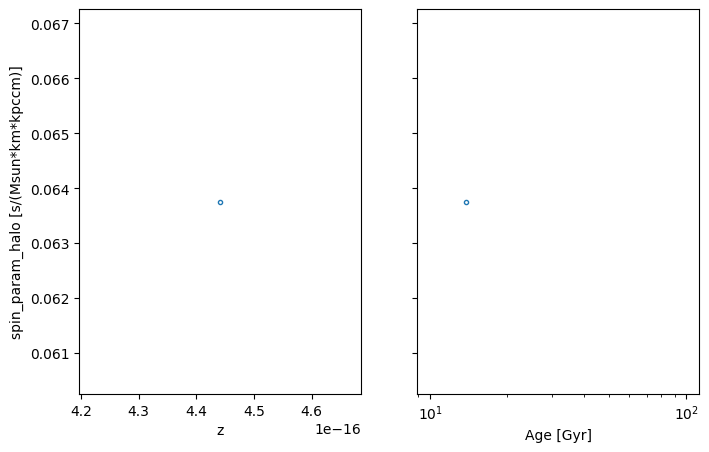

temperature_halo
[]
6.537131107087924
[]


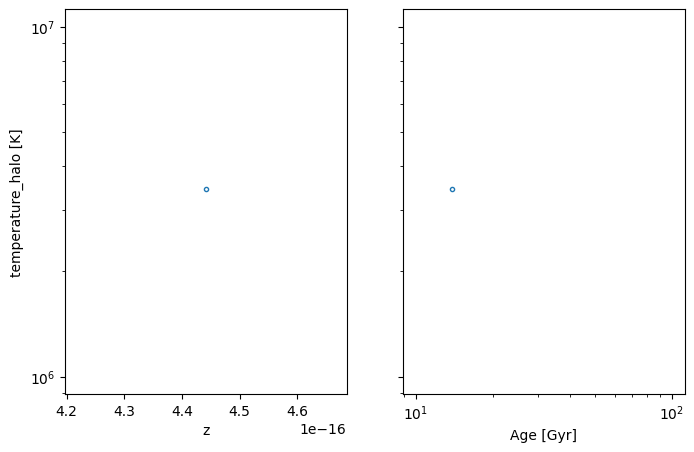

sfr_halo
[]
0.6764424487407841
[]


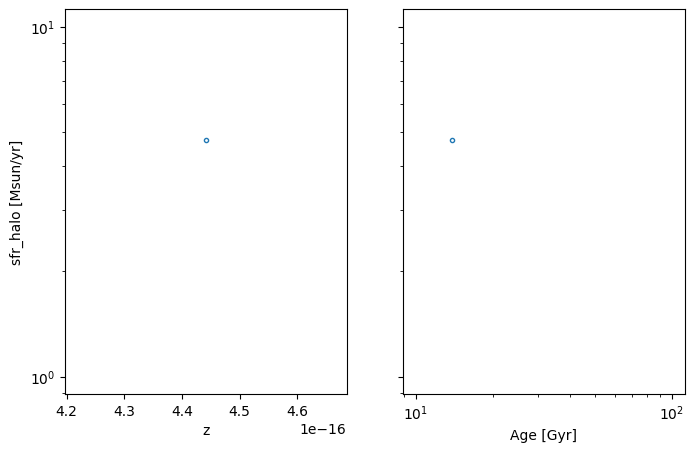

ssfr_halo
[]
-10.858278305515928
[]


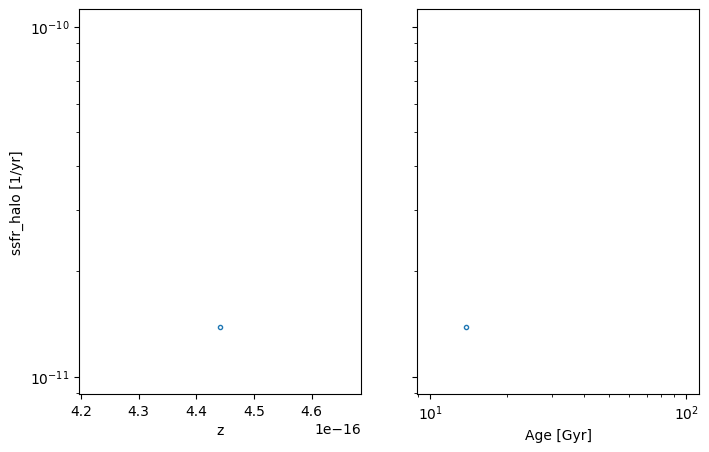

sfr_central
[]
0.24199654698075712
[]


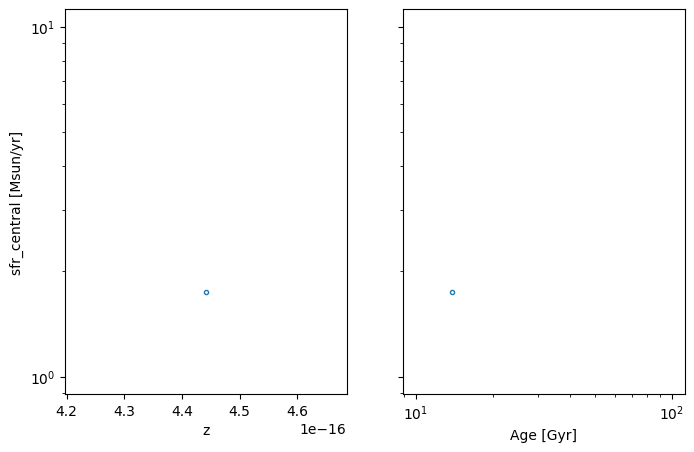

ssfr_central
[]
-10.878828027085389
[]


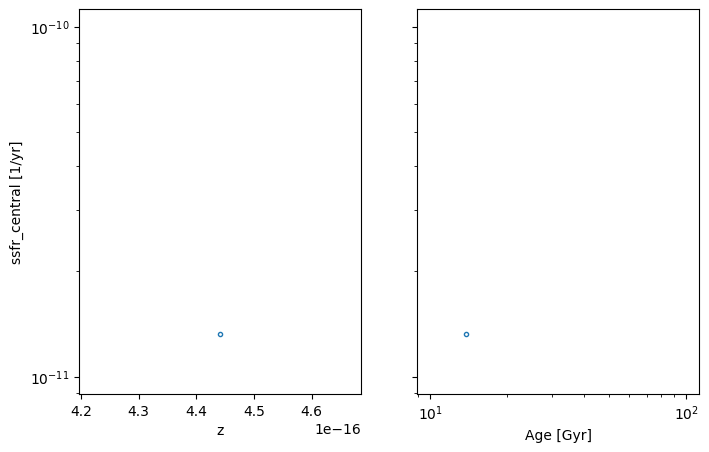

sfr_central_tracked
[]
0.24199654698075712
[]


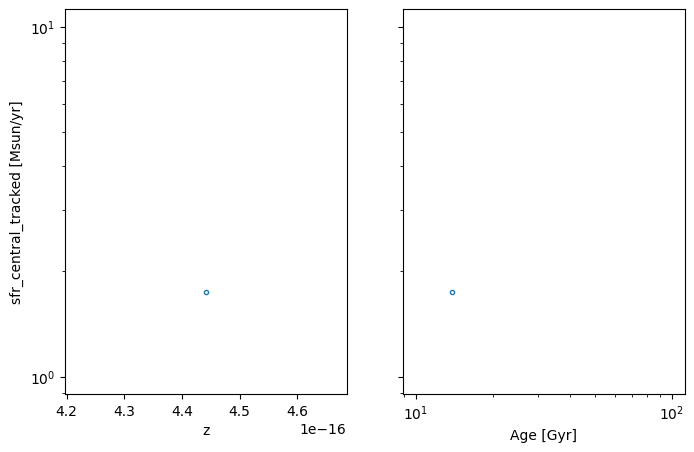

ssfr_central_tracked
[]
-10.878828027085389
[]


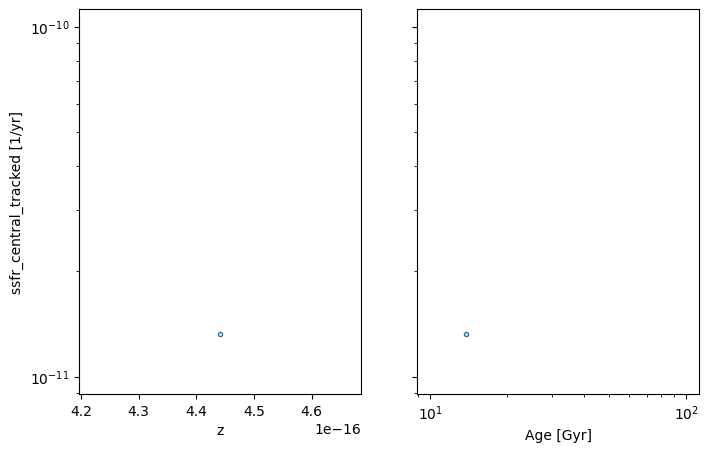

sfr_100_halo
[]
0.7022935328436085
[]


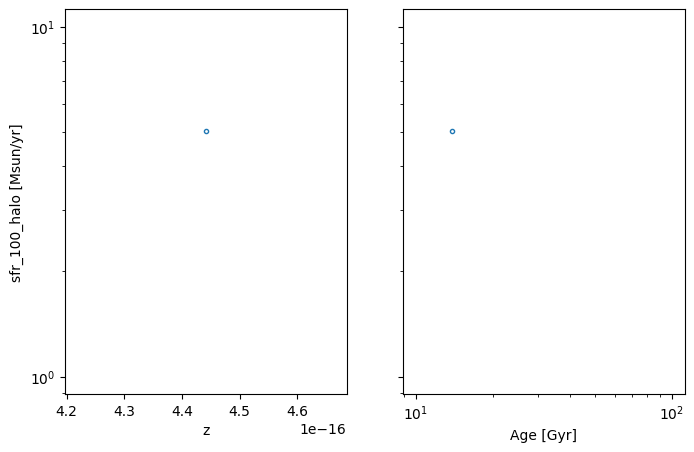

ssfr_100_halo
[]
-10.832427221413104
[]


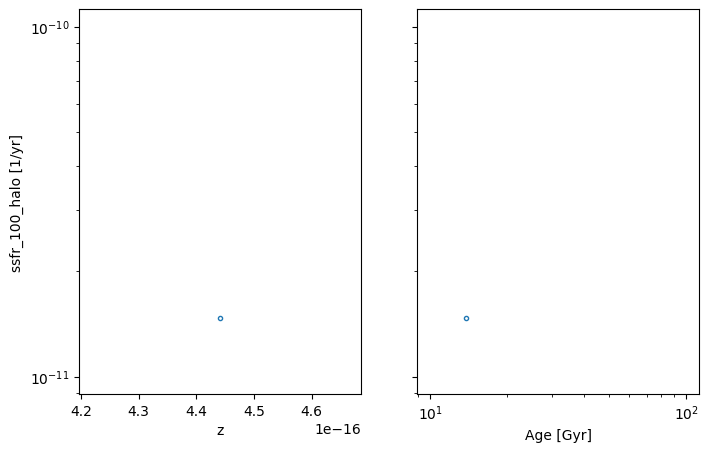

sfr_100_central
[]
0.33683705385150087
[]


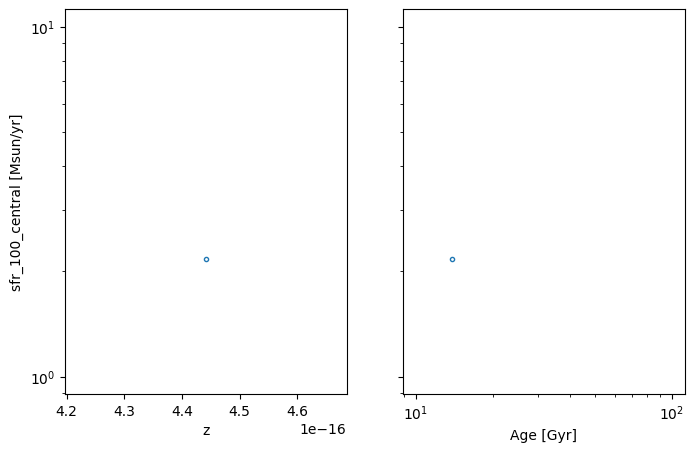

ssfr_100_central
[]
-10.783987520214646
[]


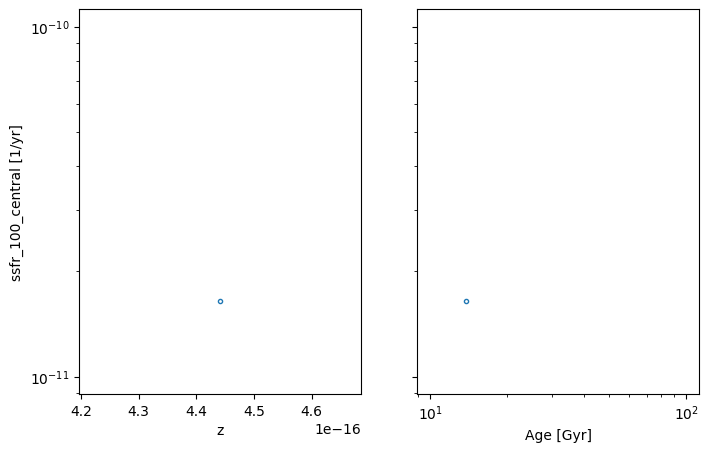

sfr_100_central_tracked
[]
0.33683705385150087
[]


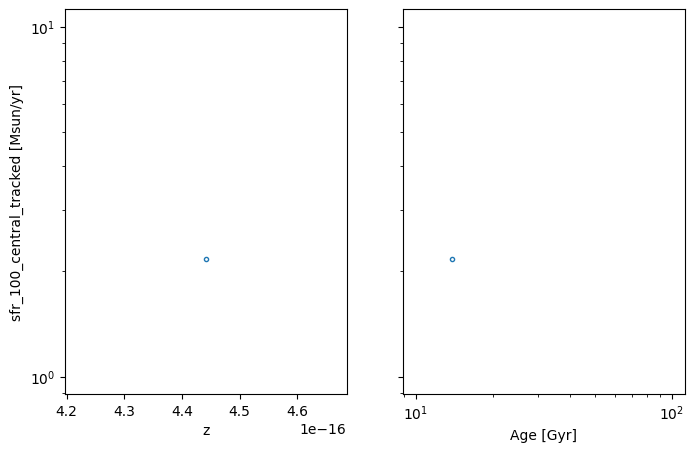

ssfr_100_central_tracked
[]
-10.783987520214646
[]


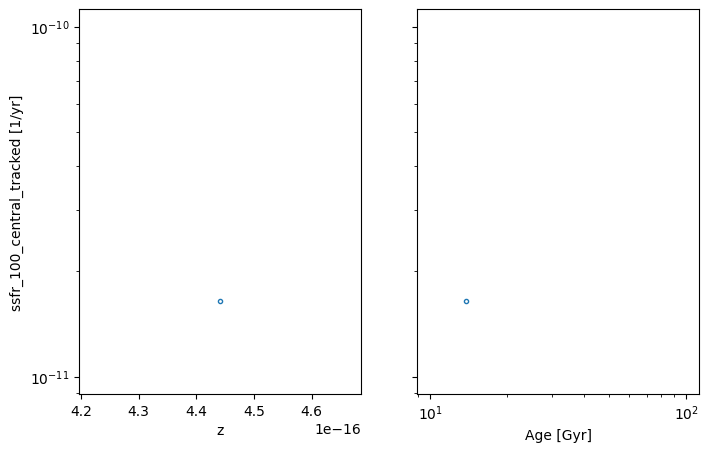

gas_mass_halo
[]
12.176574578236826
[]


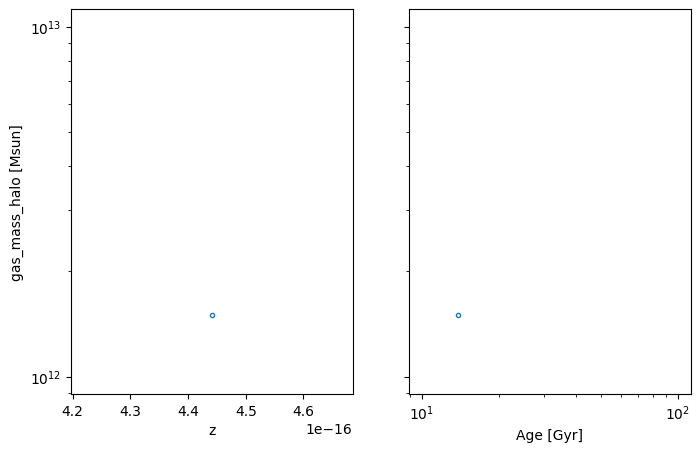

stellar_mass_halo
[]
11.534720754256712
[]


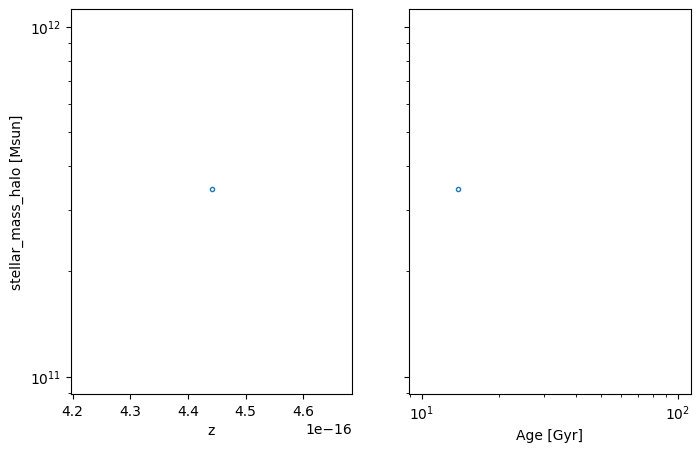

dm_mass_halo
[]
13.220963868799206
[]


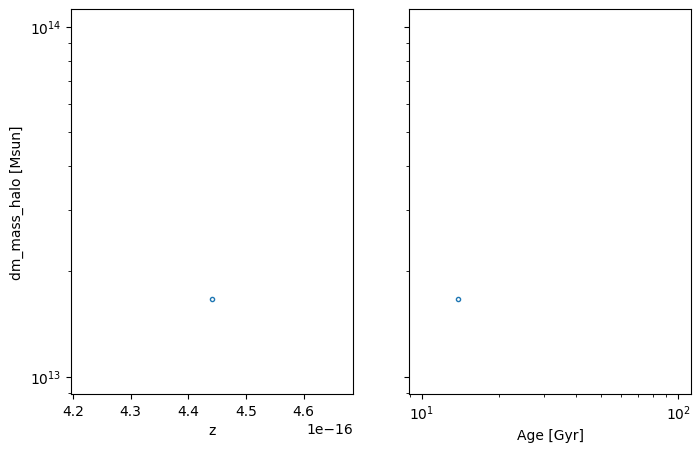

dust_mass_halo
[]
7.200855085092807
[]


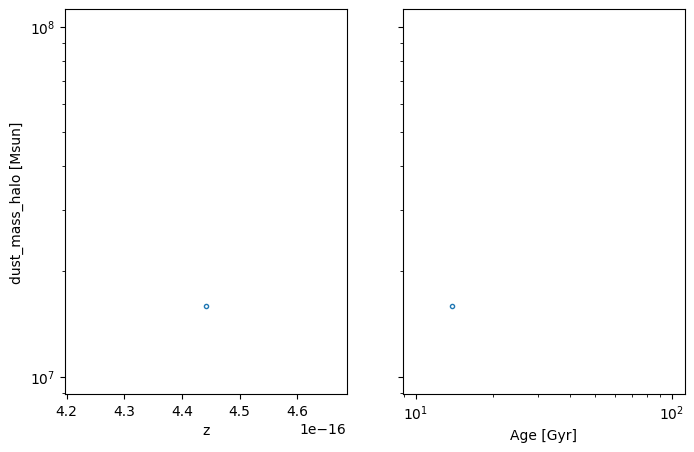

H2_mass_halo
[]
9.634269002340304
[]


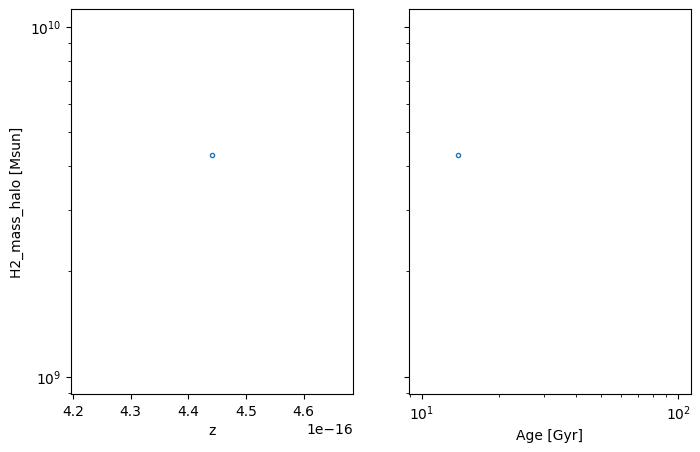

gas_half_mass_radius_halo
[]
2.6119199937838093
[]


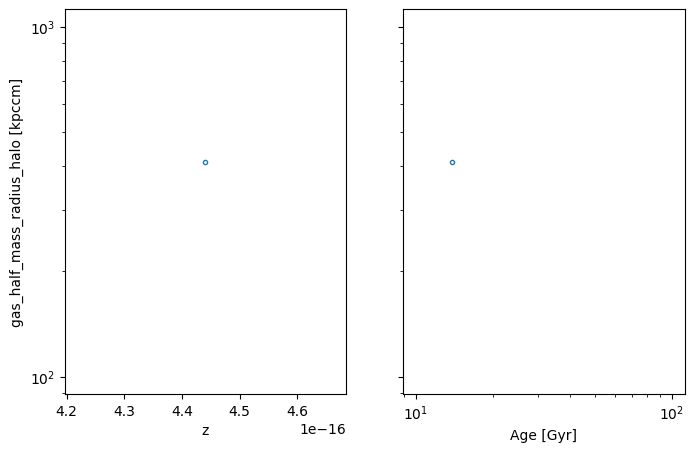

gas_r20_radius_halo
[]
2.3742659709556264
[]


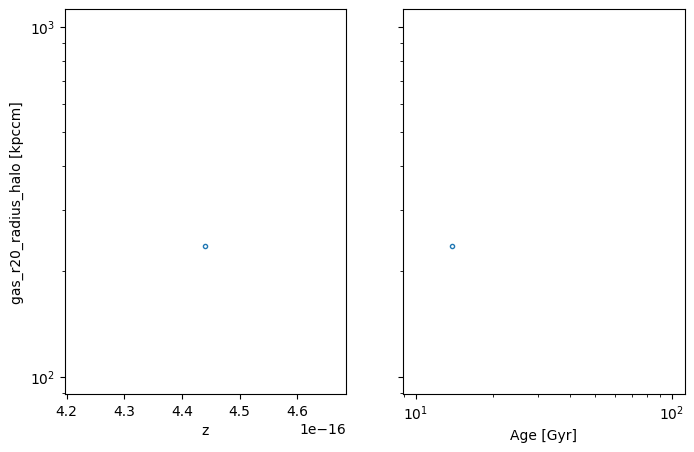

gas_r80_radius_halo
[]
2.7837065614458356
[]


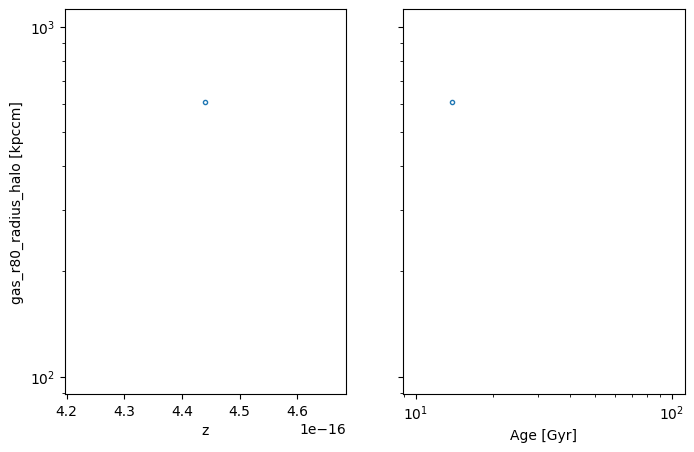

stellar_half_mass_radius_halo
[]
1.6427253026751698
[]


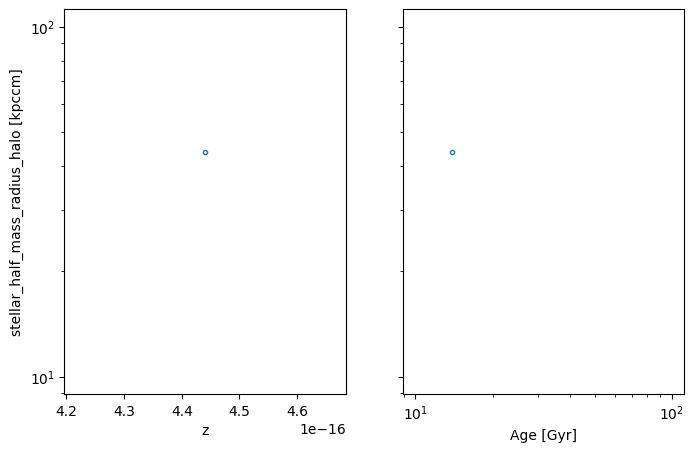

stellar_r20_radius_halo
[]
0.7014684414314999
[]


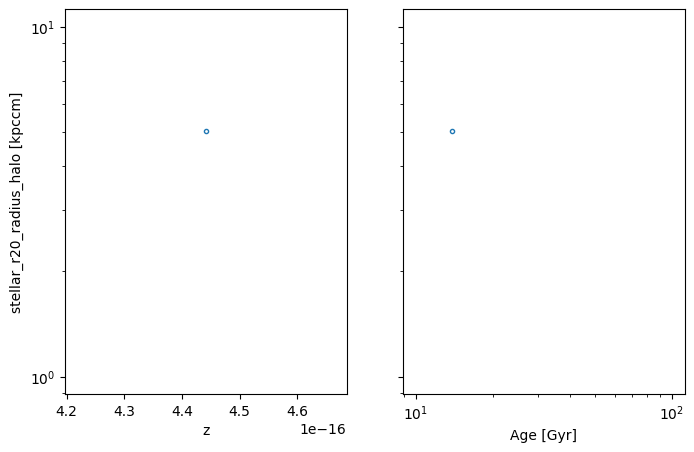

stellar_r80_radius_halo
[]
2.564012317260503
[]


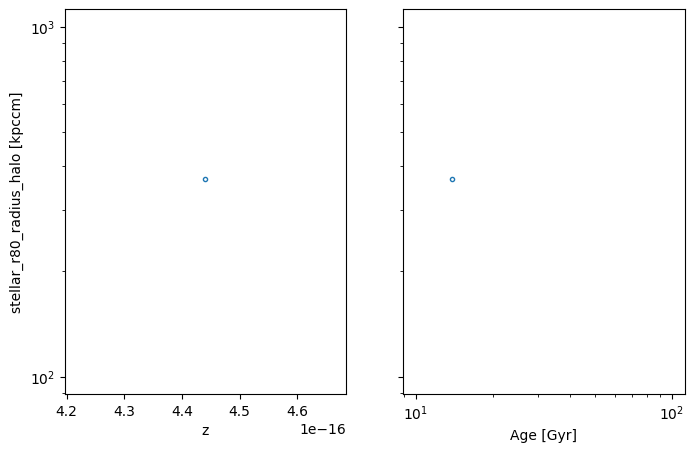

dm_half_mass_radius_halo
[]
2.5332328002243987
[]


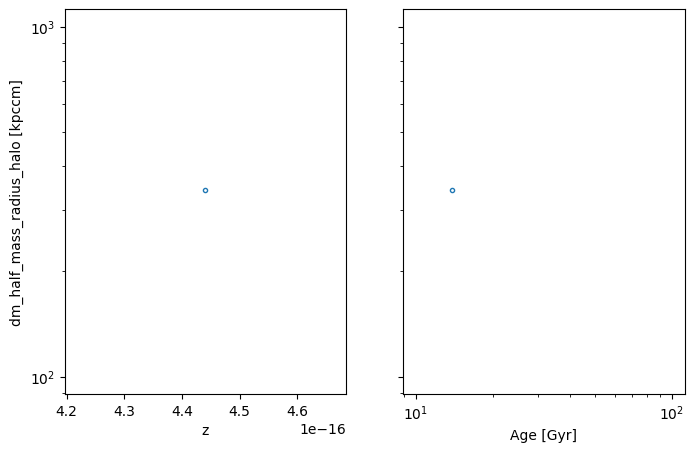

dm_r20_radius_halo
[]
2.1462141283125935
[]


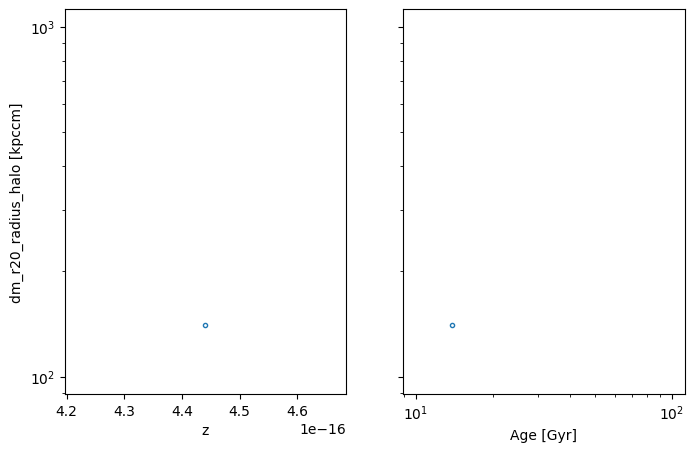

dm_r80_radius_halo
[]
2.7627800027004907
[]


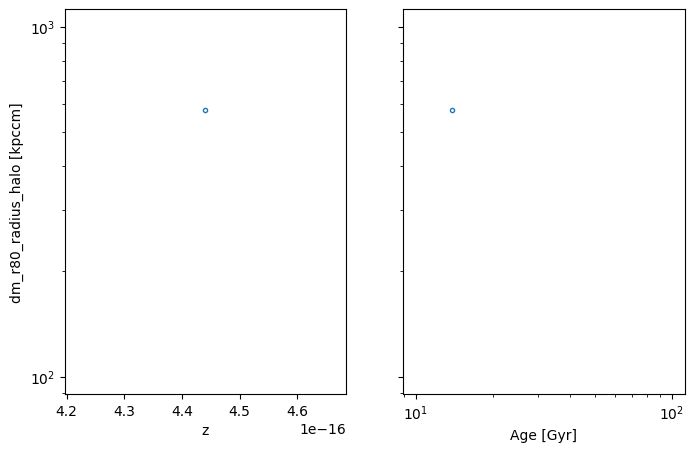

baryon_half_mass_radius_halo
[]
2.566785399589931
[]


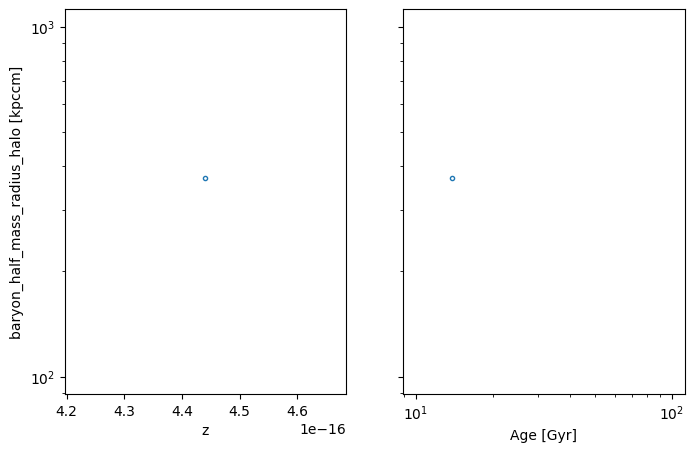

baryon_r20_radius_halo
[]
2.1563645689137783
[]


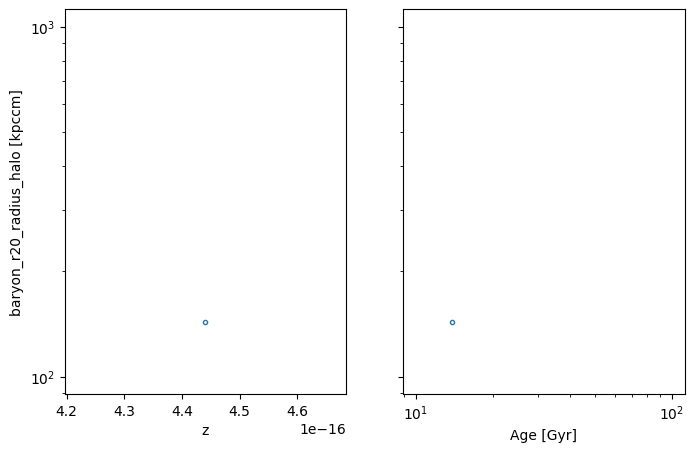

baryon_r80_radius_halo
[]
2.762231098150142
[]


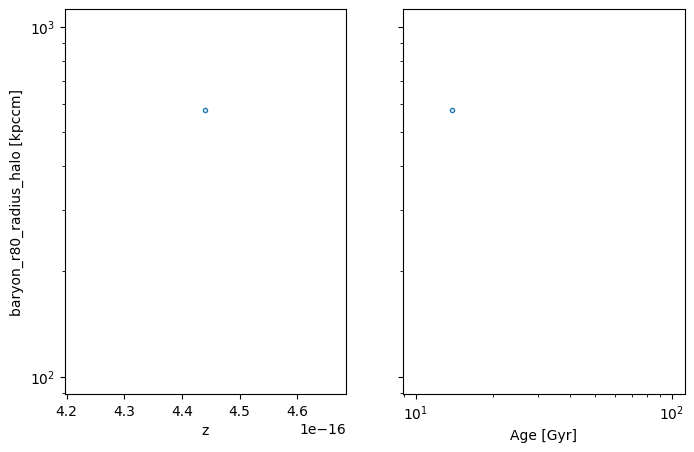

total_half_mass_radius_halo
[]
2.5367878929633334
[]


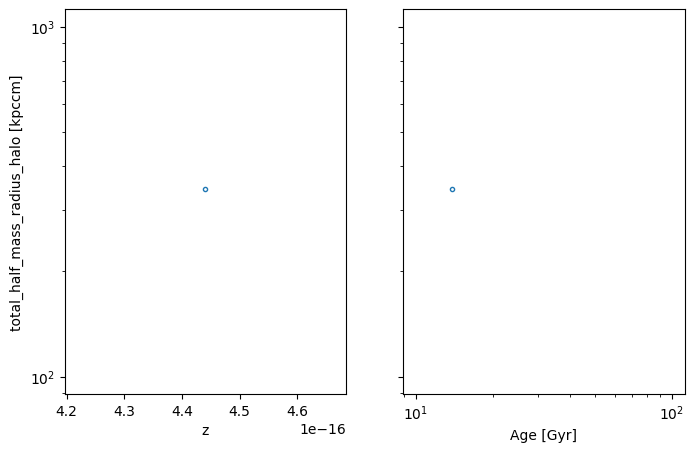

total_r20_radius_halo
[]
2.146711512659895
[]


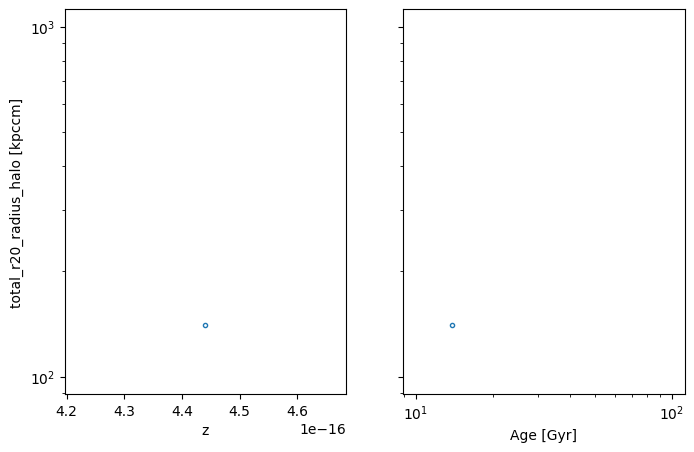

total_r80_radius_halo
[]
2.7627124861652446
[]


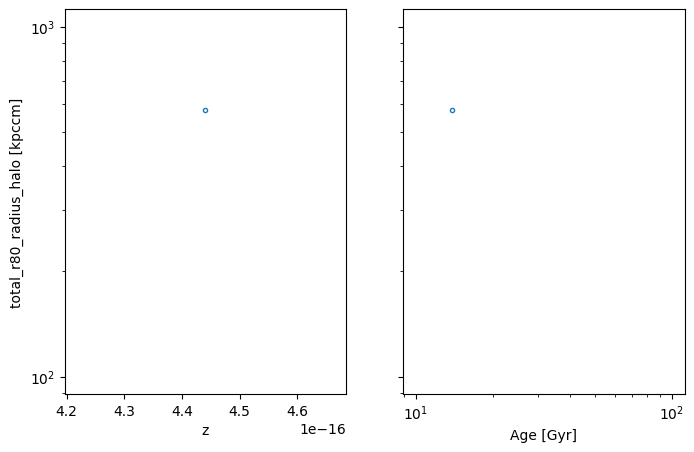

mass_weighted_metallicity_halo


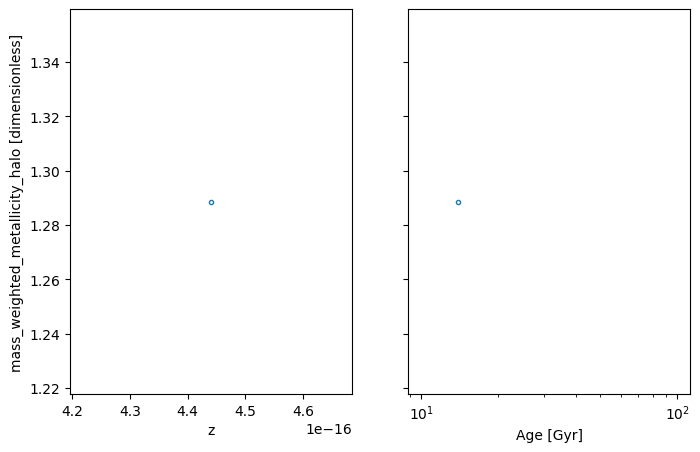

sfr_weighted_metallicity_halo


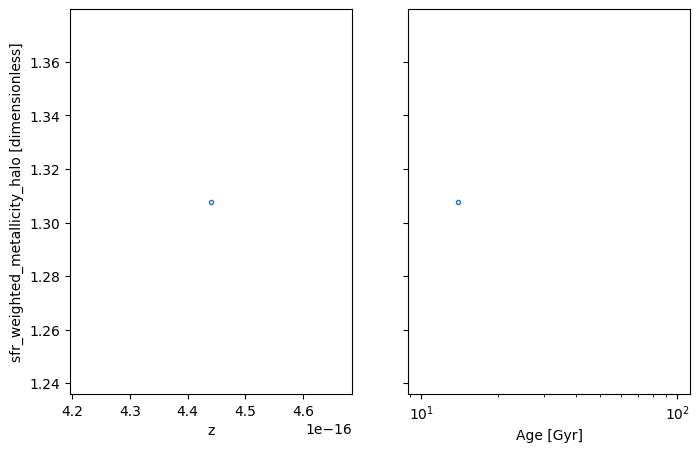

stellar_metallicity_halo


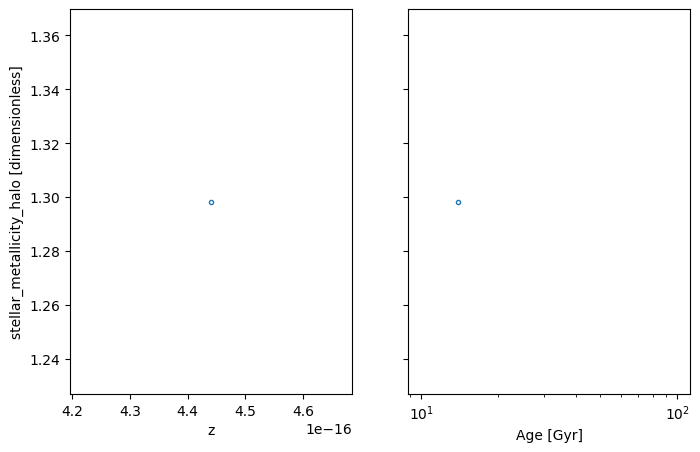

mass_weighted_cgm_metallicity_halo


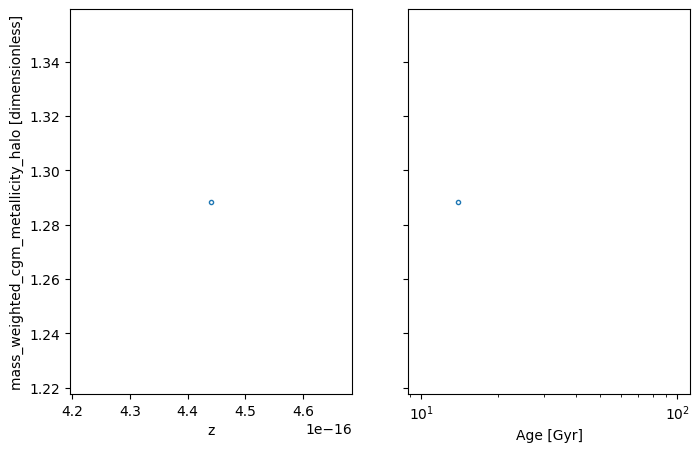

temp_weighted_cgm_metallicity_halo
[]
0.10996275665132077
[]


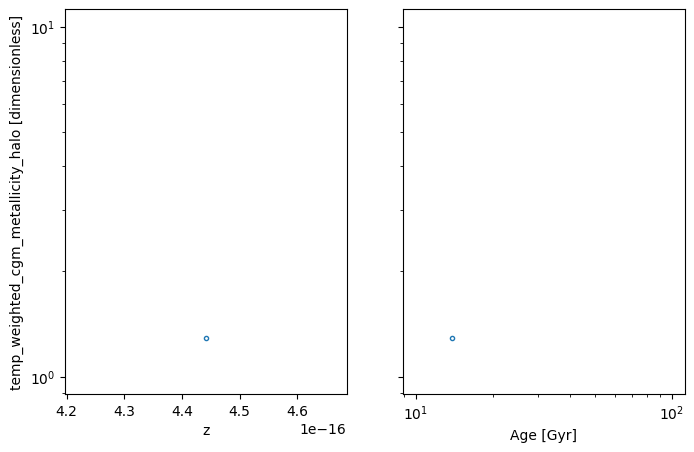

gas_velocity_dispersion_halo


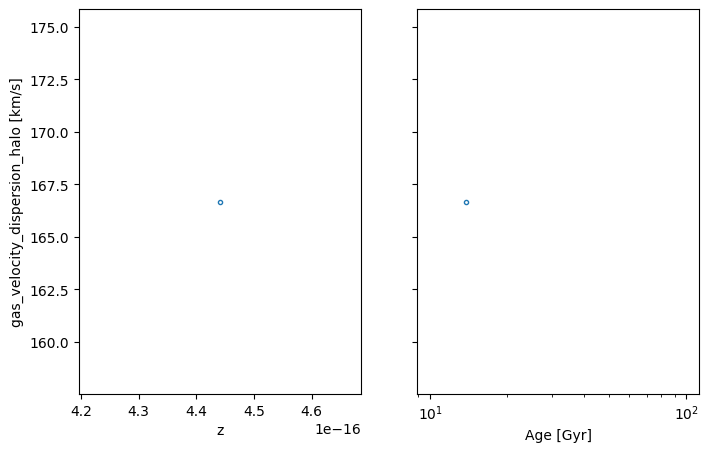

stellar_velocity_dispersion_halo


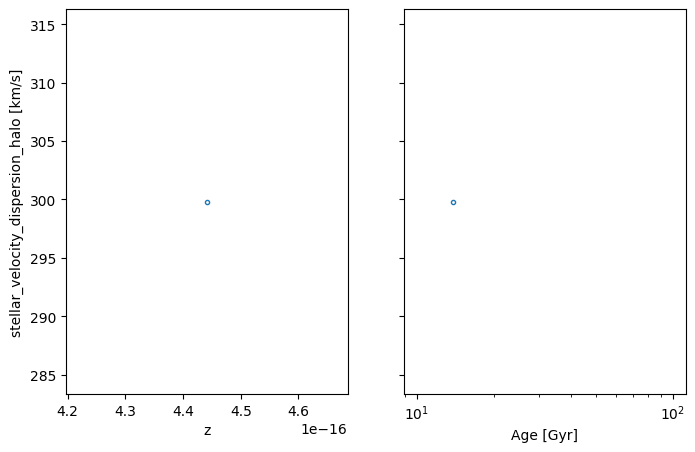

dm_velocity_dispersion_halo


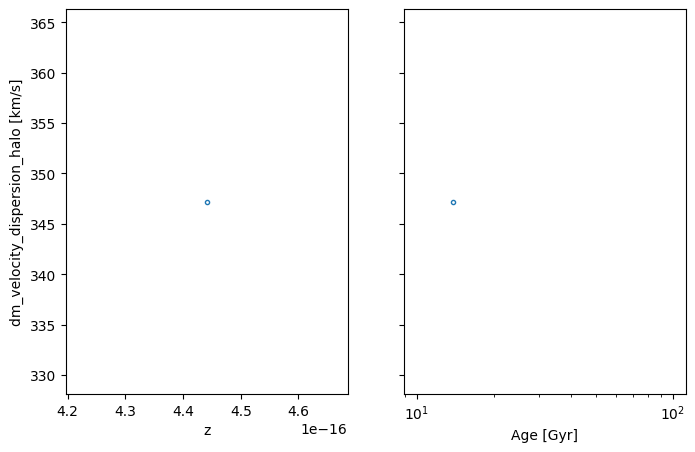

baryon_velocity_dispersion_halo


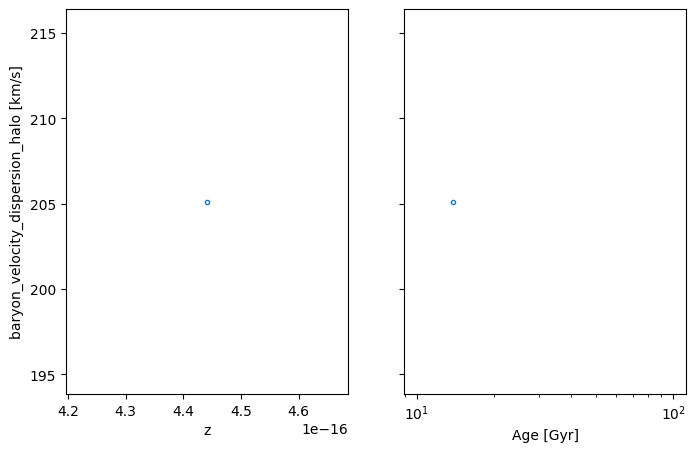

total_velocity_dispersion_halo


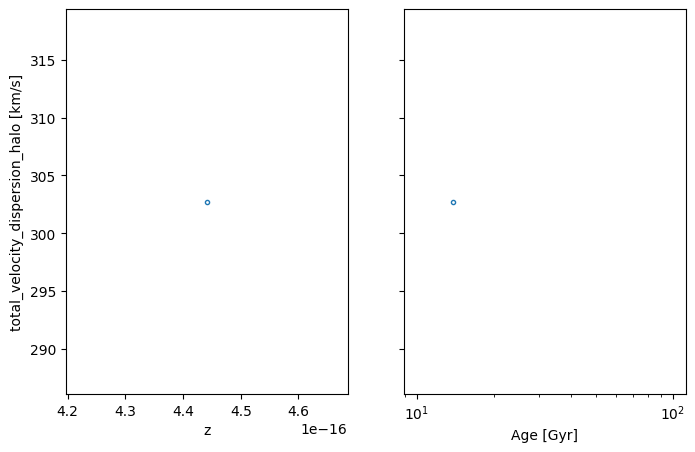

mass_weighted_stellar_age_halo
[]
0.9148039277621339
[]


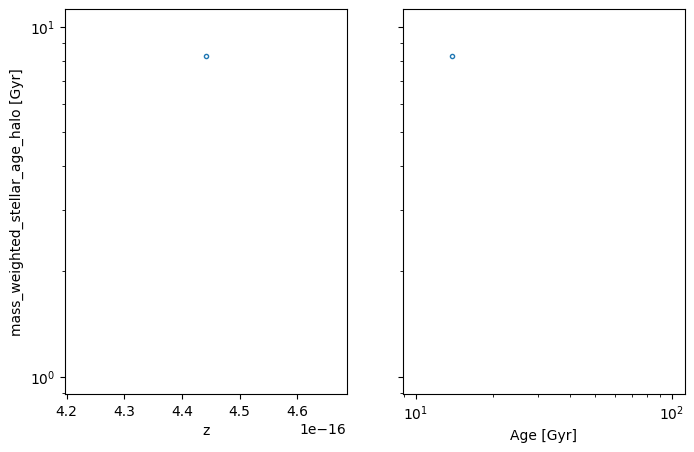

metal_weighted_stellar_age_halo
[]
0.9141368066339968
[]


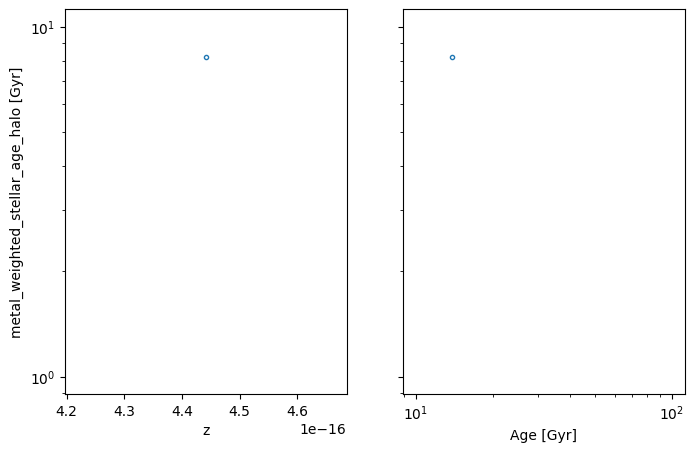

mass_weighted_temperature_halo
[0]
[0.1]


/tmp/ipykernel_12604/1681779787.py:57: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax[0].set_yscale('log')


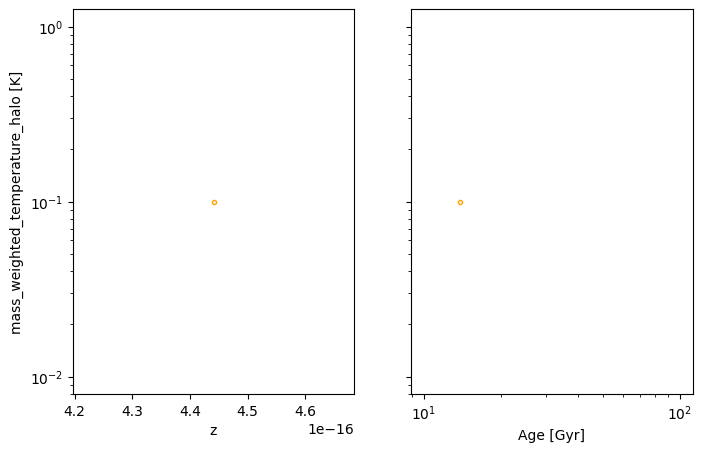

mass_weighted_cgm_temperature_halo
[]
6.41311183823319
[]


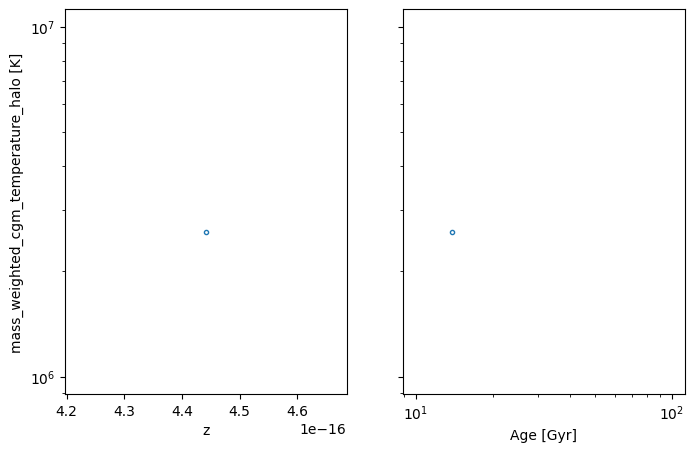

local_mass_density_300kpccm_halo
[]
5.213178154542901
[]


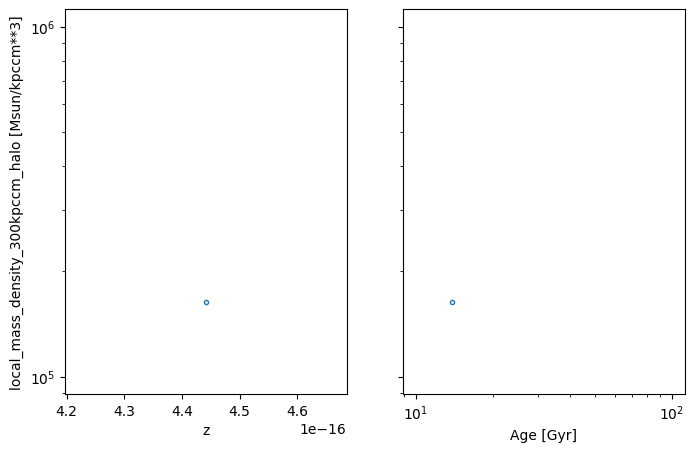

local_number_density_300kpccm_halo
[]
-8.053452373461422
[]


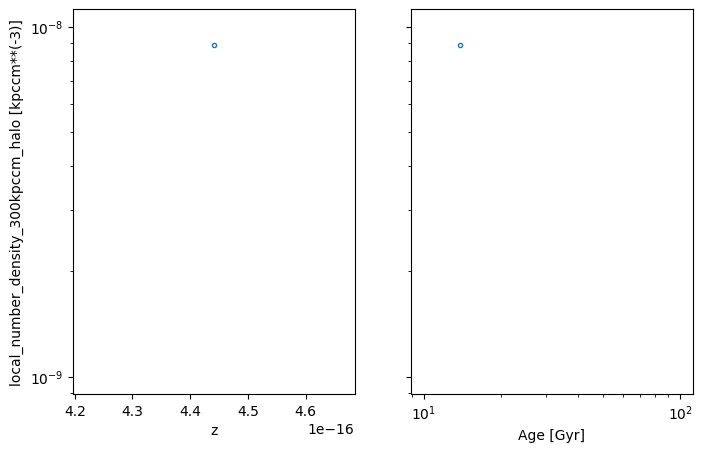

local_mass_density_1000kpccm_halo
[]
3.6514111030110157
[]


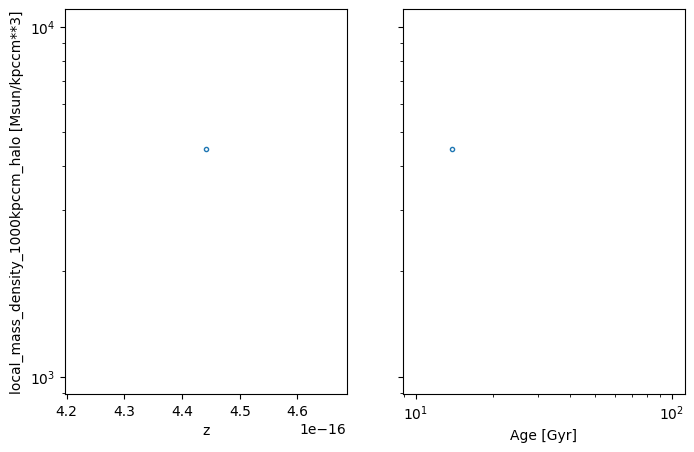

local_number_density_1000kpccm_halo
[]
-6.929241690025203
[]


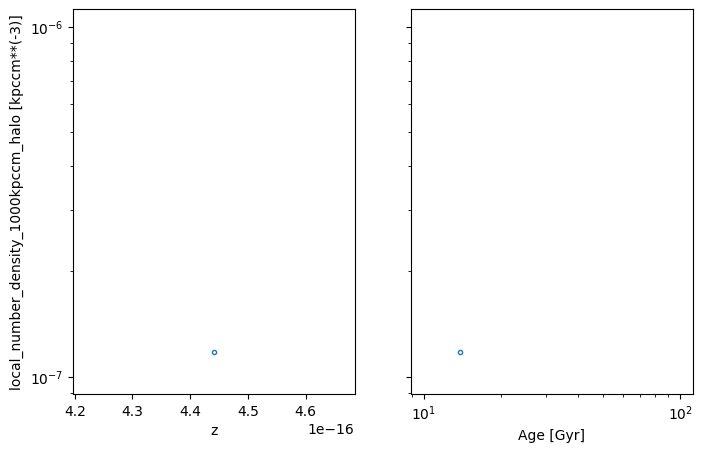

local_mass_density_3000kpccm_halo
[]
2.2940837009658392
[]


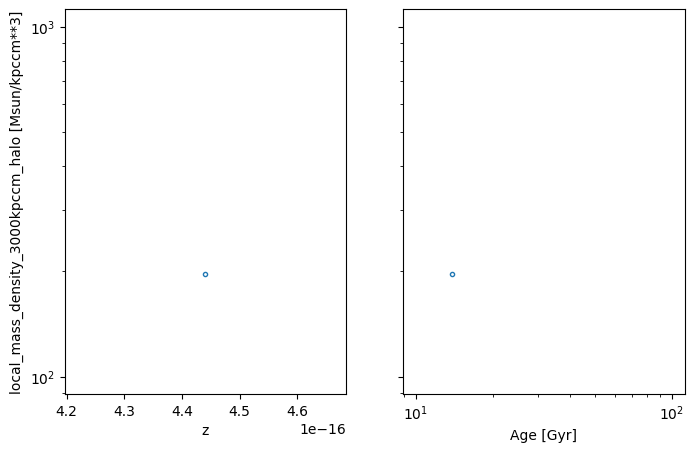

local_number_density_3000kpccm_halo
[]
-7.9610826738323
[]


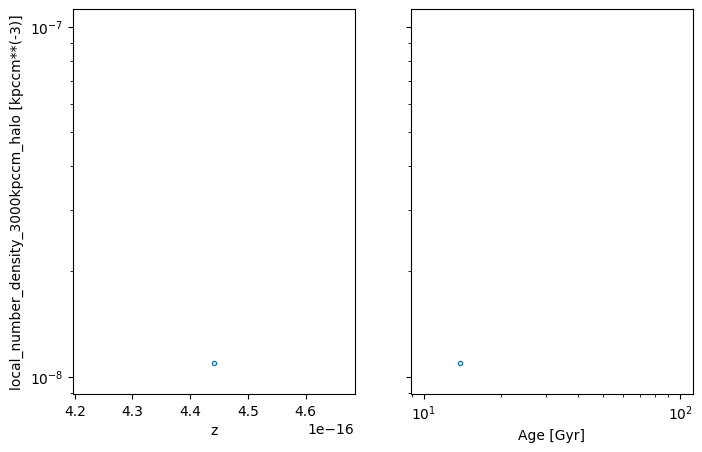

gas_mass_central
[]
9.627095155414706
[]


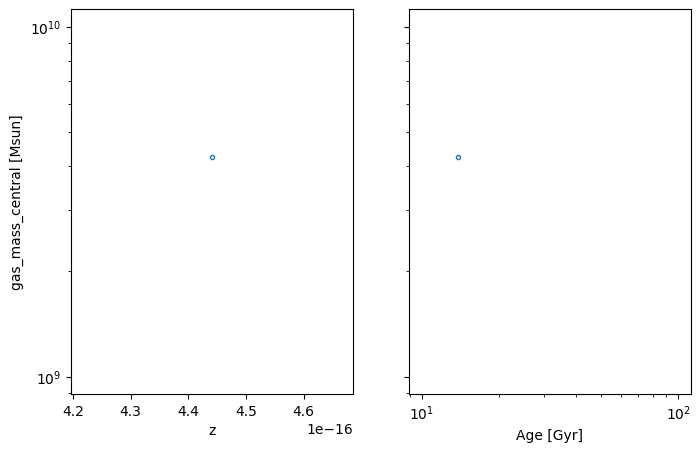

gas_30kpc_mass_central
[]
10.226185454903925
[]


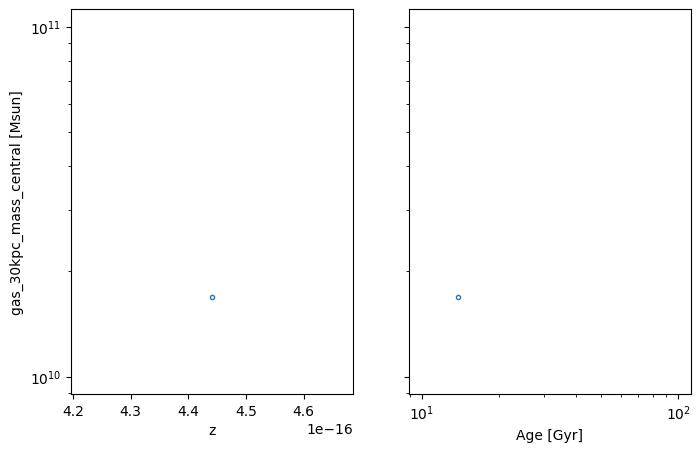

stellar_mass_central
[]
11.120824574066146
[]


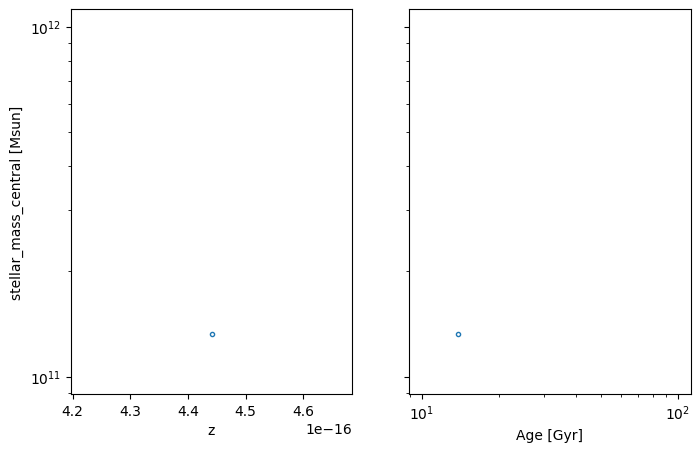

bh_mass_central
[]
-1.4117971018420699
[]


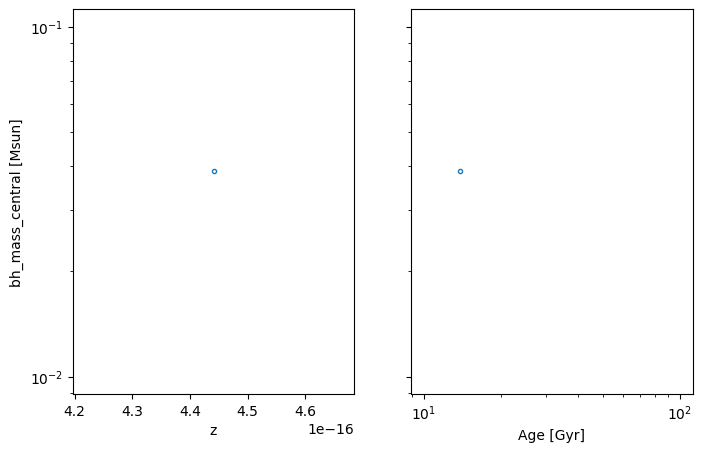

bh_30kpc_mass_central
[]
-1.411352251610622
[]


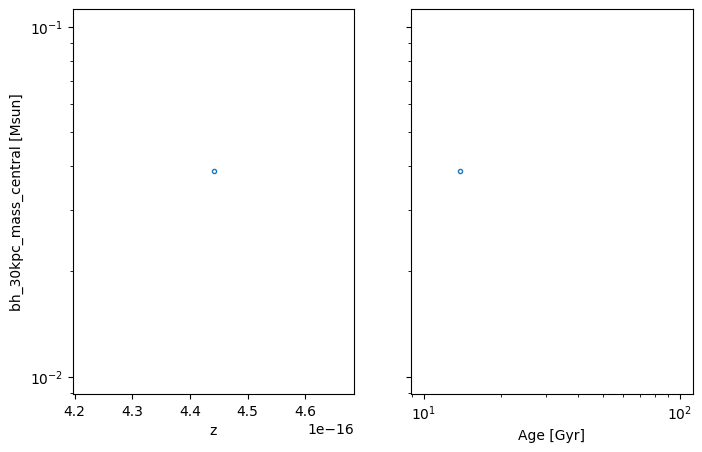

dust_mass_central
[]
6.720290743669673
[]


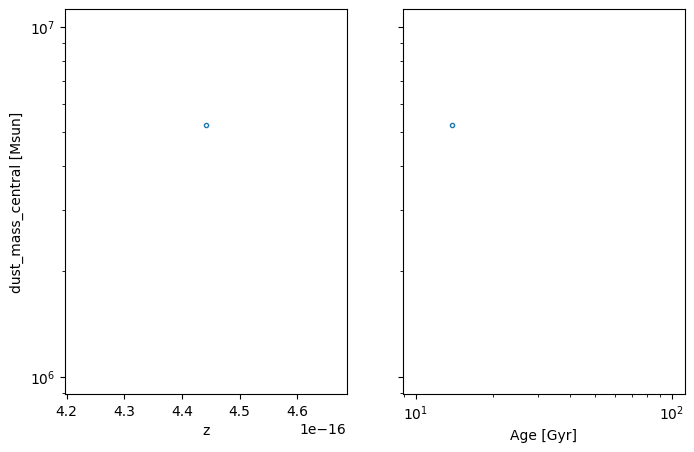

HI_mass_central
[]
9.96940723623272
[]


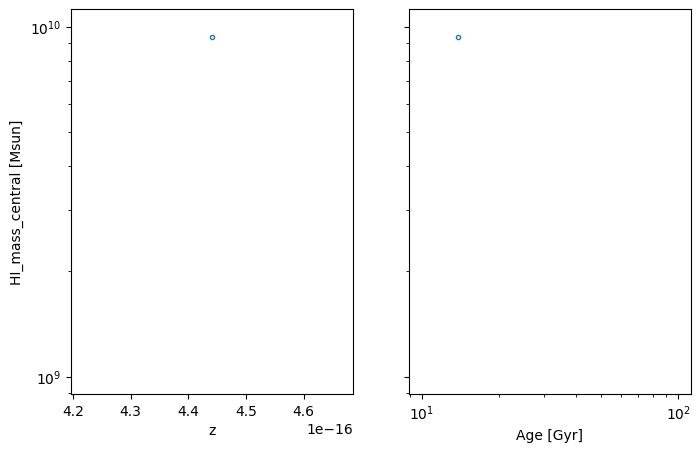

HI_30kpc_mass_central
[]
9.755082902332445
[]


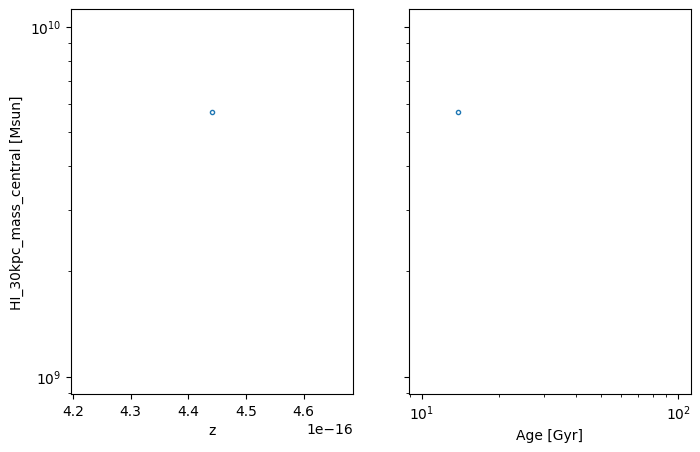

H2_mass_central
[]
9.176795831966404
[]


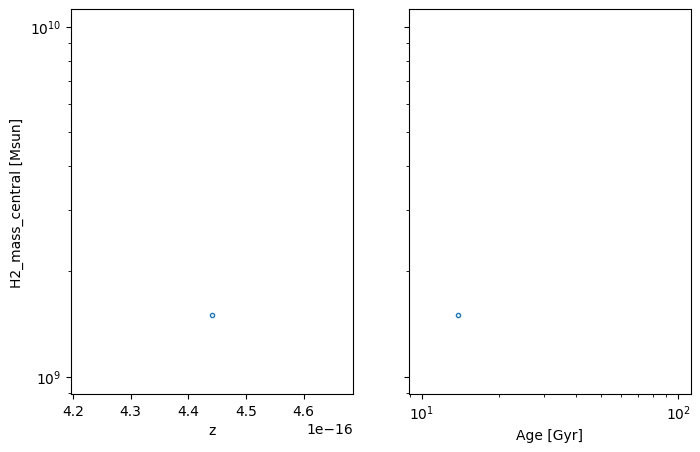

H2_30kpc_mass_central
[]
9.175895322188847
[]


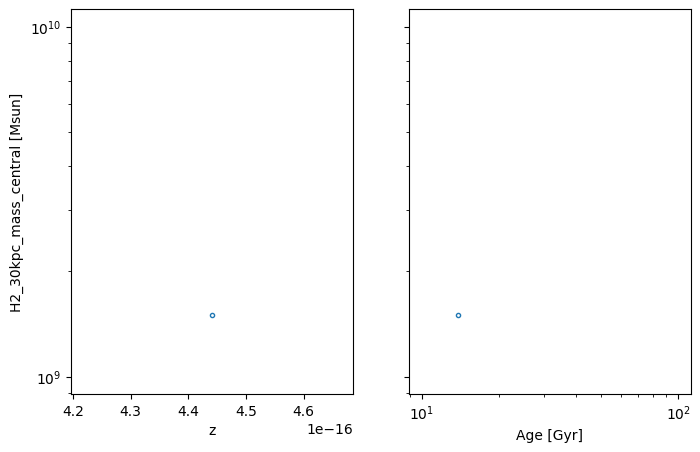

gas_half_mass_radius_central
[]
0.6663819115178722
[]


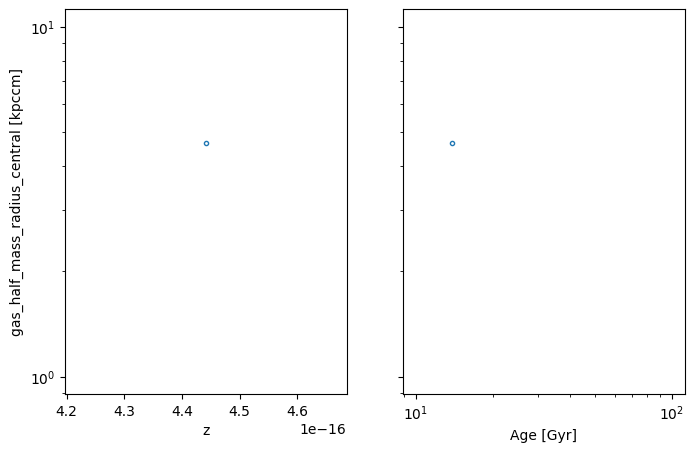

gas_r20_radius_central
[]
0.6106198521983353
[]


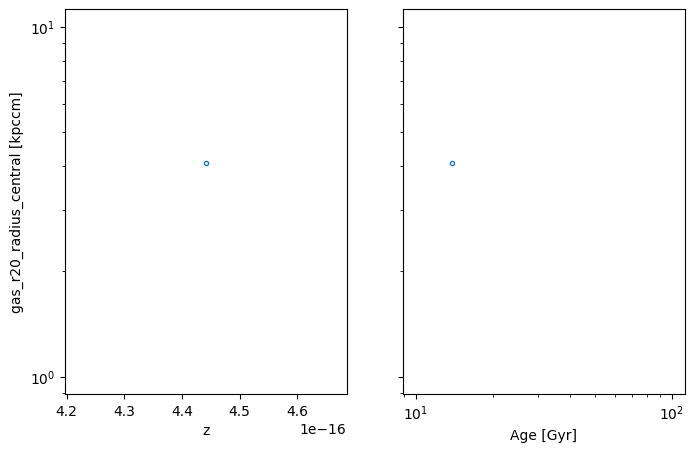

gas_r80_radius_central
[]
0.8194553745373233
[]


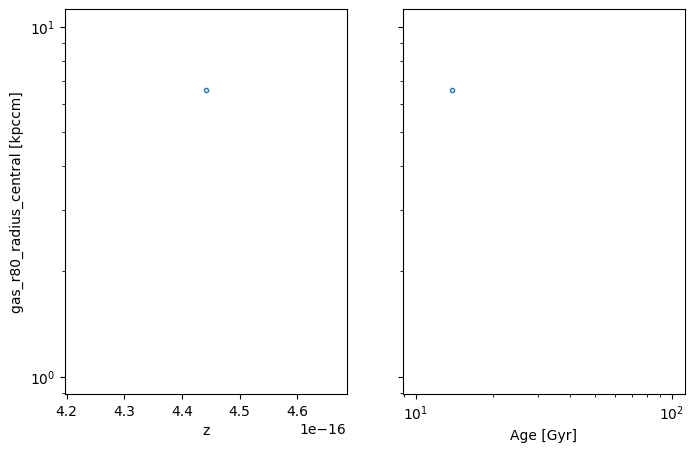

stellar_half_mass_radius_central
[]
0.6718225466691272
[]


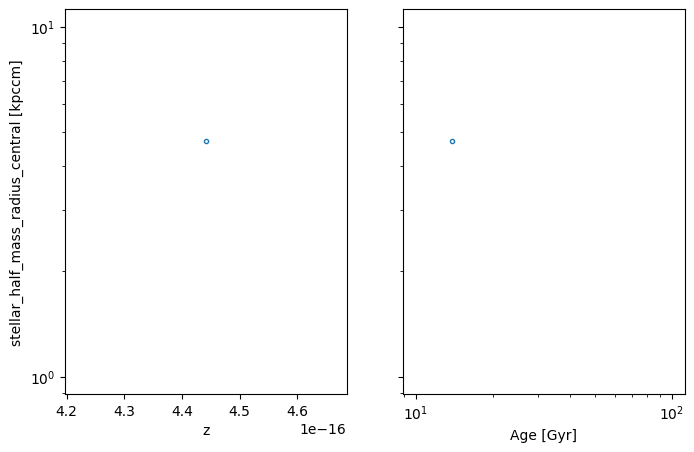

stellar_r20_radius_central
[]
0.4058849968338123
[]


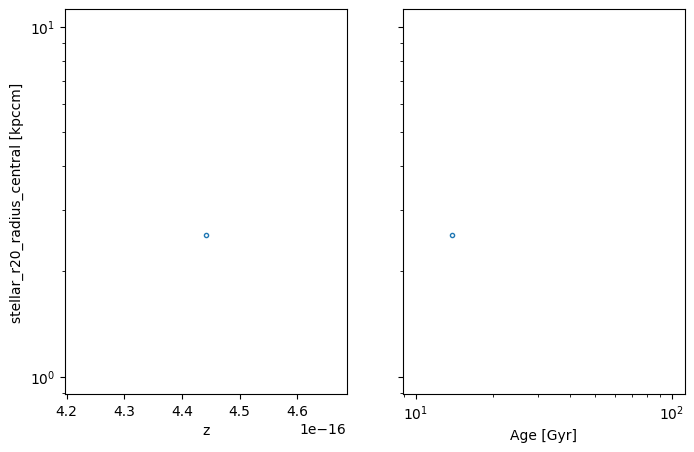

stellar_r80_radius_central
[]
0.9728237070631568
[]


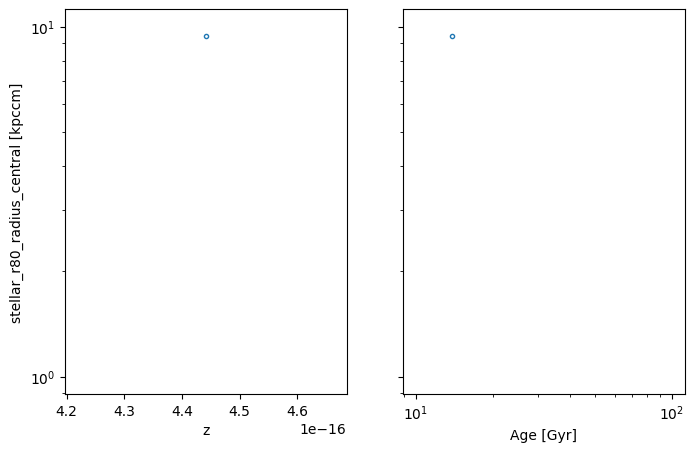

baryon_half_mass_radius_central
[]
0.6709074827004388
[]


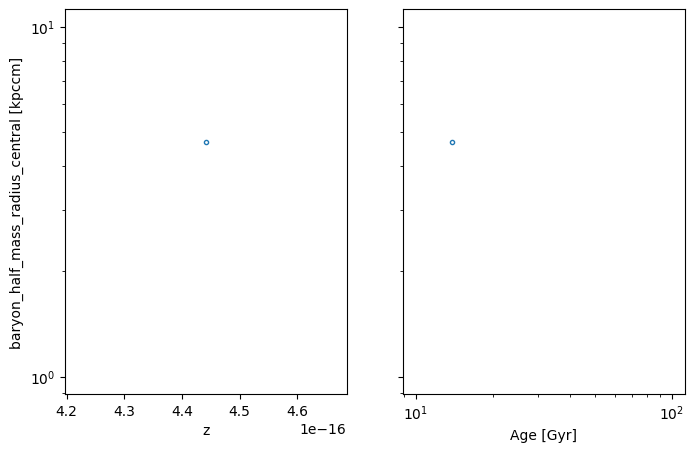

baryon_r20_radius_central
[]
0.4132256235381567
[]


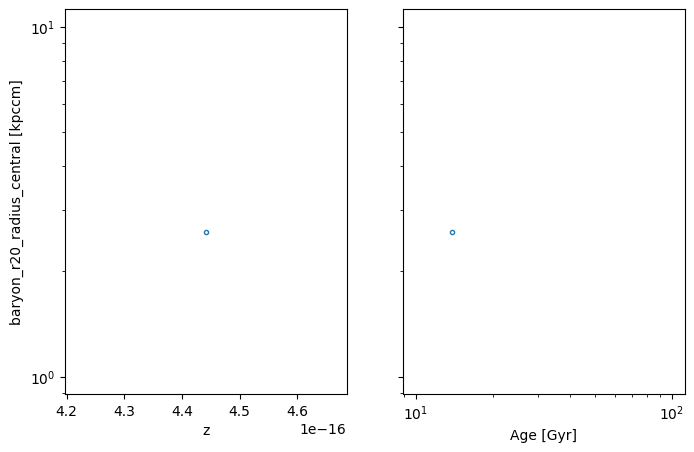

baryon_r80_radius_central
[]
0.9682050592488409
[]


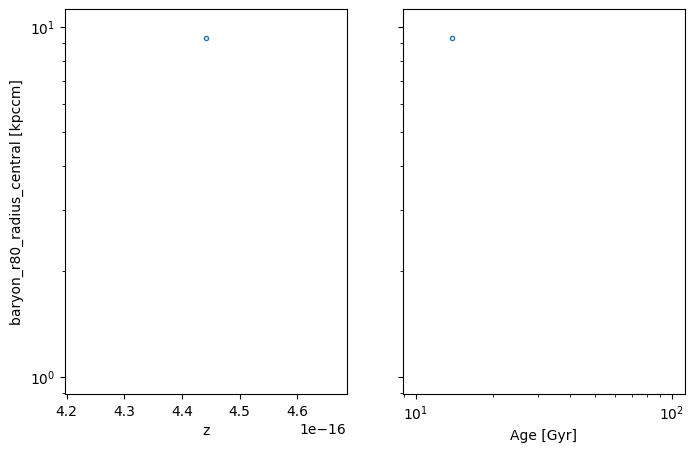

total_half_mass_radius_central
[]
0.6709074827004388
[]


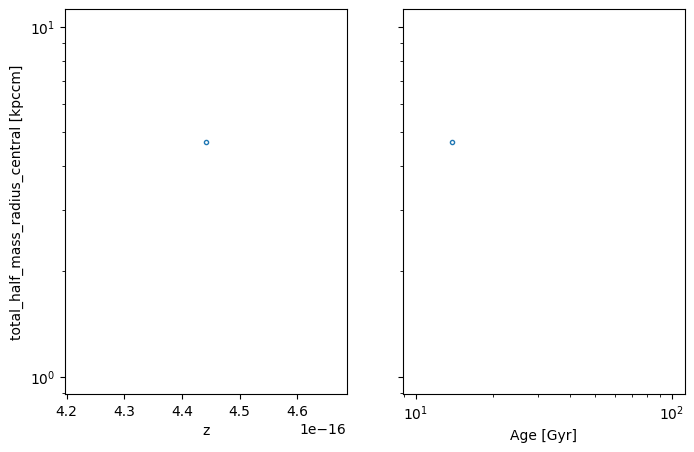

total_r20_radius_central
[]
0.4132256235381567
[]


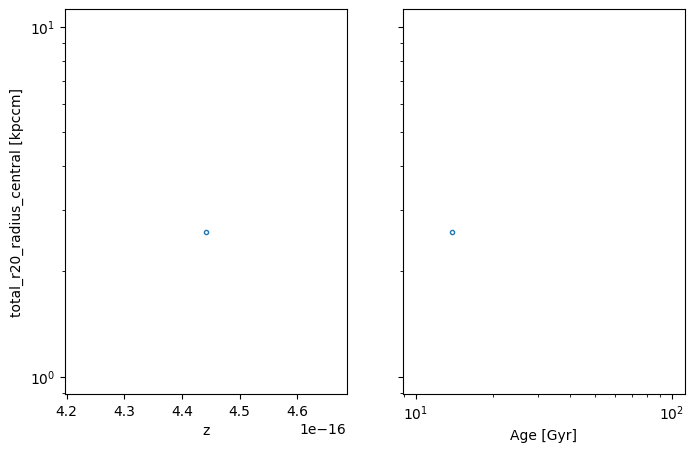

total_r80_radius_central
[]
0.9682050592488409
[]


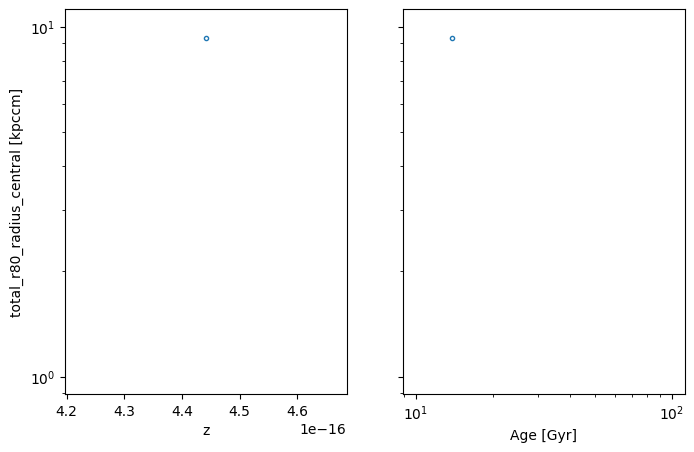

mass_weighted_metallicity_central


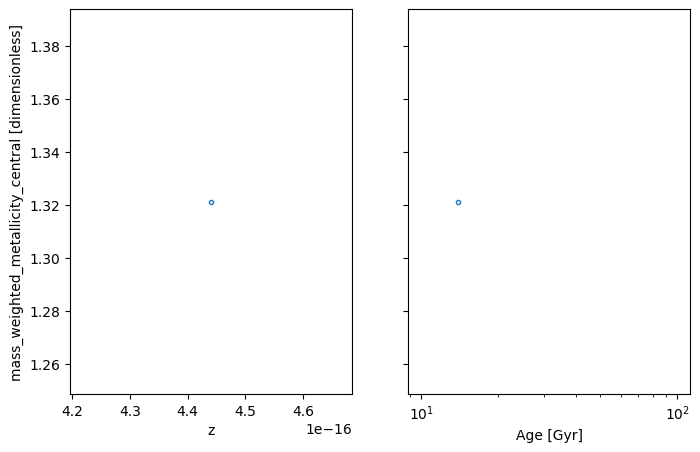

sfr_weighted_metallicity_central


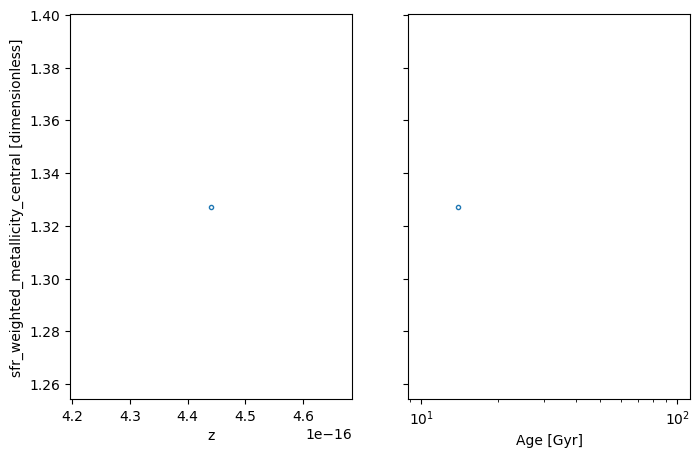

stellar_metallicity_central


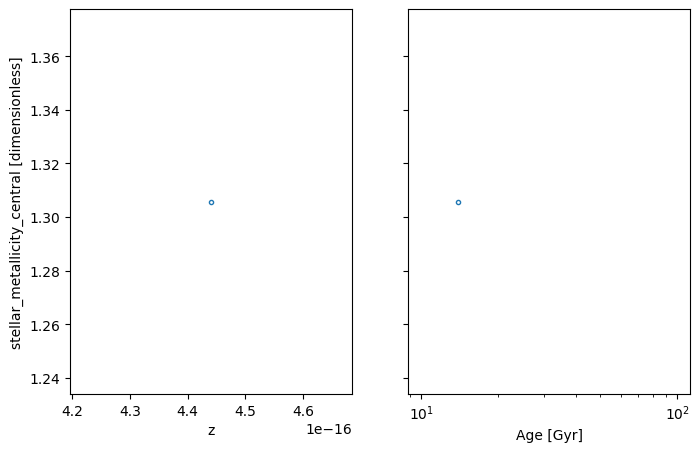

gas_velocity_dispersion_central


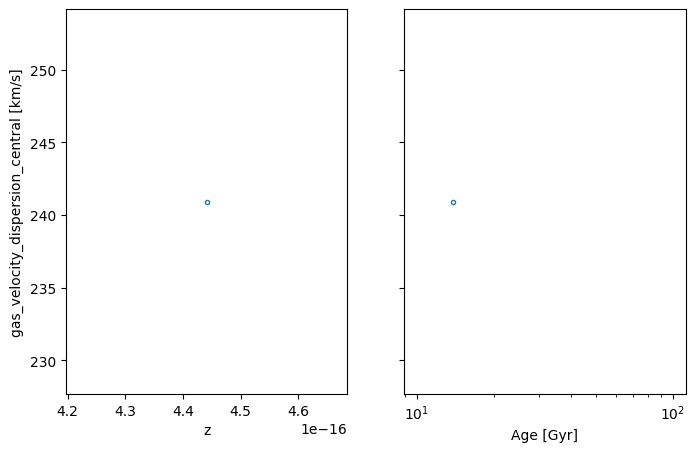

stellar_velocity_dispersion_central


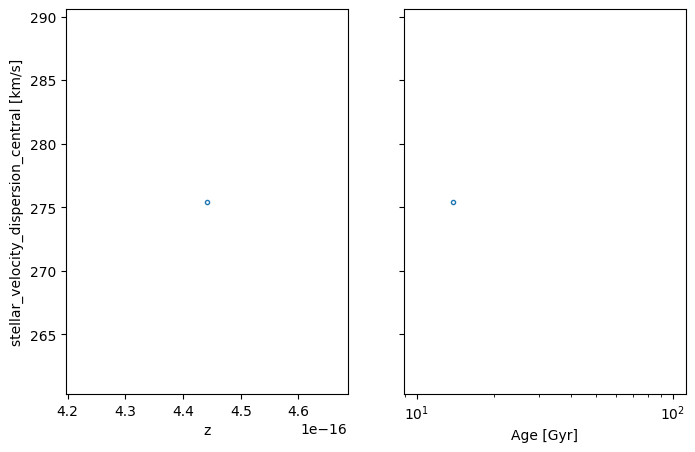

baryon_velocity_dispersion_central


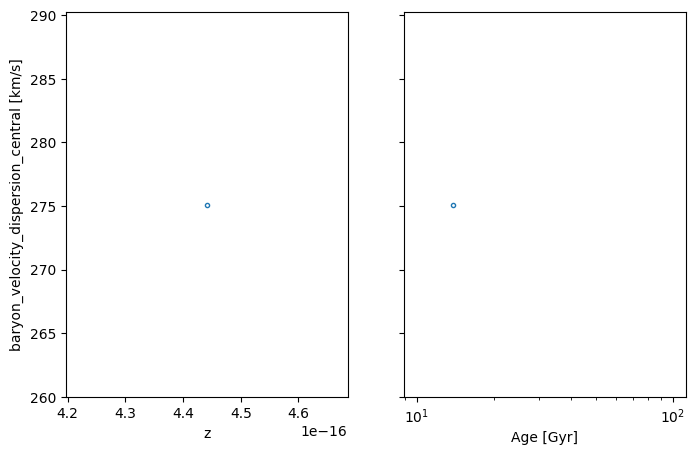

total_velocity_dispersion_central


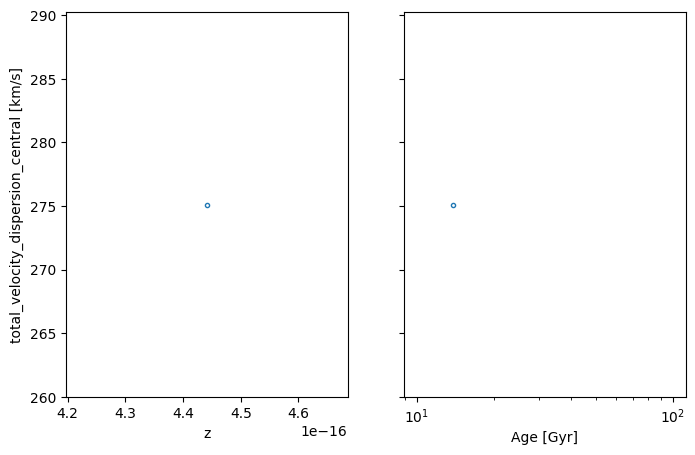

mass_weighted_stellar_age_central
[]
0.8108433273193744
[]


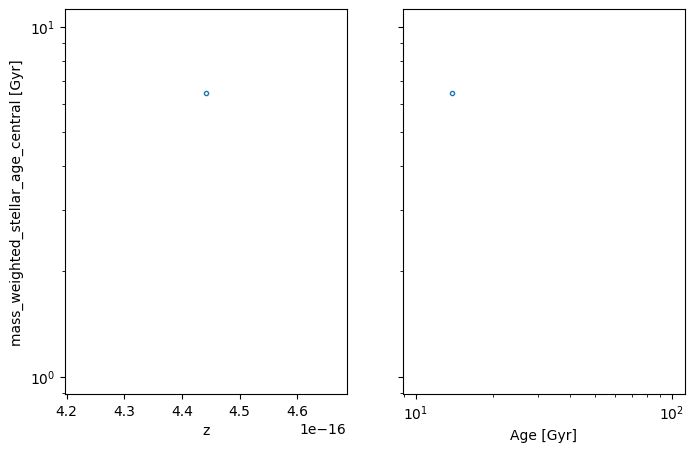

metal_weighted_stellar_age_central
[]
0.8100219541383238
[]


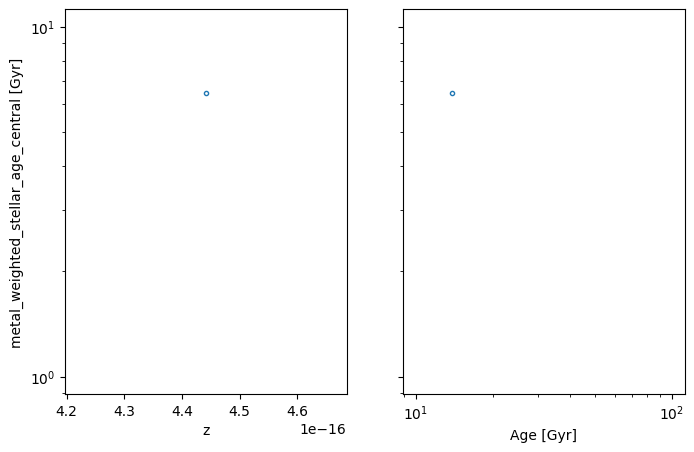

mass_weighted_temperature_central
[0]
[0.1]


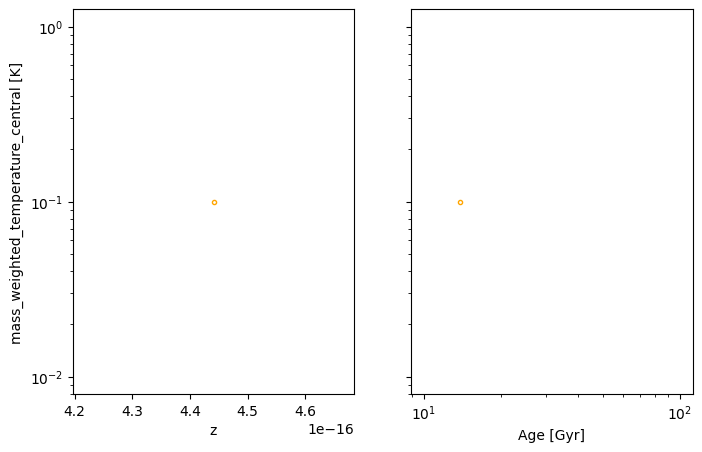

mass_weighted_cgm_temperature_central
[0]
[0.1]


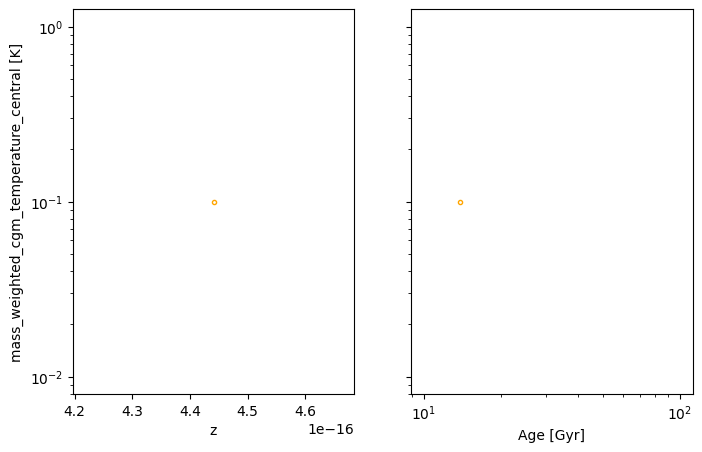

gas_mass_central_tracked
[]
9.627095155414706
[]


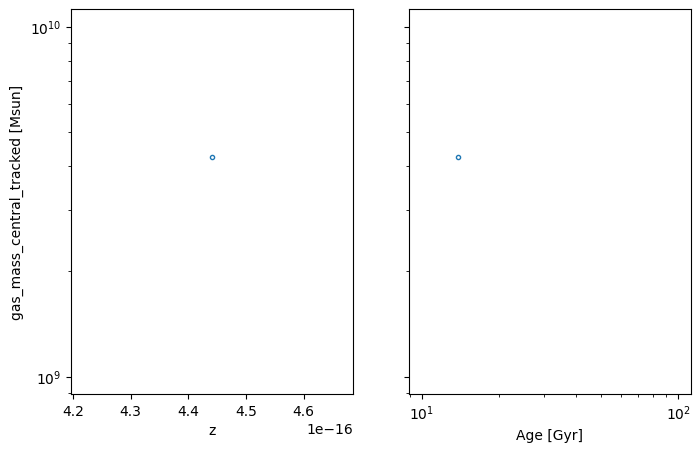

gas_30kpc_mass_central_tracked
[]
10.226185454903925
[]


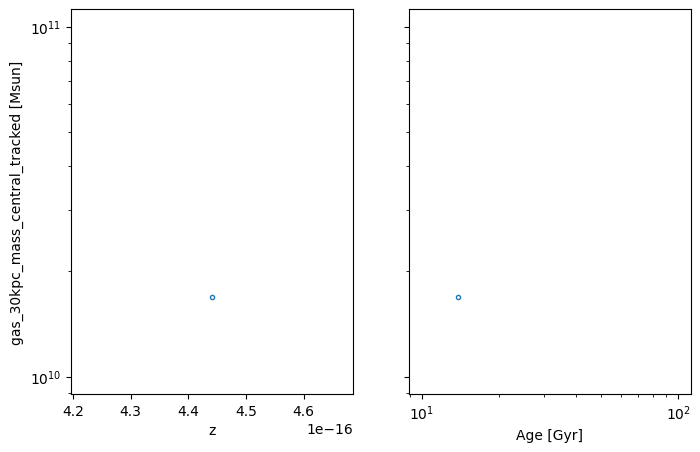

stellar_mass_central_tracked
[]
11.120824574066146
[]


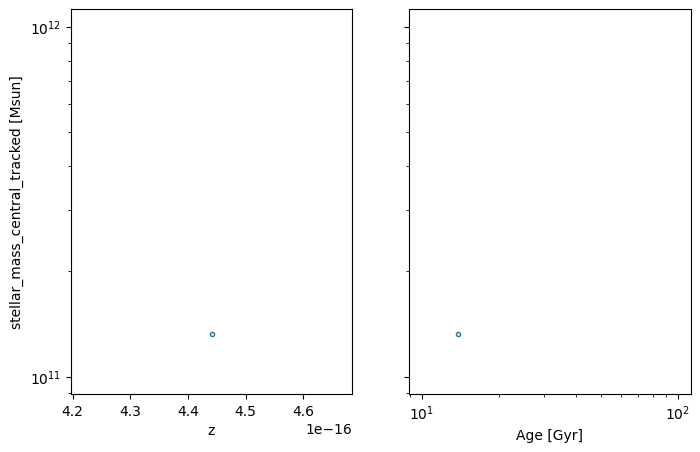

bh_mass_central_tracked
[]
-1.4117971018420699
[]


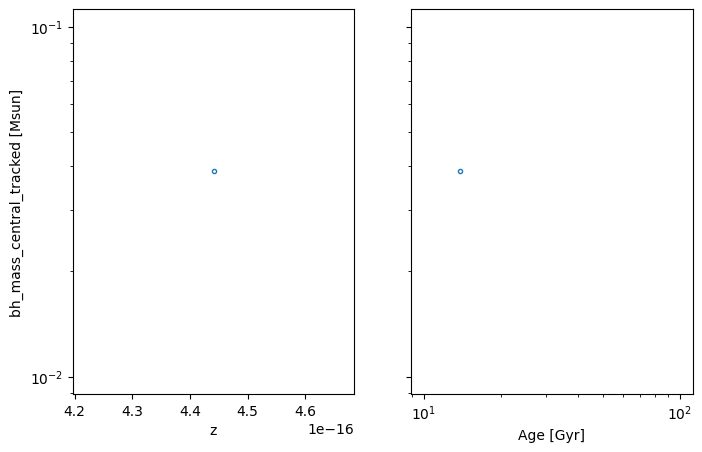

bh_30kpc_mass_central_tracked
[]
-1.411352251610622
[]


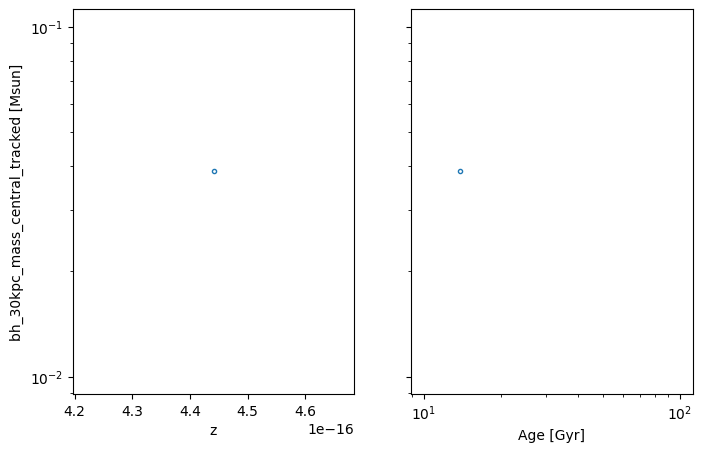

dust_mass_central_tracked
[]
6.720290743669673
[]


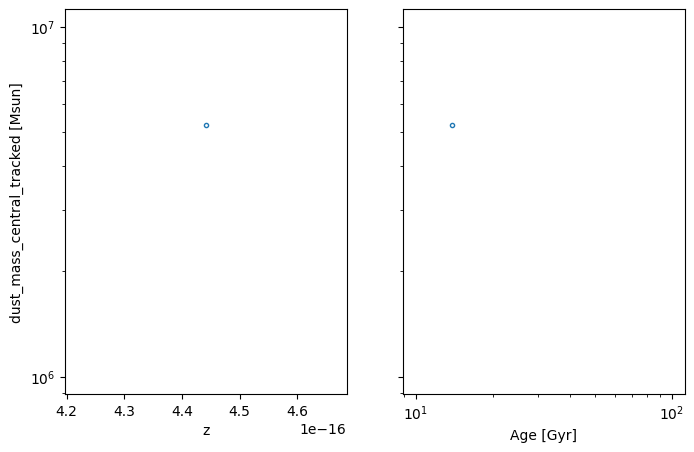

HI_mass_central_tracked
[]
9.96940723623272
[]


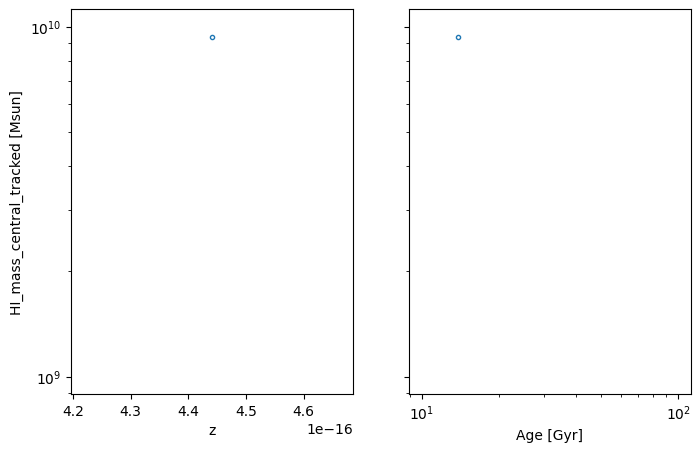

HI_30kpc_mass_central_tracked
[]
9.755082902332445
[]


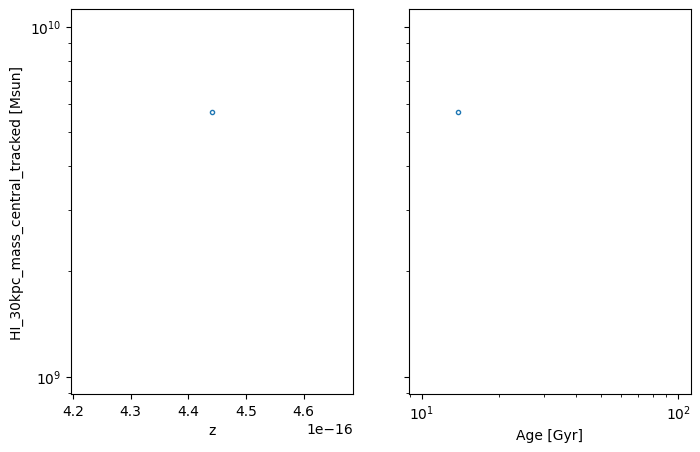

H2_mass_central_tracked
[]
9.176795831966404
[]


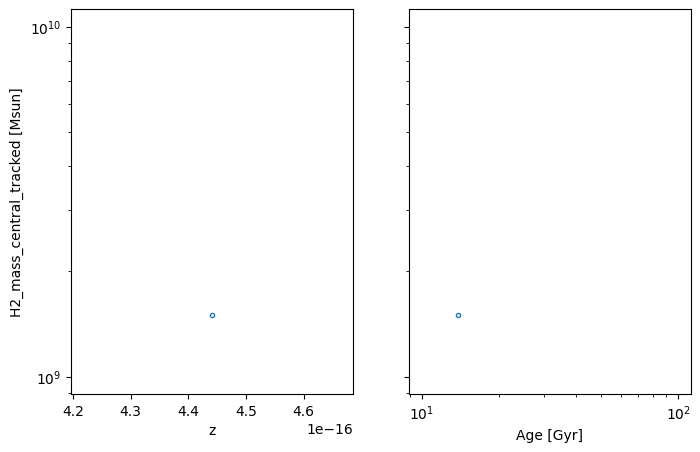

H2_30kpc_mass_central_tracked
[]
9.175895322188847
[]


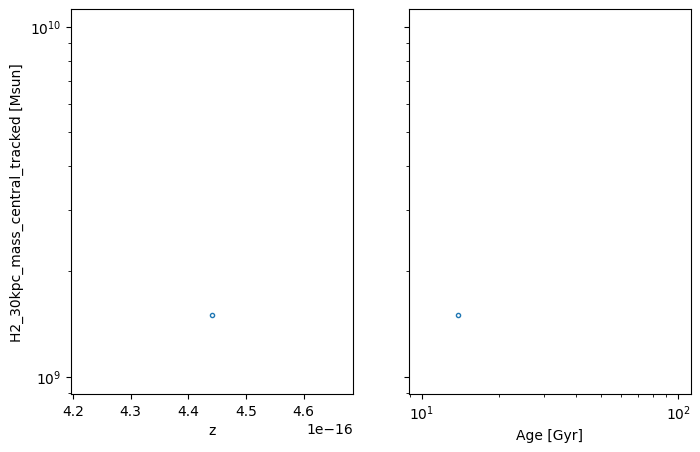

gas_half_mass_radius_central_tracked
[]
0.6663819115178722
[]


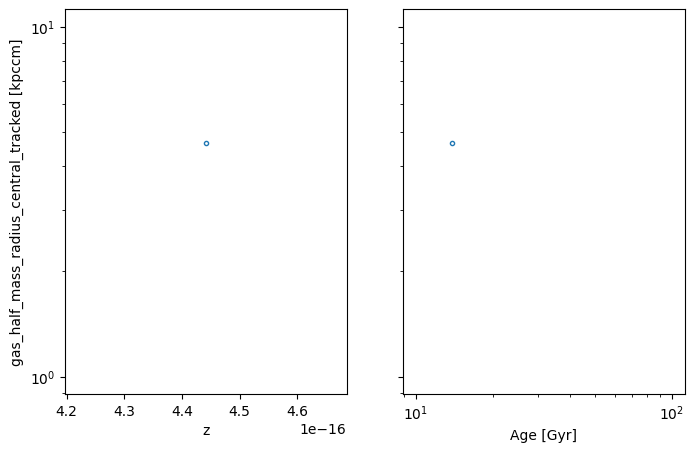

gas_r20_radius_central_tracked
[]
0.6106198521983353
[]


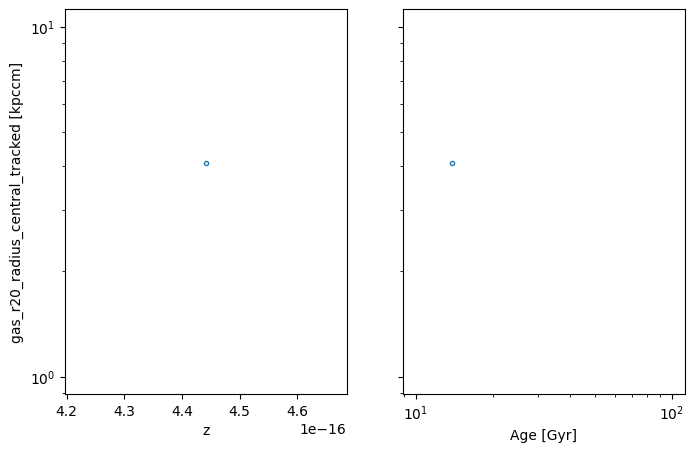

gas_r80_radius_central_tracked
[]
0.8194553745373233
[]


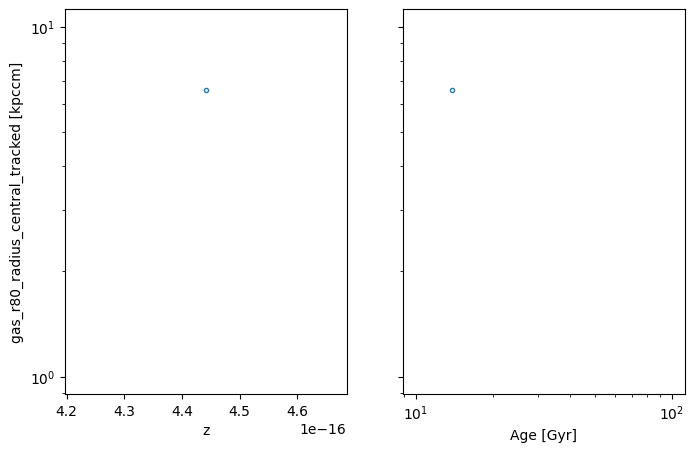

stellar_half_mass_radius_central_tracked
[]
0.6718225466691272
[]


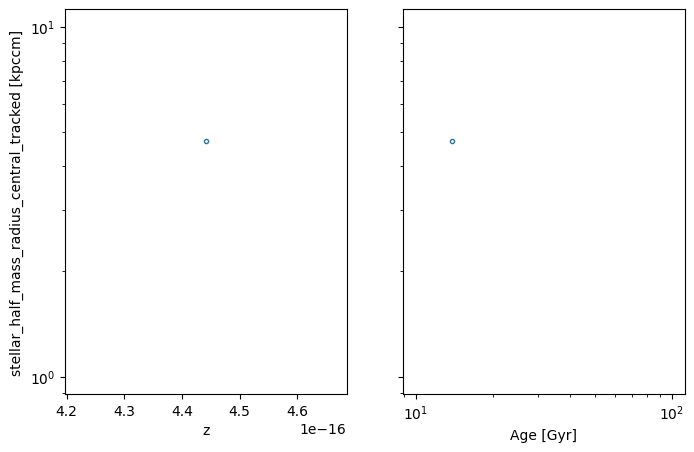

stellar_r20_radius_central_tracked
[]
0.4058849968338123
[]


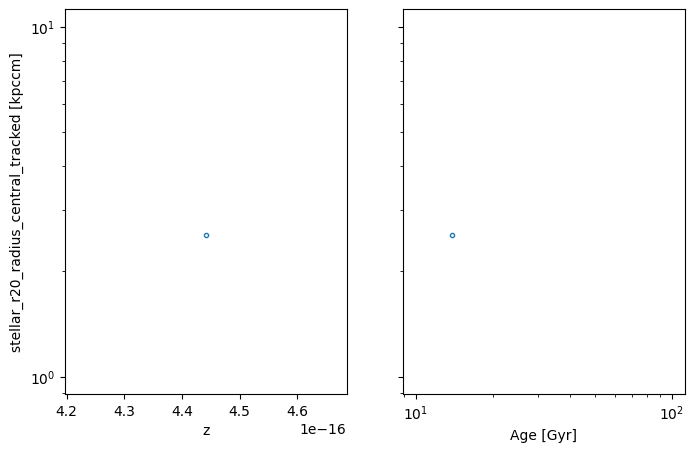

stellar_r80_radius_central_tracked
[]
0.9728237070631568
[]


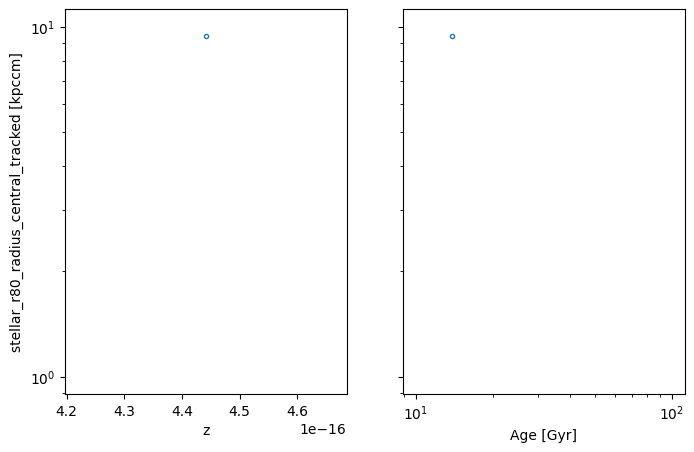

baryon_half_mass_radius_central_tracked
[]
0.6709074827004388
[]


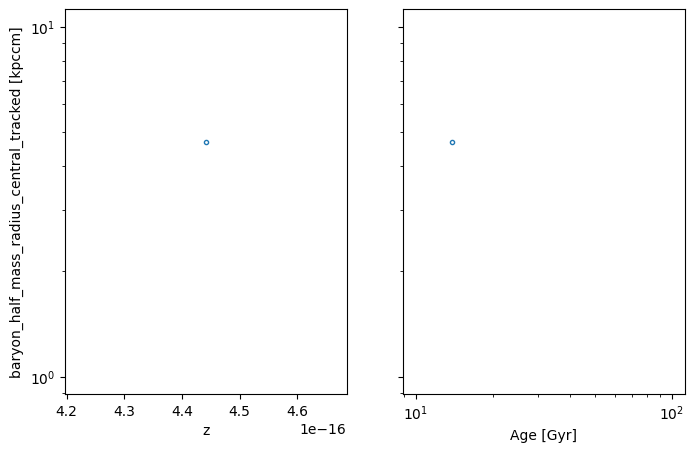

baryon_r20_radius_central_tracked
[]
0.4132256235381567
[]


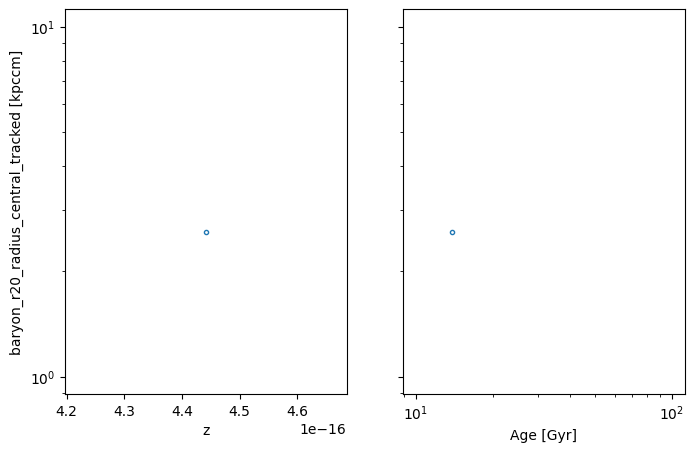

baryon_r80_radius_central_tracked
[]
0.9682050592488409
[]


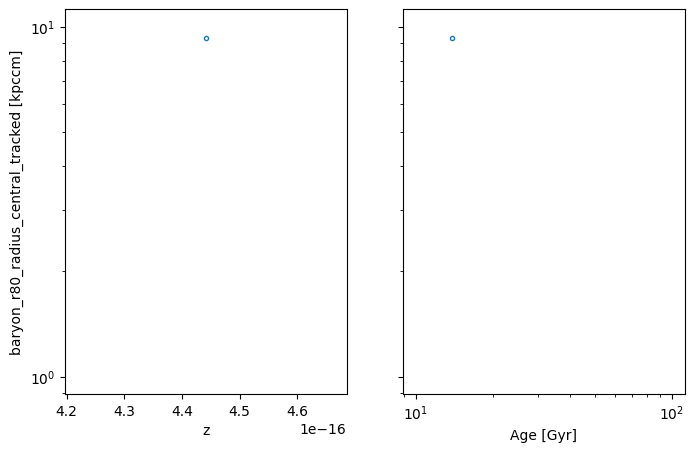

total_half_mass_radius_central_tracked
[]
0.6709074827004388
[]


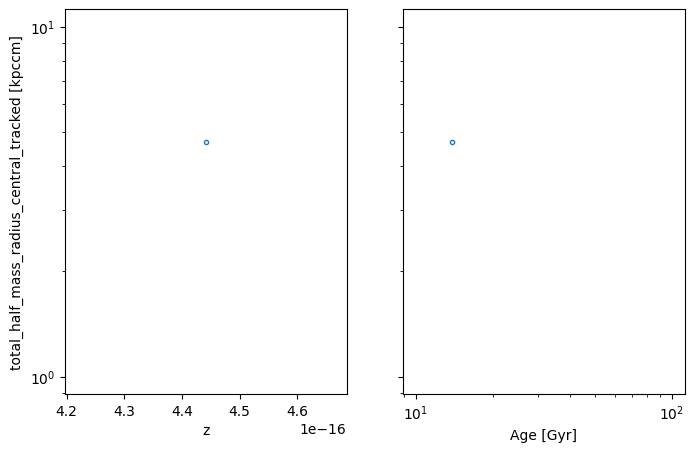

total_r20_radius_central_tracked
[]
0.4132256235381567
[]


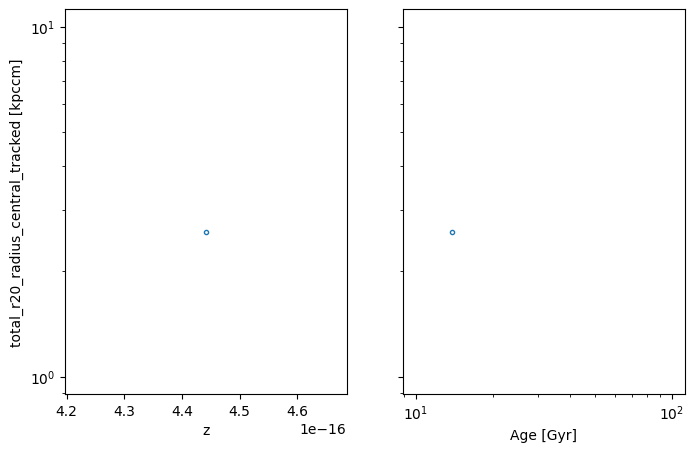

total_r80_radius_central_tracked
[]
0.9682050592488409
[]


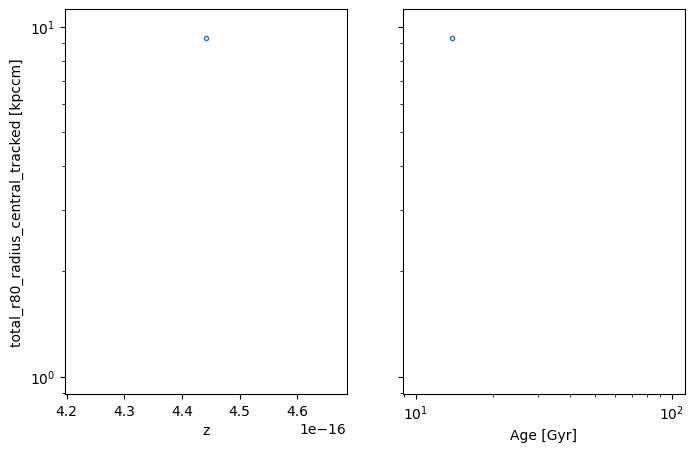

mass_weighted_metallicity_central_tracked


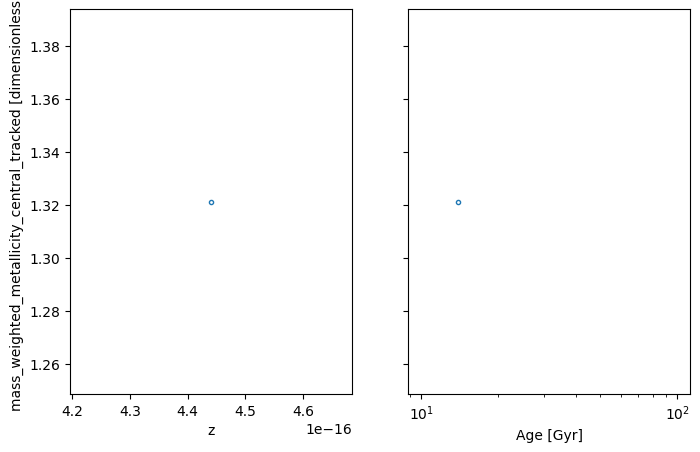

sfr_weighted_metallicity_central_tracked


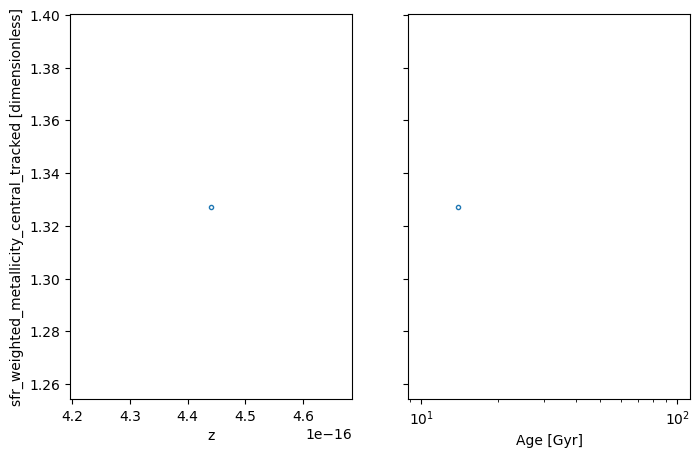

stellar_metallicity_central_tracked


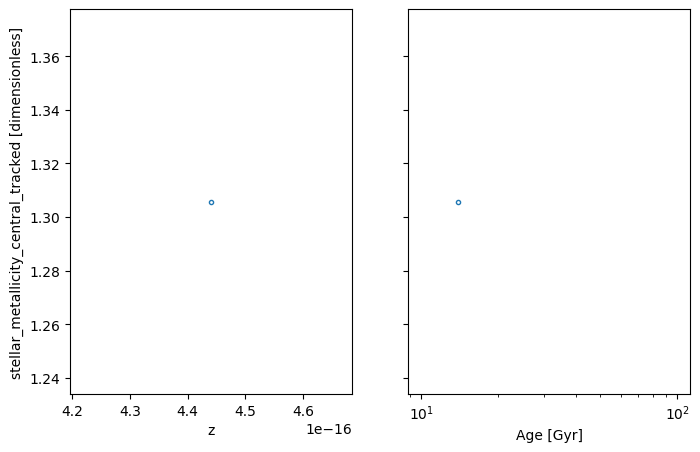

gas_velocity_dispersion_central_tracked


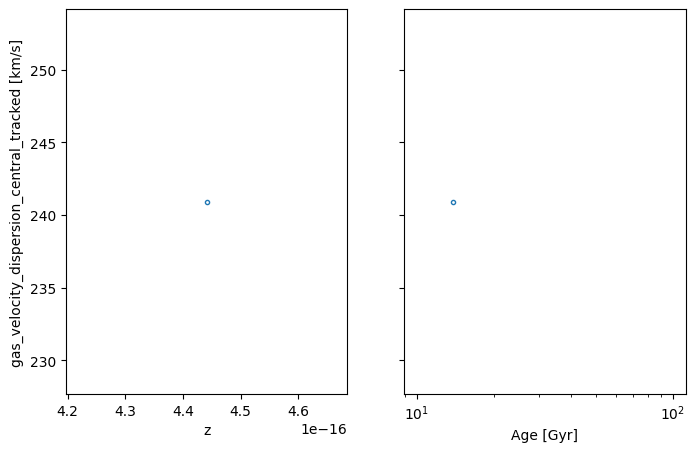

stellar_velocity_dispersion_central_tracked


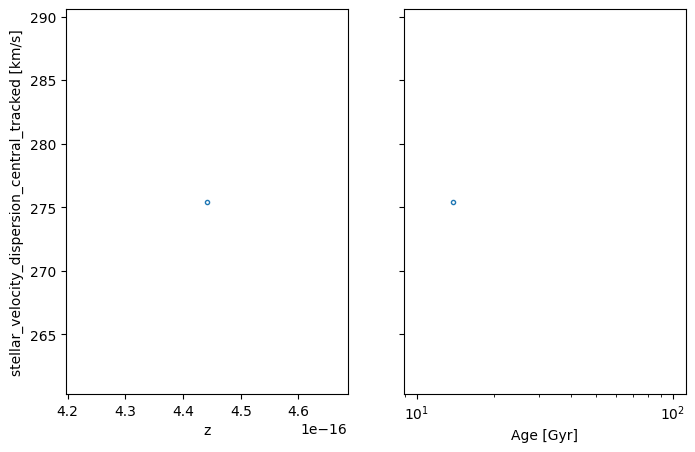

baryon_velocity_dispersion_central_tracked


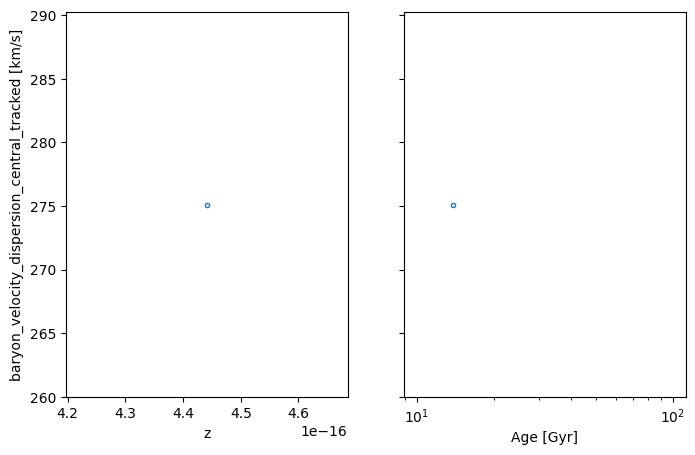

total_velocity_dispersion_central_tracked


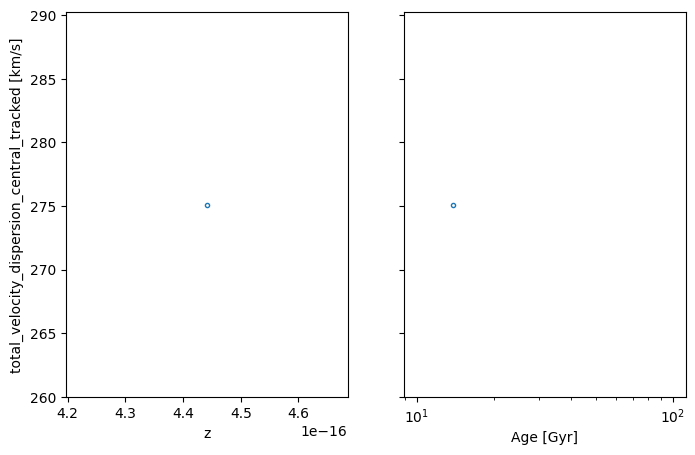

mass_weighted_stellar_age_central_tracked
[]
0.8108433273193744
[]


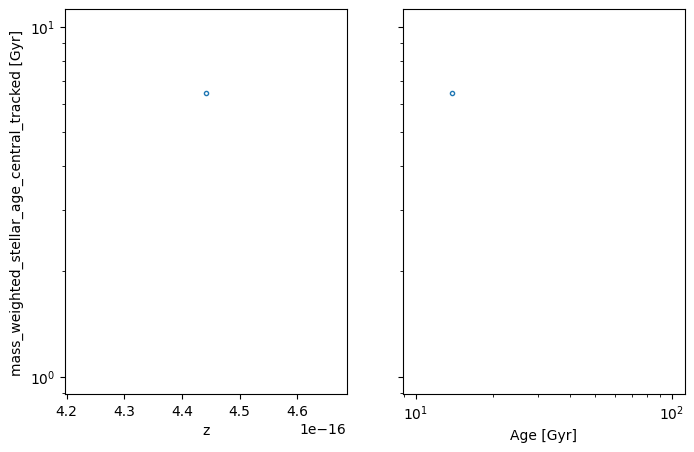

metal_weighted_stellar_age_central_tracked
[]
0.8100219541383238
[]


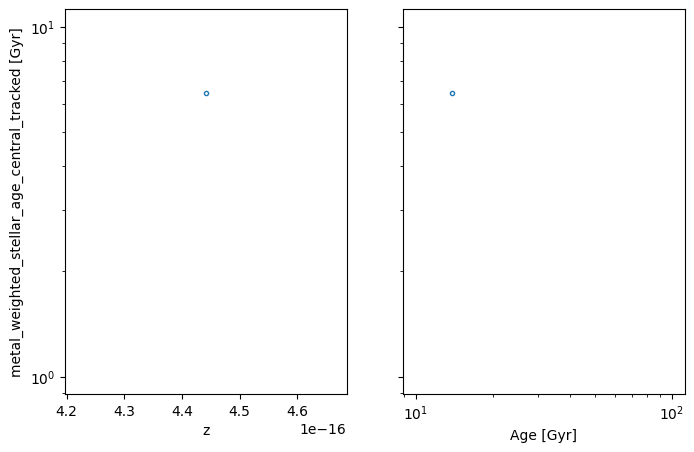

mass_weighted_temperature_central_tracked
[0]
[0.1]


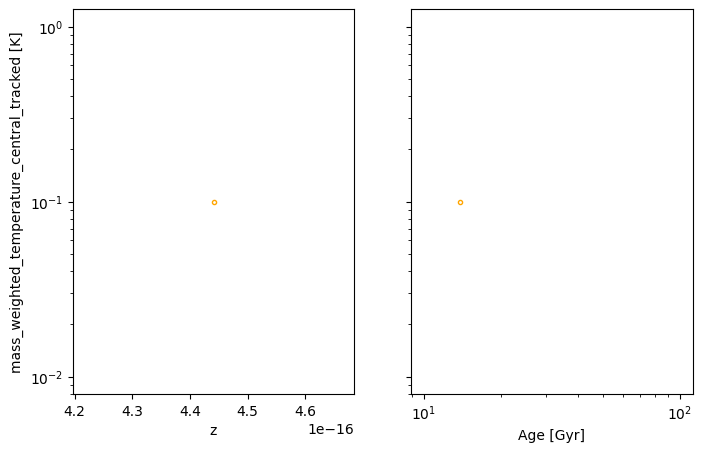

mass_weighted_cgm_temperature_central_tracked
[0]
[0.1]


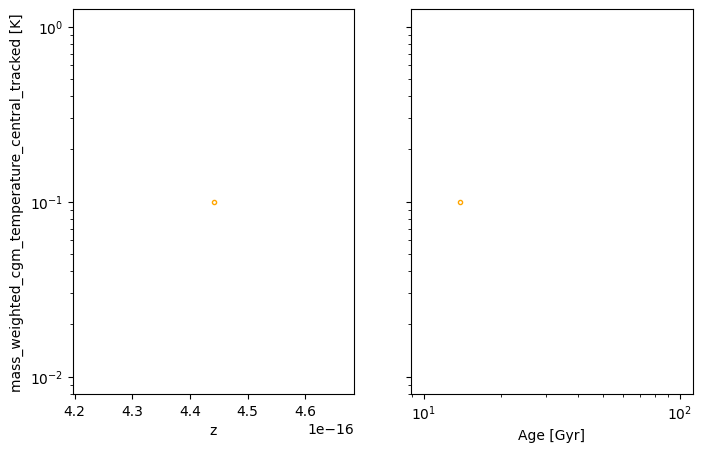

In [166]:
for prop_name, prop in prop_dict.items():
    print(prop_name)
    # print(prop)
    if prop_name in ['z_halo', 'z_central', 'z_central_tracked', 'age_halo', 'age_central', 'age_central_tracked', 'snap_num']: continue
    if len(prop) == 0:
        print(f'{prop_name} is empty')
        continue

    fig, ax = plt.subplots(num=1, figsize=(8,5),
                           nrows=1, ncols=2, sharey='row')

    # plot_z_central = False
    # plot_z_central_tracked = False

    x1 = None
    x2 = None
    if 'halo' in prop_name:
        x1 = prop_dict['z_halo']
        x2 = prop_dict['age_halo']
    if 'central' in prop_name:
        x1 = prop_dict['z_central']
        x2 = prop_dict['age_central']
    if 'central' in prop_name and 'tracked' in prop_name:
        x1 = prop_dict['z_central_tracked']
        x2 = prop_dict['age_central_tracked']

    ax[0].plot(x1, prop, marker='o', ms=3, mfc='none', ls='')
    ax[1].plot(x2, prop, marker='o', ms=3, mfc='none', ls='')
    
    # try:
    #     ax[0].plot(prop_dict['z'], prop, marker='o', ms=3, mfc='none', ls='')
    #     ax[1].plot(prop_dict['age'], prop, marker='o', ms=3, mfc='none', ls='')
    # except:
    #     plot_z_central = True
    #     ax[0].plot(prop_dict['z_central'], prop, marker='o', ms=3, mfc='none', ls='')
    #     ax[1].plot(prop_dict['age_central'], prop, marker='o', ms=3, mfc='none', ls='')
    
    # top_ax = ax.secondary_xaxis('top', functions=(forward, inverse))
    # top_ax_xticks = np.array([0, 1, 2, 3, 4, 6, 10])
    # top_ax.set_xticks(top_ax_xticks, labels=top_ax_xticks)

    # top_ax = ax.secondary_xaxis('top', functions=(inverse, forward))
    
    ax[0].set_xlabel('z')
    ax[1].set_xlabel('Age [Gyr]')
    # top_ax.set_xlabel('Age [Gyr]')
    # top_ax.set_xlabel('z')

    ax[1].set_xscale('log')
    
    try:
        ax[0].set_ylabel(f'{prop_name} [{prop[0].units}]')
    except:
        ax[0].set_ylabel(prop_name)
    # ax.set_xscale('log')
    if prop_name in log_props:
        ax[0].set_yscale('log')
        ax[1].set_yscale('log')

        ## Plot all 0 values as 1 dex below minimum nonzero value
        # sanitized_prop = prop[np.isfinite(prop)]
        
        zero_value_indexes = np.where(np.array(prop)==0)[0]
        nonzero_value_indexes = np.where((np.array(prop)!=0) & (np.isfinite(np.array(prop))))[0]
        # print(prop)
        # print(np.array(prop)!=0 & np.isfinite(np.array(prop)))
        print(zero_value_indexes)
        try:
            print(min(np.log10(np.array(prop)[nonzero_value_indexes])))
            zero_value_for_plotting = np.array([10**(min(np.log10(np.array(prop)[nonzero_value_indexes]))-1)] * len(zero_value_indexes))
        except:
            zero_value_for_plotting = np.array([10**(-1)] * len(zero_value_indexes))
        print(zero_value_for_plotting)

        ax[0].plot(np.array(x1)[zero_value_indexes], zero_value_for_plotting, 
                   marker='o', ms=3, mfc='none', mec='orange', ls='')
        ax[1].plot(np.array(x2)[zero_value_indexes], zero_value_for_plotting, 
                   marker='o', ms=3, mfc='none', mec='orange', ls='')
        
        # if not plot_z_central:
        #     ax[0].plot(np.array(prop_dict['z'])[zero_value_indexes], zero_value_for_plotting, 
        #                marker='o', ms=3, mfc='none', mec='orange', ls='')
        #     ax[1].plot(np.array(prop_dict['age'])[zero_value_indexes], zero_value_for_plotting, 
        #                marker='o', ms=3, mfc='none', mec='orange', ls='')
        # else:
        #     ax[0].plot(np.array(prop_dict['z_central'])[zero_value_indexes],
        #                zero_value_for_plotting, 
        #                marker='o', ms=3, mfc='none', mec='orange', ls='')
        #     ax[1].plot(np.array(prop_dict['age_central'])[zero_value_indexes],
        #                zero_value_for_plotting, 
        #                marker='o', ms=3, mfc='none', mec='orange', ls='')
    plt.show()

In [167]:
print(np.isfinite(np.array([np.nan])))

[False]


In [168]:
np.array(prop_dict['mass_weighted_stellar_age_halo']) != 0

array([ True])

In [169]:
np.isfinite(np.array(prop_dict['mass_weighted_stellar_age_halo']))

array([ True])

In [170]:
np.array(prop_dict['mass_weighted_stellar_age_halo']) != 0 & np.isfinite(np.array(prop_dict['mass_weighted_stellar_age_halo']))

array([ True])

In [171]:
True & False

False

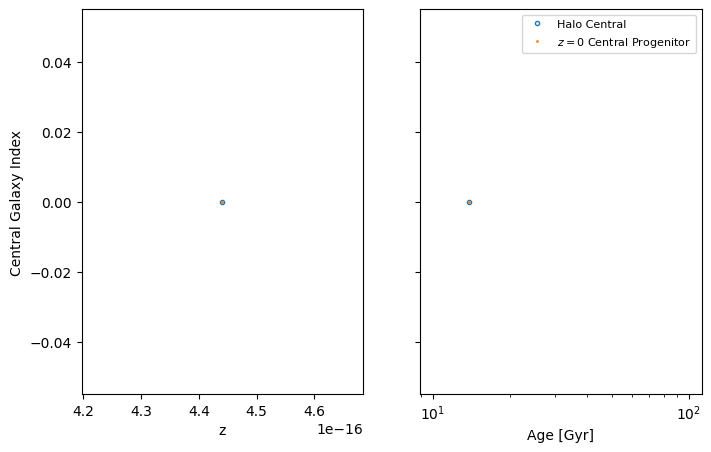

In [172]:
fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=2, sharey='row')

ax[0].plot(prop_dict['z_central'], prop_dict['index_central'],
           marker='o', ms=3, mfc='none', mec='C0', ls='', label='Halo Central')
ax[1].plot(prop_dict['age_central'], prop_dict['index_central'],
           marker='o', ms=3, mfc='none', mec='C0', ls='', label='Halo Central')

ax[0].plot(prop_dict['z_central_tracked'], prop_dict['index_central_tracked'],
           marker='o', ms=1, mfc='none', mec='C1', ls='', label=r'$z=0$ Central Progenitor')
ax[1].plot(prop_dict['age_central_tracked'], prop_dict['index_central_tracked'],
           marker='o', ms=1, mfc='none', mec='C1', ls='', label=r'$z=0$ Central Progenitor')

ax[1].set_xscale('log')

ax[0].set_xlabel('z')
ax[1].set_xlabel('Age [Gyr]')
ax[0].set_ylabel('Central Galaxy Index')
ax[1].legend(loc='upper right', fontsize=8)
plt.show()

In [173]:
central_comparisons = []

for prop_name in prop_names:
    if 'central' in prop_name and 'tracked' not in prop_name:
        central_comparisons.append(prop_name)

In [174]:
central_comparisons

['age_central',
 'z_central',
 'index_central',
 'minpotpos_central',
 'bh_mdot_central',
 'bh_fedd_central',
 'bh_mdot_edd_central',
 'sfr_central',
 'ssfr_central',
 'sfr_100_central',
 'ssfr_100_central',
 'gas_mass_central',
 'gas_30kpc_mass_central',
 'stellar_mass_central',
 'bh_mass_central',
 'bh_30kpc_mass_central',
 'dust_mass_central',
 'HI_mass_central',
 'HI_30kpc_mass_central',
 'H2_mass_central',
 'H2_30kpc_mass_central',
 'gas_half_mass_radius_central',
 'gas_r20_radius_central',
 'gas_r80_radius_central',
 'stellar_half_mass_radius_central',
 'stellar_r20_radius_central',
 'stellar_r80_radius_central',
 'baryon_half_mass_radius_central',
 'baryon_r20_radius_central',
 'baryon_r80_radius_central',
 'total_half_mass_radius_central',
 'total_r20_radius_central',
 'total_r80_radius_central',
 'mass_weighted_metallicity_central',
 'sfr_weighted_metallicity_central',
 'stellar_metallicity_central',
 'gas_velocity_dispersion_central',
 'stellar_velocity_dispersion_central',
 

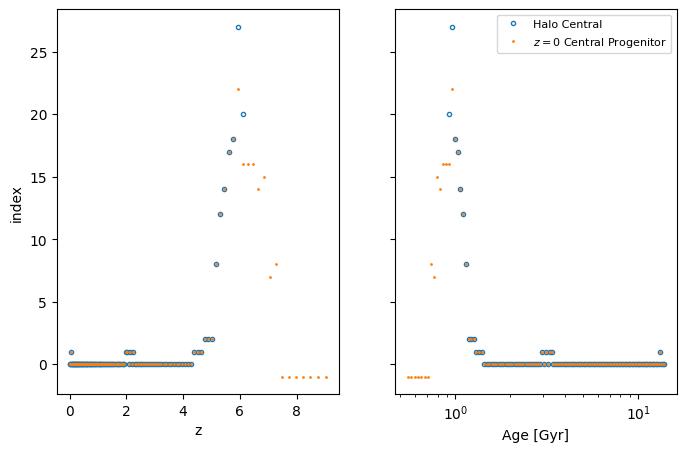

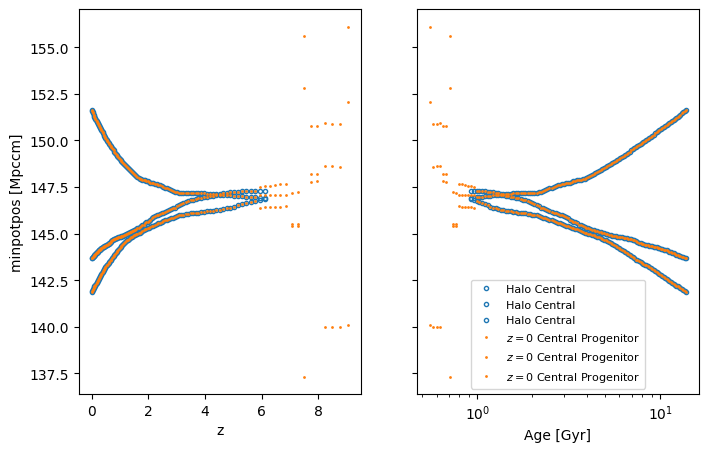

[ 42  46  49  55  64  66  67  68  69  70  71  72  87  89 101 102 103 106]
-5.924297879666513
[1.19042522e-07 1.19042522e-07 1.19042522e-07 1.19042522e-07
 1.19042522e-07 1.19042522e-07 1.19042522e-07 1.19042522e-07
 1.19042522e-07 1.19042522e-07 1.19042522e-07 1.19042522e-07
 1.19042522e-07 1.19042522e-07 1.19042522e-07 1.19042522e-07
 1.19042522e-07 1.19042522e-07]
[ 55  59  62  68  77  79  80  81  82  83  84  85 100 102 114 115 116 119]
-5.924297879666513
[1.19042522e-07 1.19042522e-07 1.19042522e-07 1.19042522e-07
 1.19042522e-07 1.19042522e-07 1.19042522e-07 1.19042522e-07
 1.19042522e-07 1.19042522e-07 1.19042522e-07 1.19042522e-07
 1.19042522e-07 1.19042522e-07 1.19042522e-07 1.19042522e-07
 1.19042522e-07 1.19042522e-07]


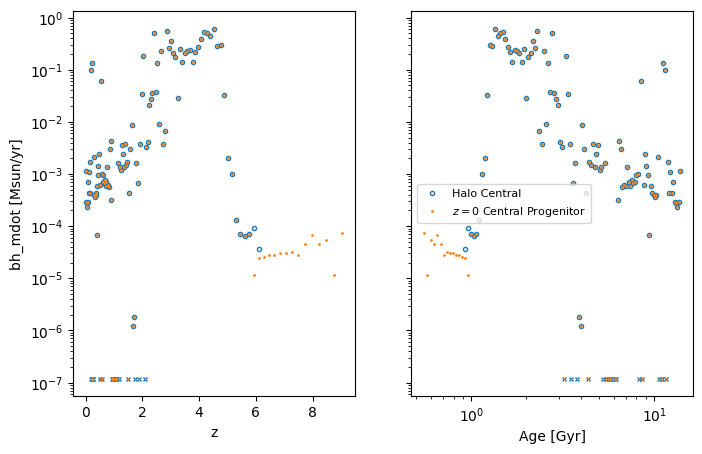

[ 42  46  49  55  64  66  67  68  69  70  71  72  87  89 101 102 103 106]
-6.899070477377561
[1.26162278e-08 1.26162278e-08 1.26162278e-08 1.26162278e-08
 1.26162278e-08 1.26162278e-08 1.26162278e-08 1.26162278e-08
 1.26162278e-08 1.26162278e-08 1.26162278e-08 1.26162278e-08
 1.26162278e-08 1.26162278e-08 1.26162278e-08 1.26162278e-08
 1.26162278e-08 1.26162278e-08]
[ 55  59  62  68  77  79  80  81  82  83  84  85 100 102 114 115 116 119]
-6.899070477377561
[1.26162278e-08 1.26162278e-08 1.26162278e-08 1.26162278e-08
 1.26162278e-08 1.26162278e-08 1.26162278e-08 1.26162278e-08
 1.26162278e-08 1.26162278e-08 1.26162278e-08 1.26162278e-08
 1.26162278e-08 1.26162278e-08 1.26162278e-08 1.26162278e-08
 1.26162278e-08 1.26162278e-08]


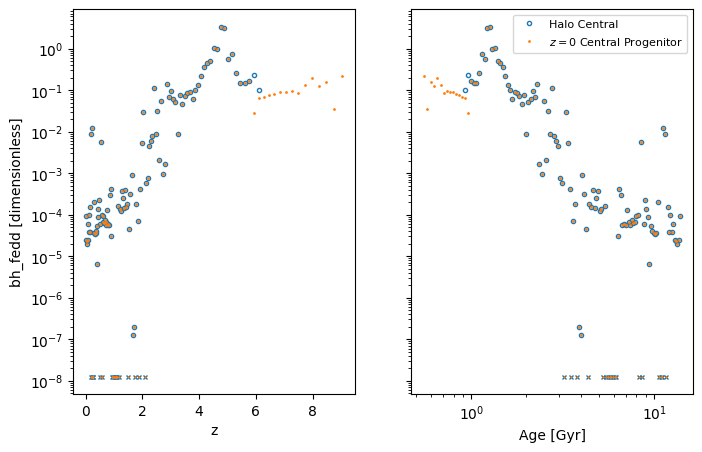

[]
-3.4448672220172574
[]
[]
-3.4860128271367103
[]


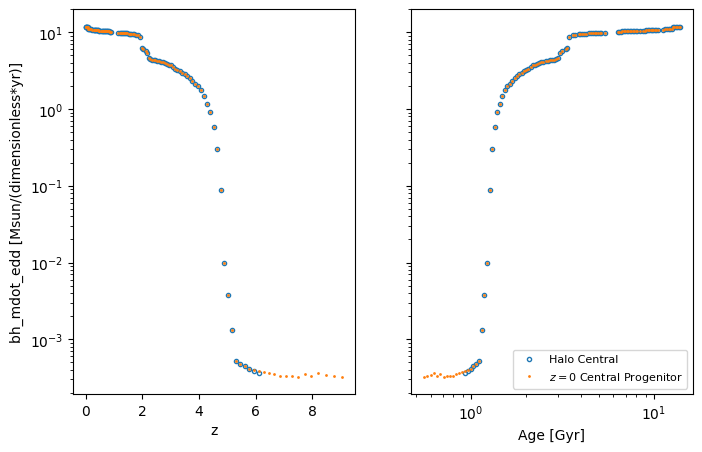

[ 52  53  54  55  56  57  58  59  60  61  62  63  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116]
-1.6353347067485524
[0.00231561 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561
 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561
 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561
 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561
 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561
 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561
 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561
 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561
 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561
 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561 0.00231561
 0.00231561 0.00231561 0.00231561]
[ 65  66  67  68  

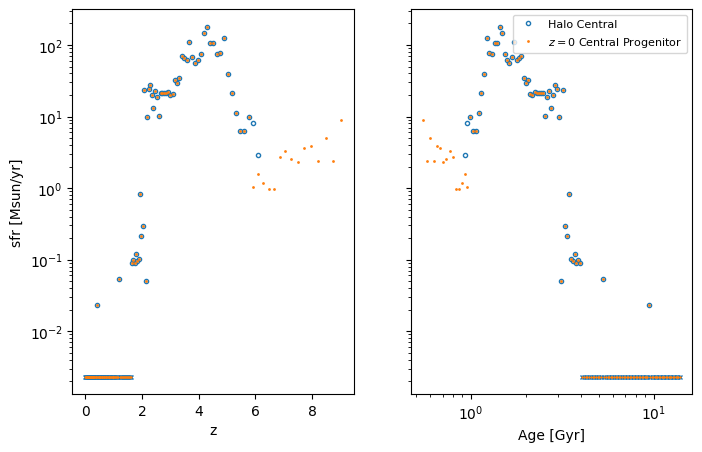

[ 52  53  54  55  56  57  58  59  60  61  62  63  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116]
-12.534424729115521
[2.92129403e-14 2.92129403e-14 2.92129403e-14 2.92129403e-14
 2.92129403e-14 2.92129403e-14 2.92129403e-14 2.92129403e-14
 2.92129403e-14 2.92129403e-14 2.92129403e-14 2.92129403e-14
 2.92129403e-14 2.92129403e-14 2.92129403e-14 2.92129403e-14
 2.92129403e-14 2.92129403e-14 2.92129403e-14 2.92129403e-14
 2.92129403e-14 2.92129403e-14 2.92129403e-14 2.92129403e-14
 2.92129403e-14 2.92129403e-14 2.92129403e-14 2.92129403e-14
 2.92129403e-14 2.92129403e-14 2.92129403e-14 2.92129403e-14
 2.92129403e-14 2.92129403e-14 2.92129403e-14 2.92129403e-14
 2.92129403e-14 2.92129403e-14 2.92129403e-14 2.92129403e-14
 2.92129403e-14 2.92129403e-14 2.92129403e-14 2.92129403e-14
 2.92129403e-14 2.92129403e-14 2.92129403e-14 2.9212

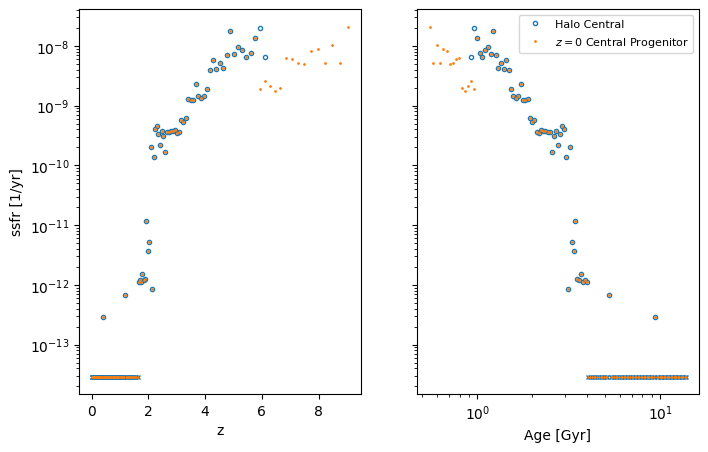

[ 47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64
  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82
  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100
 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116]
-0.4378436087406969
[0.03648853 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853
 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853
 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853
 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853
 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853
 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853
 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853
 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853
 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853
 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853 0.03648853
 0.03648853 0.03648853 0.

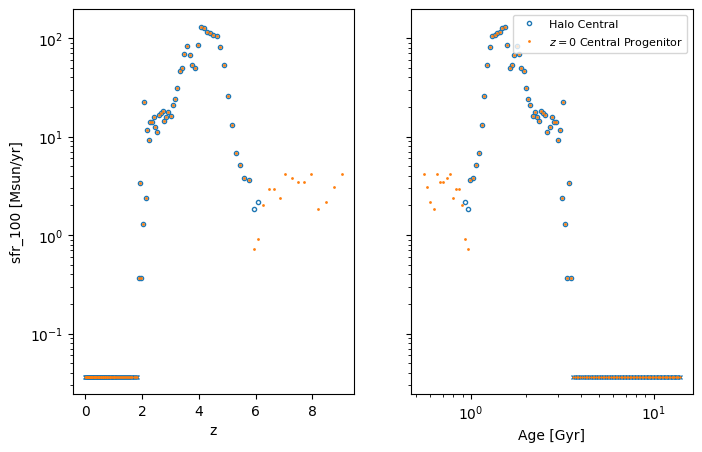

[ 47  48  49  50  51  52  53  54  55  56  57  58  59  60  61  62  63  64
  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81  82
  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100
 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116]
-11.346375169483732
[4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13
 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13
 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13
 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13
 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13
 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13
 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13
 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13
 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13
 4.5042743e-13 4.5042743e-13 4.5042743e-13 4.5042743e-13

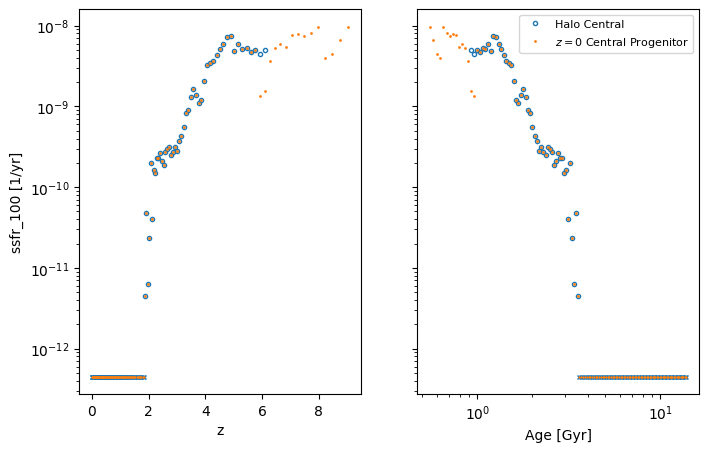

[ 52  53  54  55  56  57  58  59  60  61  62  63  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  95  96  97  98  99 100 101 102 103 104 105 106 108
 109 110 111 112 113 114 115 116]
8.14954799234892
[14110681.59999998 14110681.59999998 14110681.59999998 14110681.59999998
 14110681.59999998 14110681.59999998 14110681.59999998 14110681.59999998
 14110681.59999998 14110681.59999998 14110681.59999998 14110681.59999998
 14110681.59999998 14110681.59999998 14110681.59999998 14110681.59999998
 14110681.59999998 14110681.59999998 14110681.59999998 14110681.59999998
 14110681.59999998 14110681.59999998 14110681.59999998 14110681.59999998
 14110681.59999998 14110681.59999998 14110681.59999998 14110681.59999998
 14110681.59999998 14110681.59999998 14110681.59999998 14110681.59999998
 14110681.59999998 14110681.59999998 14110681.59999998 14110681.59999998
 14110681.59999998 14110681.59999998 14110681.59999998 14110681.59999998


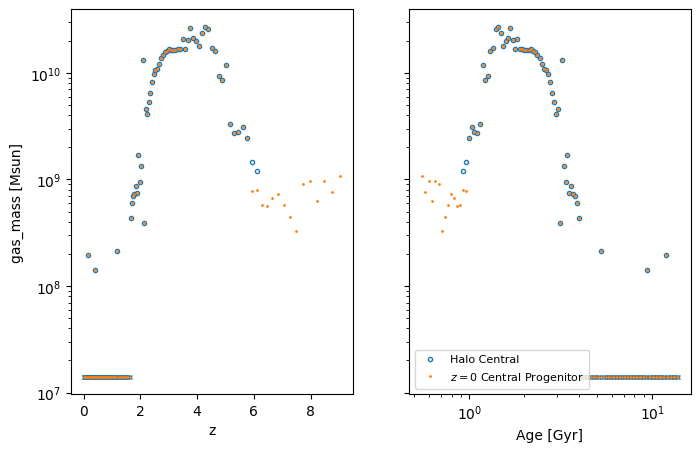

[]
8.224440620814656
[]
[]
8.224440620814656
[]


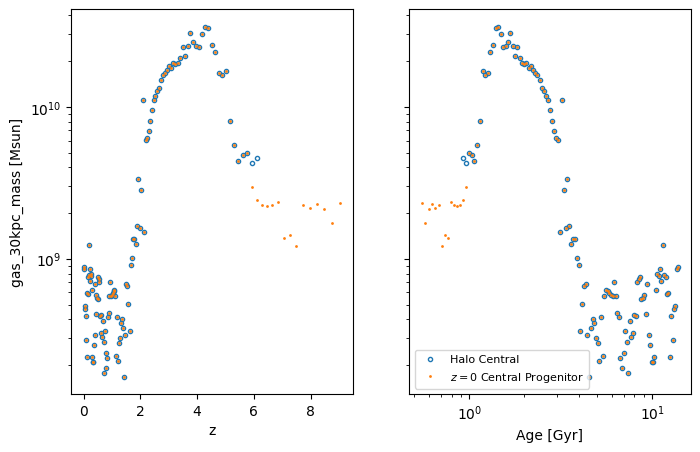

[]
8.617879218559057
[]
[]
8.634932067765321
[]


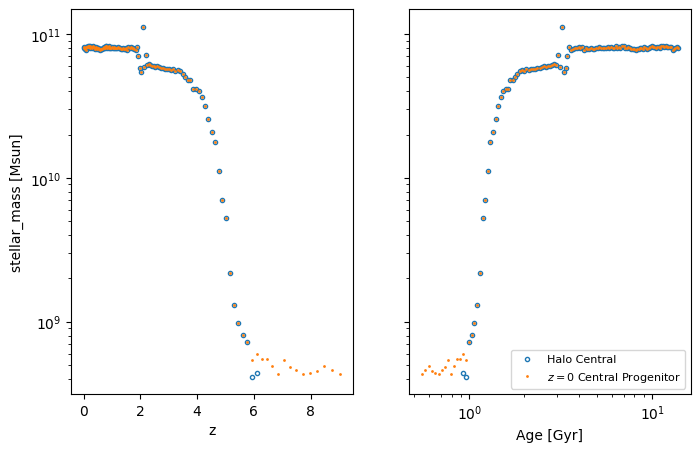

[]
7.165636290689181
[]
[]
7.165636290689181
[]


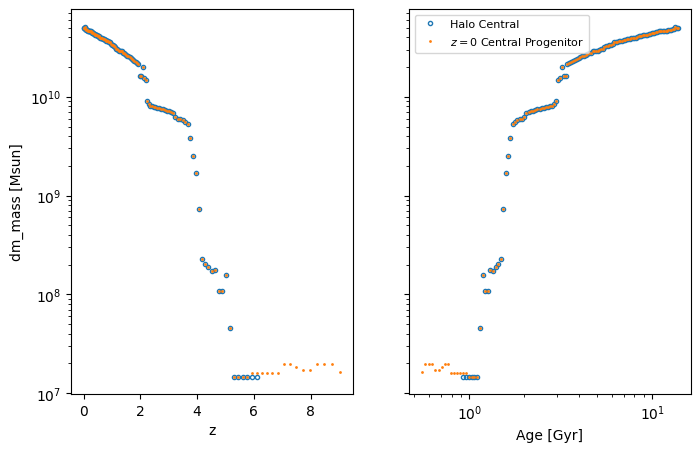

[]
10.221834890606644
[]
[]
9.9450734696696
[]


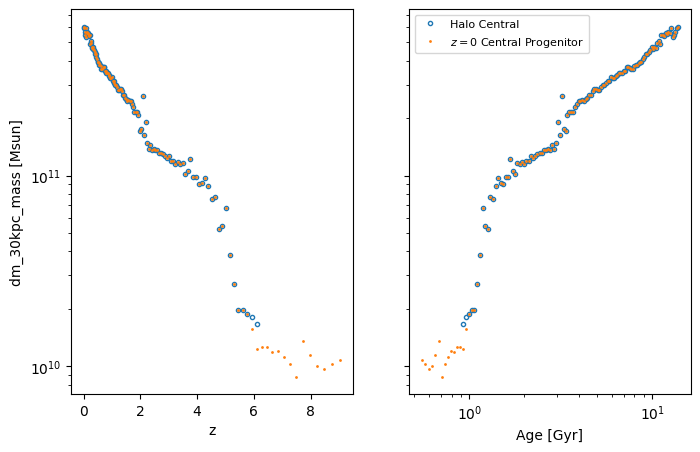

[]
4.208818330323946
[]
[]
4.167672725204493
[]


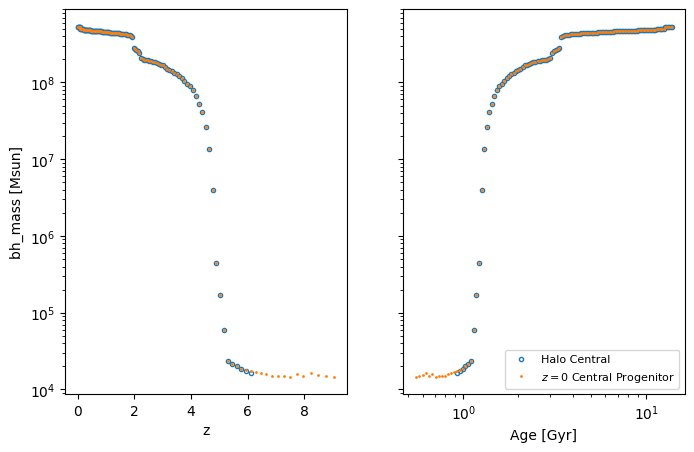

[]
7.165642963782561
[]
[]
7.165642963782561
[]


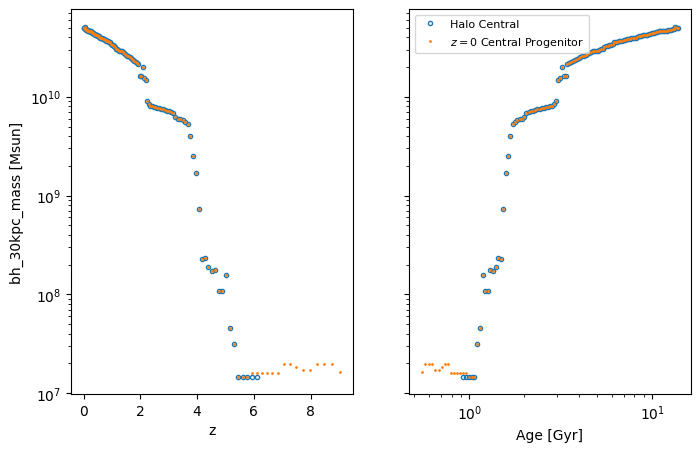

[ 52  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69
  70  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87
  88  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105
 106 107 108 109 110 111 112 113 114 115 116]
5.2322184941893655
[17069.409375 17069.409375 17069.409375 17069.409375 17069.409375
 17069.409375 17069.409375 17069.409375 17069.409375 17069.409375
 17069.409375 17069.409375 17069.409375 17069.409375 17069.409375
 17069.409375 17069.409375 17069.409375 17069.409375 17069.409375
 17069.409375 17069.409375 17069.409375 17069.409375 17069.409375
 17069.409375 17069.409375 17069.409375 17069.409375 17069.409375
 17069.409375 17069.409375 17069.409375 17069.409375 17069.409375
 17069.409375 17069.409375 17069.409375 17069.409375 17069.409375
 17069.409375 17069.409375 17069.409375 17069.409375 17069.409375
 17069.409375 17069.409375 17069.409375 17069.409375 17069.409375
 17069.409375 17069.409375 17069.409375 17069.409375 170

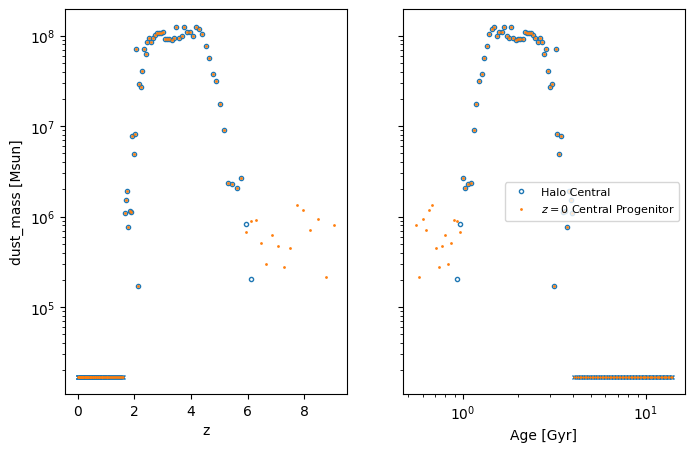

[]
6.825381151340075
[]
[]
6.825381151340075
[]


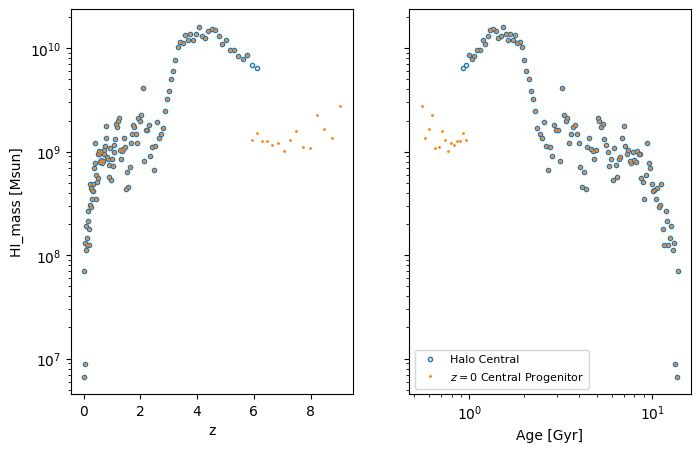

[]
0.5855820498442655
[]
[]
0.5855820498442655
[]


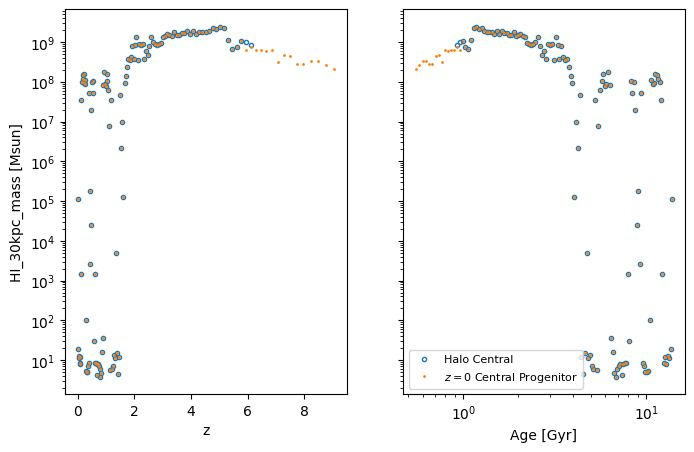

[ 92 105 106 108 113 114 115 116]
6.7442803844874
[554983.9 554983.9 554983.9 554983.9 554983.9 554983.9 554983.9 554983.9]
[105 118 119 121 126 127 128 129]
6.7442803844874
[554983.9 554983.9 554983.9 554983.9 554983.9 554983.9 554983.9 554983.9]


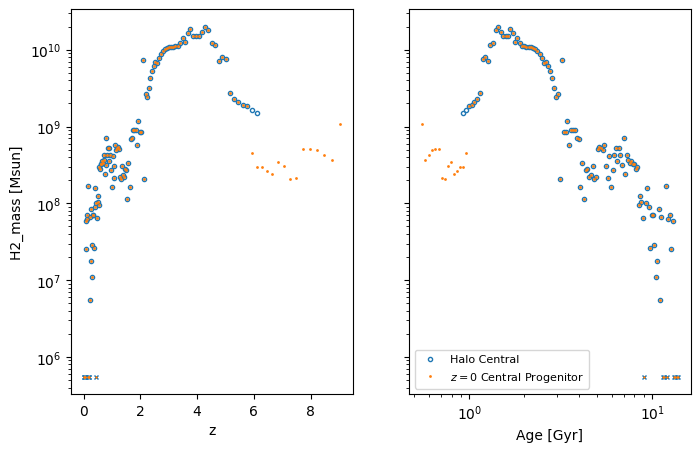

[ 52  53  54  55  56  57  58  59  60  61  62  63  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116]
7.8099798410854175
[6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6
 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6
 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6
 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6
 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6
 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6
 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6
 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6
 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6 6456242.6]
[ 65  66  67  68  69  70  71  72  73  74  75  76  78  79  80  81  82  83
  84  85  8

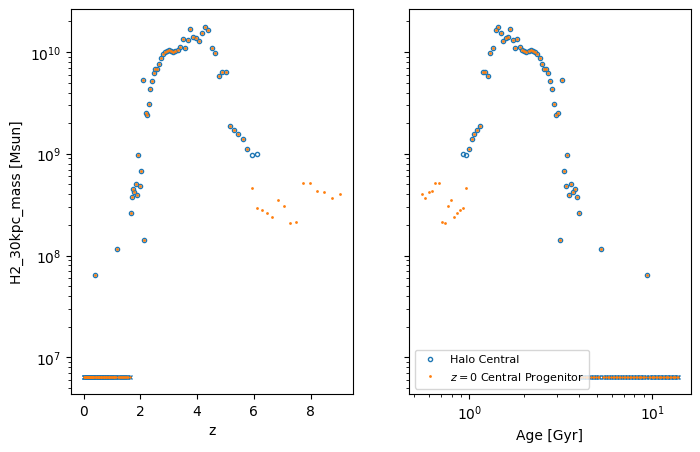

[ 52  53  54  55  56  57  58  59  60  61  62  63  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  95  96  97  98  99 100 101 102 103 104 105 106 108
 109 110 111 112 113 114 115 116]
-0.1336892676742921
[0.07350396 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396
 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396
 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396
 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396
 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396
 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396
 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396
 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396
 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396
 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396 0.07350396
 0.07350396 0.07350396]
[ 65  66  67  68  69  70  71  72 

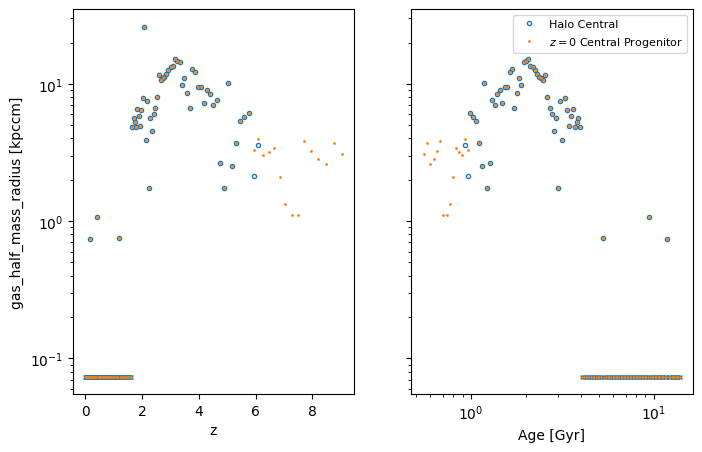

[ 52  53  54  55  56  57  58  59  60  61  62  63  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  95  96  97  98  99 100 101 102 103 104 105 106 108
 109 110 111 112 113 114 115 116]
-0.3228744784865625
[0.04754726 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726
 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726
 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726
 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726
 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726
 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726
 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726
 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726
 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726
 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726 0.04754726
 0.04754726 0.04754726]
[ 65  66  67  68  69  70  71  72 

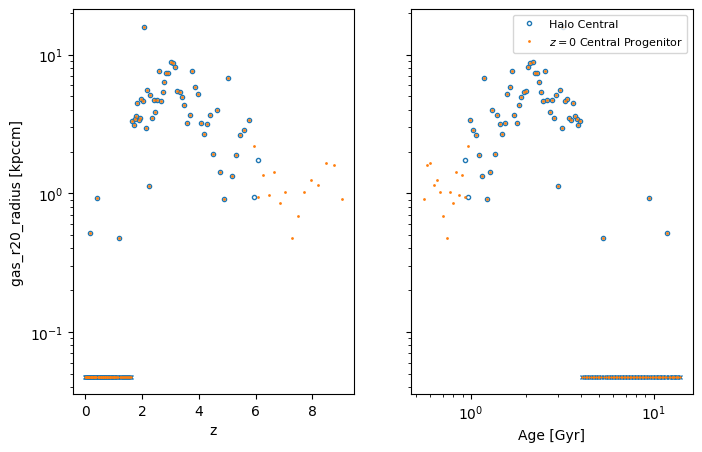

[ 52  53  54  55  56  57  58  59  60  61  62  63  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  95  96  97  98  99 100 101 102 103 104 105 106 108
 109 110 111 112 113 114 115 116]
-0.1073837593184317
[0.07809374 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374
 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374
 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374
 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374
 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374
 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374
 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374
 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374
 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374
 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374 0.07809374
 0.07809374 0.07809374]
[ 65  66  67  68  69  70  71  72 

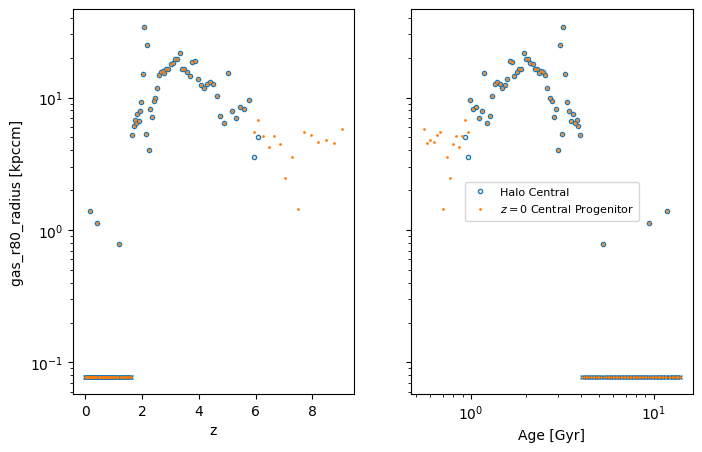

[]
0.10714892139040727
[]
[]
-0.08533240689550281
[]


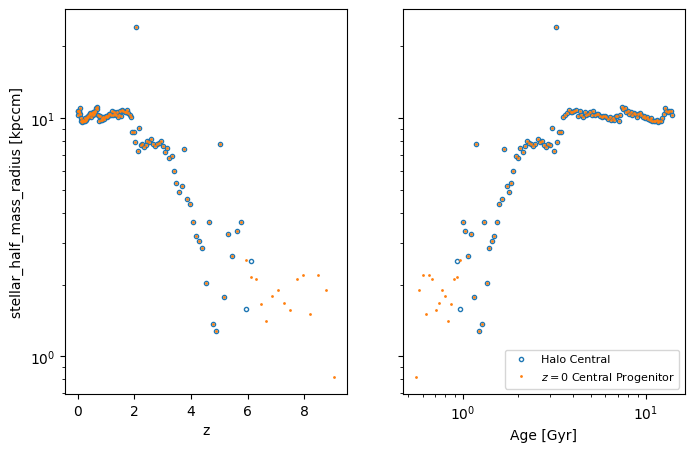

[]
-0.09752717804308522
[]
[]
-0.29088010204176995
[]


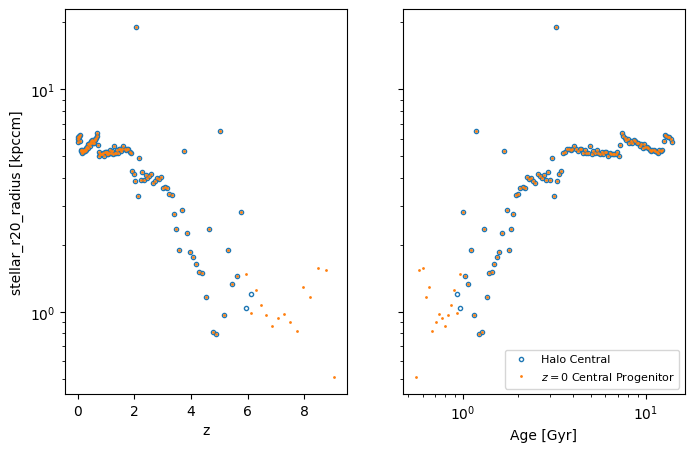

[]
0.41684772654495855
[]
[]
0.2756689944464094
[]


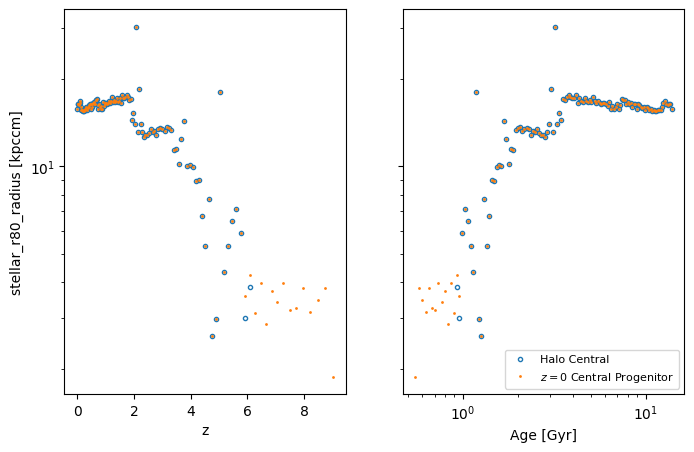

[]
-0.9566949719268537
[]
[]
-0.9566949719268537
[]


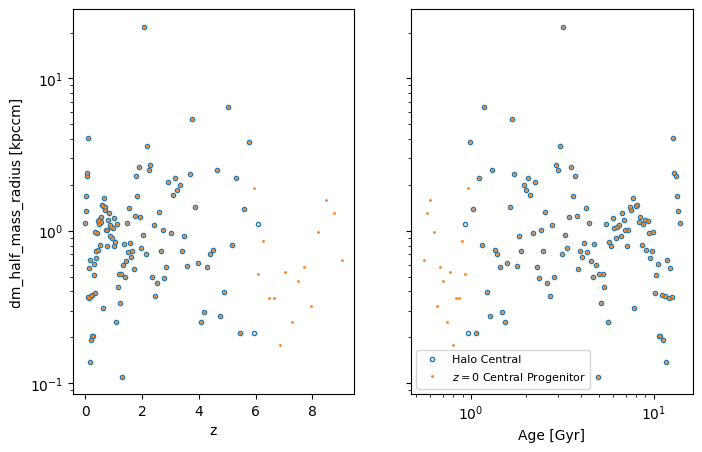

[]
-0.9566949719268537
[]
[]
-0.9566949719268537
[]


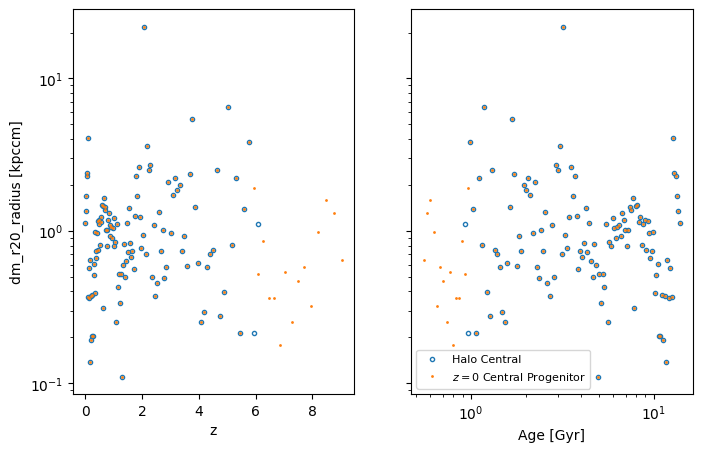

[]
-0.9566949719268537
[]
[]
-0.9566949719268537
[]


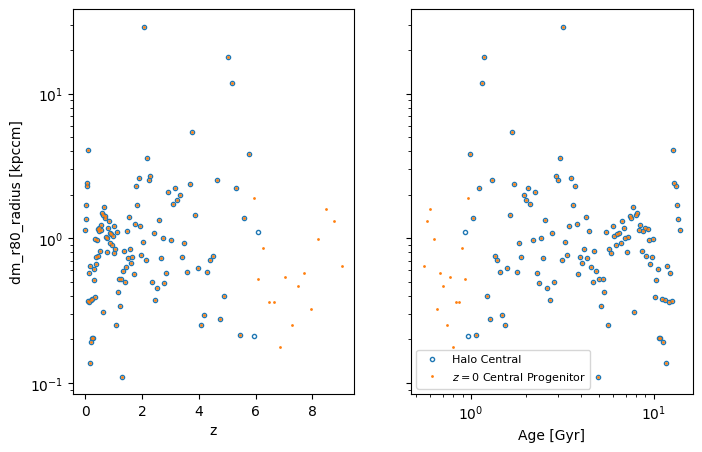

[]
0.15632128522242167
[]
[]
0.111792070191138
[]


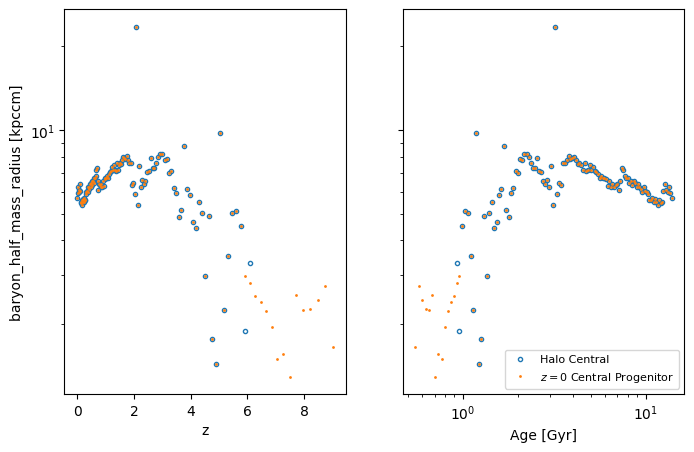

[]
-0.9566949719268537
[]
[]
-0.9566949719268537
[]


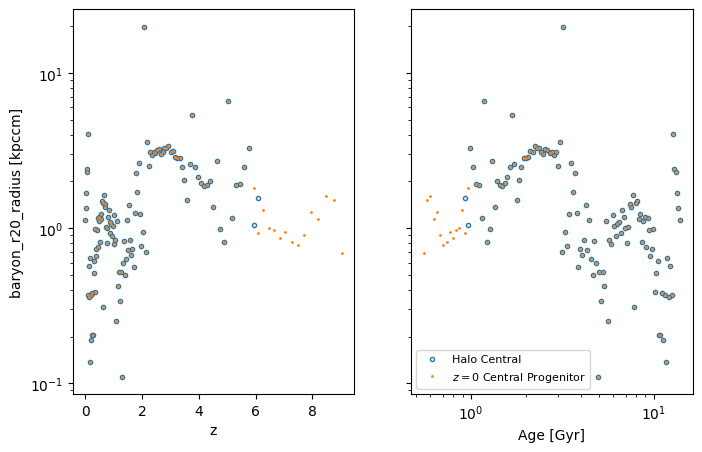

[]
0.5330792018483573
[]
[]
0.401256579435049
[]


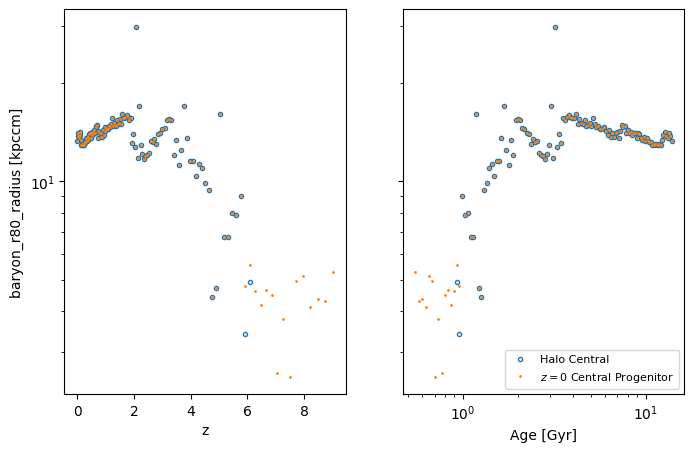

[]
0.15632128522242167
[]
[]
0.111792070191138
[]


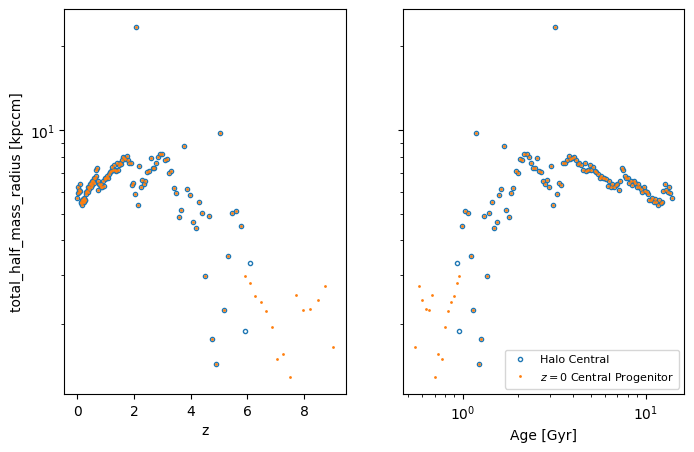

[]
-0.9566949719268537
[]
[]
-0.9566949719268537
[]


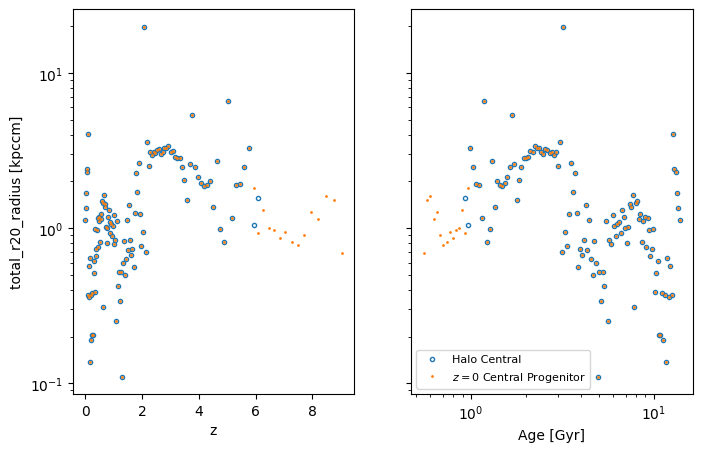

[]
0.5330792018483573
[]
[]
0.401256579435049
[]


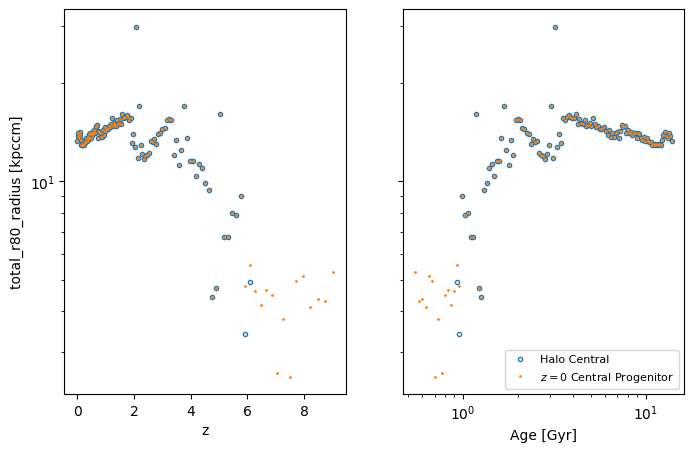

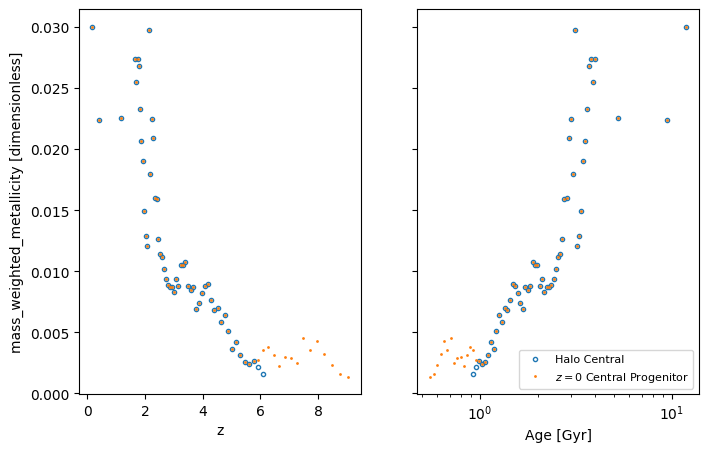

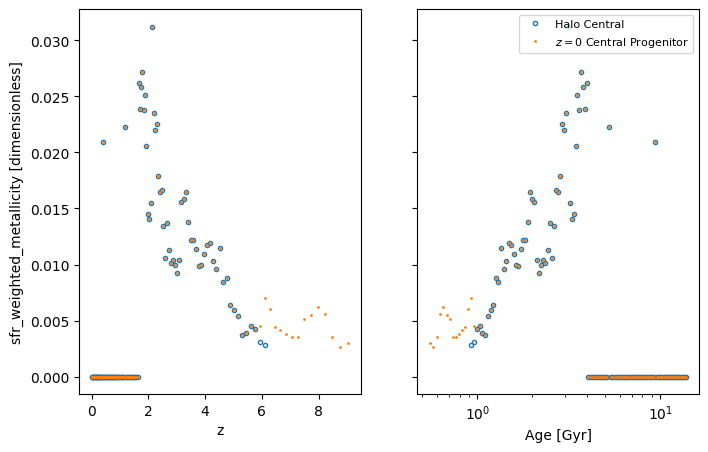

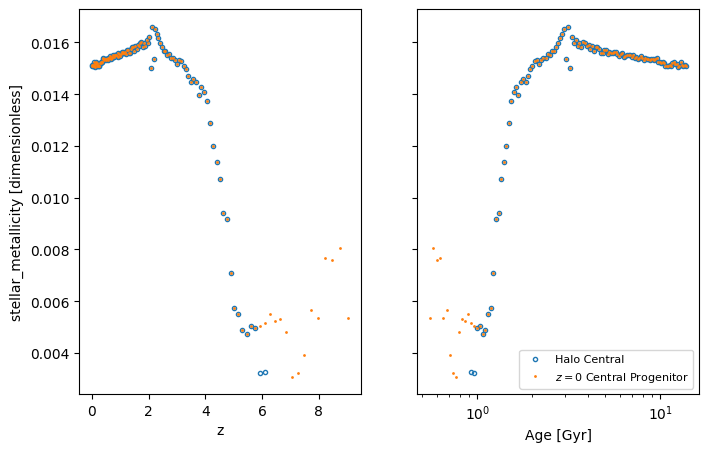

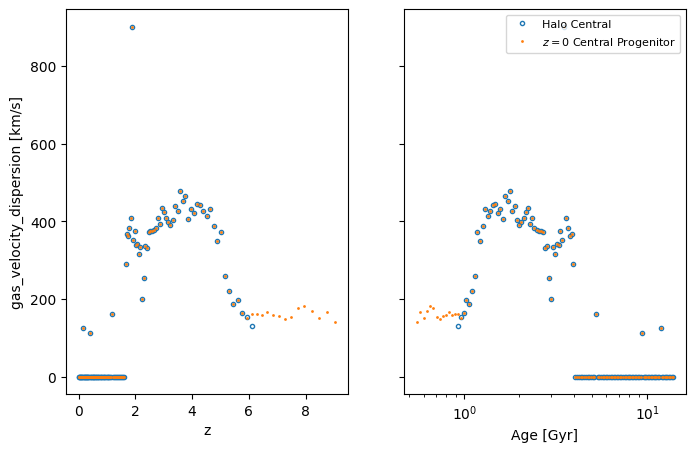

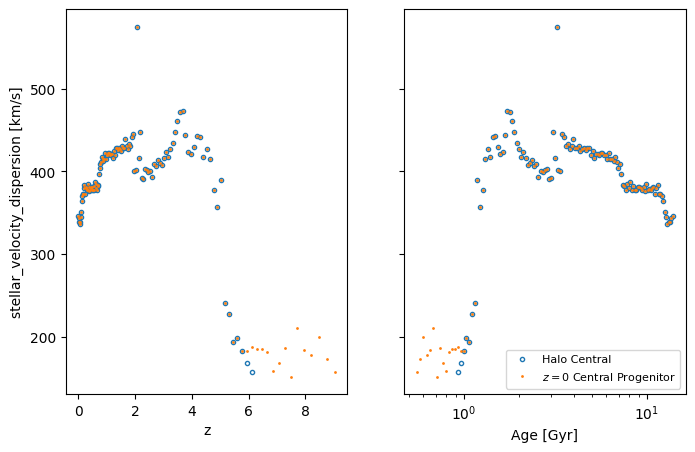

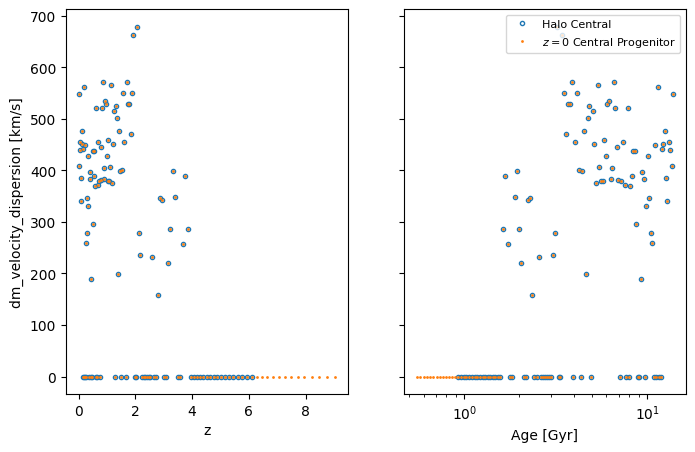

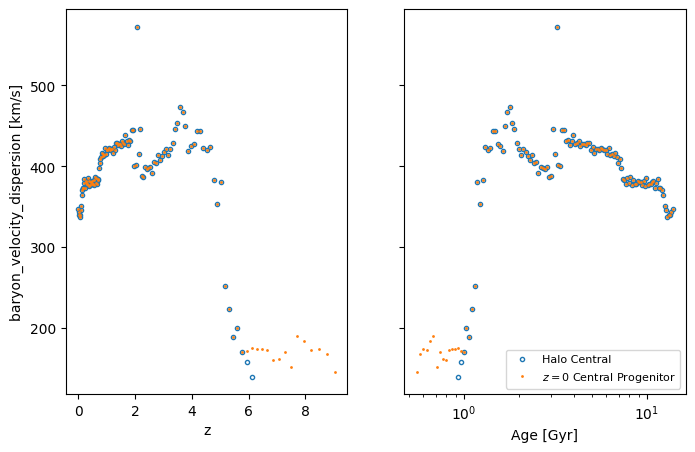

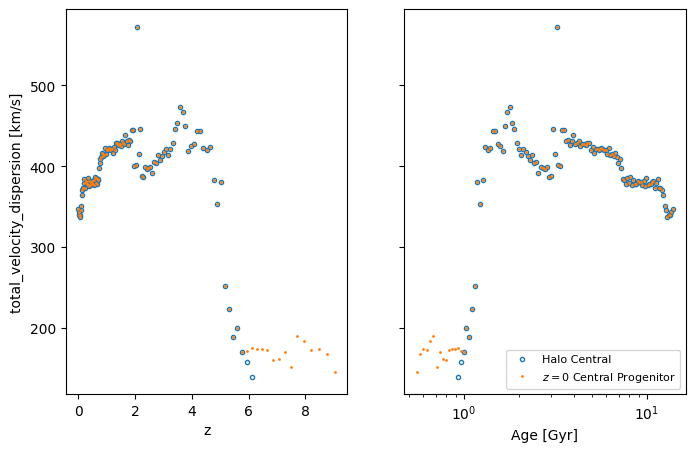

[]
-0.9975964467579793
[]
[]
-1.5596297860904205
[]


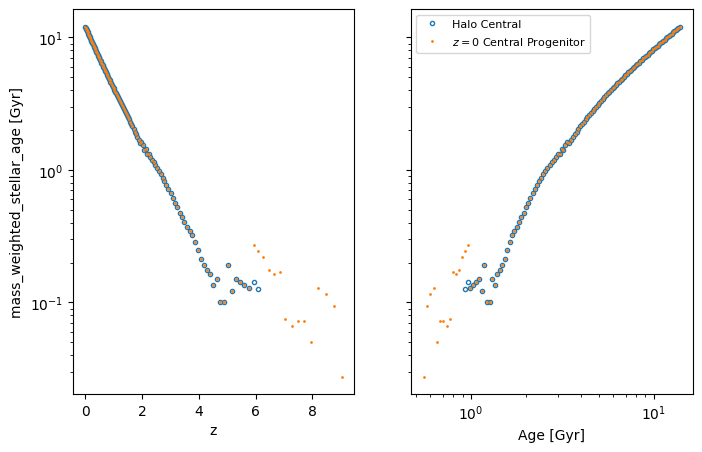

[]
7.792503695011109
[]
[]
7.1440951610760886
[]


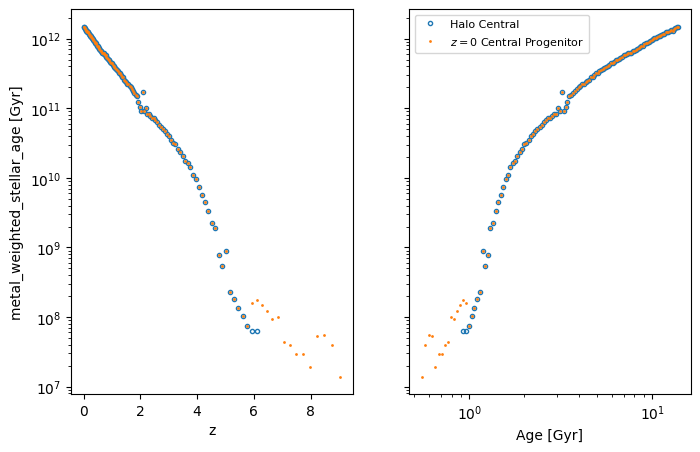

/tmp/ipykernel_2764675/67650684.py:35: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  ax[0].set_yscale('log')


[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116]
[0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
[  0   1   2   3   4   5   6   7   8   9  10  11

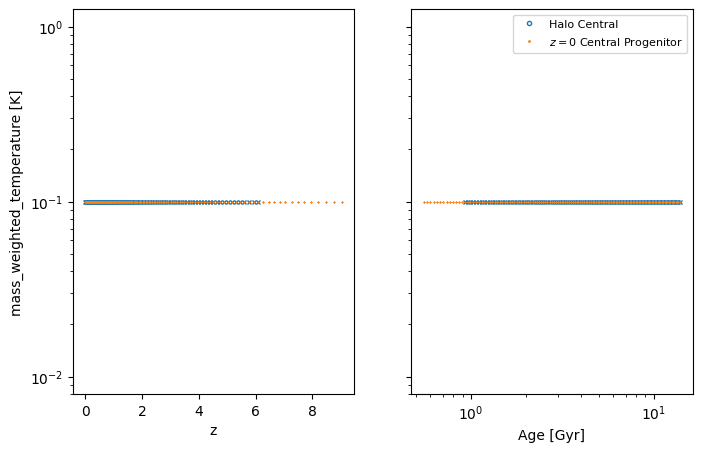

[ 52  53  54  55  56  57  58  59  60  61  62  63  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  95  96  97  98  99 100 101 102 103 104 105 106 108
 109 110 111 112 113 114 115 116]
3.9510405362831653
[893.38886719 893.38886719 893.38886719 893.38886719 893.38886719
 893.38886719 893.38886719 893.38886719 893.38886719 893.38886719
 893.38886719 893.38886719 893.38886719 893.38886719 893.38886719
 893.38886719 893.38886719 893.38886719 893.38886719 893.38886719
 893.38886719 893.38886719 893.38886719 893.38886719 893.38886719
 893.38886719 893.38886719 893.38886719 893.38886719 893.38886719
 893.38886719 893.38886719 893.38886719 893.38886719 893.38886719
 893.38886719 893.38886719 893.38886719 893.38886719 893.38886719
 893.38886719 893.38886719 893.38886719 893.38886719 893.38886719
 893.38886719 893.38886719 893.38886719 893.38886719 893.38886719
 893.38886719 893.38886719 893.38886719 893.38886719 893.38886719
 8

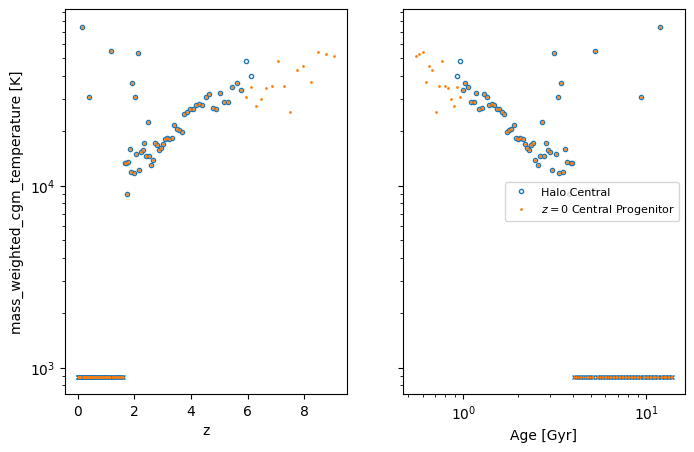

In [309]:
for prop_name in central_comparisons:
    if prop_name in ['z_halo', 'z_central', 'z_central_tracked', 'age_halo', 'age_central', 'age_central_tracked', 'snap_num']: continue

    central_prop = prop_dict[prop_name]
    central_tracked_prop = prop_dict[f'{prop_name}_tracked']
    
    # if len(prop) == 0:
    #     print(f'{prop_name} is empty')
    #     continue
    
    fig, ax = plt.subplots(num=1, figsize=(8,5),
                           nrows=1, ncols=2, sharey='row')
    
    ax[0].plot(prop_dict['z_central'], central_prop,
               marker='o', ms=3, mfc='none', mec='C0', ls='', label='Halo Central')
    ax[1].plot(prop_dict['age_central'], central_prop,
               marker='o', ms=3, mfc='none', mec='C0', ls='', label='Halo Central')
    
    ax[0].plot(prop_dict['z_central_tracked'], central_tracked_prop,
               marker='o', ms=1, mfc='none', mec='C1', ls='', label=r'$z=0$ Central Progenitor')
    ax[1].plot(prop_dict['age_central_tracked'], central_tracked_prop,
               marker='o', ms=1, mfc='none', mec='C1', ls='', label=r'$z=0$ Central Progenitor')
    
    ax[1].set_xscale('log')

    ax[0].set_xlabel('z')
    ax[1].set_xlabel('Age [Gyr]')

    try:
         ax[0].set_ylabel(f'{prop_name.replace('_central', '')} [{central_prop[0].units}]')
    except:
        ax[0].set_ylabel(f'{prop_name.replace('_central', '')}')
    
    if prop_name in log_props:
        ax[0].set_yscale('log')
        ax[1].set_yscale('log')

        ## Plot all 0 values as 1 dex below minimum nonzero value
        for central_type, prop, color, ms in zip(['', '_tracked'], [central_prop, central_tracked_prop], ['C0', 'C1'], [3, 1]):
            zero_value_indexes = np.where(np.array(prop)==0)[0]
            nonzero_value_indexes = np.where(np.array(prop)!=0)[0]
            print(zero_value_indexes)
            try:
                print(min(np.log10(np.array(prop)[nonzero_value_indexes])))
                zero_value_for_plotting = np.array([10**(min(np.log10(np.array(prop)[nonzero_value_indexes]))-1)] * len(zero_value_indexes))
            except:
                zero_value_for_plotting = np.array([10**(-1)] * len(zero_value_indexes))
            print(zero_value_for_plotting)
    
            ax[0].plot(np.array(prop_dict[f'z_central{central_type}'])[zero_value_indexes], zero_value_for_plotting, 
                       marker='x', ms=ms, mec=color, ls='')
            ax[1].plot(np.array(prop_dict[f'age_central{central_type}'])[zero_value_indexes], zero_value_for_plotting, 
                       marker='x', ms=ms, mec=color, ls='')
    
    
    # ax[1].legend(loc='upper right', fontsize=8)
    ax[1].legend(fontsize=8)
    plt.show()

In [81]:
prop_comparison_names = []
for prop_name in prop_names:
    base_name = prop_name
    for _type_ in ['halo', 'central', 'tracked']:
        base_name = base_name.replace(f'_{_type_}', '')
    if base_name not in prop_comparison_names:
        prop_comparison_names.append(base_name)

In [82]:
prop_comparison_names

['snap_num',
 'age',
 'z',
 'index',
 'contamination',
 'minpotpos',
 'num_major_mergers',
 'bh_mdot',
 'bh_fedd',
 'bh_mdot_edd',
 'm2500c',
 'r2500c',
 'm500c',
 'r500c',
 'm200c',
 'r200c',
 'circular_velocity',
 'spin_param',
 'temperature',
 'sfr',
 'ssfr',
 'sfr_100',
 'ssfr_100',
 'gas_mass',
 'stellar_mass',
 'dm_mass',
 'dust_mass',
 'H2_mass',
 'gas_half_mass_radius',
 'gas_r20_radius',
 'gas_r80_radius',
 'stellar_half_mass_radius',
 'stellar_r20_radius',
 'stellar_r80_radius',
 'dm_half_mass_radius',
 'dm_r20_radius',
 'dm_r80_radius',
 'baryon_half_mass_radius',
 'baryon_r20_radius',
 'baryon_r80_radius',
 'total_half_mass_radius',
 'total_r20_radius',
 'total_r80_radius',
 'mass_weighted_metallicity',
 'sfr_weighted_metallicity',
 'stellar_metallicity',
 'mass_weighted_cgm_metallicity',
 'temp_weighted_cgm_metallicity',
 'gas_velocity_dispersion',
 'stellar_velocity_dispersion',
 'dm_velocity_dispersion',
 'baryon_velocity_dispersion',
 'total_velocity_dispersion',
 'mass

In [83]:
log_base_props = []
for prop_name in log_props:
    base_name = prop_name
    for _type_ in ['halo', 'central', 'tracked']:
        base_name = base_name.replace(f'_{_type_}', '')
    if base_name not in log_base_props:
        log_base_props.append(base_name)

In [84]:
log_base_props

['m2500c',
 'm500c',
 'm200c',
 'r2500c',
 'r500c',
 'r200c',
 'bh_mdot',
 'bh_fedd',
 'bh_mdot_edd',
 'sfr',
 'sfr_100',
 'ssfr',
 'ssfr_100',
 'temperature',
 'mass_weighted_temperature',
 'mass_weighted_cgm_temperature',
 'gas_mass',
 'stellar_mass',
 'dm_mass',
 'dust_mass',
 'H2_mass',
 'bh_mass',
 'HI_mass',
 'gas_30kpc_mass',
 'stellar_30kpc_mass',
 'dm_30kpc_mass',
 'bh_30kpc_mass',
 'dust_30kpc_mass',
 'HI_30kpc_mass',
 'H2_30kpc_mass',
 'gas_half_mass_radius',
 'stellar_half_mass_radius',
 'dm_half_mass_radius',
 'bh_half_mass_radius',
 'baryon_half_mass_radius',
 'total_half_mass_radius',
 'gas_r20_radius',
 'stellar_r20_radius',
 'dm_r20_radius',
 'bh_r20_radius',
 'baryon_r20_radius',
 'total_r20_radius',
 'gas_r80_radius',
 'stellar_r80_radius',
 'dm_r80_radius',
 'bh_r80_radius',
 'baryon_r80_radius',
 'total_r80_radius',
 'temp_weighted_cgm_metallicity',
 'mass_weighted_stellar_age',
 'metal_weighted_stellar_age',
 'local_mass_density_300kpccm',
 'local_mass_density_100

snap_num
age
z
index


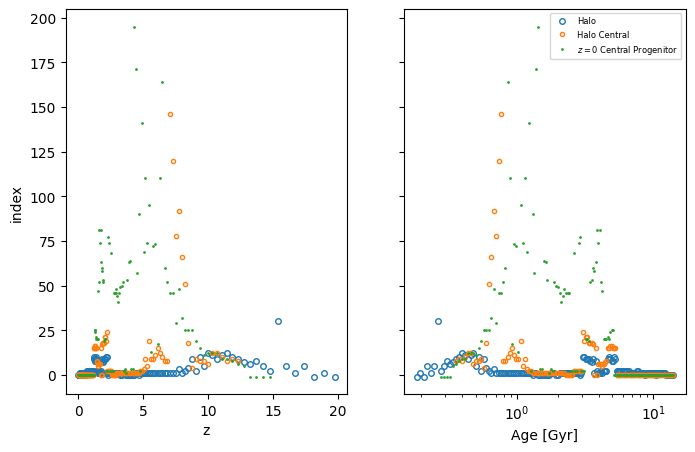

contamination
contamination_central does not exist
contamination_central_tracked does not exist


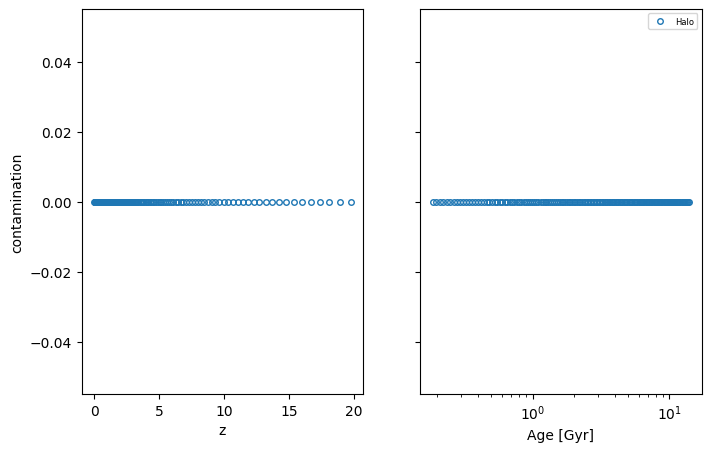

minpotpos


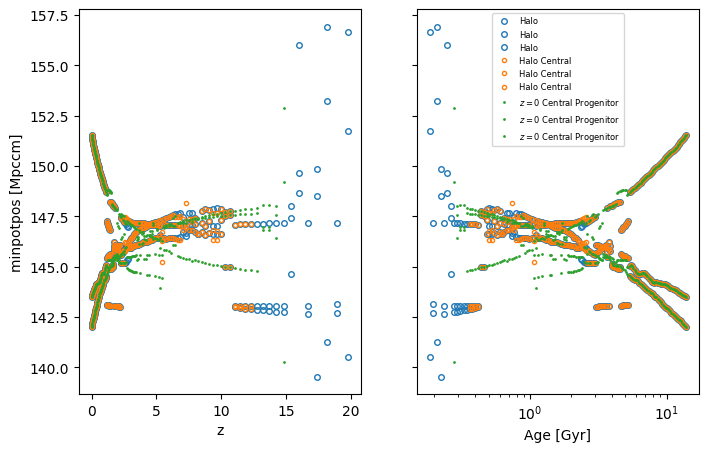

num_major_mergers
num_major_mergers_central does not exist
num_major_mergers_central_tracked does not exist


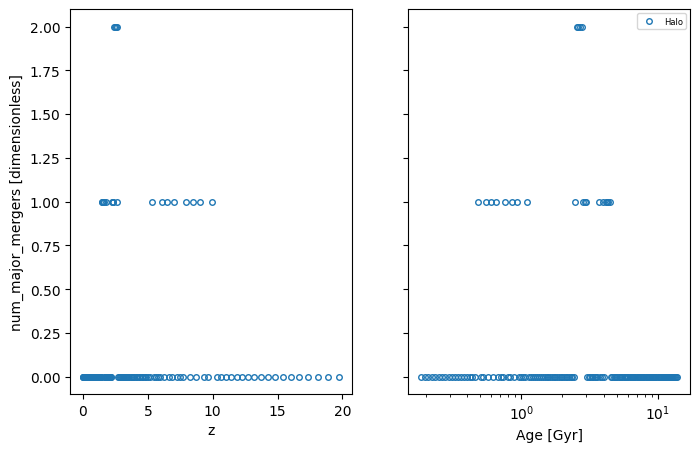

bh_mdot
bh_mdot_halo does not exist
[12 13 14 15 16 17 18 19 20 21 22]
nan
[nan nan nan nan nan nan nan nan nan nan nan]
[17 18 19 20 21 22 23 24 25 26 28 29 31 32 33 34 35 37 38 39 40 43 44]
nan
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]


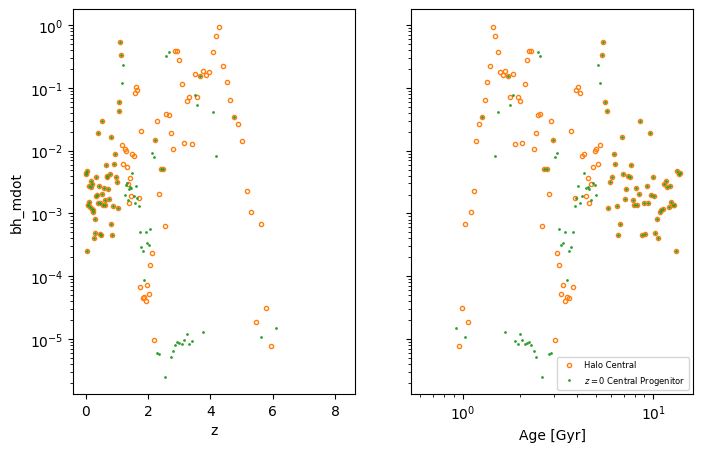

bh_fedd
bh_fedd_halo does not exist
[12 13 14 15 16 17 18 19 20 21 22]
nan
[nan nan nan nan nan nan nan nan nan nan nan]
[17 18 19 20 21 22 23 24 25 26 28 29 31 32 33 34 35 37 38 39 40 43 44]
nan
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan]


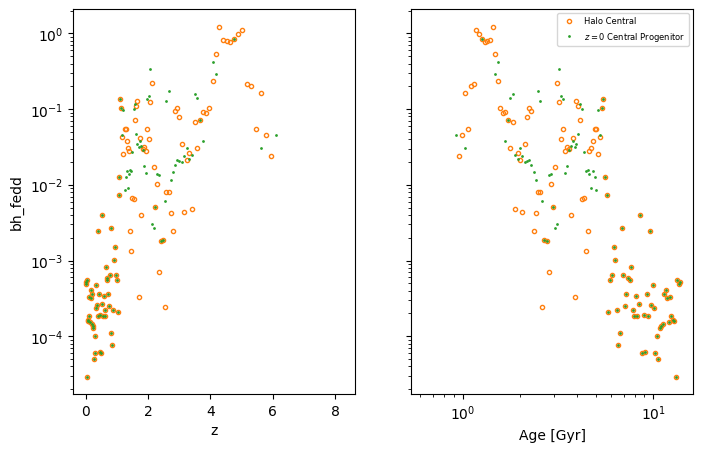

bh_mdot_edd
bh_mdot_edd_halo does not exist
[]
nan
[]
[]
nan
[]


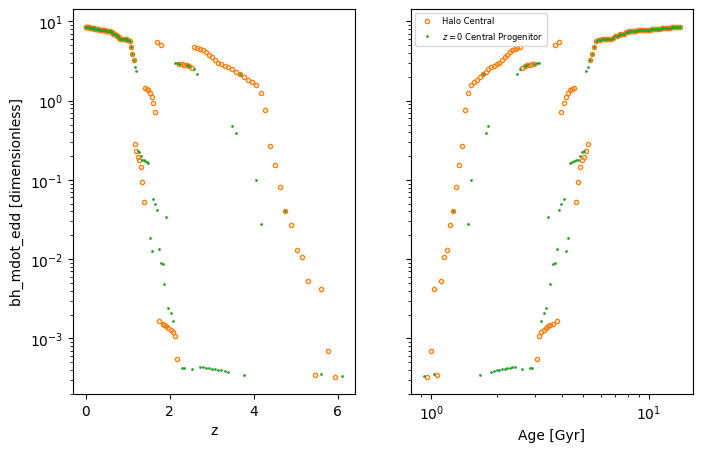

m2500c
[0 1 2 3 6]
7.715017747338747
[5188212.4 5188212.4 5188212.4 5188212.4 5188212.4]
m2500c_central does not exist
m2500c_central_tracked does not exist


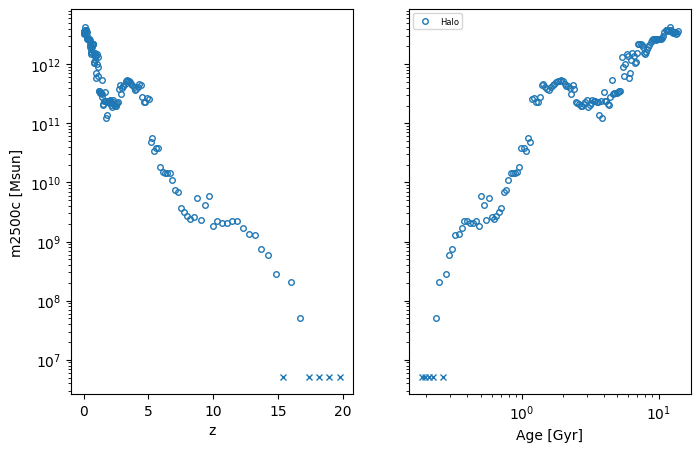

r2500c
[0 1 2 3 6]
0.6889939088986616
[0.48864551 0.48864551 0.48864551 0.48864551 0.48864551]
r2500c_central does not exist
r2500c_central_tracked does not exist


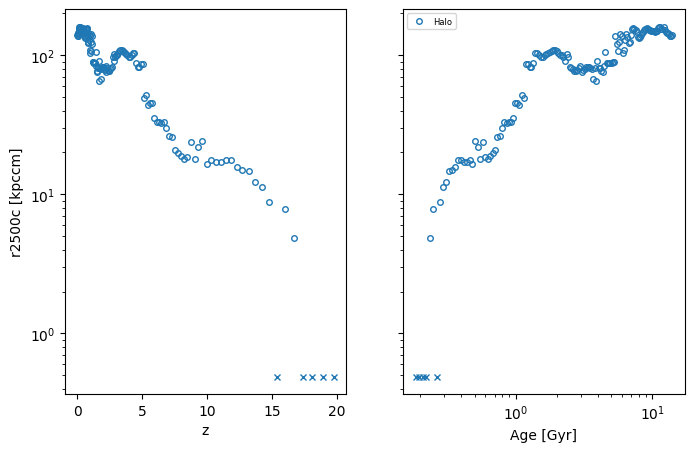

m500c
[0 1 2 3 6]
8.677142425327757
[47549113.60000002 47549113.60000002 47549113.60000002 47549113.60000002
 47549113.60000002]
m500c_central does not exist
m500c_central_tracked does not exist


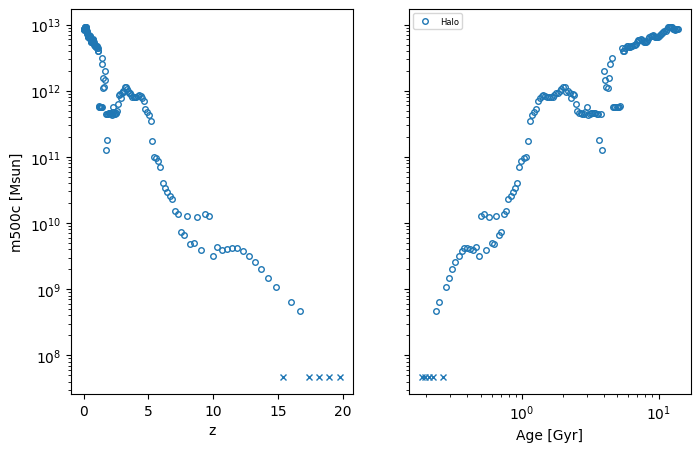

r500c
[0 1 2 3 6]
1.2563386636686678
[1.80442429 1.80442429 1.80442429 1.80442429 1.80442429]
r500c_central does not exist
r500c_central_tracked does not exist


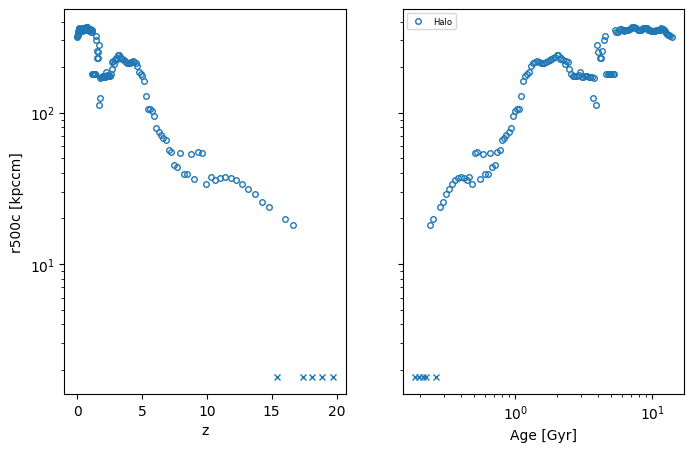

m200c
[0 1 2 3 6]
8.754235722621463
[56785273.6000001 56785273.6000001 56785273.6000001 56785273.6000001
 56785273.6000001]
m200c_central does not exist
m200c_central_tracked does not exist


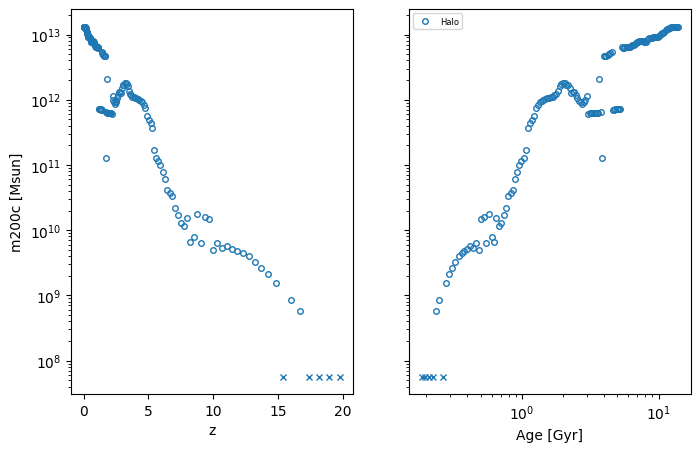

r200c
[0 1 2 3 6]
1.412104713870901
[2.58288288 2.58288288 2.58288288 2.58288288 2.58288288]
r200c_central does not exist
r200c_central_tracked does not exist


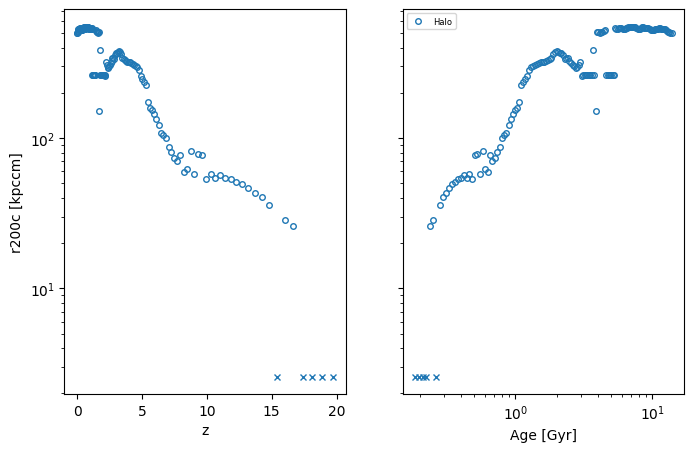

circular_velocity
circular_velocity_central does not exist
circular_velocity_central_tracked does not exist


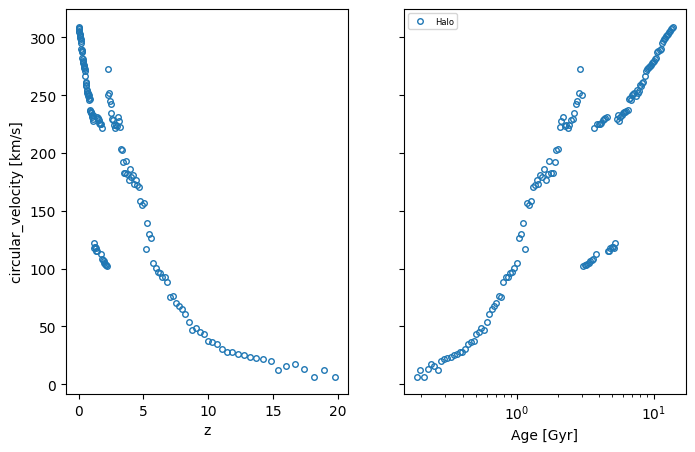

spin_param
spin_param_central does not exist
spin_param_central_tracked does not exist


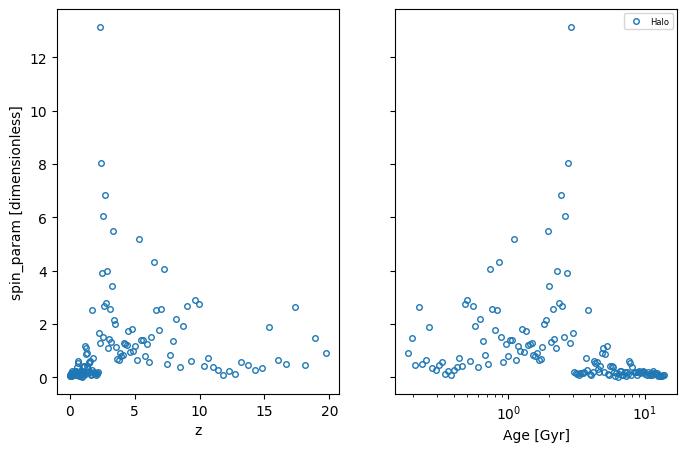

temperature
[]
3.1974011711347963
[]
temperature_central does not exist
temperature_central_tracked does not exist


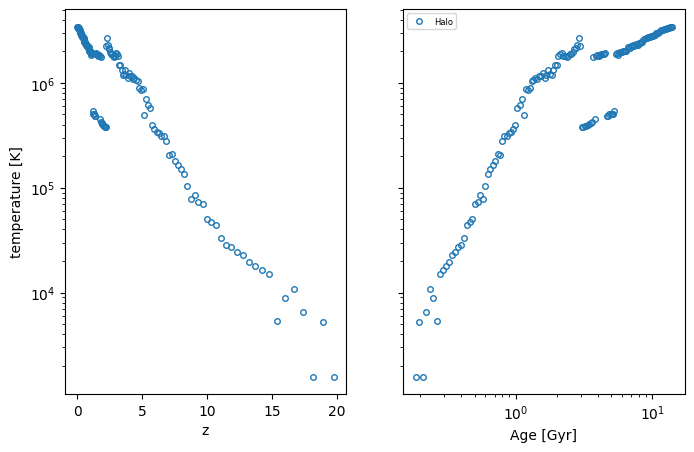

sfr
[0 1 2 3 4 6]
-2.443046016978283
[0.00036054 0.00036054 0.00036054 0.00036054 0.00036054 0.00036054]
[]
-0.8873972652659268
[]
[]
-1.4130324692853287
[]


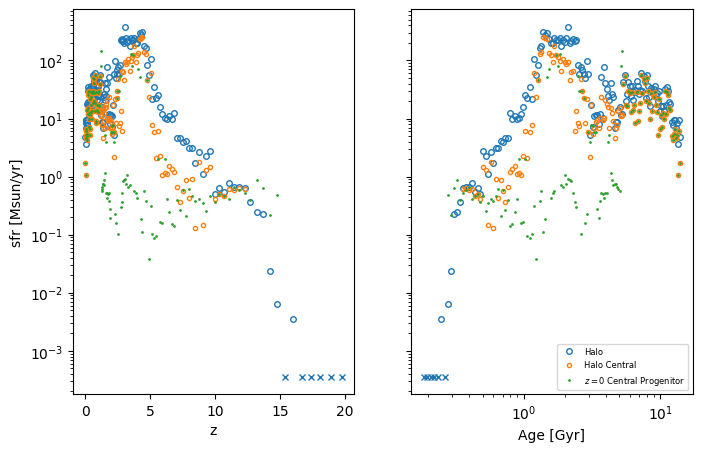

ssfr
[]
nan
[]
[]
-11.101733600741339
[]
[]
-11.101733600741339
[]


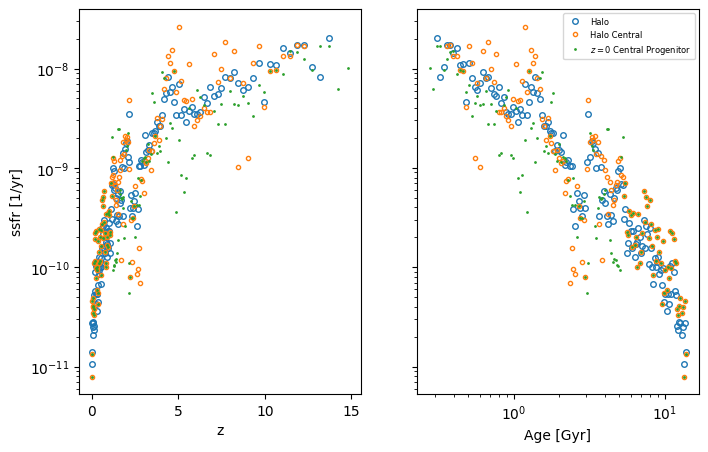

sfr_100
[0 1 2 3 4 5 6 7 8]
-0.9429936346694796
[0.01140267 0.01140267 0.01140267 0.01140267 0.01140267 0.01140267
 0.01140267 0.01140267 0.01140267]
[]
-0.7966229567195462
[]
[]
-1.3409336433415173
[]


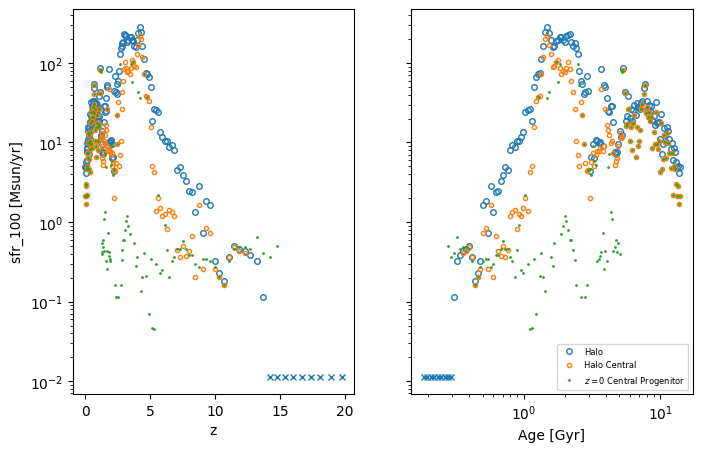

ssfr_100
[]
nan
[]
[]
-10.905559337632864
[]
[]
-10.905559337632864
[]


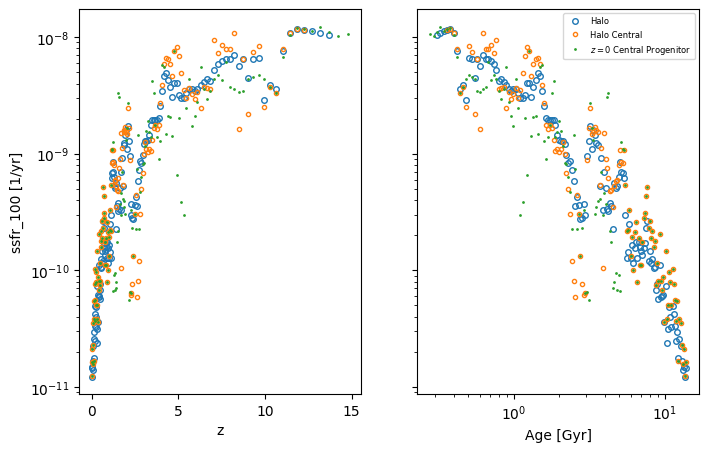

gas_mass
[]
7.399429046152727
[]
[]
7.615933013413362
[]
[]
7.486857457381718
[]


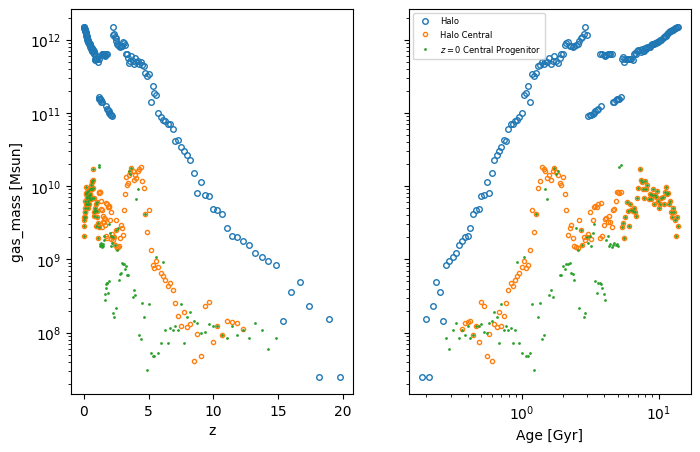

stellar_mass
[0 1 2 3 4 5 6 7 8]
7.037939638325977
[1091288.65 1091288.65 1091288.65 1091288.65 1091288.65 1091288.65
 1091288.65 1091288.65 1091288.65]
[]
7.549136623013712
[]
[]
7.55088510739812
[]


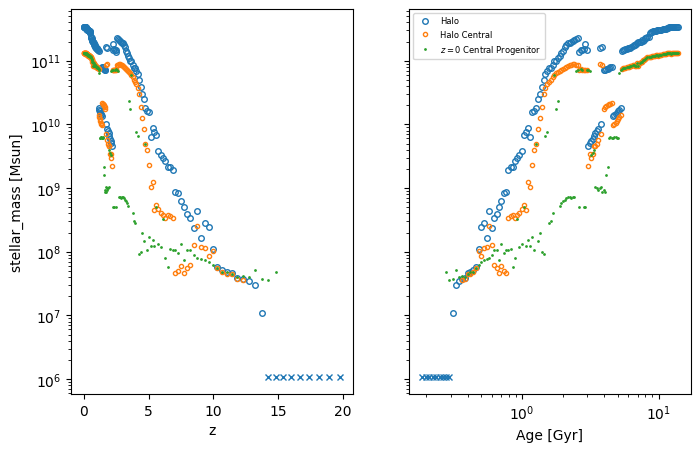

dm_mass
[]
8.192139007638938
[]
dm_mass_central does not exist
dm_mass_central_tracked does not exist


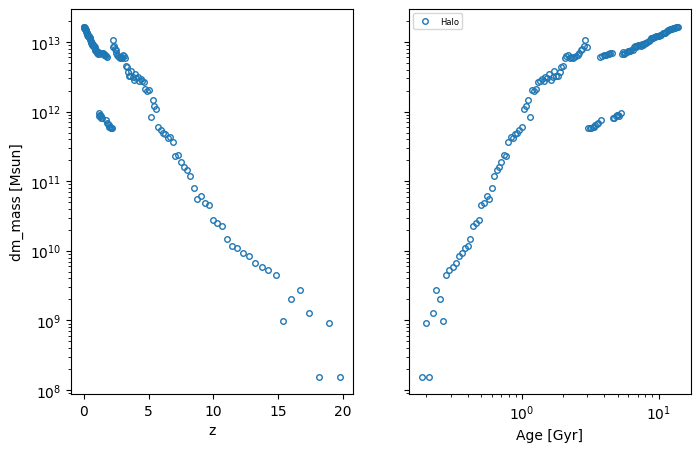

dust_mass
[0 2 6]
1.343582338065935
[2.20588231 2.20588231 2.20588231]
[]
3.843196660025217
[]
[]
2.1797910671751466
[]


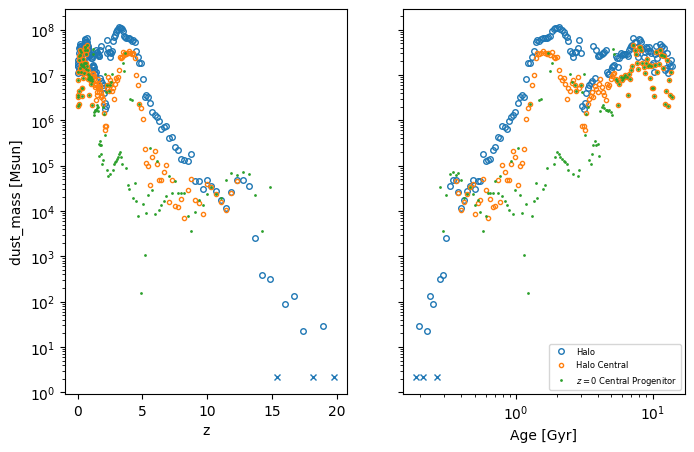

H2_mass
[0 1 2 3 4 6]
6.196091860152323
[157069.49960364 157069.49960364 157069.49960364 157069.49960364
 157069.49960364 157069.49960364]
[]
7.830182484773933
[]
[]
7.296358971379445
[]


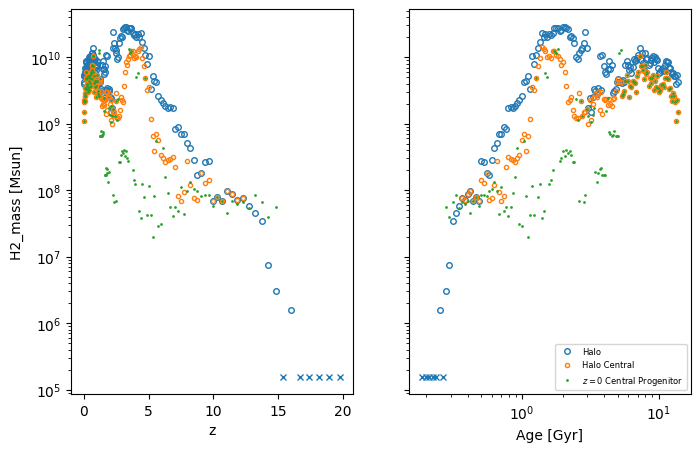

gas_half_mass_radius
[]
1.4033912911516175
[]
[]
-0.2829323715902935
[]
[]
-0.2957922050753023
[]


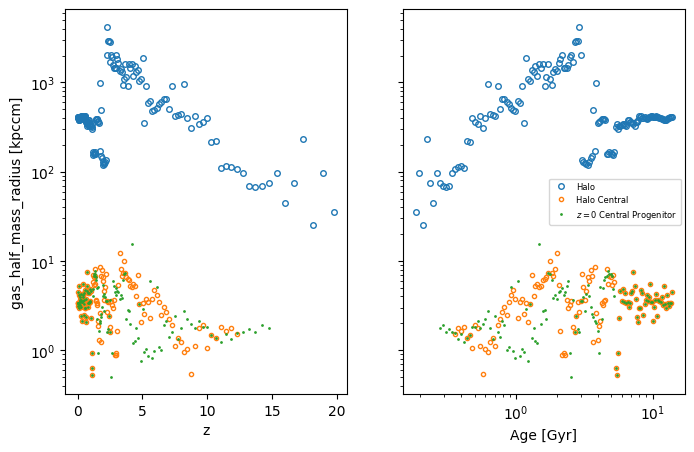

gas_r20_radius
[]
0.8906418551746077
[]
[]
-0.4919855094095276
[]
[]
-0.5584077860570466
[]


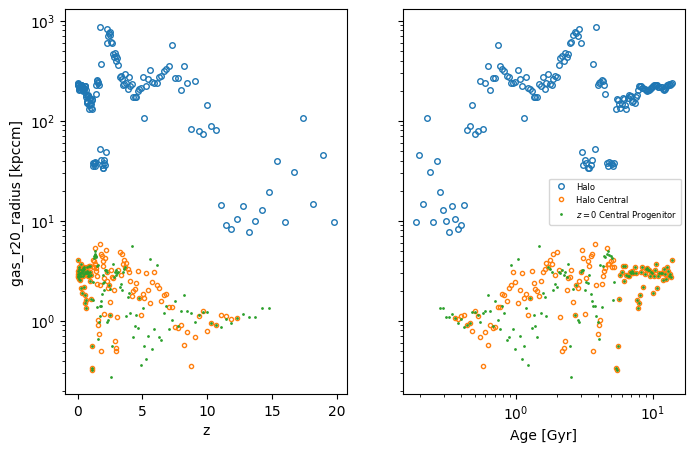

gas_r80_radius
[]
1.57100021601486
[]
[]
-0.15339683183299674
[]
[]
-0.12912577160494135
[]


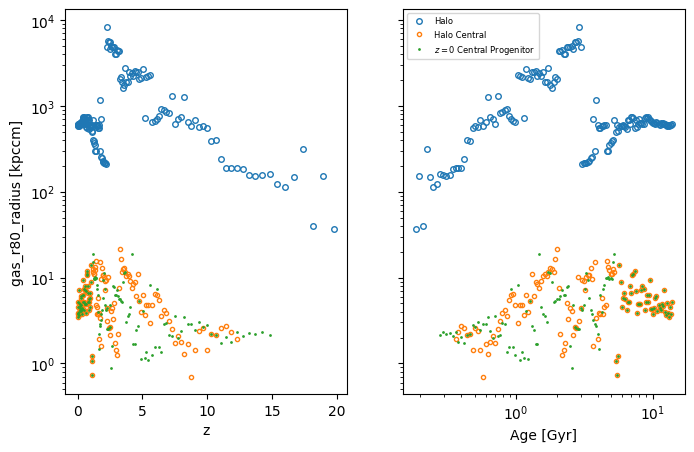

stellar_half_mass_radius
[5 6 7 8]
nan
[nan nan nan nan]
[]
-0.3715641001161458
[]
[]
-0.19249374872685848
[]


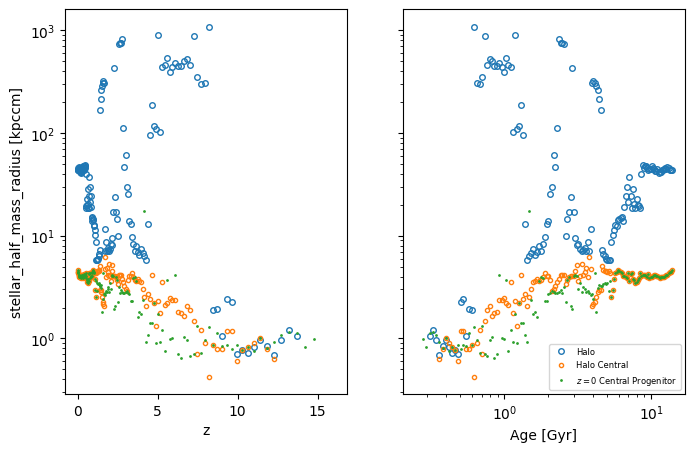

stellar_r20_radius
[5 6 7 8]
nan
[nan nan nan nan]
[]
-0.5757310526056132
[]
[]
-0.41138961633365717
[]


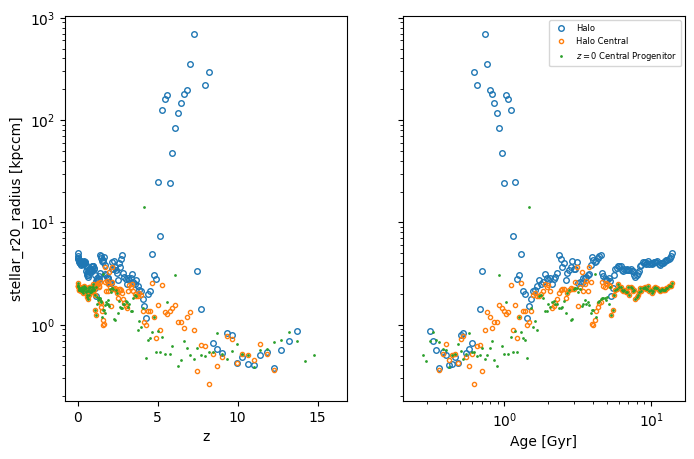

stellar_r80_radius
[5 6 7 8]
nan
[nan nan nan nan]
[]
-0.08746325852812192
[]
[]
0.005548065775459361
[]


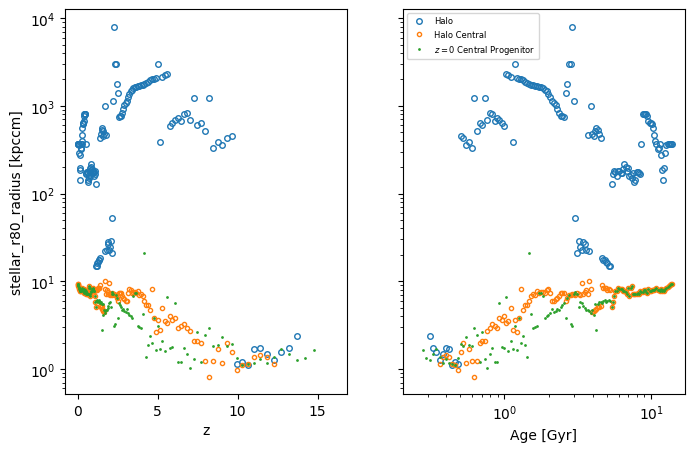

dm_half_mass_radius
[]
1.3594888401164211
[]
dm_half_mass_radius_central does not exist
dm_half_mass_radius_central_tracked does not exist


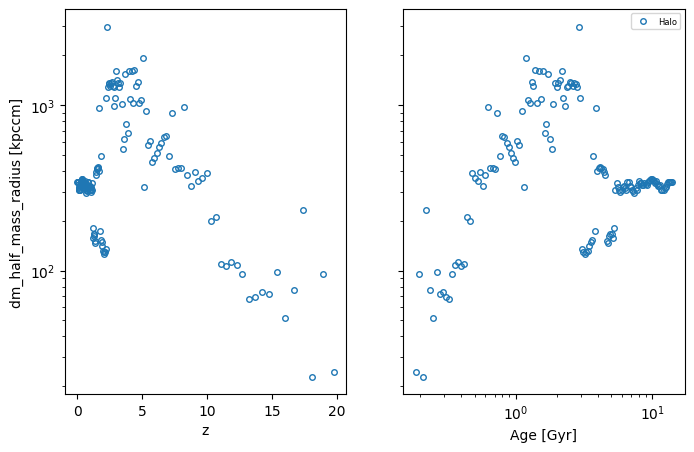

dm_r20_radius
[]
1.1443872925975147
[]
dm_r20_radius_central does not exist
dm_r20_radius_central_tracked does not exist


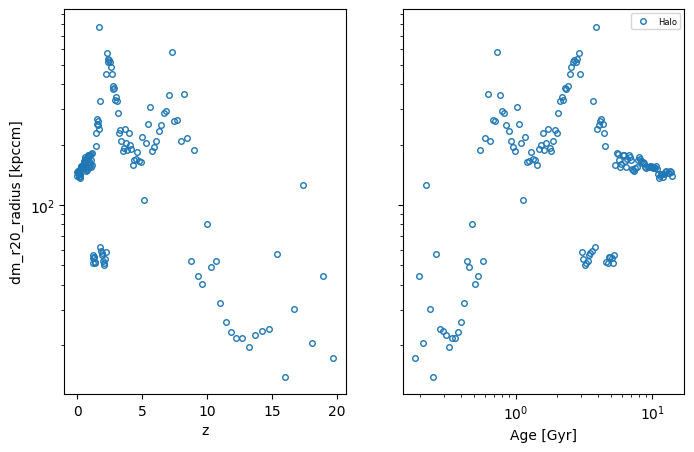

dm_r80_radius
[]
1.4764371056713275
[]
dm_r80_radius_central does not exist
dm_r80_radius_central_tracked does not exist


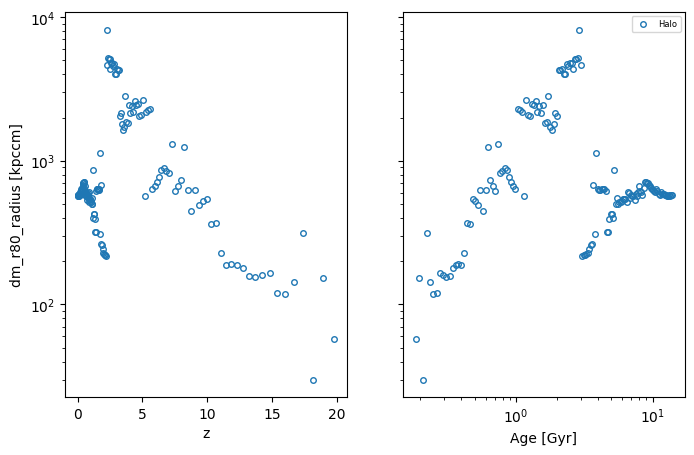

baryon_half_mass_radius
[]
1.4033912911516175
[]
[]
-0.18305380977267666
[]
[]
-0.08283372696187885
[]


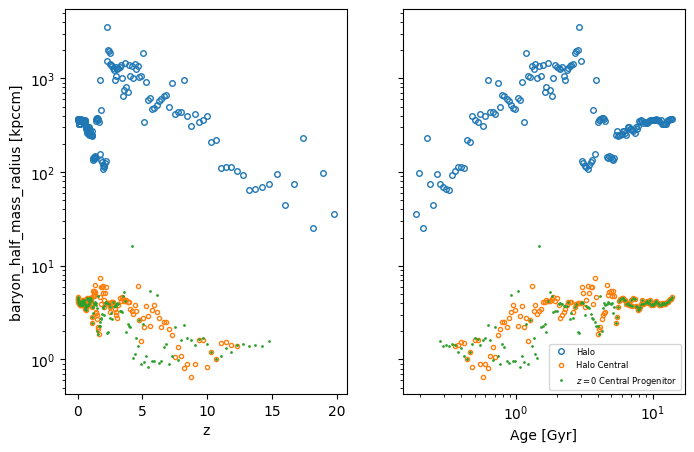

baryon_r20_radius
[]
0.8273741901273056
[]
[]
-0.4120957754888043
[]
[]
-0.2800254088323151
[]


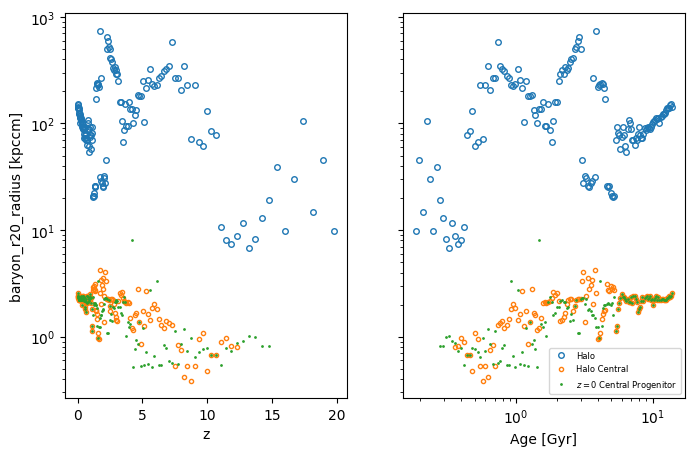

baryon_r80_radius
[]
1.57100021601486
[]
[]
0.07515930289167067
[]
[]
0.10789208550515811
[]


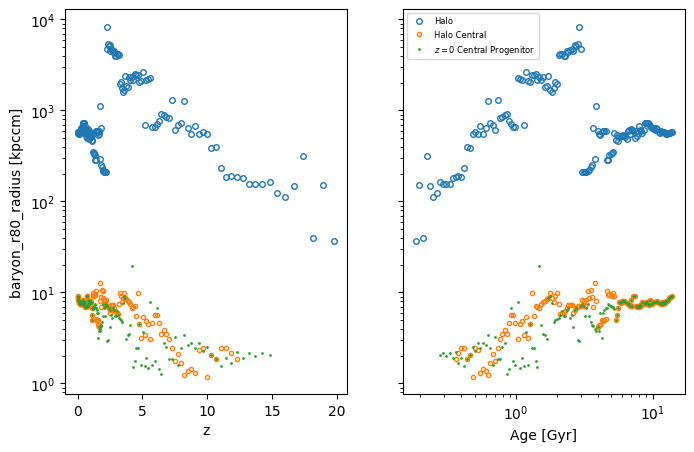

total_half_mass_radius
[]
1.3594888401164211
[]
[]
-0.18305380977267666
[]
[]
-0.08283372696187885
[]


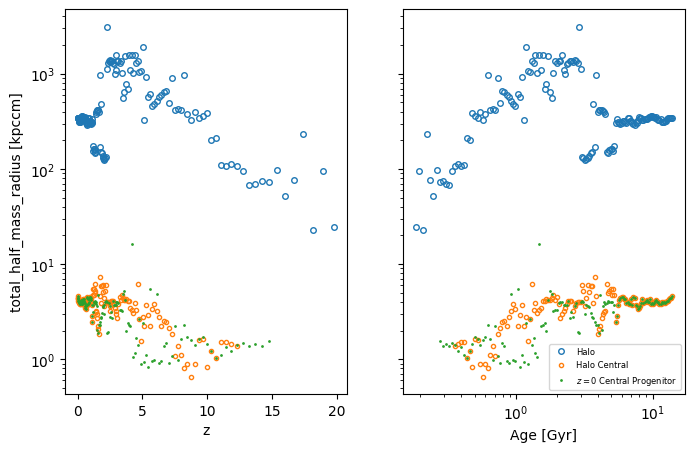

total_r20_radius
[]
1.144236732811321
[]
[]
-0.4120957754888043
[]
[]
-0.2800254088323151
[]


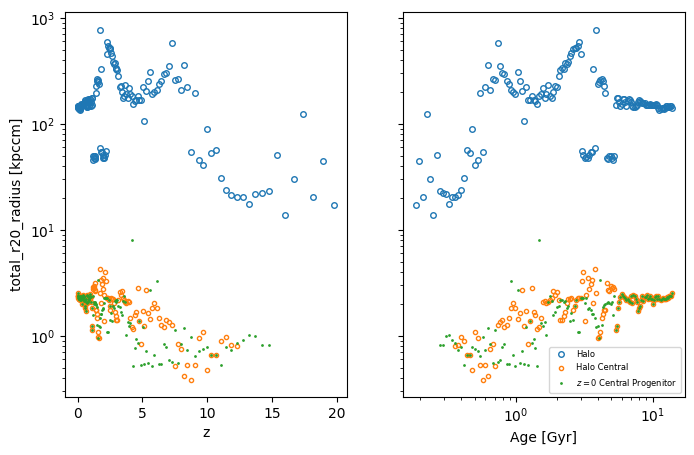

total_r80_radius
[]
1.4764371056713275
[]
[]
0.07515930289167067
[]
[]
0.10789208550515811
[]


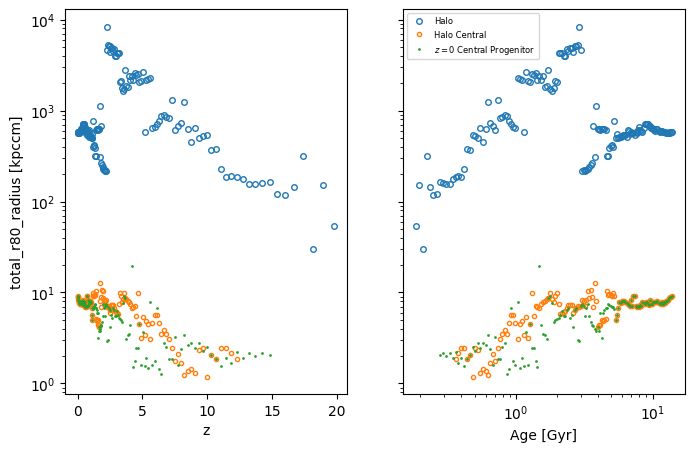

mass_weighted_metallicity


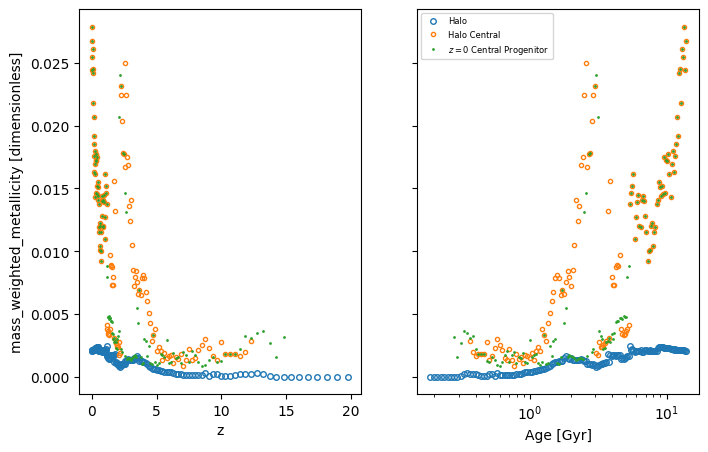

sfr_weighted_metallicity


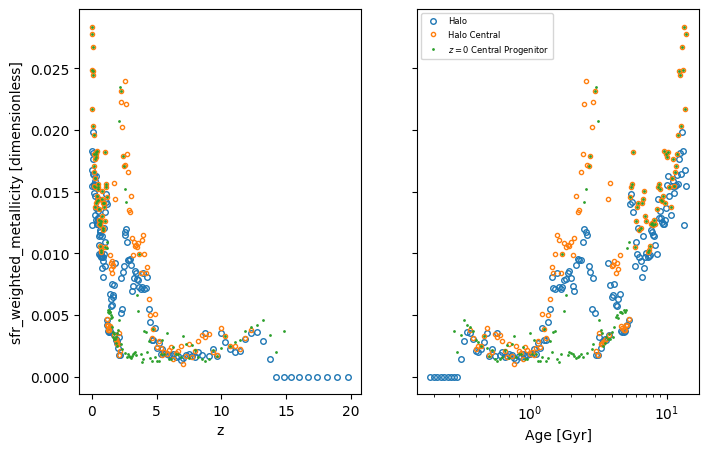

stellar_metallicity


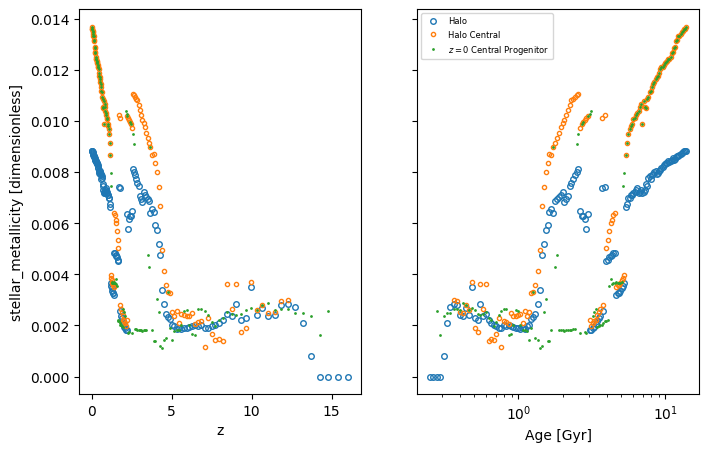

mass_weighted_cgm_metallicity
mass_weighted_cgm_metallicity_central does not exist
mass_weighted_cgm_metallicity_central_tracked does not exist


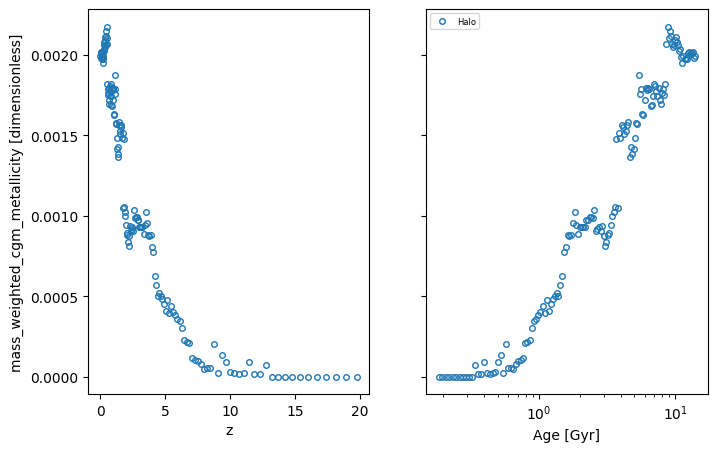

temp_weighted_cgm_metallicity
[]
nan
[]
temp_weighted_cgm_metallicity_central does not exist
temp_weighted_cgm_metallicity_central_tracked does not exist


ValueError: Data has no positive values, and therefore cannot be log-scaled.

<Figure size 800x500 with 2 Axes>

gas_velocity_dispersion


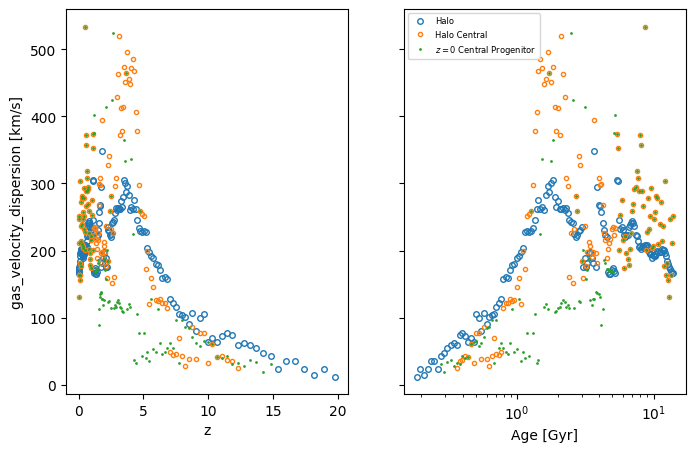

stellar_velocity_dispersion


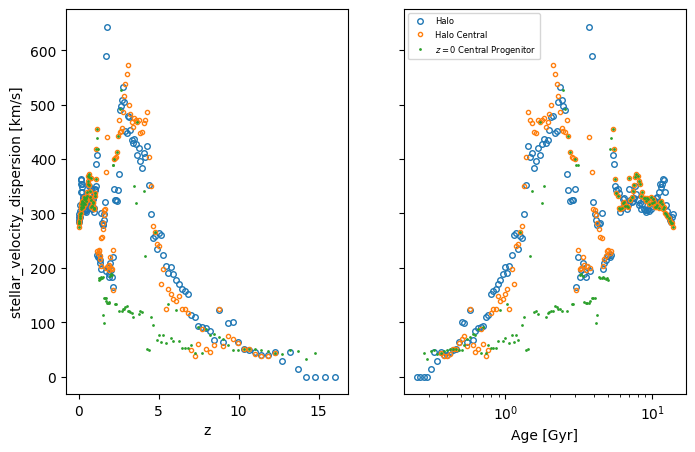

dm_velocity_dispersion
dm_velocity_dispersion_central does not exist
dm_velocity_dispersion_central_tracked does not exist


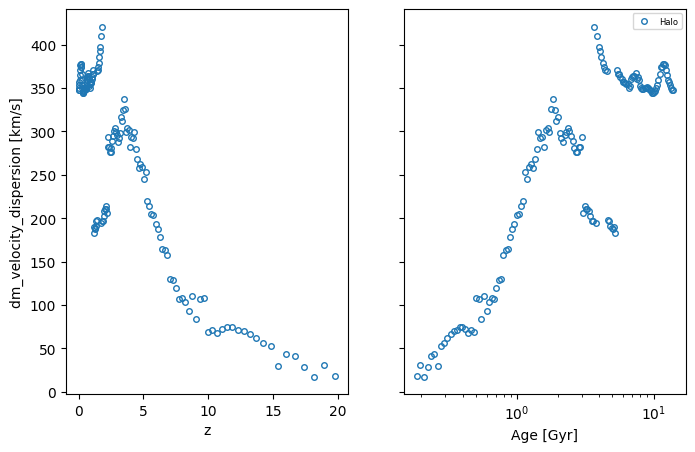

baryon_velocity_dispersion


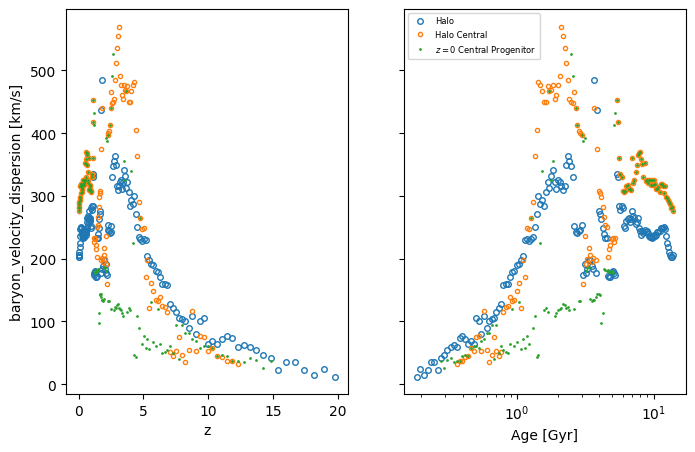

total_velocity_dispersion


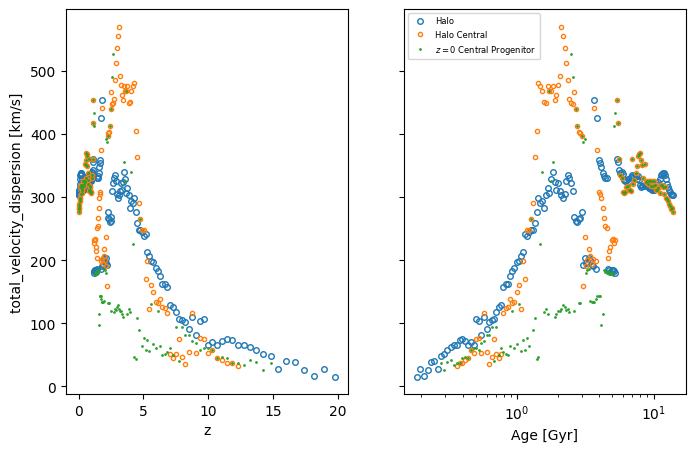

mass_weighted_stellar_age
[5 6 7 8]
nan
[nan nan nan nan]
[]
-1.7388825357801714
[]
[]
-2.182684528682954
[]


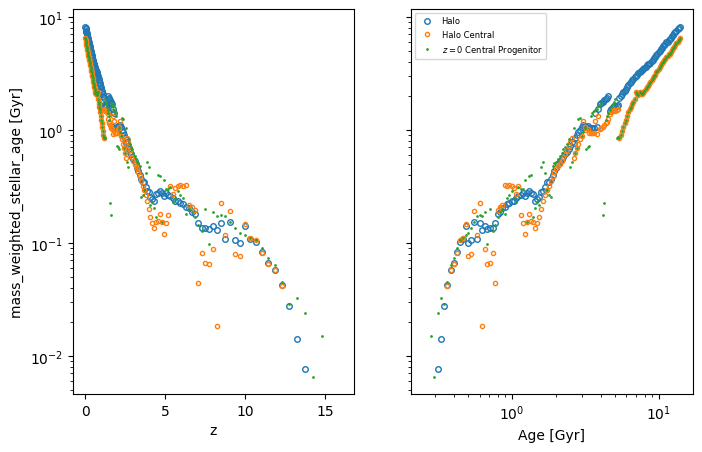

metal_weighted_stellar_age
[5 6 7 8]
nan
[nan nan nan nan]
[]
-1.8240650192977887
[]
[]
-2.4713723909917107
[]


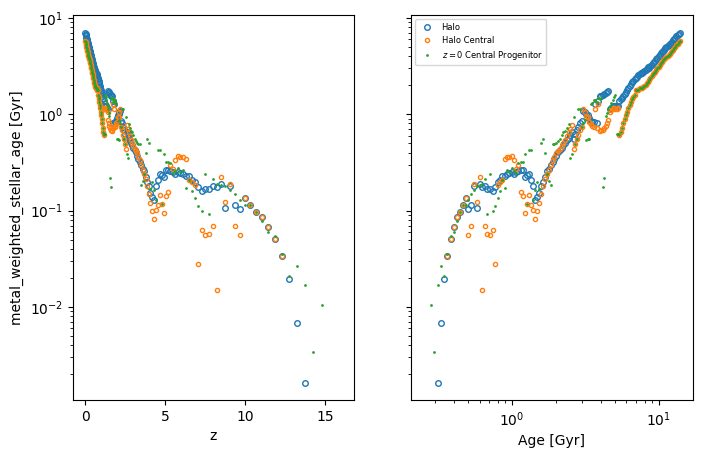

mass_weighted_temperature
[]
nan
[]
[]
nan
[]
[]
nan
[]


ValueError: Data has no positive values, and therefore cannot be log-scaled.

<Figure size 800x500 with 2 Axes>

mass_weighted_cgm_temperature
[]
nan
[]
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138]
[0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1
 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0

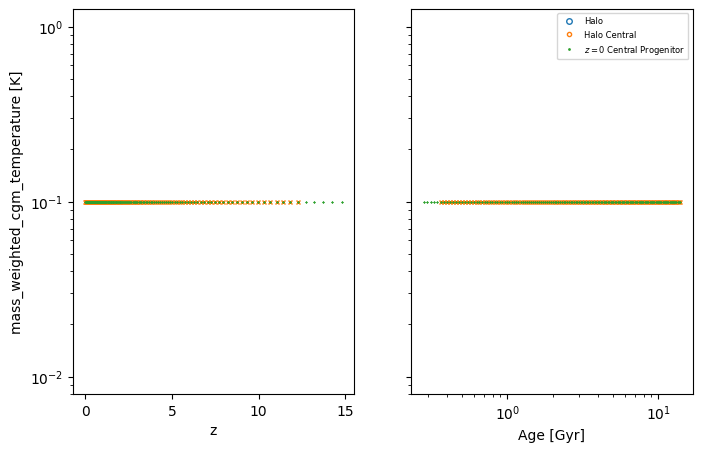

local_mass_density_300kpccm
[]
0.2035832506132111
[]
local_mass_density_300kpccm_central does not exist
local_mass_density_300kpccm_central_tracked does not exist


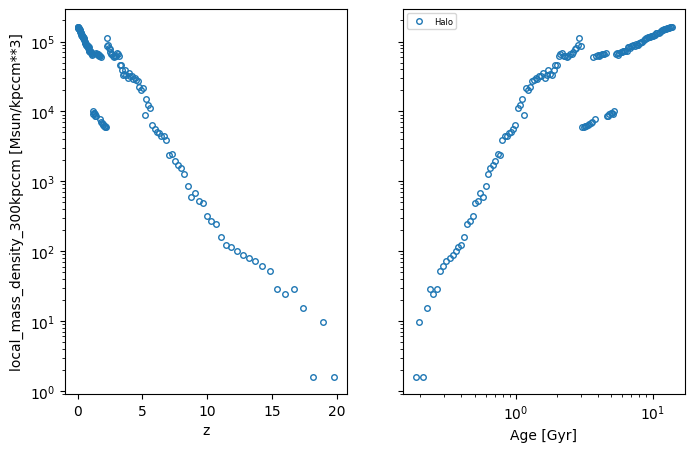

local_number_density_300kpccm
[]
-8.053452373461422
[]
local_number_density_300kpccm_central does not exist
local_number_density_300kpccm_central_tracked does not exist


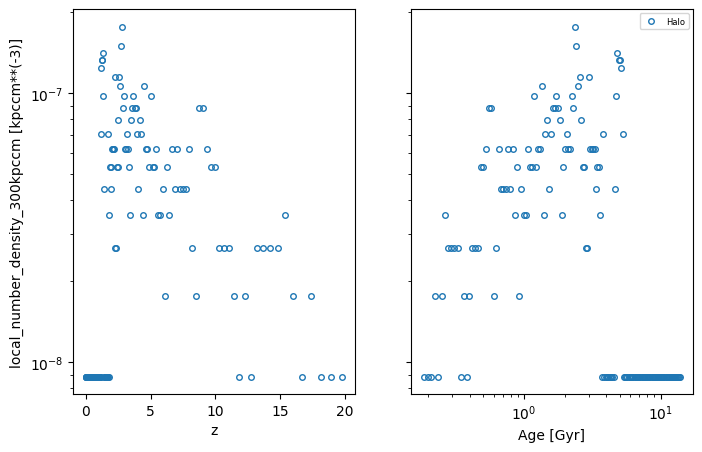

local_mass_density_1000kpccm
[]
-1.3650529852278015
[]
local_mass_density_1000kpccm_central does not exist
local_mass_density_1000kpccm_central_tracked does not exist


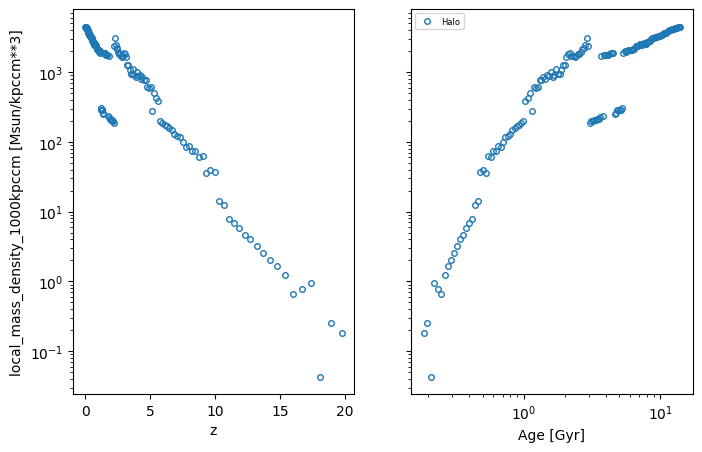

local_number_density_1000kpccm
[]
-9.622088609302434
[]
local_number_density_1000kpccm_central does not exist
local_number_density_1000kpccm_central_tracked does not exist


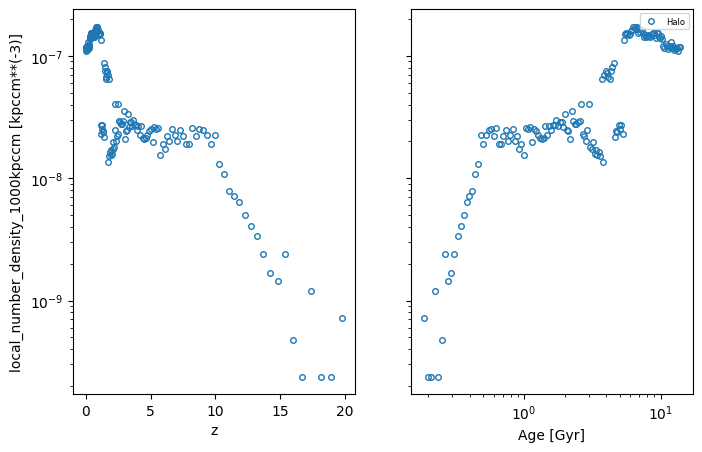

local_mass_density_3000kpccm
[]
-2.1706954346050935
[]
local_mass_density_3000kpccm_central does not exist
local_mass_density_3000kpccm_central_tracked does not exist


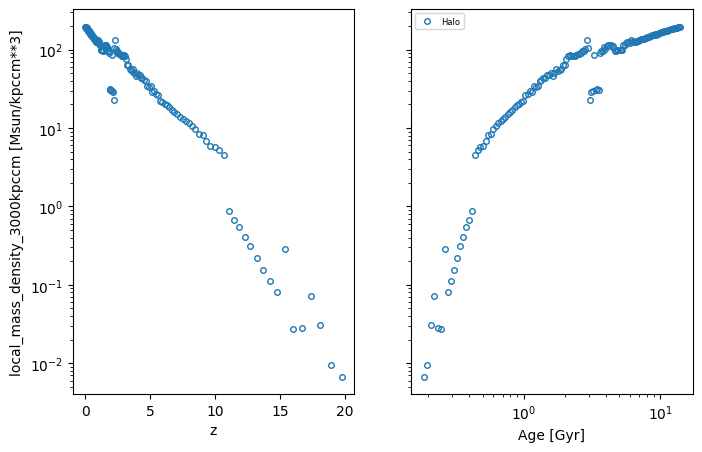

local_number_density_3000kpccm
[]
-11.053452373461422
[]
local_number_density_3000kpccm_central does not exist
local_number_density_3000kpccm_central_tracked does not exist


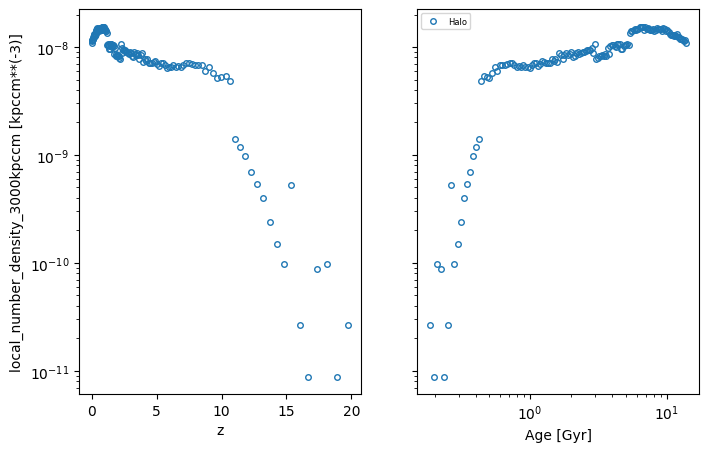

gas_30kpc_mass
gas_30kpc_mass_halo does not exist
[]
8.518409312973494
[]
[]
8.333051349025757
[]


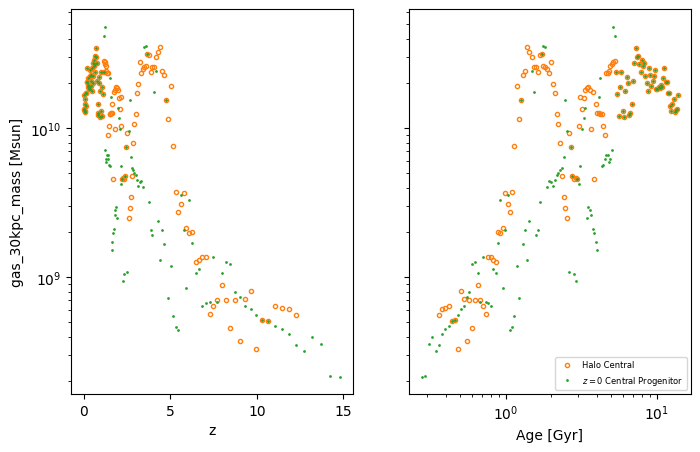

bh_mass
bh_mass_halo does not exist
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]
4.171219332280684
[1483.26699219 1483.26699219 1483.26699219 1483.26699219 1483.26699219
 1483.26699219 1483.26699219 1483.26699219 1483.26699219 1483.26699219
 1483.26699219 1483.26699219 1483.26699219 1483.26699219 1483.26699219
 1483.26699219 1483.26699219 1483.26699219 1483.26699219 1483.26699219
 1483.26699219 1483.26699219 1483.26699219]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 28 29 31 32 33 34 35 37 38 39 40 43 44]
4.175148586758602
[1496.74765625 1496.74765625 1496.74765625 1496.74765625 1496.74765625
 1496.74765625 1496.74765625 1496.74765625 1496.74765625 1496.74765625
 1496.74765625 1496.74765625 1496.74765625 1496.74765625 1496.74765625
 1496.74765625 1496.74765625 1496.74765625 1496.74765625 1496.74765625
 1496.74765625 1496.74765625 1496.74765625 1496.74765625 1496.74765625
 1496.74765625 1496.74765625 1496.74765625 1496.747

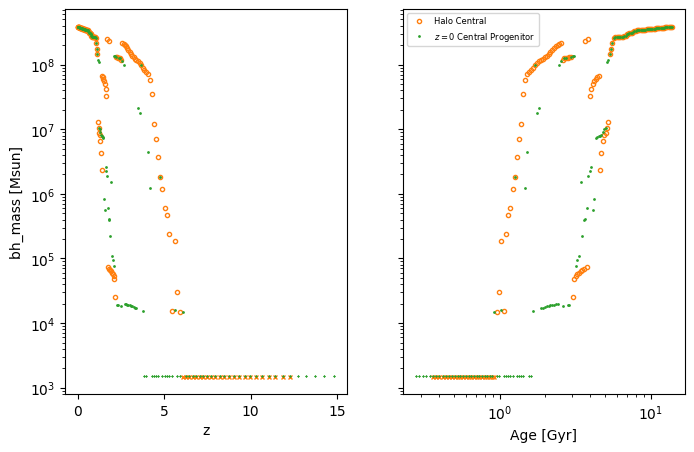

bh_30kpc_mass
bh_30kpc_mass_halo does not exist
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22]
4.171219332280684
[1483.26699219 1483.26699219 1483.26699219 1483.26699219 1483.26699219
 1483.26699219 1483.26699219 1483.26699219 1483.26699219 1483.26699219
 1483.26699219 1483.26699219 1483.26699219 1483.26699219 1483.26699219
 1483.26699219 1483.26699219 1483.26699219 1483.26699219 1483.26699219
 1483.26699219 1483.26699219 1483.26699219]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 28 31 32 33 34 35 37 38 39 40 43 44]
4.175148586758602
[1496.74765625 1496.74765625 1496.74765625 1496.74765625 1496.74765625
 1496.74765625 1496.74765625 1496.74765625 1496.74765625 1496.74765625
 1496.74765625 1496.74765625 1496.74765625 1496.74765625 1496.74765625
 1496.74765625 1496.74765625 1496.74765625 1496.74765625 1496.74765625
 1496.74765625 1496.74765625 1496.74765625 1496.74765625 1496.74765625
 1496.74765625 1496.74765625 1496.74765625

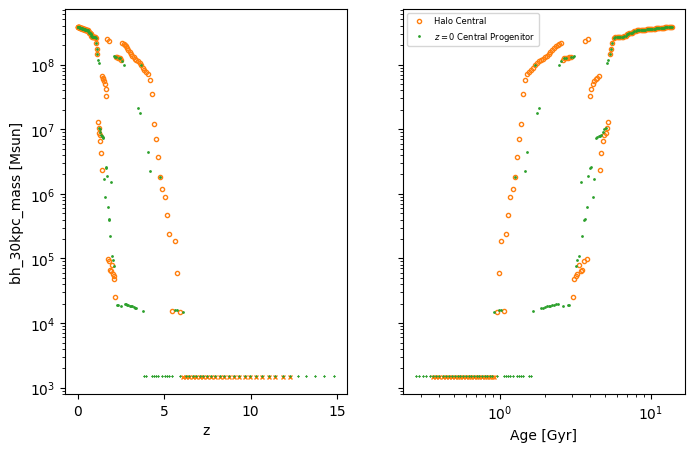

HI_mass
HI_mass_halo does not exist
[]
8.982316484698012
[]
[]
8.098939730231136
[]


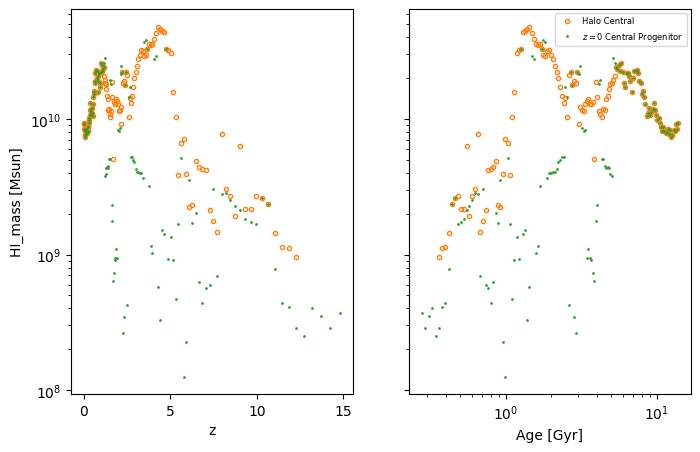

HI_30kpc_mass
HI_30kpc_mass_halo does not exist
[]
8.190384202648069
[]
[]
7.931236902988414
[]


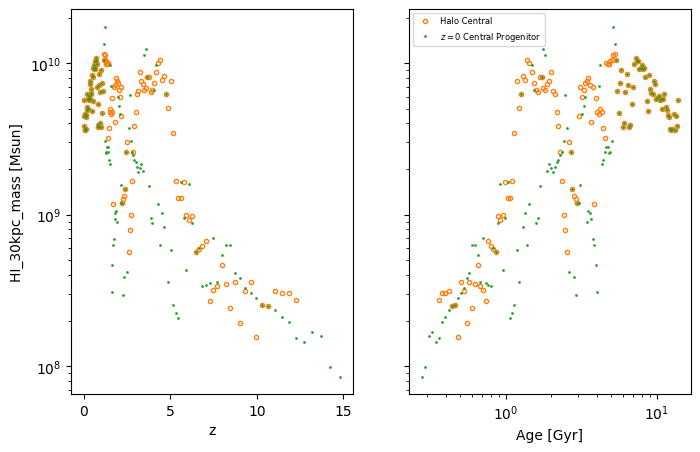

H2_30kpc_mass
H2_30kpc_mass_halo does not exist
[]
7.386588843140814
[]
[]
7.089715817489264
[]


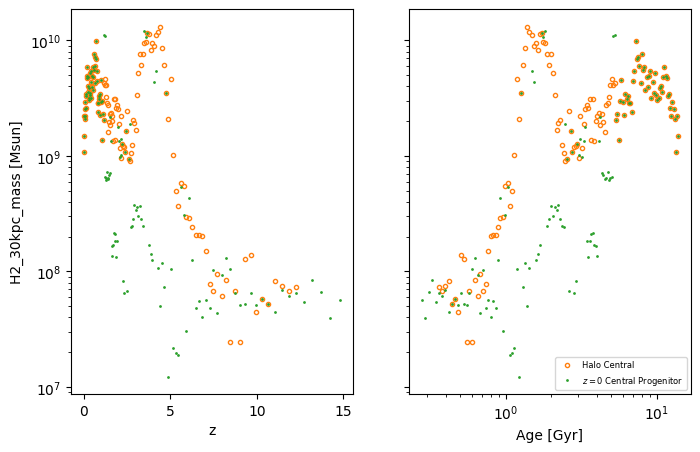

In [85]:
comparison_types = ['halo', 'central', 'central_tracked']
comparison_names = ['Halo', 'Halo Central', r'$z=0$ Central Progenitor']
comparison_colors = ['C0', 'C1', 'C2']
comparison_sizes = [4, 3, 1]
for prop_name in prop_comparison_names:
    print(prop_name)
    if prop_name in ['z', 'age', 'snap_num']: continue

    fig, ax = plt.subplots(num=1, figsize=(8,5),
                           nrows=1, ncols=2, sharey='row')
    
    for comparison_type, comparison_name, mec, ms in zip(comparison_types, comparison_names, comparison_colors, comparison_sizes):
        x1_name = f'z_{comparison_type}'
        x1 = prop_dict[x1_name]

        x2_name = f'age_{comparison_type}'
        x2 = prop_dict[x2_name]
        
        y_name = f'{prop_name}_{comparison_type}'
        try:
            y = prop_dict[y_name]
        except:
            print(f'{y_name} does not exist')
            continue

        ax[0].plot(x1, y, marker='o', ms=ms, mfc='none', mec=mec, ls='', label=comparison_name)
        ax[1].plot(x2, y, marker='o', ms=ms, mfc='none', mec=mec, ls='', label=comparison_name)

        ## Plot all 0 values as 1 dex below minimum nonzero value
        if prop_name in log_base_props:
            zero_value_indexes = np.where(np.array(y)==0)[0]
            nonzero_value_indexes = np.where(np.array(y)!=0)[0]
            print(zero_value_indexes)
            try:
                print(min(np.log10(np.array(y)[nonzero_value_indexes])))
                zero_value_for_plotting = np.array([10**(min(np.log10(np.array(y)[nonzero_value_indexes]))-1)] * len(zero_value_indexes))
            except:
                zero_value_for_plotting = np.array([10**(-1)] * len(zero_value_indexes))
            print(zero_value_for_plotting)
    
            ax[0].plot(np.array(x1)[zero_value_indexes], zero_value_for_plotting, 
                       marker='x', ms=ms, mec=mec, ls='')
            ax[1].plot(np.array(x2)[zero_value_indexes], zero_value_for_plotting, 
                       marker='x', ms=ms, mec=mec, ls='')
    
    ax[1].set_xscale('log')

    ax[0].set_xlabel('z')
    ax[1].set_xlabel('Age [Gyr]')

    try:
         ax[0].set_ylabel(f'{prop_name} [{y[0].units}]')
    except:
        ax[0].set_ylabel(f'{prop_name}')
    
    if prop_name in log_base_props:
        ax[0].set_yscale('log')
        ax[1].set_yscale('log')    
    
    # ax[1].legend(loc='upper right', fontsize=8)
    ax[1].legend(fontsize=6)
    plt.show()

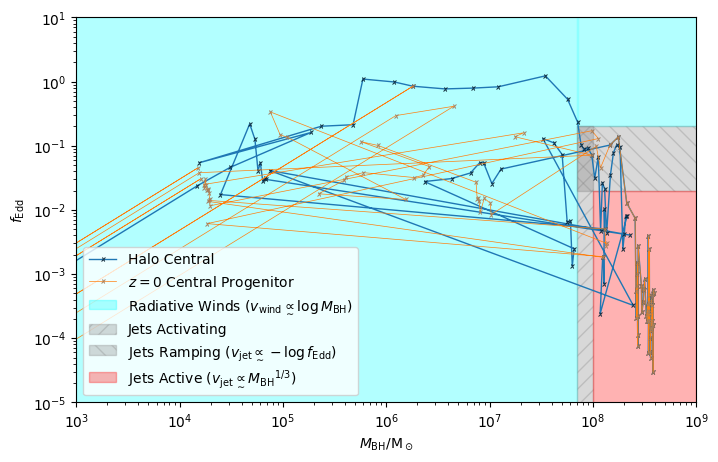

In [89]:
fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')

fedd_to_plot = copy.deepcopy(prop_dict['bh_fedd_central'])
fedd_to_plot[fedd_to_plot==0] = 1e-10
# fedd_to_plot[fedd_to_plot==-np.inf] = 1e-8

ax.plot(prop_dict['bh_mass_central'], fedd_to_plot, marker='$x$', ms=3, mew=0.25, mec='black', lw=1,
        label='Halo Central')#, ls='')


fedd_to_plot = copy.deepcopy(prop_dict['bh_fedd_central_tracked'])
fedd_to_plot[fedd_to_plot==0] = 1e-10
# fedd_to_plot[fedd_to_plot==-np.inf] = 1e-8

ax.plot(prop_dict['bh_mass_central_tracked'], fedd_to_plot, marker='$x$', ms=3, mew=0.25, mec='grey', lw=0.5,
        label=r'$z=0$ Central Progenitor')#, ls='')


# ax.axhline(y=0.2, color='grey', ls='-')
# ax.axhline(y=0.02, color='grey', ls='--')

ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=7e7, color='cyan', alpha=0.3,
                 label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')
ax.fill_betweenx(y=[2e-1,1e1], x1=7.2125e7, x2=1e9, color='cyan', alpha=0.3)

ax.fill_betweenx(y=[0,2e-1], x1=7e7, x2=1e8, color='grey', alpha=0.3, hatch='//', label='Jets Activating')
ax.fill_betweenx(y=[2e-2,2e-1], x1=7e7, x2=1e9, color='grey', alpha=0.3, hatch='\\\\',
                 label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=1e9, color='red', alpha=0.3,
                 label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

# ax.text(x=1e8, y=1e-3, s='Jets Active')

ax.set_xlabel(r'$M_{\mathrm{BH}}/\mathrm{M_\odot}$')
ax.set_ylabel(r'$f_{\mathrm{Edd}}$')

ax.set_xscale('log')
ax.set_yscale('log')

# ax.set_ylim(1e-9,1e1)
ax.set_ylim(1e-5,1e1)

# ax.set_xlim(1e4, 1e9)
# ax.set_xlim(-0.05e9, 1e9)
ax.set_xlim(1e3, 1e9)

ax.legend()

plt.show()

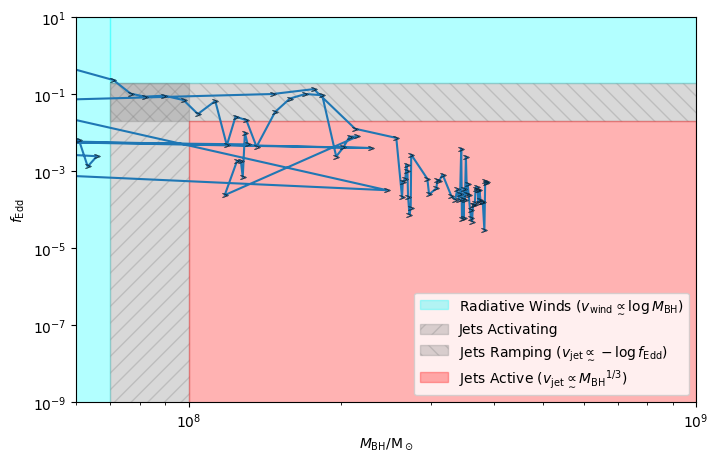

In [90]:
fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')

fedd_to_plot = copy.deepcopy(prop_dict['bh_fedd_central'])
fedd_to_plot[fedd_to_plot==0] = 1e-10
# fedd_to_plot[fedd_to_plot==-np.inf] = 1e-8

ax.plot(prop_dict['bh_mass_central'], fedd_to_plot, marker='$>$', ms=4, mew=0.25, mec='black')#, ls='')

# ax.axhline(y=0.2, color='grey', ls='-')
# ax.axhline(y=0.02, color='grey', ls='--')

ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=7e7, color='cyan', alpha=0.3,
                 label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')
ax.fill_betweenx(y=[2e-1,1e1], x1=7e7, x2=1e9, color='cyan', alpha=0.3)

ax.fill_betweenx(y=[0,2e-1], x1=7e7, x2=1e8, color='grey', alpha=0.3, hatch='//', label='Jets Activating')
ax.fill_betweenx(y=[2e-2,2e-1], x1=7e7, x2=1e9, color='grey', alpha=0.3, hatch='\\\\',
                 label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=1e9, color='red', alpha=0.3,
                 label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

# ax.text(x=1e8, y=1e-3, s='Jets Active')

ax.set_xlabel(r'$M_{\mathrm{BH}}/\mathrm{M_\odot}$')
ax.set_ylabel(r'$f_{\mathrm{Edd}}$')

ax.set_xscale('log')
ax.set_yscale('log')

# ax.set_ylim(1e-9,1e1)
ax.set_ylim(1e-9,1e1)

# ax.set_xlim(1e4, 1e9)
# ax.set_xlim(-0.05e9, 1e9)
ax.set_xlim(6e7, 1e9)

ax.legend()

plt.show()

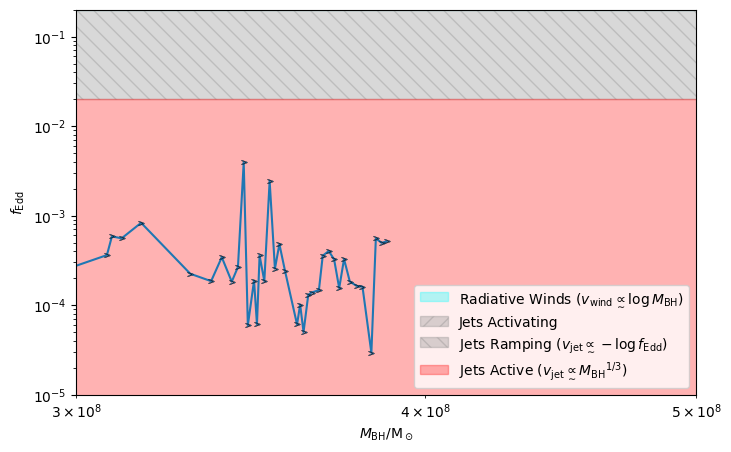

In [91]:
fig, ax = plt.subplots(num=1, figsize=(8,5),
                       nrows=1, ncols=1, sharey='row')

fedd_to_plot = copy.deepcopy(prop_dict['bh_fedd_central'])
fedd_to_plot[fedd_to_plot==0] = 1e-10
# fedd_to_plot[fedd_to_plot==-np.inf] = 1e-8

ax.plot(prop_dict['bh_mass_central'], fedd_to_plot, marker='$>$', ms=4, mew=0.25, mec='black')#, ls='')

# ax.axhline(y=0.2, color='grey', ls='-')
# ax.axhline(y=0.02, color='grey', ls='--')

ax.fill_betweenx(y=[0,1e1], x1=1e3, x2=7e7, color='cyan', alpha=0.3,
                 label=r'Radiative Winds ($v_{\mathrm{wind}} \underset{\sim}{\propto} \log M_{\mathrm{BH}}$)')
ax.fill_betweenx(y=[2e-1,1e1], x1=7e7, x2=1e9, color='cyan', alpha=0.3)

ax.fill_betweenx(y=[0,2e-1], x1=7e7, x2=1e8, color='grey', alpha=0.3, hatch='//', label='Jets Activating')
ax.fill_betweenx(y=[2e-2,2e-1], x1=7e7, x2=1e9, color='grey', alpha=0.3, hatch='\\\\',
                 label=r'Jets Ramping ($v_{\mathrm{jet}} \underset{\sim}{\propto} -\log f_{\mathrm{Edd}}$)')

ax.fill_betweenx(y=[0,2e-2], x1=1e8, x2=1e9, color='red', alpha=0.3,
                 label=r'Jets Active ($v_{\mathrm{jet}} \underset{\sim}{\propto} {M_{\mathrm{BH}}}^{1/3}$)')

# ax.text(x=1e8, y=1e-3, s='Jets Active')

ax.set_xlabel(r'$M_{\mathrm{BH}}/\mathrm{M_\odot}$')
ax.set_ylabel(r'$f_{\mathrm{Edd}}$')

ax.set_xscale('log')
ax.set_yscale('log')

# ax.set_ylim(1e-9,1e1)
ax.set_ylim(1e-5,2e-1)

# ax.set_xlim(1e4, 1e9)
# ax.set_xlim(-0.05e9, 1e9)
ax.set_xlim(3e8, 5e8)

ax.legend()

plt.show()